#### Importing libraries

In [311]:
import pandas as pd # for data manipulation
import glob # for reading files in a random order
import matplotlib.pyplot as plt #for plotting
import matplotlib.dates as mdates
import talipp as ta
from talipp.indicators import ADX
import talib as tb
import math as mth
import numpy as np
# importing the random module
import random
import lightgbm as lgb
import sklearn.metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
import optuna
import pickle



##### Accessing the databases

In [312]:
#Getting a CSV files list from a folder
file_path1 = './TrainingDatasets/AAPL.csv'

#Reading all CSV files in a list
appleDb = pd.read_csv(file_path1)
#print(appleDb.to_string()) - to view the original dataframe

# Convert Date column to datetime object
appleDb['Date'] = pd.to_datetime(appleDb['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

# Filter rows based on condition - starting from the year 2008
appleDb = appleDb[pd.to_datetime(appleDb['Date']).dt.year >= 2008]

print(appleDb.to_string())



                           Date        Open        High         Low       Close      Volume  Dividends  Stock Splits
6826  2008-01-02 05:00:00+00:00    6.057227    6.087320    5.852958    5.922567  1079178800   0.000000           0.0
6827  2008-01-03 05:00:00+00:00    5.939894    6.000080    5.857214    5.925303   842066400   0.000000           0.0
6828  2008-01-04 05:00:00+00:00    5.819521    5.866637    5.437734    5.472994  1455832000   0.000000           0.0
6829  2008-01-07 05:00:00+00:00    5.509470    5.580904    5.174495    5.399737  2072193200   0.000000           0.0
6830  2008-01-08 05:00:00+00:00    5.475730    5.546252    5.191822    5.205501  1523816000   0.000000           0.0
6831  2008-01-09 05:00:00+00:00    5.207020    5.456276    5.115829    5.453237  1813882000   0.000000           0.0
6832  2008-01-10 05:00:00+00:00    5.397914    5.501872    5.331953    5.411289  1482975200   0.000000           0.0
6833  2008-01-11 05:00:00+00:00    5.349886    5.406121    5.167

In [313]:
#Getting a CSV files list from a folder
file_path2 = './TrainingDatasets/AAL.csv'

#Reading all CSV files in a list
americanAirlineDb = pd.read_csv(file_path2)
#print(americanAirlineDb.to_string())

# Convert Date column to datetime object
americanAirlineDb['Date'] = pd.to_datetime(americanAirlineDb['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

# Filter rows based on condition - starting from the year 2010
americanAirlineDb = americanAirlineDb[pd.to_datetime(americanAirlineDb['Date']).dt.year >= 2010]

print(americanAirlineDb.to_string())

                          Date       Open       High        Low      Close     Volume  Dividends  Stock Splits
1074 2010-01-04 05:00:00+00:00   4.562868   4.657142   4.393175   4.496876    9837300        0.0           0.0
1075 2010-01-05 05:00:00+00:00   4.515733   5.062523   4.440314   5.005959   25212000        0.0           0.0
1076 2010-01-06 05:00:00+00:00   4.892829   5.071950   4.713708   4.798555   16597900        0.0           0.0
1077 2010-01-07 05:00:00+00:00   4.770271   5.119086   4.760844   4.939965   14033400        0.0           0.0
1078 2010-01-08 05:00:00+00:00   4.968248   5.119086   4.770272   4.845691   12760000        0.0           0.0
1079 2010-01-11 05:00:00+00:00   4.836264   4.930538   4.657143   4.751417   10952900        0.0           0.0
1080 2010-01-12 05:00:00+00:00   4.770273   4.855119   4.675998   4.789127    7870300        0.0           0.0
1081 2010-01-13 05:00:00+00:00   4.826836   5.185077   4.732562   5.166223   16400500        0.0           0.0
1

In [314]:
#Getting a CSV files list from a folder
file_path3 = './TrainingDatasets/APA.csv'

#Reading all CSV files in a list
apacheCorpDb = pd.read_csv(file_path3)
#print(apacheCorpDb.to_string())

# Convert Date column to datetime object
apacheCorpDb['Date'] = pd.to_datetime(apacheCorpDb['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

# Filter rows based on condition - starting from the year 2010
apacheCorpDb = apacheCorpDb[pd.to_datetime(apacheCorpDb['Date']).dt.year >= 2010]

print(apacheCorpDb.to_string())

                           Date        Open        High         Low       Close    Volume  Dividends  Stock Splits
7731  2010-01-04 05:00:00+00:00   85.830924   87.074136   85.495580   86.591576   2364900      0.000           0.0
7732  2010-01-05 05:00:00+00:00   86.681527   87.646654   86.076273   87.613937   2464500      0.000           0.0
7733  2010-01-06 05:00:00+00:00   87.335874   89.086189   86.836951   88.988045   2894500      0.000           0.0
7734  2010-01-07 05:00:00+00:00   88.595451   88.595451   86.845135   87.638504   2412200      0.000           0.0
7735  2010-01-08 05:00:00+00:00   86.787898   87.352254   85.790053   87.180489   4106000      0.000           0.0
7736  2010-01-11 05:00:00+00:00   87.883855   88.521826   86.591570   87.442192   2352600      0.000           0.0
7737  2010-01-12 05:00:00+00:00   86.199000   87.041441   85.683722   86.117210   3003100      0.000           0.0
7738  2010-01-13 05:00:00+00:00   85.487415   87.597611   85.192975   87.368599 

The dataset contains the following stock prices for 
- AAPL which stands for the Apple Inc. company. 
- AAL which stands for the American Airlines Group Inc. for Major Airlines
- APA which stands for the Apache Corporation for independent oil and gas

This dataset contains the following information:

Date: This is the date that the stock market was open (i.e. the day that the stock was traded). It's usually listed in a format like "MM/DD/YYYY" (month/day/year).

Open: This is the price at which the stock opened for trading on that particular day. It's the price that the first trade was made at.

High: This is the highest price that the stock reached during trading on that day.

Low: This is the lowest price that the stock reached during trading on that day.

Close: This is the price at which the stock closed for trading on that particular day. It's the price that the last trade was made at.

Volume: This is the total number of shares that were traded on that particular day. It's a measure of how active the market was for that stock on that day.

Dividends: These are payments that companies sometimes make to their shareholders as a way of distributing profits. They're usually paid out on a regular basis (e.g. quarterly) and are typically a percentage of the company's earnings.

Stock Splits: This is when a company decides to divide its existing shares into multiple shares. For example, if a company had 1 million shares outstanding and decided to do a 2-for-1 stock split, there would then be 2 million shares outstanding, but each share would be worth half as much as before. Companies often do stock splits to make their shares more affordable to individual investors.

#### Converting the prices into logs representation

In [315]:
#checking how all the columns are listed in the dataframe
appleDb.columns
americanAirlineDb.columns
apacheCorpDb.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits'],
      dtype='object')

In [316]:
#checking how all the rows are listed in the dataframe
appleDb.index
americanAirlineDb.index
apacheCorpDb.index


Int64Index([ 7731,  7732,  7733,  7734,  7735,  7736,  7737,  7738,  7739,
             7740,
            ...
            11064, 11065, 11066, 11067, 11068, 11069, 11070, 11071, 11072,
            11073],
           dtype='int64', length=3343)

In [317]:
print(appleDb.to_string())


def changeValuesIntoLogs(df):
    df['Open'] = df['Open'].apply(lambda x: mth.log(x))
    df['High'] = df['High'].apply(lambda x: mth.log(x))
    df['Low'] = df['Low'].apply(lambda x: mth.log(x))
    df['Close'] = df['Close'].apply(lambda x: mth.log(x))
    return df

appleDb = changeValuesIntoLogs(appleDb)

                           Date        Open        High         Low       Close      Volume  Dividends  Stock Splits
6826  2008-01-02 05:00:00+00:00    6.057227    6.087320    5.852958    5.922567  1079178800   0.000000           0.0
6827  2008-01-03 05:00:00+00:00    5.939894    6.000080    5.857214    5.925303   842066400   0.000000           0.0
6828  2008-01-04 05:00:00+00:00    5.819521    5.866637    5.437734    5.472994  1455832000   0.000000           0.0
6829  2008-01-07 05:00:00+00:00    5.509470    5.580904    5.174495    5.399737  2072193200   0.000000           0.0
6830  2008-01-08 05:00:00+00:00    5.475730    5.546252    5.191822    5.205501  1523816000   0.000000           0.0
6831  2008-01-09 05:00:00+00:00    5.207020    5.456276    5.115829    5.453237  1813882000   0.000000           0.0
6832  2008-01-10 05:00:00+00:00    5.397914    5.501872    5.331953    5.411289  1482975200   0.000000           0.0
6833  2008-01-11 05:00:00+00:00    5.349886    5.406121    5.167

In [318]:
print("After converting with logs")


After converting with logs


In [319]:
print(appleDb.to_string())

                           Date      Open      High       Low     Close      Volume  Dividends  Stock Splits
6826  2008-01-02 05:00:00+00:00  1.801252  1.806208  1.766947  1.778770  1079178800   0.000000           0.0
6827  2008-01-03 05:00:00+00:00  1.781691  1.791773  1.767674  1.779232   842066400   0.000000           0.0
6828  2008-01-04 05:00:00+00:00  1.761218  1.769281  1.693362  1.699826  1455832000   0.000000           0.0
6829  2008-01-07 05:00:00+00:00  1.706469  1.719351  1.643742  1.686350  2072193200   0.000000           0.0
6830  2008-01-08 05:00:00+00:00  1.700326  1.713122  1.647085  1.649716  1523816000   0.000000           0.0
6831  2008-01-09 05:00:00+00:00  1.650008  1.696767  1.632339  1.696209  1813882000   0.000000           0.0
6832  2008-01-10 05:00:00+00:00  1.686013  1.705088  1.673718  1.688487  1482975200   0.000000           0.0
6833  2008-01-11 05:00:00+00:00  1.677075  1.687532  1.642390  1.658089  1232285600   0.000000           0.0
6834  2008-01-14 05

#### Graphs Representations

Open Graphs - The opening price of the stock on that day. This helps to identify trends in the stock's price and evaluate whether the stock is undervalued or overvalued.

In [320]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the open prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Open'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Open'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Open'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Open', va='center', rotation='vertical')

# # display the plot
# plt.show()

High Graphs - The highest price the stock reached during the day. This helps to identify how volatile the stock is and how much potential upside there is.

In [321]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the high prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['High'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['High'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['High'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'High', va='center', rotation='vertical')

# # display the plot
# plt.show()

Low Graphs -  The lowest price the stock reached during the day. This helps you evaluate how risky the stock is and how much potential downside there is.

In [322]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the low prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Low'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Low'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Low'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Low', va='center', rotation='vertical')

# # display the plot
# plt.show()

Closing Graphs - The closing price of the stock on that day. This can helps to evaluate how the stock performed over the course of the day and whether it ended up in positive or negative territory.

In [323]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the close prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Close'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Close'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Close'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Closing', va='center', rotation='vertical')

# # display the plot
# plt.show()

Volume Graphs - The total number of shares of the stock that were traded on that day. This helps to evaluate how active the market is for the stock and how much interest there is from other investors.

In [324]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the close prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Volume'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Volume'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Volume'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Volume', va='center', rotation='vertical')

# # display the plot
# plt.show()

#### Adding extra features into the dataframe to help the AI stock advisor to make better predictions. 

In [325]:
def priceChange(df):
    df['Price Change'] = df['Close'] - df['Close'].shift(1) #taking the closing price of the current day and subtracting it from the closing price of the previous day
    return df


By adding the Price Change in the data frame it will illustrate the percentage change between the previous closing price (of the previous day) and closing price of that day for each day. This can provide insight into the daily market sentiment of the stock. The reason for this is that the difference between the previous closing price and the closing price for a given day provides a good indication of the direction and magnitude of price movements for that day.

In [326]:
def priceVolatility(df):
    df['Price Volatility'] = df['High'] - df['Low'] #taking the high price of the day and subtracting it from the low price of the day
    return df



By adding the Price Volatility to the dataframe it refers to how much the price of a stock moves up and down over a certain period. The more a stock's price fluctuates (changes frequently), the higher its volatility. 

Note that the Volatility means the amount of uncertainty or risk related to the size of changes in a security's value

Volatility can be caused by various factors, such as changes in market conditions, news events, or investor sentiment. High volatility can indicate that the stock is more risky or uncertain, while low volatility can suggest that the stock is more stable and predictable. 

To work out the volatility of a stock taking the difference between the high and low prices of a stock. As stated before, the higher the difference, the more volatility. 

In [327]:
#calculating the SMA for the closing price of the stocks

def SMA(df,windowValue):
    df['SMA'] = tb.SMA(df['Close'], windowValue)
    return df



In [328]:
def TEMA(df,windowValue):
    df['EMA'] = tb.EMA(df['Close'], windowValue)
    return df






In [329]:
# # Plot SMA vs Closing Price
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,8))
# ax1.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax1.plot(appleDb['Date'],appleDb['SMA'], label='SMA')
# ax1.set_title('SMA vs Closing Price')
# ax1.legend()

# # Plot TEMA vs Closing Price
# ax2.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax2.plot(appleDb['Date'],appleDb['TEMA'], label='TEMA')
# ax2.set_title('TEMA vs Closing Price')
# ax2.legend()

# plt.tight_layout()
# plt.show()

Moving Averages: 


Moving averages are a trend-following indicator that smooths out price fluctuations over a given period of time. They can be used to identify trends and potential reversal points in the stock's price.

The Simple Moving Average (SMA) is useful as it is a way to calculate the average price of a stock over a specific period of time. For example, if you want to calculate the SMA over the last 10 days, you would add up the prices of the stock from each of the last 10 days and divide that sum by 10.

The SMA is called "moving" because as each new day's price is added to the calculation, the oldest price is dropped, and the SMA "moves" to reflect the new set of prices.

The SMA can help to smooth out the daily fluctuations in the stock price and give you a better idea of the overall trend. If the SMA is moving up, it means that the stock price is generally increasing, and if the SMA is moving down, it means that the stock price is generally decreasing.

the simple moving average (SMA) is a calculation that helps to identify trends in the price of a stock over a specific time period. It is calculated by adding up the prices over a certain number of days, and then dividing by the number of days.

For example, if you want to calculate the 20-day SMA, you would add up the closing prices for the past 20 days and then divide by 20.

 The closing price is used because it is the final price of a trading day and is considered to be the most important price point for that day. Using closing prices over a period of time helps to reduce the impact of short-term price fluctuations and provides a more accurate picture of the trend over that time period.

The TEMA moving average is a technical analysis indicator that uses a triple exponential moving average to reduce the lag of the standard exponential moving average (EMA).

To calculate the TEMA, you first calculate a single EMA for a given period, then you calculate a second EMA of that first EMA, and then a third EMA of that second EMA. The formula for the TEMA is:

TEMA = 3 * (EMA1 - EMA2) + EMA3

where EMA1 is the first EMA, EMA2 is the second EMA of the first EMA, and EMA3 is the third EMA of the second EMA.

In [330]:
def ADX(df):
    df['ADX5'] = tb.ADX(df['High'],df['Low'], df['Close'], timeperiod=5)
    df['ADX10'] = tb.ADX(df['High'],df['Low'], df['Close'], timeperiod=10)
    df['ADX20'] = tb.ADX(df['High'],df['Low'], df['Close'], timeperiod=20)
    return df


# Plot Various ADX values
# fig, (ax1, ax2,ax3) = plt.subplots(3, 1, figsize=(10,8))
# ax1.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax1.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax1.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax1.plot(appleDb['Date'],appleDb['ADX20'], label='ADX20')
# ax1.set_title('ADX20')
# ax1.legend()

# ax2.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax2.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax2.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax2.plot(appleDb['Date'],appleDb['ADX10'], label='ADX10')
# ax2.set_title('ADX10')
# ax2.legend()

# ax3.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax3.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax3.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax3.plot(appleDb['Date'],appleDb['ADX5'], label='ADX5')
# ax3.set_title('ADX5')
# ax3.legend()

# plt.tight_layout()
# plt.show()

Average Directional Movement Index(Momentum Indicator)

ADX can be used to help measure the overall strength of a trend. The ADX indicator is an average of expanding price range values. The Average Directional Movement Index (ADX) is a technical indicator that is based on the high, low, and close prices of a stock. The ADX helps to measure the strength of a trend, whether it's up or down, and its overall momentum.

The ADX is calculated using a formula that takes into account the price movements over a specific period of time. The indicator is based on the difference between the high and low prices and the current closing price. The ADX is usually plotted on a chart as a line that ranges between 0 and 100, with a higher value indicating a stronger trend.

To calculate the ADX for a stock, you would first need to determine the time period for which you want to calculate the indicator. This can vary depending on your strategy and the volatility of the stock you are analyzing. Once you have determined the time period, you can then use the high, low, and close prices for that period to calculate the ADX.

In [331]:
def ATR(df):
    df['ATR5'] = tb.ATR(df['High'], df['Low'], df['Close'], timeperiod=5)
    df['ATR10'] = tb.ATR(df['High'], df['Low'], df['Close'], timeperiod=10)
    return df

# ax1.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax1.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax1.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax1.plot(appleDb['Date'],appleDb['ATR'], label='ATR',color='red')
# ax1.set_title('ATR vs Closing Price vs High Price vs Low Price')
# ax1.legend()


Average True Range (ATR): ATR is a measure of volatility that takes into account the daily price range of the stock. It can help predict potential price movement and can be useful for setting stop-loss orders.

The Average True Range (ATR) is another technical indicator that is commonly used by traders and investors to measure the volatility of a stock. While the ADX measures the strength of a trend, the ATR measures the volatility of the stock price.

The ATR is calculated using the difference between the high and low prices of a stock over a specific period of time. It takes into account any gaps or limit moves that may have occurred during that time period. The ATR is usually expressed in points or as a percentage of the stock price.

One key difference between the ADX and ATR is that the ADX is used to measure the strength of a trend, while the ATR is used to measure the volatility of the stock price. Another difference is that the ADX is calculated using the high, low, and close prices, while the ATR is calculated using only the high and low prices.

Both the ADX and ATR are useful indicators that can help traders and investors make informed decisions about buying and selling stocks. The ADX can help to identify strong trends, while the ATR can help to identify potential changes in volatility.

In [332]:
def RSI(df):
    df['RSI'] = tb.RSI(df['Close'], timeperiod=10)
    return df


# appleDb[['RSI']].plot(figsize=(12,10),marker='o')
# plt.axhline(y=30, color='green', linestyle='-')
# plt.axhline(y=70, color='red', linestyle='-')
# x = np.arange(0, len(appleDb['RSI']),0.1)
# appleDb['RSI'].tail(10)
# plt.title("Apple RSI")

Relative Strength Index (RSI): an indicator used in finance to help investors and traders understand whether a stock is overbought or oversold. It is a measure of the stock's recent price changes, and is expressed as a number between 0 and 100.

The RSI works by comparing the average price gains of a stock to its average price losses over a specific time period (usually 14 days). If the average gains are higher than the average losses, the RSI will be higher, indicating that the stock is in an uptrend. If the average losses are higher than the average gains, the RSI will be lower, indicating that the stock is in a downtrend.

Traders use the RSI to identify potential buy and sell signals. When the RSI is above 70, it is considered overbought, which means that the stock may be due for a price correction. When the RSI is below 30, it is considered oversold, which means that the stock may be undervalued and due for a price increase.

In [333]:
# appleDb['Upper_BBand'], appleDb['Mid_BBand'], appleDb['Lower_BBand'] = tb.BBANDS(appleDb['Close'], timeperiod =20)
# appleDb[['Close','Mid_BBand','Upper_BBand','Lower_BBand']].plot(figsize= (12,10))
# plt.title("Apple Bollinger Bands")
# plt.show()

def bbands(df):
    df['Upper_BBand5'], df['Mid_BBand5'], df['Lower_BBand5'] = tb.BBANDS(df['Close'], timeperiod =5)
    df['Upper_BBand10'], df['Mid_BBand10'], df['Lower_BBand10'] = tb.BBANDS(df['Close'], timeperiod =10)
    return df

Bollinger Bands is a tool that helps traders understand how much a stock's price tends to change over time. It consists of three lines on a chart: a middle line that represents the average price of the stock over a certain period (usually 20 days), and two additional lines that are drawn above and below the middle line.

These upper and lower lines are drawn at a distance that represents how much the stock's price has varied in the past. The distance is based on the stock's standard deviation, which is a measure of how much its price has fluctuated in the past.

When the stock's price is moving within the Bollinger Bands, it is considered to be trading within a normal range. However, when the stock's price moves above the upper line, it is considered to be overbought, meaning it may be due for a price correction. Conversely, when the stock's price moves below the lower line, it is considered to be oversold, meaning it may be due for a price increase.

Bollinger Bands can be a useful tool for traders to help identify potential buy and sell signals. 

In [334]:
# Calculate the MACD and Signal Line indicators
# appleDb["MACD"], appleDb["macd_signal"], appleDb["macd_hist"] = tb.MACD(appleDb["Close"], fastperiod=12, slowperiod=26, signalperiod=9)
# appleDb[['MACD','macd_signal','macd_hist']].plot(figsize= (12,10))
# plt.title("Apple MACD")
# plt.show()

def MACD(df):
    df["MACD"], df["macd_signal"], df["macd_hist"] = tb.MACD(df["Close"], fastperiod=5, slowperiod=20, signalperiod=9)
    return df

Moving Average Convergence Divergence (MACD): The MACD is a trend-following indicator that calculates the difference between two moving averages of the stock's price. It can help identify changes in the stock's trend and can be used to generate buy or sell signals.

The MACD is a trend-following indicator that measures the difference between a short-term moving average and a long-term moving average. It is typically used with a 12-day and 26-day moving average, and a 9-day signal line.


In [335]:
# # Calculate the On Balance Volume indicator
# appleDb['OBV'] = tb.OBV(appleDb['Close'], appleDb['Volume'])
# appleDb[['OBV','Close']].plot(figsize= (12,10))
# plt.title("Apple OBV")
# plt.show()
# print(appleDb.to_string())

def OBV(df):
    df['OBV'] = tb.OBV(df['Close'], df['Volume'])
    return df


On Balance Volume (OBV)

In [336]:
# # Calculate the Chaikin Money Flow indicator
# appleDb['MFI'] = tb.MFI(appleDb['High'], appleDb['Low'], appleDb['Close'], appleDb['Volume'])
# appleDb[['MFI','Close']].plot(figsize= (12,10))
# plt.title("Apple MFI")
# plt.show()
# print(appleDb.to_string())

def MFI(df):
    df['MFI'] = tb.MFI(df['High'], df['Low'], df['Close'], df['Volume'])
    return df


Money Flow Index (MFI)

#### Prediction of Close Price after a certain amount of days



In [337]:
def closePriceAfter(df):
    df['ClosePriceAfter10Days'] = df['Close'].shift(-10)
    df['ClosePriceAfter30Days'] = df['Close'].shift(-30)
    df['ClosePriceAfter60Days'] =df['Close'].shift(-60)
    df['ClosePriceAfter120Days'] = df['Close'].shift(-120)
    df['ClosePriceAfter365Days'] =df['Close'].shift(-365)
    return df

def differencePriceAfter(df):
    df['DifferenceAfter10Days'] = df['ClosePriceAfter10Days']-  df['Close']
    df['DifferenceAfter30Days'] = df['ClosePriceAfter30Days']-  df['Close']
    df['DifferenceAfter60Days'] = df['ClosePriceAfter60Days'] -  df['Close']
    df['DifferenceAfter120Days'] = df['ClosePriceAfter120Days']- df['Close']
    df['DifferenceAfter365Days'] = df['ClosePriceAfter365Days'] -  df['Close']
    return df



def obtainingExtraFeatures(df,windowValue):
    df = priceChange(df) 
    df = priceVolatility(df)
    df = SMA(df,windowValue)
    df = TEMA(df,windowValue)
    df = ADX(df)
    df = ATR(df)
    df = RSI(df)
    df = bbands(df)
    df = MACD(df)
    df = OBV(df)
    df = MFI(df)
    df = closePriceAfter(df)
    df = differencePriceAfter(df)
    return df


appleDb = obtainingExtraFeatures(appleDb,10)

print(appleDb.to_string())

                           Date      Open      High       Low     Close      Volume  Dividends  Stock Splits  Price Change  Price Volatility       SMA       EMA       ADX5      ADX10      ADX20      ATR5     ATR10        RSI  Upper_BBand5  Mid_BBand5  Lower_BBand5  Upper_BBand10  Mid_BBand10  Lower_BBand10      MACD  macd_signal  macd_hist           OBV           MFI  ClosePriceAfter10Days  ClosePriceAfter30Days  ClosePriceAfter60Days  ClosePriceAfter120Days  ClosePriceAfter365Days  DifferenceAfter10Days  DifferenceAfter30Days  DifferenceAfter60Days  DifferenceAfter120Days  DifferenceAfter365Days
6826  2008-01-02 05:00:00+00:00  1.801252  1.806208  1.766947  1.778770  1079178800   0.000000           0.0           NaN          0.039261       NaN       NaN        NaN        NaN        NaN       NaN       NaN        NaN           NaN         NaN           NaN            NaN          NaN            NaN       NaN          NaN        NaN  1.079179e+09           NaN               1.579513    

#### Splitting the dataset into training and testing datasets

In [338]:
def splittingTheDataset(database,nameOfPredictedColumn,predictionDays,testSize,randomState):
    database = database.iloc[:-predictionDays]
    print(database)
    inputFeatureDatabase = database[['Open','High','Low','Close','Volume','Dividends','Stock Splits','Price Change','Price Volatility','SMA','EMA','ADX5','ADX10','ADX20',
                                     'ATR5','ATR10','RSI', 'Upper_BBand5','Mid_BBand5','Lower_BBand5','Upper_BBand10','Mid_BBand10','Lower_BBand10','MACD','macd_signal','macd_hist',
                                     'OBV','MFI', 'DifferenceAfter10Days','DifferenceAfter30Days','DifferenceAfter60Days','DifferenceAfter120Days','DifferenceAfter365Days']]

    targetOutputVariable = database[[nameOfPredictedColumn]]
    
    #splitting the dataset into train and test using the train_test_split function -This splits the data into 80% training data and 20% testing data
    inputFeatureDatabase_Train, inputFeatureDatabase_Test, targetOutputVariable_Train, targetOutputVariable_Test = train_test_split(inputFeatureDatabase, targetOutputVariable, test_size=testSize, random_state=randomState)
    
    return inputFeatureDatabase_Train, inputFeatureDatabase_Test, targetOutputVariable_Train, targetOutputVariable_Test 

def obtainRecentRecords(database):
    # Convert Date column to datetime object
    database['Date'] = pd.to_datetime(database['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

    # Filter rows based on condition - starting from the year 2010
    database = database[pd.to_datetime(database['Date']).dt.year >= 2010]
    

    return database

appleDb = obtainRecentRecords(appleDb)
print(appleDb.to_string())

                           Date      Open      High       Low     Close      Volume  Dividends  Stock Splits  Price Change  Price Volatility       SMA       EMA       ADX5      ADX10      ADX20      ATR5     ATR10        RSI  Upper_BBand5  Mid_BBand5  Lower_BBand5  Upper_BBand10  Mid_BBand10  Lower_BBand10      MACD  macd_signal  macd_hist           OBV        MFI  ClosePriceAfter10Days  ClosePriceAfter30Days  ClosePriceAfter60Days  ClosePriceAfter120Days  ClosePriceAfter365Days  DifferenceAfter10Days  DifferenceAfter30Days  DifferenceAfter60Days  DifferenceAfter120Days  DifferenceAfter365Days
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   493729600   0.000000           0.0      0.015445          0.009933  1.835099  1.839979  57.211129  29.599548  15.609753  0.018729  0.020197  70.891291      1.875435    1.860400      1.845365       1.895909     1.835099       1.774290  0.035407     0.022751   0.012656  3.060851e+09  80.650093               1.877415          

The train_test_split function splits the input data into two subsets: one for training the model and the other for testing the model. The function returns four outputs, which are:

inputFeatureDatabase_Train: the feature data for training the model.
inputFeatureDatabase_Test: the feature data for testing the model.
targetOutputVariable_Train: the target data (labels) for training the model.
targetOutputVariable_Test: the target data (labels) for testing the model.
So, inputFeatureDatabase_Train and targetOutputVariable_Train are used to train the model, while inputFeatureDatabase_Test and targetOutputVariable_Test are used to evaluate the performance of the model on unseen data.

The random_state=42 parameter in the train_test_split() function sets the random seed for the data splitting process. This ensures that the data is split in the same way every time the code is run, which is useful for reproducibility and debugging purposes. The value 42 is an arbitrary number and can be any non-negative integer.

#### Defining the parameters for the AI Model 

The parameters provided above are used to configure a machine learning model that uses the LightGBM library for gradient boosting. Here's an explanation of each parameter:

task: The task parameter specifies whether the model should be used for training ('train'), prediction ('predict'), or other tasks.

boosting: The boosting parameter specifies the type of boosting algorithm to use. In this case, 'gbdt' stands for Gradient Boosting Decision Tree, which is a popular algorithm for supervised learning tasks like regression and classification.

objective: The objective parameter specifies the loss function to be optimized during training. In this case, 'regression' indicates that the model is being trained to perform a regression task, where the goal is to predict a continuous numerical value.

num_leaves: The num_leaves parameter controls the number of leaves (or nodes) in each decision tree of the gradient boosting algorithm. Increasing this value can lead to more complex models with better performance, but also increases the risk of overfitting.

learning_rate: The learning_rate parameter controls the step size at each iteration of the gradient boosting algorithm. A smaller learning rate can lead to more accurate models, but also requires more iterations to converge.

metric: The metric parameter specifies the evaluation metric(s) to be used during training. In this case, {'l2', 'l1'} indicates that the mean squared error (l2) and mean absolute error (l1) will be used to evaluate the model's performance during training.

verbose: The verbose parameter controls the amount of output printed during training. A value of -1 means that no output will be printed.

Overall, these parameters are used to configure a gradient boosting model that is optimized for a regression task, using a decision tree as the base estimator. The specific values for each parameter may need to be tuned for optimal performance on a given dataset.

In [339]:
# laoding data into lightgbm -  taking the training and testing data and converting them into formats that can be used by the LightGBM model for training and evaluation.
def changingIntoLightGBMformat(inputFeatureDatasetTrain, targetOutputVariable_Train, inputFeatureDatasetTest, targetOutputVariable_Test):
    lgb_ToTrainModel = lgb.Dataset(inputFeatureDatasetTrain, label = targetOutputVariable_Train)
    lgb_evalualtePerformanceDuringTraining = lgb.Dataset(inputFeatureDatasetTest, label = targetOutputVariable_Test, reference=lgb_ToTrainModel)
    return lgb_ToTrainModel, lgb_evalualtePerformanceDuringTraining

# fitting the model

def buildModel(params, lgb_ToTrainModel, lgb_evalualtePerformanceDuringTraining, early_stopping_rounds):
    model = lgb.train(params,
                 train_set=lgb_ToTrainModel,
                 valid_sets=lgb_evalualtePerformanceDuringTraining,
                 early_stopping_rounds=early_stopping_rounds)
    return model

#predicting the output values
def prediction(model, inputFeatureDatabase_Test):
    predictedOutputValues = model.predict(inputFeatureDatabase_Test)
    return predictedOutputValues

#accuracy check - using the mean squared error and root mean squared error
def calculateMSERmse(targetOutputVariable_Test, predictedOutputValues):
    mse = mean_squared_error(targetOutputVariable_Test, predictedOutputValues)
    rmse = mse**(0.5)
    return mse, rmse




lgb.Dataset(inputFeatureDatabase_Train, targetOutputVariable_Train) is creating a LightGBM dataset object called lgb_ToTrainModel using the training data, inputFeatureDatabase_Train and targetOutputVariable_Train. This dataset will be used to train the LightGBM model.
lgb.Dataset(inputFeatureDatabase_Test, targetOutputVariable_Test, reference=lgb_ToTrainModel) is creating another LightGBM dataset object called lgb_evalualtePerformanceDuringTraining using the testing data, inputFeatureDatabase_Test and targetOutputVariable_Test. This dataset will be used to evaluate the performance of the LightGBM model during training.

Why minimising the loss was chosen rather than maximising the prediction:

Maximizing the prediction means trying to make the model's predictions as accurate as possible, regardless of the cost of making a mistake. In other words, the focus is on optimizing the model's ability to make correct predictions, without considering the cost of getting things wrong. This approach is often used when the consequences of making a mistake are not severe, or when the cost of getting things right is much higher than the cost of getting things wrong.

On the other hand, minimizing the loss means trying to make the model's predictions as accurate as possible, while also minimizing the cost of making a mistake. In this approach, the focus is on optimizing the model's ability to balance the trade-off between making correct predictions and avoiding mistakes that have high costs. This approach is often used when the cost of making a mistake is high, such as in medical diagnosis or financial forecasting.

#### Training the model 

#### Building the Model for 30 Day Prediction

In [340]:


# model10Days = buildModel(params, lgb_ToTrainModel10Days, lgb_evalualtePerformanceDuringTraining10Days, 30)
# model30Days = buildModel(params, lgb_ToTrainModel30Days, lgb_evalualtePerformanceDuringTraining30Days, 30)
# model60Days = buildModel(params, lgb_ToTrainModel60Days, lgb_evalualtePerformanceDuringTraining60Days, 30)
# model120Days = buildModel(params, lgb_ToTrainModel120Days, lgb_evalualtePerformanceDuringTraining120Days, 30)


#Model for 30 Day Prediction
def objective(trial, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TestModel1_30Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model1_30Days = buildModel(params, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, 30)
    # Then you can plot the learning curves as follows:
    # train_errors = loss_result['Train']['l2']
    # valid_errors = loss_result['Test']['l2']

    # plt.figure(figsize=(12, 6))
    # plt.plot(range(len(train_errors)), train_errors, label='Training', color='blue')
    # plt.plot(range(len(valid_errors)), valid_errors, label='Validation', color='red')
    # plt.title('Training and Validation Loss Over Epochs')
    # plt.xlabel('Epochs')
    # plt.ylabel('Loss')
    # plt.legend()
    # plt.show()
    predictedOutputValuesModel1_30Days = prediction(model1_30Days, inputFeatureDatabase_TestModel1_30Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel1_30Days, predictedOutputValuesModel1_30Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 1 - 30 days
inputFeatureDatabase_TrainModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TrainModel1_30Days, targetOutputVariable_TestModel1_30Days  = splittingTheDataset(appleDb, 'ClosePriceAfter30Days', 30, 0.2, 42)

lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel1_30Days, targetOutputVariable_TrainModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TestModel1_30Days)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TestModel1_30Days), n_trials=100)

best_paramsForModel1 = study.best_params
print("Best Parameters:", best_paramsForModel1)

# Re-run the model with the best parameters
#Number of training epochs: In machine learning, an epoch is one complete pass through the entire training dataset. If 30 represents the number of epochs, then each model will be trained for 30 iterations over the training data. The number of epochs can affect the accuracy of the model. Too few epochs can result in underfitting of the model, whereas too many epochs can lead to overfitting.
best_modelForModel1 = buildModel(best_paramsForModel1, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, 30) 
predicted_outputForModel1 = prediction(best_modelForModel1, inputFeatureDatabase_TestModel1_30Days)

# Calculate the error with the best model
best_mseForModel1, best_rmseForModel1 = calculateMSERmse(targetOutputVariable_TestModel1_30Days, predicted_outputForModel1)

# Print intermediate results
print("Best MSE:", best_mseForModel1)
print("Best RMSE:", best_rmseForModel1)

#save the model 
filename = "model1.pkl"
pickle.dump(best_modelForModel1, open(filename, 'wb'))


    

[I 2023-05-20 02:47:06,065] A new study created in memory with name: no-name-3b6e3cdc-3a44-4179-83f4-de4721649470


                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10639 2023-02-24 05:00:00+00:00  4.991181  4.991724  4.981687  4.988458   
10640 2023-02-27 05:00:00+00:00  4.995251  5.005087  4.993489  4.996672   
10641 2023-02-28 05:00:00+00:00  4.990773  5.004483  4.989275  4.993218   
10642 2023-03-01 05:00:00+00:00  4.989275  4.991996  4.976803  4.978869   
10643 2023-03-02 05:00:00+00:00  4.972449  4.988458  4.969119  4.982990   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:06,198] Trial 0 finished with value: 0.0005645715913040538 and parameters: {'num_leaves': 37, 'learning_rate': 0.040579485265098796}. Best is trial 0 with value: 0.0005645715913040538.


[41]	valid_0's l2: 0.0304592	valid_0's l1: 0.147629
[42]	valid_0's l2: 0.0280825	valid_0's l1: 0.141658
[43]	valid_0's l2: 0.0258828	valid_0's l1: 0.135935
[44]	valid_0's l2: 0.0238693	valid_0's l1: 0.130431
[45]	valid_0's l2: 0.0220092	valid_0's l1: 0.125202
[46]	valid_0's l2: 0.0203076	valid_0's l1: 0.120197
[47]	valid_0's l2: 0.0187345	valid_0's l1: 0.115385
[48]	valid_0's l2: 0.0172802	valid_0's l1: 0.110693
[49]	valid_0's l2: 0.0159515	valid_0's l1: 0.10626
[50]	valid_0's l2: 0.0147192	valid_0's l1: 0.101977
[51]	valid_0's l2: 0.0135882	valid_0's l1: 0.0978915
[52]	valid_0's l2: 0.0125409	valid_0's l1: 0.0939392
[53]	valid_0's l2: 0.0115843	valid_0's l1: 0.0901737
[54]	valid_0's l2: 0.0106993	valid_0's l1: 0.0865768
[55]	valid_0's l2: 0.00988586	valid_0's l1: 0.0831146
[56]	valid_0's l2: 0.00913424	valid_0's l1: 0.0797704
[57]	valid_0's l2: 0.0084388	valid_0's l1: 0.0765888
[58]	valid_0's l2: 0.00779834	valid_0's l1: 0.0735338
[59]	valid_0's l2: 0.007212	valid_0's l1: 0.0706155
[6

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:06,288] Trial 1 finished with value: 0.0005454465866212378 and parameters: {'num_leaves': 31, 'learning_rate': 0.04269044950309384}. Best is trial 1 with value: 0.0005454465866212378.


[86]	valid_0's l2: 0.000944157	valid_0's l1: 0.0243978
[87]	valid_0's l2: 0.000899171	valid_0's l1: 0.0237619
[88]	valid_0's l2: 0.000857588	valid_0's l1: 0.0231656
[89]	valid_0's l2: 0.000819118	valid_0's l1: 0.0225986
[90]	valid_0's l2: 0.000782785	valid_0's l1: 0.022049
[91]	valid_0's l2: 0.000749533	valid_0's l1: 0.0215199
[92]	valid_0's l2: 0.000718097	valid_0's l1: 0.0210142
[93]	valid_0's l2: 0.000690329	valid_0's l1: 0.0205631
[94]	valid_0's l2: 0.000664513	valid_0's l1: 0.0201395
[95]	valid_0's l2: 0.00063976	valid_0's l1: 0.0197164
[96]	valid_0's l2: 0.000617491	valid_0's l1: 0.0193153
[97]	valid_0's l2: 0.000597478	valid_0's l1: 0.0189628
[98]	valid_0's l2: 0.000579225	valid_0's l1: 0.018621
[99]	valid_0's l2: 0.000561393	valid_0's l1: 0.0182935
[100]	valid_0's l2: 0.000545446	valid_0's l1: 0.0179818
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000545446	valid_0's l1: 0.0179818
[1]	valid_0's l2: 0.859771	valid_0's l1: 0.791843
Training until validati

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:06,406] Trial 2 finished with value: 0.03982315413004258 and parameters: {'num_leaves': 29, 'learning_rate': 0.015561390819509937}. Best is trial 1 with value: 0.0005454465866212378.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:06,469] Trial 3 finished wi

[35]	valid_0's l2: 0.297804	valid_0's l1: 0.464965
[36]	valid_0's l2: 0.288674	valid_0's l1: 0.457756
[37]	valid_0's l2: 0.279824	valid_0's l1: 0.450641
[38]	valid_0's l2: 0.271254	valid_0's l1: 0.443669
[39]	valid_0's l2: 0.262935	valid_0's l1: 0.436773
[40]	valid_0's l2: 0.254916	valid_0's l1: 0.430046
[41]	valid_0's l2: 0.247099	valid_0's l1: 0.423374
[42]	valid_0's l2: 0.239541	valid_0's l1: 0.416806
[43]	valid_0's l2: 0.232204	valid_0's l1: 0.410357
[44]	valid_0's l2: 0.225107	valid_0's l1: 0.40401
[45]	valid_0's l2: 0.218192	valid_0's l1: 0.39772
[46]	valid_0's l2: 0.211502	valid_0's l1: 0.391542
[47]	valid_0's l2: 0.205026	valid_0's l1: 0.385468
[48]	valid_0's l2: 0.198753	valid_0's l1: 0.379472
[49]	valid_0's l2: 0.192679	valid_0's l1: 0.373605
[50]	valid_0's l2: 0.186762	valid_0's l1: 0.367791
[51]	valid_0's l2: 0.181063	valid_0's l1: 0.362113
[52]	valid_0's l2: 0.175488	valid_0's l1: 0.356464
[53]	valid_0's l2: 0.170122	valid_0's l1: 0.350967
[54]	valid_0's l2: 0.164895	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.732301	valid_0's l1: 0.730653
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.604456	valid_0's l1: 0.663619
[3]	valid_0's l2: 0.498818	valid_0's l1: 0.602642
[4]	valid_0's l2: 0.411877	valid_0's l1: 0.547414
[5]	valid_0's l2: 0.340009	valid_0's l1: 0.49726
[6]	valid_0's l2: 0.280966	valid_0's l1: 0.451834
[7]	valid_0's l2: 0.23212	valid_0's l1: 0.410538
[8]	valid_0's l2: 0.191676	valid_0's l1: 0.372924
[9]	valid_0's l2: 0.158349	valid_0's l1: 0.338751
[10]	valid_0's l2: 0.130792	valid_0's l1: 0.307712
[11]	valid_0's l2: 0.108097	valid_0's l1: 0.279626
[12]	valid_0's l2: 0.0893205	valid_0's l1: 0.254049
[13]	valid_0's l2: 0.0738372	valid_0's l1: 0.230798
[14]	valid_0's l2: 0.0611086	valid_0's l1: 0.209767
[15]	valid_0's l2: 0.0505018	valid_0's l1: 0.190558
[16]	valid_0's l2: 0.0418051	valid_0's l1: 0.173031
[17]	valid_0's l2: 0.0346534	valid_0's l1: 0.157336
[18]	valid_0's l2: 0.0287265	valid_0's l1: 0.143024
[19]	valid_0's l2: 0.0238

[I 2023-05-20 02:47:06,559] Trial 4 finished with value: 0.0002671125058083982 and parameters: {'num_leaves': 32, 'learning_rate': 0.09186030731033853}. Best is trial 4 with value: 0.0002671125058083982.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[81]	valid_0's l2: 0.000287533	valid_0's l1: 0.012391
[82]	valid_0's l2: 0.000286779	valid_0's l1: 0.0123646
[83]	valid_0's l2: 0.000285621	valid_0's l1: 0.0123267
[84]	valid_0's l2: 0.000283847	valid_0's l1: 0.0122812
[85]	valid_0's l2: 0.000282181	valid_0's l1: 0.0122449
[86]	valid_0's l2: 0.000280833	valid_0's l1: 0.0122166
[87]	valid_0's l2: 0.000279434	valid_0's l1: 0.0121837
[88]	valid_0's l2: 0.000278656	valid_0's l1: 0.0121506
[89]	valid_0's l2: 0.000277753	valid_0's l1: 0.0121205
[90]	valid_0's l2: 0.00027674	valid_0's l1: 0.0120953
[91]	valid_0's l2: 0.000275557	valid_0's l1: 0.0120649
[92]	valid_0's l2: 0.000274296	valid_0's l1: 0.0120356
[93]	valid_0's l2: 0.000273022	valid_0's l1: 0.0120069
[94]	valid_0's l2: 0.000271887	valid_0's l1: 0.0119661
[95]	valid_0's l2: 0.000270681	valid_0's l1: 0.0119452
[96]	valid_0's l2: 0.000270344	valid_0's l1: 0.0119462
[97]	valid_0's l2: 0.000269587	valid_0's l1: 0.0119173
[98]	valid_0's l2: 0.000268436	valid_0's l1: 0.0118926
[99]	valid_0

[I 2023-05-20 02:47:06,702] Trial 5 finished with value: 0.00028176958386429737 and parameters: {'num_leaves': 43, 'learning_rate': 0.05540621369302756}. Best is trial 4 with value: 0.0002671125058083982.


[86]	valid_0's l2: 0.000341615	valid_0's l1: 0.0140193
[87]	valid_0's l2: 0.000334889	valid_0's l1: 0.01386
[88]	valid_0's l2: 0.000328566	valid_0's l1: 0.013706
[89]	valid_0's l2: 0.000323043	valid_0's l1: 0.0135727
[90]	valid_0's l2: 0.000317364	valid_0's l1: 0.0134373
[91]	valid_0's l2: 0.00031247	valid_0's l1: 0.0133199
[92]	valid_0's l2: 0.000308023	valid_0's l1: 0.0132055
[93]	valid_0's l2: 0.00030394	valid_0's l1: 0.0130947
[94]	valid_0's l2: 0.000300457	valid_0's l1: 0.0129963
[95]	valid_0's l2: 0.000296582	valid_0's l1: 0.0128974
[96]	valid_0's l2: 0.000293722	valid_0's l1: 0.0128293
[97]	valid_0's l2: 0.000290602	valid_0's l1: 0.0127357
[98]	valid_0's l2: 0.00028715	valid_0's l1: 0.01265
[99]	valid_0's l2: 0.000283829	valid_0's l1: 0.0125569
[100]	valid_0's l2: 0.00028177	valid_0's l1: 0.0125065
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00028177	valid_0's l1: 0.0125065
[1]	valid_0's l2: 0.827896	valid_0's l1: 0.776936
Training until validation scor

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:06,769] Trial 6 finished with value: 0.001564629354280173 and parameters: {'num_leaves': 20, 'learning_rate': 0.0341503205911722}. Best is trial 4 with value: 0.0002671125058083982.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:06,854] Trial 7 finished wit

[94]	valid_0's l2: 0.00206957	valid_0's l1: 0.036449
[95]	valid_0's l2: 0.00197067	valid_0's l1: 0.0355297
[96]	valid_0's l2: 0.00187752	valid_0's l1: 0.034641
[97]	valid_0's l2: 0.00178951	valid_0's l1: 0.0337806
[98]	valid_0's l2: 0.00170768	valid_0's l1: 0.0329683
[99]	valid_0's l2: 0.00163415	valid_0's l1: 0.0322133
[100]	valid_0's l2: 0.00156463	valid_0's l1: 0.0314808
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00156463	valid_0's l1: 0.0314808
[1]	valid_0's l2: 0.803918	valid_0's l1: 0.765634
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.7285	valid_0's l1: 0.72869
[3]	valid_0's l2: 0.660293	valid_0's l1: 0.6937
[4]	valid_0's l2: 0.598323	valid_0's l1: 0.660183
[5]	valid_0's l2: 0.54208	valid_0's l1: 0.628236
[6]	valid_0's l2: 0.491108	valid_0's l1: 0.597865
[7]	valid_0's l2: 0.445091	valid_0's l1: 0.569049
[8]	valid_0's l2: 0.40343	valid_0's l1: 0.541655
[9]	valid_0's l2: 0.365608	valid_0's l1: 0.515559
[10]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[22]	valid_0's l2: 0.0107076	valid_0's l1: 0.086729
[23]	valid_0's l2: 0.00881707	valid_0's l1: 0.0784851
[24]	valid_0's l2: 0.00728133	valid_0's l1: 0.0710443
[25]	valid_0's l2: 0.00601303	valid_0's l1: 0.0644049
[26]	valid_0's l2: 0.00498068	valid_0's l1: 0.0584324
[27]	valid_0's l2: 0.00412975	valid_0's l1: 0.0530445
[28]	valid_0's l2: 0.00343374	valid_0's l1: 0.0482208
[29]	valid_0's l2: 0.00287181	valid_0's l1: 0.0439349
[30]	valid_0's l2: 0.00240902	valid_0's l1: 0.0401172
[31]	valid_0's l2: 0.00203108	valid_0's l1: 0.0367046
[32]	valid_0's l2: 0.00172181	valid_0's l1: 0.0336817
[33]	valid_0's l2: 0.00146651	valid_0's l1: 0.0309706
[34]	valid_0's l2: 0.00125845	valid_0's l1: 0.0285661
[35]	valid_0's l2: 0.00108693	valid_0's l1: 0.0264074
[36]	valid_0's l2: 0.000949008	valid_0's l1: 0.024577
[37]	valid_0's l2: 0.000837188	valid_0's l1: 0.0229837
[38]	valid_0's l2: 0.000743773	valid_0's l1: 0.0215549
[39]	valid_0's l2: 0.000667546	valid_0's l1: 0.0202968
[40]	valid_0's l2: 0.000603

[I 2023-05-20 02:47:07,000] Trial 8 finished with value: 0.0002448827500711892 and parameters: {'num_leaves': 45, 'learning_rate': 0.09645608274258631}. Best is trial 8 with value: 0.0002448827500711892.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:07,044] Trial 9 finished with value: 0.0005577557504708026 and parameters: {'num_leaves': 10, 'learning_rate': 0.0770903896750173}. Best is trial 8 with value: 0.0002448827500711892.


[81]	valid_0's l2: 0.000256795	valid_0's l1: 0.0116468
[82]	valid_0's l2: 0.000256045	valid_0's l1: 0.0116292
[83]	valid_0's l2: 0.000254889	valid_0's l1: 0.011615
[84]	valid_0's l2: 0.000253792	valid_0's l1: 0.0115931
[85]	valid_0's l2: 0.000252862	valid_0's l1: 0.0115676
[86]	valid_0's l2: 0.000251613	valid_0's l1: 0.0115429
[87]	valid_0's l2: 0.000250615	valid_0's l1: 0.0115247
[88]	valid_0's l2: 0.000249599	valid_0's l1: 0.011494
[89]	valid_0's l2: 0.000249658	valid_0's l1: 0.0114791
[90]	valid_0's l2: 0.000248935	valid_0's l1: 0.0114641
[91]	valid_0's l2: 0.000248831	valid_0's l1: 0.0114561
[92]	valid_0's l2: 0.000248153	valid_0's l1: 0.0114373
[93]	valid_0's l2: 0.000247579	valid_0's l1: 0.0114331
[94]	valid_0's l2: 0.000246903	valid_0's l1: 0.0114109
[95]	valid_0's l2: 0.000246127	valid_0's l1: 0.0113898
[96]	valid_0's l2: 0.000246111	valid_0's l1: 0.011385
[97]	valid_0's l2: 0.000245829	valid_0's l1: 0.0113784
[98]	valid_0's l2: 0.000245162	valid_0's l1: 0.0113599
[99]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:07,177] Trial 10 finished with value: 0.0002313656355649191 and parameters: {'num_leaves': 50, 'learning_rate': 0.08329071356393161}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[99]	valid_0's l2: 0.000231542	valid_0's l1: 0.0110064
[100]	valid_0's l2: 0.000231366	valid_0's l1: 0.0109951
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000231366	valid_0's l1: 0.0109951
[1]	valid_0's l2: 0.719672	valid_0's l1: 0.724324
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.583905	valid_0's l1: 0.652201
[3]	valid_0's l2: 0.473801	valid_0's l1: 0.587452
[4]	valid_0's l2: 0.384561	valid_0's l1: 0.529068
[5]	valid_0's l2: 0.311976	valid_0's l1: 0.476392
[6]	valid_0's l2: 0.253421	valid_0's l1: 0.429103
[7]	valid_0's l2: 0.205489	valid_0's l1: 0.386293
[8]	valid_0's l2: 0.166731	valid_0's l1: 0.347809
[9]	valid_0's l2: 0.135245	valid_0's l1: 0.313009
[10]	valid_0's l2: 0.109762	valid_0's l1: 0.281742
[11]	valid_0's l2: 0.0891081	valid_0's l1: 0.253647
[12]	valid_0's l2: 0.0722961	valid_0's l1: 0.228335
[13]	valid_0's l2: 0.058719	valid_0's l1: 0.205669
[14]	valid_0's l2: 0.0477502	valid_0's l1: 0.185309
[15]	valid_0's l

[I 2023-05-20 02:47:07,306] Trial 11 finished with value: 0.0002409720009252635 and parameters: {'num_leaves': 49, 'learning_rate': 0.09944764884076895}. Best is trial 10 with value: 0.0002313656355649191.


[80]	valid_0's l2: 0.00024845	valid_0's l1: 0.0114681
[81]	valid_0's l2: 0.000248143	valid_0's l1: 0.0114549
[82]	valid_0's l2: 0.000247592	valid_0's l1: 0.0114409
[83]	valid_0's l2: 0.000246515	valid_0's l1: 0.0114243
[84]	valid_0's l2: 0.000245798	valid_0's l1: 0.0114112
[85]	valid_0's l2: 0.000245611	valid_0's l1: 0.0113974
[86]	valid_0's l2: 0.000245291	valid_0's l1: 0.0113907
[87]	valid_0's l2: 0.000244484	valid_0's l1: 0.011372
[88]	valid_0's l2: 0.000244316	valid_0's l1: 0.0113716
[89]	valid_0's l2: 0.000243511	valid_0's l1: 0.0113453
[90]	valid_0's l2: 0.00024352	valid_0's l1: 0.0113346
[91]	valid_0's l2: 0.000242923	valid_0's l1: 0.0113147
[92]	valid_0's l2: 0.000242884	valid_0's l1: 0.0113071
[93]	valid_0's l2: 0.000242852	valid_0's l1: 0.0112987
[94]	valid_0's l2: 0.000243406	valid_0's l1: 0.0113083
[95]	valid_0's l2: 0.000242629	valid_0's l1: 0.0112872
[96]	valid_0's l2: 0.00024233	valid_0's l1: 0.0112802
[97]	valid_0's l2: 0.000241841	valid_0's l1: 0.011274
[98]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:07,440] Trial 12 finished with value: 0.0002349631967081696 and parameters: {'num_leaves': 50, 'learning_rate': 0.07684994529791277}. Best is trial 10 with value: 0.0002313656355649191.


[45]	valid_0's l2: 0.000978479	valid_0's l1: 0.0251095
[46]	valid_0's l2: 0.00087851	valid_0's l1: 0.0237064
[47]	valid_0's l2: 0.00079225	valid_0's l1: 0.0224443
[48]	valid_0's l2: 0.000717776	valid_0's l1: 0.0212719
[49]	valid_0's l2: 0.000652902	valid_0's l1: 0.0202086
[50]	valid_0's l2: 0.000598484	valid_0's l1: 0.0192697
[51]	valid_0's l2: 0.000551005	valid_0's l1: 0.0184226
[52]	valid_0's l2: 0.000510269	valid_0's l1: 0.0176412
[53]	valid_0's l2: 0.000476387	valid_0's l1: 0.0169805
[54]	valid_0's l2: 0.00044747	valid_0's l1: 0.0164016
[55]	valid_0's l2: 0.000421288	valid_0's l1: 0.0158736
[56]	valid_0's l2: 0.000399776	valid_0's l1: 0.0154115
[57]	valid_0's l2: 0.000380077	valid_0's l1: 0.0149682
[58]	valid_0's l2: 0.0003636	valid_0's l1: 0.0145911
[59]	valid_0's l2: 0.000349752	valid_0's l1: 0.0142602
[60]	valid_0's l2: 0.000336803	valid_0's l1: 0.0139577
[61]	valid_0's l2: 0.000326405	valid_0's l1: 0.0136947
[62]	valid_0's l2: 0.000316799	valid_0's l1: 0.0134649
[63]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:07,575] Trial 13 finished with value: 0.0002433681839407088 and parameters: {'num_leaves': 49, 'learning_rate': 0.07369868249903447}. Best is trial 10 with value: 0.0002313656355649191.


[24]	valid_0's l2: 0.0229281	valid_0's l1: 0.127917
[25]	valid_0's l2: 0.0197493	valid_0's l1: 0.118569
[26]	valid_0's l2: 0.016999	valid_0's l1: 0.109895
[27]	valid_0's l2: 0.0146425	valid_0's l1: 0.101874
[28]	valid_0's l2: 0.0126075	valid_0's l1: 0.0943648
[29]	valid_0's l2: 0.0108564	valid_0's l1: 0.0874569
[30]	valid_0's l2: 0.00936346	valid_0's l1: 0.0810597
[31]	valid_0's l2: 0.00808252	valid_0's l1: 0.0751525
[32]	valid_0's l2: 0.0069849	valid_0's l1: 0.0696956
[33]	valid_0's l2: 0.00603636	valid_0's l1: 0.064631
[34]	valid_0's l2: 0.00522318	valid_0's l1: 0.0599159
[35]	valid_0's l2: 0.0045295	valid_0's l1: 0.055608
[36]	valid_0's l2: 0.00393408	valid_0's l1: 0.0516743
[37]	valid_0's l2: 0.00342259	valid_0's l1: 0.0480261
[38]	valid_0's l2: 0.0029827	valid_0's l1: 0.0446979
[39]	valid_0's l2: 0.00260813	valid_0's l1: 0.0416487
[40]	valid_0's l2: 0.00228661	valid_0's l1: 0.03889
[41]	valid_0's l2: 0.00200818	valid_0's l1: 0.0363331
[42]	valid_0's l2: 0.00176706	valid_0's l1: 0.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.760468	valid_0's l1: 0.744676
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.651835	valid_0's l1: 0.689262
[3]	valid_0's l2: 0.558778	valid_0's l1: 0.637985
[4]	valid_0's l2: 0.479021	valid_0's l1: 0.59066
[5]	valid_0's l2: 0.410655	valid_0's l1: 0.546816
[6]	valid_0's l2: 0.352328	valid_0's l1: 0.506389
[7]	valid_0's l2: 0.302051	valid_0's l1: 0.468792
[8]	valid_0's l2: 0.259109	valid_0's l1: 0.434113
[9]	valid_0's l2: 0.222076	valid_0's l1: 0.401655
[10]	valid_0's l2: 0.190405	valid_0's l1: 0.371782
[11]	valid_0's l2: 0.163289	valid_0's l1: 0.344156
[12]	valid_0's l2: 0.14004	valid_0's l1: 0.318586
[13]	valid_0's l2: 0.12011	valid_0's l1: 0.294846
[14]	valid_0's l2: 0.103028	valid_0's l1: 0.272953
[15]	valid_0's l2: 0.0884265	valid_0's l1: 0.252703
[16]	valid_0's l2: 0.0757978	valid_0's l1: 0.233836
[17]	valid_0's l2: 0.0650628	valid_0's l1: 0.21663
[18]	valid_0's l2: 0.0558558	valid_0's l1: 0.200584
[19]	valid_0's l2: 0.0479345	v

[I 2023-05-20 02:47:07,691] Trial 14 finished with value: 0.00026156474195711537 and parameters: {'num_leaves': 40, 'learning_rate': 0.07433338140561331}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.778386	valid_0's l1: 0.753371
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.683044	valid_0's l1: 0.705625
[3]	valid_0's l2: 0.599448	valid_0's l1: 0.660899
[4]	valid_0's l2: 0.52605	valid_0's l1: 0.619031
[5]	valid_0's l2: 0.461691	valid_0's l1: 0.579785
[6]	valid_0's l2: 0.405141	valid_0's l1: 0.543018
[7]	valid_0's l2: 0.355576	valid_0's l1: 0.508589
[8]	valid_0's l2: 0.311937	valid_0's l1: 0.476317
[9]	valid_0's l2: 0.273847	valid_0's l1: 0.446203
[10]	valid_0's l2: 0.240431	valid_0's l1: 0.417923
[11]	valid_0's l2: 0.210948	valid_0's l1: 0.391413
[12]	valid_0's l2: 0.185113	valid_0's l1: 0.366509
[13]	valid_0's l2: 0.162463	valid_0's l1: 0.343273
[14]	valid_0's l2: 0.142581	valid_0's l1: 0.321458
[15]	valid_0's l2: 0.125129	valid_0's l1: 0.301054
[16]	valid_0's l2: 0.10981	valid_0's l1: 0.281867
[17]	valid_0's l2: 0.0963775	valid_0's l1: 0.26395
[18]	valid_0's l2: 0.0846211	valid_0's l1: 0.247165
[19]	valid_0's l2: 0.0743001	va

[I 2023-05-20 02:47:07,826] Trial 15 finished with value: 0.0002536844492400196 and parameters: {'num_leaves': 50, 'learning_rate': 0.06334631465093285}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[66]	valid_0's l2: 0.000456734	valid_0's l1: 0.0164307
[67]	valid_0's l2: 0.000435849	valid_0's l1: 0.0160051
[68]	valid_0's l2: 0.0004163	valid_0's l1: 0.0155984
[69]	valid_0's l2: 0.000399948	valid_0's l1: 0.0152605
[70]	valid_0's l2: 0.000384362	valid_0's l1: 0.0149252
[71]	valid_0's l2: 0.000371167	valid_0's l1: 0.0146129
[72]	valid_0's l2: 0.000359441	valid_0's l1: 0.0143512
[73]	valid_0's l2: 0.000348984	valid_0's l1: 0.0141171
[74]	valid_0's l2: 0.00033926	valid_0's l1: 0.0138906
[75]	valid_0's l2: 0.000330752	valid_0's l1: 0.0137041
[76]	valid_0's l2: 0.000322598	valid_0's l1: 0.0135226
[77]	valid_0's l2: 0.000315627	valid_0's l1: 0.0133722
[78]	valid_0's l2: 0.000310081	valid_0's l1: 0.0132281
[79]	valid_0's l2: 0.000304658	valid_0's l1: 0.0130989
[80]	valid_0's l2: 0.000300107	valid_0's l1: 0.0129934
[81]	valid_0's l2: 0.000295697	valid_0's l1: 0.0128812
[82]	valid_0's l2: 0.000291459	valid_0's l1: 0.0127841
[83]	valid_0's l2: 0.000287673	valid_0's l1: 0.0126875
[84]	valid_0'

[I 2023-05-20 02:47:07,936] Trial 16 finished with value: 0.0002587302246394222 and parameters: {'num_leaves': 37, 'learning_rate': 0.08339188159297471}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:07,983] Trial 17 finished with value: 0.0008650531588553364 and parameters: {'num_leaves': 7, 'learning_rate': 0.0637244006863528}. Best is trial 10 with value: 0.0002313656355649191.


[75]	valid_0's l2: 0.000289469	valid_0's l1: 0.0123765
[76]	valid_0's l2: 0.000286449	valid_0's l1: 0.0123118
[77]	valid_0's l2: 0.000284651	valid_0's l1: 0.0122632
[78]	valid_0's l2: 0.000283688	valid_0's l1: 0.0122338
[79]	valid_0's l2: 0.000281835	valid_0's l1: 0.0121884
[80]	valid_0's l2: 0.000280621	valid_0's l1: 0.0121629
[81]	valid_0's l2: 0.000279085	valid_0's l1: 0.0121264
[82]	valid_0's l2: 0.000277224	valid_0's l1: 0.012075
[83]	valid_0's l2: 0.000276204	valid_0's l1: 0.012038
[84]	valid_0's l2: 0.000274652	valid_0's l1: 0.0120013
[85]	valid_0's l2: 0.000273046	valid_0's l1: 0.0119625
[86]	valid_0's l2: 0.00027192	valid_0's l1: 0.0119407
[87]	valid_0's l2: 0.000270488	valid_0's l1: 0.0119023
[88]	valid_0's l2: 0.000269083	valid_0's l1: 0.0118658
[89]	valid_0's l2: 0.000267411	valid_0's l1: 0.0118272
[90]	valid_0's l2: 0.000266958	valid_0's l1: 0.0118108
[91]	valid_0's l2: 0.000265751	valid_0's l1: 0.01178
[92]	valid_0's l2: 0.000264805	valid_0's l1: 0.0117565
[93]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:08,106] Trial 18 finished with value: 0.0002470572864073182 and parameters: {'num_leaves': 45, 'learning_rate': 0.0840864403251167}. Best is trial 10 with value: 0.0002313656355649191.


[1]	valid_0's l2: 0.744479	valid_0's l1: 0.736724
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.624928	valid_0's l1: 0.674733
[3]	valid_0's l2: 0.524564	valid_0's l1: 0.618097
[4]	valid_0's l2: 0.440082	valid_0's l1: 0.566125
[5]	valid_0's l2: 0.369382	valid_0's l1: 0.518624
[6]	valid_0's l2: 0.310194	valid_0's l1: 0.475028
[7]	valid_0's l2: 0.260251	valid_0's l1: 0.435005
[8]	valid_0's l2: 0.218463	valid_0's l1: 0.398356
[9]	valid_0's l2: 0.183322	valid_0's l1: 0.36471
[10]	valid_0's l2: 0.15381	valid_0's l1: 0.333984
[11]	valid_0's l2: 0.129089	valid_0's l1: 0.305799
[12]	valid_0's l2: 0.108455	valid_0's l1: 0.28014
[13]	valid_0's l2: 0.0910488	valid_0's l1: 0.256539
[14]	valid_0's l2: 0.0765214	valid_0's l1: 0.235105
[15]	valid_0's l2: 0.0642703	valid_0's l1: 0.215291
[16]	valid_0's l2: 0.0539822	valid_0's l1: 0.197197
[17]	valid_0's l2: 0.0453404	valid_0's l1: 0.180571
[18]	valid_0's l2: 0.038118	valid_0's l1: 0.1654
[19]	valid_0's l2: 0.0320422	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.741159	valid_0's l1: 0.735019
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.619076	valid_0's l1: 0.671579
[3]	valid_0's l2: 0.517084	valid_0's l1: 0.613532
[4]	valid_0's l2: 0.431867	valid_0's l1: 0.5605
[5]	valid_0's l2: 0.360648	valid_0's l1: 0.51202
[6]	valid_0's l2: 0.301534	valid_0's l1: 0.468074
[7]	valid_0's l2: 0.252121	valid_0's l1: 0.427824
[8]	valid_0's l2: 0.210852	valid_0's l1: 0.391069
[9]	valid_0's l2: 0.176242	valid_0's l1: 0.357482
[10]	valid_0's l2: 0.147517	valid_0's l1: 0.326817
[11]	valid_0's l2: 0.123464	valid_0's l1: 0.298851
[12]	valid_0's l2: 0.103385	valid_0's l1: 0.273319
[13]	valid_0's l2: 0.0865449	valid_0's l1: 0.249749
[14]	valid_0's l2: 0.0725562	valid_0's l1: 0.228404
[15]	valid_0's l2: 0.06083	valid_0's l1: 0.208948
[16]	valid_0's l2: 0.0509965	valid_0's l1: 0.191073
[17]	valid_0's l2: 0.0428252	valid_0's l1: 0.174923
[18]	valid_0's l2: 0.0359516	valid_0's l1: 0.160128
[19]	valid_0's l2: 0.0302255	

[I 2023-05-20 02:47:08,193] Trial 19 finished with value: 0.0003174587834413988 and parameters: {'num_leaves': 24, 'learning_rate': 0.08664529092484702}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.774177	valid_0's l1: 0.751351
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.675574	valid_0's l1: 0.70179
[3]	valid_0's l2: 0.589665	valid_0's l1: 0.655539
[4]	valid_0's l2: 0.514626	valid_0's l1: 0.612263
[5]	valid_0's l2: 0.44938	valid_0's l1: 0.572044
[6]	valid_0's l2: 0.392259	valid_0's l1: 0.534341
[7]	valid_0's l2: 0.342513	valid_0's l1: 0.499157
[8]	valid_0's l2: 0.299067	valid_0's l1: 0.466341
[9]	valid_0's l2: 0.261238	valid_0's l1: 0.435795
[10]	valid_0's l2: 0.228055	valid_0's l1: 0.407031
[11]	valid_0's l2: 0.199133	valid_0's l1: 0.38018
[12]	valid_0's l2: 0.173821	valid_0's l1: 0.355114
[13]	valid_0's l2: 0.151768	valid_0's l1: 0.331695
[14]	valid_0's l2: 0.132502	valid_0's l1: 0.309748
[15]	valid_0's l2: 0.115702	valid_0's l1: 0.289342
[16]	valid_0's l2: 0.100984	valid_0's l1: 0.270155
[17]	valid_0's l2: 0.0882259	valid_0's l1: 0.252387
[18]	valid_0's l2: 0.0770578	valid_0's l1: 0.235772
[19]	valid_0's l2: 0.0673626	va

[I 2023-05-20 02:47:08,300] Trial 20 finished with value: 0.00027460305682489115 and parameters: {'num_leaves': 36, 'learning_rate': 0.06601225061658941}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.720644	valid_0's l1: 0.724826
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.585472	valid_0's l1: 0.653094
[3]	valid_0's l2: 0.475805	valid_0's l1: 0.588668
[4]	valid_0's l2: 0.386615	valid_0's l1: 0.530573
[5]	valid_0's l2: 0.31416	valid_0's l1: 0.47814
[6]	valid_0's l2: 0.255327	valid_0's l1: 0.43097
[7]	valid_0's l2: 0.207569	valid_0's l1: 0.388331
[8]	valid_0's l2: 0.168543	valid_0's l1: 0.349808
[9]	valid_0's l2: 0.136966	valid_0's l1: 0.315144
[10]	valid_0's l2: 0.111391	valid_0's l1: 0.283935
[11]	valid_0's l2: 0.0905399	valid_0's l1: 0.255768
[12]	valid_0's l2: 0.0736099	valid_0's l1: 0.230462
[13]	valid_0's l2: 0.0598319	valid_0's l1: 0.207582
[14]	valid_0's l2: 0.0487203	valid_0's l1: 0.187097
[15]	valid_0's l2: 0.0396383	valid_0's l1: 0.168596
[16]	valid_0's l2: 0.0322581	valid_0's l1: 0.151954
[17]	valid_0's l2: 0.0262833	valid_0's l1: 0.137008
[18]	valid_0's l2: 0.0214594	valid_0's l1: 0.123562
[19]	valid_0's l2: 0.0174

[I 2023-05-20 02:47:08,432] Trial 21 finished with value: 0.00025009483964497916 and parameters: {'num_leaves': 50, 'learning_rate': 0.09884233069797632}. Best is trial 10 with value: 0.0002313656355649191.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[73]	valid_0's l2: 0.00026593	valid_0's l1: 0.0117896
[74]	valid_0's l2: 0.000265157	valid_0's l1: 0.0117626
[75]	valid_0's l2: 0.000264659	valid_0's l1: 0.0117429
[76]	valid_0's l2: 0.000264384	valid_0's l1: 0.0117308
[77]	valid_0's l2: 0.000263078	valid_0's l1: 0.0116936
[78]	valid_0's l2: 0.000262387	valid_0's l1: 0.0116658
[79]	valid_0's l2: 0.000260631	valid_0's l1: 0.0116259
[80]	valid_0's l2: 0.000260292	valid_0's l1: 0.0116122
[81]	valid_0's l2: 0.000259145	valid_0's l1: 0.0115839
[82]	valid_0's l2: 0.000257607	valid_0's l1: 0.0115476
[83]	valid_0's l2: 0.000256824	valid_0's l1: 0.0115348
[84]	valid_0's l2: 0.000256495	valid_0's l1: 0.0115258
[85]	valid_0's l2: 0.000255614	valid_0's l1: 0.0115032
[86]	valid_0's l2: 0.000254732	valid_0's l1: 0.0114865
[87]	valid_0's l2: 0.000254758	valid_0's l1: 0.0114812
[88]	valid_0's l2: 0.000254646	valid_0's l1: 0.0114786
[89]	valid_0's l2: 0.000253665	valid_0's l1: 0.0114566
[90]	valid_0's l2: 0.000252812	valid_0's l1: 0.0114333
[91]	valid_

[I 2023-05-20 02:47:08,563] Trial 22 finished with value: 0.00025139790921299866 and parameters: {'num_leaves': 43, 'learning_rate': 0.09930958680265523}. Best is trial 10 with value: 0.0002313656355649191.


[53]	valid_0's l2: 0.000310208	valid_0's l1: 0.0130378
[54]	valid_0's l2: 0.000305303	valid_0's l1: 0.0129017
[55]	valid_0's l2: 0.00029999	valid_0's l1: 0.0127794
[56]	valid_0's l2: 0.000296813	valid_0's l1: 0.0126711
[57]	valid_0's l2: 0.000293066	valid_0's l1: 0.0125573
[58]	valid_0's l2: 0.000291091	valid_0's l1: 0.0124954
[59]	valid_0's l2: 0.000288812	valid_0's l1: 0.0124375
[60]	valid_0's l2: 0.000287034	valid_0's l1: 0.0123791
[61]	valid_0's l2: 0.000285884	valid_0's l1: 0.0123336
[62]	valid_0's l2: 0.000284091	valid_0's l1: 0.0122781
[63]	valid_0's l2: 0.000282567	valid_0's l1: 0.0122297
[64]	valid_0's l2: 0.000281	valid_0's l1: 0.0121952
[65]	valid_0's l2: 0.000279143	valid_0's l1: 0.0121507
[66]	valid_0's l2: 0.000277991	valid_0's l1: 0.0121067
[67]	valid_0's l2: 0.000276153	valid_0's l1: 0.0120522
[68]	valid_0's l2: 0.000275203	valid_0's l1: 0.012025
[69]	valid_0's l2: 0.000274227	valid_0's l1: 0.0120083
[70]	valid_0's l2: 0.000273504	valid_0's l1: 0.0119753
[71]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:08,704] Trial 23 finished with value: 0.00023282651136950514 and parameters: {'num_leaves': 47, 'learning_rate': 0.08550086814106722}. Best is trial 10 with value: 0.0002313656355649191.


[29]	valid_0's l2: 0.00536331	valid_0's l1: 0.0608054
[30]	valid_0's l2: 0.00454098	valid_0's l1: 0.0557953
[31]	valid_0's l2: 0.0038567	valid_0's l1: 0.0512805
[32]	valid_0's l2: 0.003278	valid_0's l1: 0.0471436
[33]	valid_0's l2: 0.00279605	valid_0's l1: 0.04342
[34]	valid_0's l2: 0.00239138	valid_0's l1: 0.0400458
[35]	valid_0's l2: 0.00205047	valid_0's l1: 0.0370056
[36]	valid_0's l2: 0.00176449	valid_0's l1: 0.0342411
[37]	valid_0's l2: 0.00152691	valid_0's l1: 0.031781
[38]	valid_0's l2: 0.00132809	valid_0's l1: 0.0295353
[39]	valid_0's l2: 0.00116682	valid_0's l1: 0.0275578
[40]	valid_0's l2: 0.0010256	valid_0's l1: 0.0257291
[41]	valid_0's l2: 0.000909101	valid_0's l1: 0.0241364
[42]	valid_0's l2: 0.000810879	valid_0's l1: 0.0226933
[43]	valid_0's l2: 0.000728	valid_0's l1: 0.0214049
[44]	valid_0's l2: 0.000659202	valid_0's l1: 0.0202905
[45]	valid_0's l2: 0.000599907	valid_0's l1: 0.0192712
[46]	valid_0's l2: 0.000550918	valid_0's l1: 0.0183948
[47]	valid_0's l2: 0.000506868	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.739275	valid_0's l1: 0.734146
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.616169	valid_0's l1: 0.669989
[3]	valid_0's l2: 0.513715	valid_0's l1: 0.611673
[4]	valid_0's l2: 0.428174	valid_0's l1: 0.558275
[5]	valid_0's l2: 0.356807	valid_0's l1: 0.509648
[6]	valid_0's l2: 0.297543	valid_0's l1: 0.465261
[7]	valid_0's l2: 0.248043	valid_0's l1: 0.424671
[8]	valid_0's l2: 0.206707	valid_0's l1: 0.38752
[9]	valid_0's l2: 0.17229	valid_0's l1: 0.353654
[10]	valid_0's l2: 0.143608	valid_0's l1: 0.32271
[11]	valid_0's l2: 0.119717	valid_0's l1: 0.294577
[12]	valid_0's l2: 0.0997997	valid_0's l1: 0.268744
[13]	valid_0's l2: 0.083252	valid_0's l1: 0.245333
[14]	valid_0's l2: 0.0694186	valid_0's l1: 0.223909
[15]	valid_0's l2: 0.0579687	valid_0's l1: 0.204509
[16]	valid_0's l2: 0.0483853	valid_0's l1: 0.186777
[17]	valid_0's l2: 0.0404367	valid_0's l1: 0.170586
[18]	valid_0's l2: 0.0338164	valid_0's l1: 0.155855
[19]	valid_0's l2: 0.028240

[I 2023-05-20 02:47:08,859] Trial 24 finished with value: 0.0002307102916259832 and parameters: {'num_leaves': 46, 'learning_rate': 0.08725630011094615}. Best is trial 24 with value: 0.0002307102916259832.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[73]	valid_0's l2: 0.000257488	valid_0's l1: 0.0117242
[74]	valid_0's l2: 0.000256222	valid_0's l1: 0.0116825
[75]	valid_0's l2: 0.00025502	valid_0's l1: 0.011634
[76]	valid_0's l2: 0.000253103	valid_0's l1: 0.0115947
[77]	valid_0's l2: 0.000251247	valid_0's l1: 0.011544
[78]	valid_0's l2: 0.000250445	valid_0's l1: 0.0115193
[79]	valid_0's l2: 0.000249368	valid_0's l1: 0.0114878
[80]	valid_0's l2: 0.000247838	valid_0's l1: 0.0114488
[81]	valid_0's l2: 0.000246017	valid_0's l1: 0.0114001
[82]	valid_0's l2: 0.000244809	valid_0's l1: 0.0113678
[83]	valid_0's l2: 0.00024387	valid_0's l1: 0.0113415
[84]	valid_0's l2: 0.00024306	valid_0's l1: 0.0113207
[85]	valid_0's l2: 0.000242194	valid_0's l1: 0.0113063
[86]	valid_0's l2: 0.000241252	valid_0's l1: 0.0112846
[87]	valid_0's l2: 0.000240054	valid_0's l1: 0.0112604
[88]	valid_0's l2: 0.000239042	valid_0's l1: 0.011236
[89]	valid_0's l2: 0.000237937	valid_0's l1: 0.0112056
[90]	valid_0's l2: 0.000237769	valid_0's l1: 0.0111939
[91]	valid_0's l

[I 2023-05-20 02:47:08,996] Trial 25 finished with value: 0.0002447019421421368 and parameters: {'num_leaves': 41, 'learning_rate': 0.08976559715308376}. Best is trial 24 with value: 0.0002307102916259832.


[30]	valid_0's l2: 0.00359994	valid_0's l1: 0.0491814
[31]	valid_0's l2: 0.00305043	valid_0's l1: 0.0450979
[32]	valid_0's l2: 0.00258775	valid_0's l1: 0.0414256
[33]	valid_0's l2: 0.00220518	valid_0's l1: 0.0381186
[34]	valid_0's l2: 0.00189106	valid_0's l1: 0.0351884
[35]	valid_0's l2: 0.00162677	valid_0's l1: 0.0325286
[36]	valid_0's l2: 0.00140835	valid_0's l1: 0.0301522
[37]	valid_0's l2: 0.00122451	valid_0's l1: 0.0280053
[38]	valid_0's l2: 0.00107611	valid_0's l1: 0.0261362
[39]	valid_0's l2: 0.000950086	valid_0's l1: 0.0244296
[40]	valid_0's l2: 0.000846374	valid_0's l1: 0.0229553
[41]	valid_0's l2: 0.000757808	valid_0's l1: 0.0216234
[42]	valid_0's l2: 0.000684857	valid_0's l1: 0.0204614
[43]	valid_0's l2: 0.000623558	valid_0's l1: 0.0194456
[44]	valid_0's l2: 0.000572568	valid_0's l1: 0.0185394
[45]	valid_0's l2: 0.000527612	valid_0's l1: 0.0177116
[46]	valid_0's l2: 0.000489824	valid_0's l1: 0.0170023
[47]	valid_0's l2: 0.000458387	valid_0's l1: 0.0163991
[48]	valid_0's l2: 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.746004	valid_0's l1: 0.737488
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.627435	valid_0's l1: 0.676108
[3]	valid_0's l2: 0.527848	valid_0's l1: 0.620048
[4]	valid_0's l2: 0.443984	valid_0's l1: 0.568642
[5]	valid_0's l2: 0.37335	valid_0's l1: 0.521374
[6]	valid_0's l2: 0.314169	valid_0's l1: 0.478161
[7]	valid_0's l2: 0.264326	valid_0's l1: 0.43853
[8]	valid_0's l2: 0.222391	valid_0's l1: 0.402133
[9]	valid_0's l2: 0.18707	valid_0's l1: 0.368615
[10]	valid_0's l2: 0.157388	valid_0's l1: 0.337987
[11]	valid_0's l2: 0.132528	valid_0's l1: 0.310021
[12]	valid_0's l2: 0.111537	valid_0's l1: 0.284263
[13]	valid_0's l2: 0.0938408	valid_0's l1: 0.2606
[14]	valid_0's l2: 0.0789858	valid_0's l1: 0.238899
[15]	valid_0's l2: 0.0664848	valid_0's l1: 0.219048
[16]	valid_0's l2: 0.0560121	valid_0's l1: 0.200968
[17]	valid_0's l2: 0.047183	valid_0's l1: 0.18436
[18]	valid_0's l2: 0.0397707	valid_0's l1: 0.169102
[19]	valid_0's l2: 0.0335299	va

[I 2023-05-20 02:47:09,132] Trial 26 finished with value: 0.0002351931790852497 and parameters: {'num_leaves': 46, 'learning_rate': 0.08310049696766718}. Best is trial 24 with value: 0.0002307102916259832.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[93]	valid_0's l2: 0.000240725	valid_0's l1: 0.0111865
[94]	valid_0's l2: 0.000239807	valid_0's l1: 0.011156
[95]	valid_0's l2: 0.000239223	valid_0's l1: 0.0111388
[96]	valid_0's l2: 0.000238384	valid_0's l1: 0.0111243
[97]	valid_0's l2: 0.00023731	valid_0's l1: 0.0110867
[98]	valid_0's l2: 0.000236676	valid_0's l1: 0.011075
[99]	valid_0's l2: 0.000236068	valid_0's l1: 0.0110584
[100]	valid_0's l2: 0.000235193	valid_0's l1: 0.0110405
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000235193	valid_0's l1: 0.0110405
[1]	valid_0's l2: 0.735809	valid_0's l1: 0.732387
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.610225	valid_0's l1: 0.666756
[3]	valid_0's l2: 0.506118	valid_0's l1: 0.607057
[4]	valid_0's l2: 0.419987	valid_0's l1: 0.552943
[5]	valid_0's l2: 0.348466	valid_0's l1: 0.503516
[6]	valid_0's l2: 0.289149	valid_0's l1: 0.458494
[7]	valid_0's l2: 0.239893	valid_0's l1: 0.417387
[8]	valid_0's l2: 0.199111	valid_0's l1: 0.3801

[I 2023-05-20 02:47:09,255] Trial 27 finished with value: 0.0002450550980315119 and parameters: {'num_leaves': 41, 'learning_rate': 0.08951668835572396}. Best is trial 24 with value: 0.0002307102916259832.


[49]	valid_0's l2: 0.000422417	valid_0's l1: 0.0157737
[50]	valid_0's l2: 0.000402098	valid_0's l1: 0.0153353
[51]	valid_0's l2: 0.000385017	valid_0's l1: 0.014968
[52]	valid_0's l2: 0.000370305	valid_0's l1: 0.0146491
[53]	valid_0's l2: 0.00035855	valid_0's l1: 0.0143953
[54]	valid_0's l2: 0.000348353	valid_0's l1: 0.0141661
[55]	valid_0's l2: 0.000339348	valid_0's l1: 0.0139367
[56]	valid_0's l2: 0.000331589	valid_0's l1: 0.0137472
[57]	valid_0's l2: 0.000324591	valid_0's l1: 0.0135731
[58]	valid_0's l2: 0.00031866	valid_0's l1: 0.0134176
[59]	valid_0's l2: 0.00031373	valid_0's l1: 0.0132848
[60]	valid_0's l2: 0.000308751	valid_0's l1: 0.0131478
[61]	valid_0's l2: 0.000303076	valid_0's l1: 0.0130129
[62]	valid_0's l2: 0.000299158	valid_0's l1: 0.0129107
[63]	valid_0's l2: 0.000294692	valid_0's l1: 0.0127822
[64]	valid_0's l2: 0.000290592	valid_0's l1: 0.0126782
[65]	valid_0's l2: 0.000287423	valid_0's l1: 0.0126014
[66]	valid_0's l2: 0.000284633	valid_0's l1: 0.0125186
[67]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:09,373] Trial 28 finished with value: 0.00026506612579584466 and parameters: {'num_leaves': 34, 'learning_rate': 0.08134377971641438}. Best is trial 24 with value: 0.0002307102916259832.


[47]	valid_0's l2: 0.000708354	valid_0's l1: 0.0208328
[48]	valid_0's l2: 0.000652973	valid_0's l1: 0.0199476
[49]	valid_0's l2: 0.000607094	valid_0's l1: 0.0191726
[50]	valid_0's l2: 0.000568483	valid_0's l1: 0.018493
[51]	valid_0's l2: 0.000532413	valid_0's l1: 0.0178381
[52]	valid_0's l2: 0.000503659	valid_0's l1: 0.0172765
[53]	valid_0's l2: 0.000478835	valid_0's l1: 0.0167573
[54]	valid_0's l2: 0.00045707	valid_0's l1: 0.0163114
[55]	valid_0's l2: 0.00043752	valid_0's l1: 0.0158815
[56]	valid_0's l2: 0.000420059	valid_0's l1: 0.0154876
[57]	valid_0's l2: 0.000405021	valid_0's l1: 0.0151325
[58]	valid_0's l2: 0.000392351	valid_0's l1: 0.0148395
[59]	valid_0's l2: 0.000379751	valid_0's l1: 0.0145771
[60]	valid_0's l2: 0.000368889	valid_0's l1: 0.0143344
[61]	valid_0's l2: 0.00036091	valid_0's l1: 0.0141549
[62]	valid_0's l2: 0.000353141	valid_0's l1: 0.0139717
[63]	valid_0's l2: 0.000345614	valid_0's l1: 0.0138004
[64]	valid_0's l2: 0.000340269	valid_0's l1: 0.0136612
[65]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.73121	valid_0's l1: 0.730121
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.602803	valid_0's l1: 0.662655
[3]	valid_0's l2: 0.497103	valid_0's l1: 0.601677
[4]	valid_0's l2: 0.409873	valid_0's l1: 0.546324
[5]	valid_0's l2: 0.337799	valid_0's l1: 0.495881
[6]	valid_0's l2: 0.27854	valid_0's l1: 0.450254
[7]	valid_0's l2: 0.229768	valid_0's l1: 0.408685
[8]	valid_0's l2: 0.189402	valid_0's l1: 0.370916
[9]	valid_0's l2: 0.156131	valid_0's l1: 0.336673
[10]	valid_0's l2: 0.128745	valid_0's l1: 0.305574
[11]	valid_0's l2: 0.106137	valid_0's l1: 0.277286
[12]	valid_0's l2: 0.0875478	valid_0's l1: 0.251707
[13]	valid_0's l2: 0.0721991	valid_0's l1: 0.228425
[14]	valid_0's l2: 0.0595884	valid_0's l1: 0.20738
[15]	valid_0's l2: 0.0491851	valid_0's l1: 0.18826
[16]	valid_0's l2: 0.0406065	valid_0's l1: 0.170915
[17]	valid_0's l2: 0.0335577	valid_0's l1: 0.15518
[18]	valid_0's l2: 0.0277375	valid_0's l1: 0.140967
[19]	valid_0's l2: 0.0229446

[I 2023-05-20 02:47:09,610] Trial 29 finished with value: 0.00023665837352911784 and parameters: {'num_leaves': 46, 'learning_rate': 0.09226194635308703}. Best is trial 24 with value: 0.0002307102916259832.


[78]	valid_0's l2: 0.000250405	valid_0's l1: 0.0114262
[79]	valid_0's l2: 0.000249089	valid_0's l1: 0.0113868
[80]	valid_0's l2: 0.000248188	valid_0's l1: 0.011359
[81]	valid_0's l2: 0.000247168	valid_0's l1: 0.0113312
[82]	valid_0's l2: 0.000246149	valid_0's l1: 0.0112917
[83]	valid_0's l2: 0.000245229	valid_0's l1: 0.0112686
[84]	valid_0's l2: 0.000244824	valid_0's l1: 0.0112605
[85]	valid_0's l2: 0.000244267	valid_0's l1: 0.0112505
[86]	valid_0's l2: 0.000244016	valid_0's l1: 0.0112366
[87]	valid_0's l2: 0.000242912	valid_0's l1: 0.0112128
[88]	valid_0's l2: 0.00024231	valid_0's l1: 0.0111927
[89]	valid_0's l2: 0.000241873	valid_0's l1: 0.0111716
[90]	valid_0's l2: 0.000241214	valid_0's l1: 0.0111536
[91]	valid_0's l2: 0.000240884	valid_0's l1: 0.0111395
[92]	valid_0's l2: 0.000240222	valid_0's l1: 0.0111279
[93]	valid_0's l2: 0.000240099	valid_0's l1: 0.0111302
[94]	valid_0's l2: 0.000239657	valid_0's l1: 0.0111221
[95]	valid_0's l2: 0.000239049	valid_0's l1: 0.0111142
[96]	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:09,743] Trial 30 finished with value: 0.0002651944871237324 and parameters: {'num_leaves': 39, 'learning_rate': 0.07034949239932496}. Best is trial 24 with value: 0.0002307102916259832.


[98]	valid_0's l2: 0.000267617	valid_0's l1: 0.011833
[99]	valid_0's l2: 0.000266606	valid_0's l1: 0.0118026
[100]	valid_0's l2: 0.000265194	valid_0's l1: 0.0117628
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000265194	valid_0's l1: 0.0117628


c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:09,893] Trial 31 finished with value: 0.0002418361708957542 and parameters: {'num_leaves': 47, 'learning_rate': 0.07926674363090311}. Best is trial 24 with value: 0.0002307102916259832.


[1]	valid_0's l2: 0.752232	valid_0's l1: 0.740571
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.63793	valid_0's l1: 0.681743
[3]	valid_0's l2: 0.541057	valid_0's l1: 0.627737
[4]	valid_0's l2: 0.458868	valid_0's l1: 0.577898
[5]	valid_0's l2: 0.389055	valid_0's l1: 0.532059
[6]	valid_0's l2: 0.330108	valid_0's l1: 0.49
[7]	valid_0's l2: 0.279958	valid_0's l1: 0.45118
[8]	valid_0's l2: 0.237466	valid_0's l1: 0.415417
[9]	valid_0's l2: 0.20135	valid_0's l1: 0.382373
[10]	valid_0's l2: 0.170792	valid_0's l1: 0.351979
[11]	valid_0's l2: 0.144871	valid_0's l1: 0.32404
[12]	valid_0's l2: 0.122894	valid_0's l1: 0.298329
[13]	valid_0's l2: 0.10425	valid_0's l1: 0.274567
[14]	valid_0's l2: 0.0885053	valid_0's l1: 0.252783
[15]	valid_0's l2: 0.075158	valid_0's l1: 0.232798
[16]	valid_0's l2: 0.0637749	valid_0's l1: 0.214282
[17]	valid_0's l2: 0.0541541	valid_0's l1: 0.197331
[18]	valid_0's l2: 0.0459744	valid_0's l1: 0.181637
[19]	valid_0's l2: 0.0390427	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:10,023] Trial 32 finished with value: 0.00024589464860736034 and parameters: {'num_leaves': 43, 'learning_rate': 0.0788212121757116}. Best is trial 24 with value: 0.0002307102916259832.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[54]	valid_0's l2: 0.000443328	valid_0's l1: 0.0163139
[55]	valid_0's l2: 0.000420433	valid_0's l1: 0.0158692
[56]	valid_0's l2: 0.000400706	valid_0's l1: 0.0154636
[57]	valid_0's l2: 0.000383591	valid_0's l1: 0.0150859
[58]	valid_0's l2: 0.000369166	valid_0's l1: 0.0147593
[59]	valid_0's l2: 0.000357718	valid_0's l1: 0.0144959
[60]	valid_0's l2: 0.000347594	valid_0's l1: 0.0142489
[61]	valid_0's l2: 0.000338122	valid_0's l1: 0.0140148
[62]	valid_0's l2: 0.000329569	valid_0's l1: 0.0137979
[63]	valid_0's l2: 0.000321702	valid_0's l1: 0.0135913
[64]	valid_0's l2: 0.000314303	valid_0's l1: 0.013409
[65]	valid_0's l2: 0.000308465	valid_0's l1: 0.0132606
[66]	valid_0's l2: 0.000303168	valid_0's l1: 0.0131271
[67]	valid_0's l2: 0.000298185	valid_0's l1: 0.0129765
[68]	valid_0's l2: 0.000294409	valid_0's l1: 0.0128734
[69]	valid_0's l2: 0.000290398	valid_0's l1: 0.0127632
[70]	valid_0's l2: 0.000287157	valid_0's l1: 0.0126745
[71]	valid_0's l2: 0.000283641	valid_0's l1: 0.012584
[72]	valid_0

[I 2023-05-20 02:47:10,164] Trial 33 finished with value: 0.0002404352121486096 and parameters: {'num_leaves': 48, 'learning_rate': 0.08517921996154063}. Best is trial 24 with value: 0.0002307102916259832.


[85]	valid_0's l2: 0.000248996	valid_0's l1: 0.0114313
[86]	valid_0's l2: 0.000248569	valid_0's l1: 0.0114206
[87]	valid_0's l2: 0.000247791	valid_0's l1: 0.0114019
[88]	valid_0's l2: 0.000247292	valid_0's l1: 0.0113923
[89]	valid_0's l2: 0.000246529	valid_0's l1: 0.0113715
[90]	valid_0's l2: 0.000245712	valid_0's l1: 0.0113509
[91]	valid_0's l2: 0.000245315	valid_0's l1: 0.0113374
[92]	valid_0's l2: 0.000244199	valid_0's l1: 0.0113052
[93]	valid_0's l2: 0.000244227	valid_0's l1: 0.0113069
[94]	valid_0's l2: 0.000244003	valid_0's l1: 0.0112986
[95]	valid_0's l2: 0.000243285	valid_0's l1: 0.0112777
[96]	valid_0's l2: 0.0002431	valid_0's l1: 0.0112674
[97]	valid_0's l2: 0.000242431	valid_0's l1: 0.011249
[98]	valid_0's l2: 0.00024168	valid_0's l1: 0.0112305
[99]	valid_0's l2: 0.000241128	valid_0's l1: 0.0112178
[100]	valid_0's l2: 0.000240435	valid_0's l1: 0.0112036
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000240435	valid_0's l1: 0.0112036


c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:10,289] Trial 34 finished with value: 0.00024610624645592273 and parameters: {'num_leaves': 44, 'learning_rate': 0.08734913976212817}. Best is trial 24 with value: 0.0002307102916259832.


[1]	valid_0's l2: 0.739314	valid_0's l1: 0.734151
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.616162	valid_0's l1: 0.670034
[3]	valid_0's l2: 0.513542	valid_0's l1: 0.611603
[4]	valid_0's l2: 0.427889	valid_0's l1: 0.55819
[5]	valid_0's l2: 0.356629	valid_0's l1: 0.509573
[6]	valid_0's l2: 0.297411	valid_0's l1: 0.465172
[7]	valid_0's l2: 0.24788	valid_0's l1: 0.424453
[8]	valid_0's l2: 0.20668	valid_0's l1: 0.387408
[9]	valid_0's l2: 0.172324	valid_0's l1: 0.353589
[10]	valid_0's l2: 0.143612	valid_0's l1: 0.322657
[11]	valid_0's l2: 0.119687	valid_0's l1: 0.294364
[12]	valid_0's l2: 0.0998235	valid_0's l1: 0.268666
[13]	valid_0's l2: 0.0832479	valid_0's l1: 0.245216
[14]	valid_0's l2: 0.0694704	valid_0's l1: 0.223832
[15]	valid_0's l2: 0.0579545	valid_0's l1: 0.204324
[16]	valid_0's l2: 0.0483494	valid_0's l1: 0.186493
[17]	valid_0's l2: 0.0403717	valid_0's l1: 0.17025
[18]	valid_0's l2: 0.0337252	valid_0's l1: 0.155413
[19]	valid_0's l2: 0.028206

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[35]	valid_0's l2: 0.00119561	valid_0's l1: 0.0279524
[36]	valid_0's l2: 0.00103267	valid_0's l1: 0.0258299
[37]	valid_0's l2: 0.000899488	valid_0's l1: 0.0239641
[38]	valid_0's l2: 0.000791038	valid_0's l1: 0.0223315
[39]	valid_0's l2: 0.000701342	valid_0's l1: 0.0209065
[40]	valid_0's l2: 0.000629591	valid_0's l1: 0.0196791
[41]	valid_0's l2: 0.000570229	valid_0's l1: 0.0186108
[42]	valid_0's l2: 0.000519675	valid_0's l1: 0.0176837
[43]	valid_0's l2: 0.000477749	valid_0's l1: 0.0168864
[44]	valid_0's l2: 0.000442836	valid_0's l1: 0.0161925
[45]	valid_0's l2: 0.000413727	valid_0's l1: 0.015592
[46]	valid_0's l2: 0.000387766	valid_0's l1: 0.0150634
[47]	valid_0's l2: 0.000366559	valid_0's l1: 0.0145857
[48]	valid_0's l2: 0.000349325	valid_0's l1: 0.014175
[49]	valid_0's l2: 0.000335075	valid_0's l1: 0.0138262
[50]	valid_0's l2: 0.000322198	valid_0's l1: 0.0135026
[51]	valid_0's l2: 0.000312799	valid_0's l1: 0.0132585
[52]	valid_0's l2: 0.000304367	valid_0's l1: 0.0130206
[53]	valid_0's

[I 2023-05-20 02:47:10,428] Trial 35 finished with value: 0.00022427466514851746 and parameters: {'num_leaves': 50, 'learning_rate': 0.09418057764243387}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:10,494] Trial 36 finished with value: 0.00040831878257309526 and parameters: {'num_leaves': 14, 'learning_rate': 0.0923220055329448}. Best is trial 35 with value: 0.00022427466514851746.


[61]	valid_0's l2: 0.000261497	valid_0's l1: 0.0118679
[62]	valid_0's l2: 0.000259303	valid_0's l1: 0.0118004
[63]	valid_0's l2: 0.00025681	valid_0's l1: 0.0117195
[64]	valid_0's l2: 0.000254679	valid_0's l1: 0.0116647
[65]	valid_0's l2: 0.00025268	valid_0's l1: 0.0116033
[66]	valid_0's l2: 0.000250651	valid_0's l1: 0.0115479
[67]	valid_0's l2: 0.000249064	valid_0's l1: 0.0114868
[68]	valid_0's l2: 0.000247836	valid_0's l1: 0.0114414
[69]	valid_0's l2: 0.000246539	valid_0's l1: 0.0114015
[70]	valid_0's l2: 0.000245731	valid_0's l1: 0.0113698
[71]	valid_0's l2: 0.000244123	valid_0's l1: 0.0113224
[72]	valid_0's l2: 0.000242596	valid_0's l1: 0.0112827
[73]	valid_0's l2: 0.000240803	valid_0's l1: 0.0112403
[74]	valid_0's l2: 0.00023923	valid_0's l1: 0.0112064
[75]	valid_0's l2: 0.00023797	valid_0's l1: 0.0111757
[76]	valid_0's l2: 0.000236614	valid_0's l1: 0.011141
[77]	valid_0's l2: 0.000235653	valid_0's l1: 0.011118
[78]	valid_0's l2: 0.000234961	valid_0's l1: 0.0110943
[79]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:10,623] Trial 37 finished with value: 0.000230901735355003 and parameters: {'num_leaves': 47, 'learning_rate': 0.09492510473976912}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:10,746] Trial 38 finishe

[39]	valid_0's l2: 0.000698173	valid_0's l1: 0.0208642
[40]	valid_0's l2: 0.000627754	valid_0's l1: 0.0197165
[41]	valid_0's l2: 0.000568554	valid_0's l1: 0.0186698
[42]	valid_0's l2: 0.000521282	valid_0's l1: 0.0177945
[43]	valid_0's l2: 0.000479606	valid_0's l1: 0.0169897
[44]	valid_0's l2: 0.000444801	valid_0's l1: 0.0162919
[45]	valid_0's l2: 0.000415789	valid_0's l1: 0.0157036
[46]	valid_0's l2: 0.000393175	valid_0's l1: 0.0152362
[47]	valid_0's l2: 0.000374909	valid_0's l1: 0.0148361
[48]	valid_0's l2: 0.000359411	valid_0's l1: 0.0144641
[49]	valid_0's l2: 0.000345459	valid_0's l1: 0.0141299
[50]	valid_0's l2: 0.000332789	valid_0's l1: 0.0138494
[51]	valid_0's l2: 0.000324332	valid_0's l1: 0.0136365
[52]	valid_0's l2: 0.000315525	valid_0's l1: 0.0134123
[53]	valid_0's l2: 0.000308024	valid_0's l1: 0.0132184
[54]	valid_0's l2: 0.000300889	valid_0's l1: 0.0130315
[55]	valid_0's l2: 0.000295041	valid_0's l1: 0.0128785
[56]	valid_0's l2: 0.000290263	valid_0's l1: 0.0127593
[57]	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:10,882] Trial 39 finished with value: 0.00026255544151264495 and parameters: {'num_leaves': 31, 'learning_rate': 0.09410065086296976}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.728758	valid_0's l1: 0.72886
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.598612	valid_0's l1: 0.660362
[3]	valid_0's l2: 0.491606	valid_0's l1: 0.598106
[4]	valid_0's l2: 0.403968	valid_0's l1: 0.542017
[5]	valid_0's l2: 0.331897	valid_0's l1: 0.491155
[6]	valid_0's l2: 0.272697	valid_0's l1: 0.444929
[7]	valid_0's l2: 0.2241	valid_0's l1: 0.403075
[8]	valid_0's l2: 0.184128	valid_0's l1: 0.365209
[9]	valid_0's l2: 0.151437	valid_0's l1: 0.331008
[10]	valid_0's l2: 0.124573	valid_0's l1: 0.300098
[11]	valid_0's l2: 0.102447	valid_0's l1: 0.272102
[12]	valid_0's l2: 0.0843417	valid_0's l1: 0.246732
[13]	valid_0's l2: 0.0693724	valid_0's l1: 0.223548
[14]	valid_0's l2: 0.0571342	valid_0's l1: 0.202627
[15]	valid_0's l2: 0.0470235	valid_0's l1: 0.183663
[16]	valid_0's l2: 0.0387324	valid_0's l1: 0.166532
[17]	valid_0's l2: 0.0319545	valid_0's l1: 0.151059
[18]	valid_0's l2: 0.0263396	valid_0's l1: 0.136958
[19]	valid_0's l2: 0.02179

[I 2023-05-20 02:47:11,016] Trial 40 finished with value: 0.0002447493491988495 and parameters: {'num_leaves': 38, 'learning_rate': 0.09060197218456516}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[49]	valid_0's l2: 0.000417734	valid_0's l1: 0.0156408
[50]	valid_0's l2: 0.000400785	valid_0's l1: 0.0152565
[51]	valid_0's l2: 0.000384	valid_0's l1: 0.0148843
[52]	valid_0's l2: 0.000371721	valid_0's l1: 0.0146068
[53]	valid_0's l2: 0.000360818	valid_0's l1: 0.0143344
[54]	valid_0's l2: 0.000352125	valid_0's l1: 0.0141333
[55]	valid_0's l2: 0.000342955	valid_0's l1: 0.0139282
[56]	valid_0's l2: 0.000334914	valid_0's l1: 0.0137266
[57]	valid_0's l2: 0.000327286	valid_0's l1: 0.0135642
[58]	valid_0's l2: 0.000321217	valid_0's l1: 0.0134131
[59]	valid_0's l2: 0.000315412	valid_0's l1: 0.0132711
[60]	valid_0's l2: 0.00031007	valid_0's l1: 0.013147
[61]	valid_0's l2: 0.000306027	valid_0's l1: 0.0130362
[62]	valid_0's l2: 0.000302064	valid_0's l1: 0.0129193
[63]	valid_0's l2: 0.000297482	valid_0's l1: 0.0128172
[64]	valid_0's l2: 0.00029463	valid_0's l1: 0.0127499
[65]	valid_0's l2: 0.000292	valid_0's l1: 0.0126893
[66]	valid_0's l2: 0.000289252	valid_0's l1: 0.0126131
[67]	valid_0's l2: 

[I 2023-05-20 02:47:11,159] Trial 41 finished with value: 0.0002348249937226824 and parameters: {'num_leaves': 47, 'learning_rate': 0.09490908830030023}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:11,309] Trial 42 finished with value: 0.0002497242718008732 and parameters: {'num_leaves': 42, 'learning_rate': 0.08930086697327433}. Best is trial 35 with value: 0.00022427466514851746.


[94]	valid_0's l2: 0.000236472	valid_0's l1: 0.0111946
[95]	valid_0's l2: 0.000236154	valid_0's l1: 0.0111803
[96]	valid_0's l2: 0.000235576	valid_0's l1: 0.0111642
[97]	valid_0's l2: 0.000235186	valid_0's l1: 0.0111507
[98]	valid_0's l2: 0.000234837	valid_0's l1: 0.0111506
[99]	valid_0's l2: 0.000234941	valid_0's l1: 0.011153
[100]	valid_0's l2: 0.000234825	valid_0's l1: 0.0111365
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000234825	valid_0's l1: 0.0111365
[1]	valid_0's l2: 0.736135	valid_0's l1: 0.732554
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.610806	valid_0's l1: 0.667095
[3]	valid_0's l2: 0.506759	valid_0's l1: 0.607491
[4]	valid_0's l2: 0.420703	valid_0's l1: 0.553484
[5]	valid_0's l2: 0.349134	valid_0's l1: 0.504077
[6]	valid_0's l2: 0.28992	valid_0's l1: 0.459176
[7]	valid_0's l2: 0.240619	valid_0's l1: 0.418094
[8]	valid_0's l2: 0.199852	valid_0's l1: 0.380842
[9]	valid_0's l2: 0.16589	valid_0's l1: 0.346774
[1

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:11,461] Trial 43 finished with value: 0.00023556820341725637 and parameters: {'num_leaves': 47, 'learning_rate': 0.08567165638519789}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[28]	valid_0's l2: 0.00630219	valid_0's l1: 0.0661024
[29]	valid_0's l2: 0.00532692	valid_0's l1: 0.0606049
[30]	valid_0's l2: 0.00451418	valid_0's l1: 0.0556372
[31]	valid_0's l2: 0.00383157	valid_0's l1: 0.0511192
[32]	valid_0's l2: 0.00325353	valid_0's l1: 0.0469581
[33]	valid_0's l2: 0.00277903	valid_0's l1: 0.043256
[34]	valid_0's l2: 0.00237771	valid_0's l1: 0.0399229
[35]	valid_0's l2: 0.00203978	valid_0's l1: 0.0368926
[36]	valid_0's l2: 0.00175522	valid_0's l1: 0.0341541
[37]	valid_0's l2: 0.00152133	valid_0's l1: 0.0317234
[38]	valid_0's l2: 0.00132582	valid_0's l1: 0.0294951
[39]	valid_0's l2: 0.00116002	valid_0's l1: 0.0274692
[40]	valid_0's l2: 0.00102221	valid_0's l1: 0.0256543
[41]	valid_0's l2: 0.000905997	valid_0's l1: 0.0240224
[42]	valid_0's l2: 0.000807951	valid_0's l1: 0.0225612
[43]	valid_0's l2: 0.000725979	valid_0's l1: 0.0212688
[44]	valid_0's l2: 0.000656324	valid_0's l1: 0.0201528
[45]	valid_0's l2: 0.000597453	valid_0's l1: 0.0191414
[46]	valid_0's l2: 0.000

[I 2023-05-20 02:47:11,612] Trial 44 finished with value: 0.00024933110141187097 and parameters: {'num_leaves': 45, 'learning_rate': 0.09626032179355284}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[67]	valid_0's l2: 0.000275247	valid_0's l1: 0.012105
[68]	valid_0's l2: 0.000273595	valid_0's l1: 0.0120498
[69]	valid_0's l2: 0.00027256	valid_0's l1: 0.0120212
[70]	valid_0's l2: 0.000271818	valid_0's l1: 0.0119894
[71]	valid_0's l2: 0.000270826	valid_0's l1: 0.0119667
[72]	valid_0's l2: 0.000268781	valid_0's l1: 0.01191
[73]	valid_0's l2: 0.00026688	valid_0's l1: 0.0118561
[74]	valid_0's l2: 0.000265103	valid_0's l1: 0.0118103
[75]	valid_0's l2: 0.000264751	valid_0's l1: 0.0117977
[76]	valid_0's l2: 0.000264065	valid_0's l1: 0.0117804
[77]	valid_0's l2: 0.000263193	valid_0's l1: 0.0117469
[78]	valid_0's l2: 0.000261862	valid_0's l1: 0.011708
[79]	valid_0's l2: 0.000261682	valid_0's l1: 0.0117115
[80]	valid_0's l2: 0.000261183	valid_0's l1: 0.0116868
[81]	valid_0's l2: 0.000260344	valid_0's l1: 0.0116621
[82]	valid_0's l2: 0.000259125	valid_0's l1: 0.0116354
[83]	valid_0's l2: 0.000257869	valid_0's l1: 0.0116094
[84]	valid_0's l2: 0.000257059	valid_0's l1: 0.0115955
[85]	valid_0's l

[I 2023-05-20 02:47:11,795] Trial 45 finished with value: 0.0002461176057189184 and parameters: {'num_leaves': 48, 'learning_rate': 0.09996782274599407}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:11,912] Trial 46 finished with value: 0.0002719537018482395 and parameters: {'num_leaves': 35, 'learning_rate': 0.07895867300212654}. Best is trial 35 with value: 0.00022427466514851746.


[85]	valid_0's l2: 0.000251285	valid_0's l1: 0.0115271
[86]	valid_0's l2: 0.000250337	valid_0's l1: 0.0115052
[87]	valid_0's l2: 0.00024974	valid_0's l1: 0.0114846
[88]	valid_0's l2: 0.000249218	valid_0's l1: 0.0114695
[89]	valid_0's l2: 0.000248723	valid_0's l1: 0.0114574
[90]	valid_0's l2: 0.000248456	valid_0's l1: 0.0114476
[91]	valid_0's l2: 0.000248554	valid_0's l1: 0.0114442
[92]	valid_0's l2: 0.000248534	valid_0's l1: 0.0114375
[93]	valid_0's l2: 0.000248445	valid_0's l1: 0.0114294
[94]	valid_0's l2: 0.000248611	valid_0's l1: 0.0114272
[95]	valid_0's l2: 0.000248358	valid_0's l1: 0.0114182
[96]	valid_0's l2: 0.000247654	valid_0's l1: 0.0113983
[97]	valid_0's l2: 0.000246851	valid_0's l1: 0.0113795
[98]	valid_0's l2: 0.000246587	valid_0's l1: 0.0113619
[99]	valid_0's l2: 0.000246141	valid_0's l1: 0.0113493
[100]	valid_0's l2: 0.000246118	valid_0's l1: 0.0113412
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000246118	valid_0's l1: 0.0113412
[1]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:12,115] Trial 47 finished with value: 0.0002501931479306991 and parameters: {'num_leaves': 49, 'learning_rate': 0.08208349602643689}. Best is trial 35 with value: 0.00022427466514851746.


[31]	valid_0's l2: 0.00478177	valid_0's l1: 0.0572738
[32]	valid_0's l2: 0.00408557	valid_0's l1: 0.0528254
[33]	valid_0's l2: 0.00349266	valid_0's l1: 0.0487424
[34]	valid_0's l2: 0.00299667	valid_0's l1: 0.0450281
[35]	valid_0's l2: 0.00258116	valid_0's l1: 0.0416695
[36]	valid_0's l2: 0.00222698	valid_0's l1: 0.0386223
[37]	valid_0's l2: 0.00192974	valid_0's l1: 0.0358663
[38]	valid_0's l2: 0.00168028	valid_0's l1: 0.0333901
[39]	valid_0's l2: 0.00146705	valid_0's l1: 0.0311319
[40]	valid_0's l2: 0.00128793	valid_0's l1: 0.0290839
[41]	valid_0's l2: 0.00113661	valid_0's l1: 0.027236
[42]	valid_0's l2: 0.00100829	valid_0's l1: 0.0255657
[43]	valid_0's l2: 0.00090146	valid_0's l1: 0.0240952
[44]	valid_0's l2: 0.000808518	valid_0's l1: 0.0227386
[45]	valid_0's l2: 0.000730791	valid_0's l1: 0.021522
[46]	valid_0's l2: 0.00066459	valid_0's l1: 0.0204352
[47]	valid_0's l2: 0.000609389	valid_0's l1: 0.0194964
[48]	valid_0's l2: 0.000562061	valid_0's l1: 0.0186409
[49]	valid_0's l2: 0.00052

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:12,376] Trial 48 finished with value: 0.0002387773164052236 and parameters: {'num_leaves': 50, 'learning_rate': 0.08801795103722379}. Best is trial 35 with value: 0.00022427466514851746.


[23]	valid_0's l2: 0.0132544	valid_0's l1: 0.096995
[24]	valid_0's l2: 0.0110846	valid_0's l1: 0.0885476
[25]	valid_0's l2: 0.00927839	valid_0's l1: 0.0808035
[26]	valid_0's l2: 0.00777243	valid_0's l1: 0.0737977
[27]	valid_0's l2: 0.00651674	valid_0's l1: 0.0673836
[28]	valid_0's l2: 0.00548596	valid_0's l1: 0.0616312
[29]	valid_0's l2: 0.00462136	valid_0's l1: 0.0563767
[30]	valid_0's l2: 0.00389969	valid_0's l1: 0.0516375
[31]	valid_0's l2: 0.00329968	valid_0's l1: 0.0473471
[32]	valid_0's l2: 0.00279769	valid_0's l1: 0.043492
[33]	valid_0's l2: 0.00238016	valid_0's l1: 0.0400063
[34]	valid_0's l2: 0.00203495	valid_0's l1: 0.0368717
[35]	valid_0's l2: 0.00174674	valid_0's l1: 0.034058
[36]	valid_0's l2: 0.00150874	valid_0's l1: 0.0315346
[37]	valid_0's l2: 0.00131018	valid_0's l1: 0.0292762
[38]	valid_0's l2: 0.00114358	valid_0's l1: 0.0272147
[39]	valid_0's l2: 0.00100363	valid_0's l1: 0.0253531
[40]	valid_0's l2: 0.000885753	valid_0's l1: 0.0237012
[41]	valid_0's l2: 0.000787491	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:12,575] Trial 49 finished with value: 0.0002471185046933409 and parameters: {'num_leaves': 43, 'learning_rate': 0.0743432697385172}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.760454	valid_0's l1: 0.744595
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.651918	valid_0's l1: 0.689244
[3]	valid_0's l2: 0.558838	valid_0's l1: 0.637996
[4]	valid_0's l2: 0.479045	valid_0's l1: 0.590607
[5]	valid_0's l2: 0.410591	valid_0's l1: 0.546753
[6]	valid_0's l2: 0.352029	valid_0's l1: 0.506101
[7]	valid_0's l2: 0.301787	valid_0's l1: 0.468498
[8]	valid_0's l2: 0.258677	valid_0's l1: 0.433643
[9]	valid_0's l2: 0.221659	valid_0's l1: 0.401274
[10]	valid_0's l2: 0.190086	valid_0's l1: 0.371536
[11]	valid_0's l2: 0.162945	valid_0's l1: 0.343861
[12]	valid_0's l2: 0.139729	valid_0's l1: 0.318249
[13]	valid_0's l2: 0.11974	valid_0's l1: 0.294473
[14]	valid_0's l2: 0.102717	valid_0's l1: 0.272594
[15]	valid_0's l2: 0.0880955	valid_0's l1: 0.252262
[16]	valid_0's l2: 0.075518	valid_0's l1: 0.233458
[17]	valid_0's l2: 0.0648037	valid_0's l1: 0.216135
[18]	valid_0's l2: 0.0555972	valid_0's l1: 0.200078
[19]	valid_0's l2: 0.0477169

[I 2023-05-20 02:47:12,733] Trial 50 finished with value: 0.0002624139435526255 and parameters: {'num_leaves': 33, 'learning_rate': 0.09307633430067504}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.730444	valid_0's l1: 0.729761
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.60122	valid_0's l1: 0.66186
[3]	valid_0's l2: 0.494918	valid_0's l1: 0.600341
[4]	valid_0's l2: 0.407617	valid_0's l1: 0.544655
[5]	valid_0's l2: 0.33553	valid_0's l1: 0.494044
[6]	valid_0's l2: 0.276399	valid_0's l1: 0.448199
[7]	valid_0's l2: 0.22772	valid_0's l1: 0.40667
[8]	valid_0's l2: 0.187776	valid_0's l1: 0.369182
[9]	valid_0's l2: 0.15449	valid_0's l1: 0.334639
[10]	valid_0's l2: 0.127266	valid_0's l1: 0.303483
[11]	valid_0's l2: 0.104867	valid_0's l1: 0.275236
[12]	valid_0's l2: 0.086433	valid_0's l1: 0.249798
[13]	valid_0's l2: 0.0712385	valid_0's l1: 0.226631
[14]	valid_0's l2: 0.058717	valid_0's l1: 0.205612
[15]	valid_0's l2: 0.0484811	valid_0's l1: 0.186759
[16]	valid_0's l2: 0.0400377	valid_0's l1: 0.169524
[17]	valid_0's l2: 0.0330281	valid_0's l1: 0.153723
[18]	valid_0's l2: 0.0273081	valid_0's l1: 0.139612
[19]	valid_0's l2: 0.0225441	va

[I 2023-05-20 02:47:12,960] Trial 51 finished with value: 0.0002470238050852822 and parameters: {'num_leaves': 47, 'learning_rate': 0.09455689022865214}. Best is trial 35 with value: 0.00022427466514851746.


[31]	valid_0's l2: 0.00224522	valid_0's l1: 0.0385842
[32]	valid_0's l2: 0.0019016	valid_0's l1: 0.0354
[33]	valid_0's l2: 0.00161889	valid_0's l1: 0.032565
[34]	valid_0's l2: 0.0013866	valid_0's l1: 0.030019
[35]	valid_0's l2: 0.00119505	valid_0's l1: 0.0277411
[36]	valid_0's l2: 0.00103634	valid_0's l1: 0.0257012
[37]	valid_0's l2: 0.000909097	valid_0's l1: 0.023965
[38]	valid_0's l2: 0.000802754	valid_0's l1: 0.0224063
[39]	valid_0's l2: 0.000716388	valid_0's l1: 0.021082
[40]	valid_0's l2: 0.000642148	valid_0's l1: 0.0198836
[41]	valid_0's l2: 0.00058006	valid_0's l1: 0.0188438
[42]	valid_0's l2: 0.000530315	valid_0's l1: 0.0179496
[43]	valid_0's l2: 0.000488806	valid_0's l1: 0.0171721
[44]	valid_0's l2: 0.000454412	valid_0's l1: 0.0164835
[45]	valid_0's l2: 0.000424362	valid_0's l1: 0.0158964
[46]	valid_0's l2: 0.000402117	valid_0's l1: 0.0154473
[47]	valid_0's l2: 0.00038178	valid_0's l1: 0.014992
[48]	valid_0's l2: 0.00036525	valid_0's l1: 0.0146351
[49]	valid_0's l2: 0.00035056

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:13,149] Trial 52 finished with value: 0.00023305499240938252 and parameters: {'num_leaves': 45, 'learning_rate': 0.09708701507412841}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[19]	valid_0's l2: 0.0188452	valid_0's l1: 0.115814
[20]	valid_0's l2: 0.0154411	valid_0's l1: 0.104667
[21]	valid_0's l2: 0.0126433	valid_0's l1: 0.094515
[22]	valid_0's l2: 0.010371	valid_0's l1: 0.0853915
[23]	valid_0's l2: 0.00852027	valid_0's l1: 0.0772161
[24]	valid_0's l2: 0.00702142	valid_0's l1: 0.0698729
[25]	valid_0's l2: 0.00578749	valid_0's l1: 0.0632231
[26]	valid_0's l2: 0.00478753	valid_0's l1: 0.0573039
[27]	valid_0's l2: 0.00396942	valid_0's l1: 0.0520147
[28]	valid_0's l2: 0.00330131	valid_0's l1: 0.047258
[29]	valid_0's l2: 0.00275473	valid_0's l1: 0.042993
[30]	valid_0's l2: 0.00230983	valid_0's l1: 0.0392401
[31]	valid_0's l2: 0.00194087	valid_0's l1: 0.0358687
[32]	valid_0's l2: 0.00164718	valid_0's l1: 0.0329733
[33]	valid_0's l2: 0.00140287	valid_0's l1: 0.0303272
[34]	valid_0's l2: 0.00120661	valid_0's l1: 0.0280353
[35]	valid_0's l2: 0.00104212	valid_0's l1: 0.0259624
[36]	valid_0's l2: 0.000907904	valid_0's l1: 0.0241356
[37]	valid_0's l2: 0.000798907	valid_

[I 2023-05-20 02:47:13,326] Trial 53 finished with value: 0.0002400711052855944 and parameters: {'num_leaves': 45, 'learning_rate': 0.0885924937862619}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[28]	valid_0's l2: 0.00533131	valid_0's l1: 0.0606641
[29]	valid_0's l2: 0.00448822	valid_0's l1: 0.0554983
[30]	valid_0's l2: 0.00378652	valid_0's l1: 0.0507941
[31]	valid_0's l2: 0.00320182	valid_0's l1: 0.0465411
[32]	valid_0's l2: 0.00272022	valid_0's l1: 0.0427507
[33]	valid_0's l2: 0.00231865	valid_0's l1: 0.0393502
[34]	valid_0's l2: 0.00198428	valid_0's l1: 0.0363073
[35]	valid_0's l2: 0.00170302	valid_0's l1: 0.0335573
[36]	valid_0's l2: 0.00146869	valid_0's l1: 0.0310542
[37]	valid_0's l2: 0.0012768	valid_0's l1: 0.0288402
[38]	valid_0's l2: 0.00111928	valid_0's l1: 0.0268659
[39]	valid_0's l2: 0.000983695	valid_0's l1: 0.0250734
[40]	valid_0's l2: 0.000873616	valid_0's l1: 0.0235528
[41]	valid_0's l2: 0.00078188	valid_0's l1: 0.0221836
[42]	valid_0's l2: 0.000705055	valid_0's l1: 0.0209583
[43]	valid_0's l2: 0.000639147	valid_0's l1: 0.0198421
[44]	valid_0's l2: 0.000584482	valid_0's l1: 0.0188544
[45]	valid_0's l2: 0.000537062	valid_0's l1: 0.0179721
[46]	valid_0's l2: 0.00

[I 2023-05-20 02:47:13,493] Trial 54 finished with value: 0.00025406796034833446 and parameters: {'num_leaves': 40, 'learning_rate': 0.09698760726516638}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[49]	valid_0's l2: 0.000364048	valid_0's l1: 0.0142236
[50]	valid_0's l2: 0.000351825	valid_0's l1: 0.0139389
[51]	valid_0's l2: 0.000343212	valid_0's l1: 0.0137031
[52]	valid_0's l2: 0.000334817	valid_0's l1: 0.0134981
[53]	valid_0's l2: 0.000328976	valid_0's l1: 0.0133316
[54]	valid_0's l2: 0.000323088	valid_0's l1: 0.0131756
[55]	valid_0's l2: 0.000317419	valid_0's l1: 0.0130321
[56]	valid_0's l2: 0.000312279	valid_0's l1: 0.0129055
[57]	valid_0's l2: 0.000308371	valid_0's l1: 0.0128205
[58]	valid_0's l2: 0.000304041	valid_0's l1: 0.012716
[59]	valid_0's l2: 0.000300691	valid_0's l1: 0.0126324
[60]	valid_0's l2: 0.000297284	valid_0's l1: 0.0125398
[61]	valid_0's l2: 0.000294642	valid_0's l1: 0.0124693
[62]	valid_0's l2: 0.000292585	valid_0's l1: 0.0124082
[63]	valid_0's l2: 0.000290107	valid_0's l1: 0.012339
[64]	valid_0's l2: 0.000288999	valid_0's l1: 0.0122993
[65]	valid_0's l2: 0.000287555	valid_0's l1: 0.0122524
[66]	valid_0's l2: 0.000286035	valid_0's l1: 0.0122204
[67]	valid_0

[I 2023-05-20 02:47:13,725] Trial 55 finished with value: 0.0002289229485260789 and parameters: {'num_leaves': 50, 'learning_rate': 0.08610863843886617}. Best is trial 35 with value: 0.00022427466514851746.


[48]	valid_0's l2: 0.000456886	valid_0's l1: 0.0165523
[49]	valid_0's l2: 0.000428977	valid_0's l1: 0.0159661
[50]	valid_0's l2: 0.000404205	valid_0's l1: 0.0154456
[51]	valid_0's l2: 0.000383601	valid_0's l1: 0.0150001
[52]	valid_0's l2: 0.000365009	valid_0's l1: 0.0145903
[53]	valid_0's l2: 0.000350791	valid_0's l1: 0.0142619
[54]	valid_0's l2: 0.000336851	valid_0's l1: 0.0139325
[55]	valid_0's l2: 0.000326533	valid_0's l1: 0.0136694
[56]	valid_0's l2: 0.000317065	valid_0's l1: 0.0134341
[57]	valid_0's l2: 0.000308505	valid_0's l1: 0.0132234
[58]	valid_0's l2: 0.000300802	valid_0's l1: 0.0130225
[59]	valid_0's l2: 0.00029418	valid_0's l1: 0.0128637
[60]	valid_0's l2: 0.000288399	valid_0's l1: 0.012714
[61]	valid_0's l2: 0.000283341	valid_0's l1: 0.0125922
[62]	valid_0's l2: 0.000279246	valid_0's l1: 0.01249
[63]	valid_0's l2: 0.000276172	valid_0's l1: 0.0124098
[64]	valid_0's l2: 0.000273224	valid_0's l1: 0.01232
[65]	valid_0's l2: 0.000269404	valid_0's l1: 0.012218
[66]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:13,928] Trial 56 finished with value: 0.0002453602290988347 and parameters: {'num_leaves': 50, 'learning_rate': 0.08307922159620046}. Best is trial 35 with value: 0.00022427466514851746.


[46]	valid_0's l2: 0.000618237	valid_0's l1: 0.01958
[47]	valid_0's l2: 0.000568268	valid_0's l1: 0.0186938
[48]	valid_0's l2: 0.000524207	valid_0's l1: 0.017869
[49]	valid_0's l2: 0.000487783	valid_0's l1: 0.0171698
[50]	valid_0's l2: 0.000457856	valid_0's l1: 0.0165589
[51]	valid_0's l2: 0.000430692	valid_0's l1: 0.0160163
[52]	valid_0's l2: 0.000407596	valid_0's l1: 0.0155317
[53]	valid_0's l2: 0.000388213	valid_0's l1: 0.0150993
[54]	valid_0's l2: 0.000371869	valid_0's l1: 0.0147167
[55]	valid_0's l2: 0.000358225	valid_0's l1: 0.0143854
[56]	valid_0's l2: 0.000346988	valid_0's l1: 0.0141046
[57]	valid_0's l2: 0.000337536	valid_0's l1: 0.0138639
[58]	valid_0's l2: 0.000327076	valid_0's l1: 0.013615
[59]	valid_0's l2: 0.000319721	valid_0's l1: 0.0134444
[60]	valid_0's l2: 0.000314123	valid_0's l1: 0.0132964
[61]	valid_0's l2: 0.000307447	valid_0's l1: 0.0131243
[62]	valid_0's l2: 0.000302852	valid_0's l1: 0.0129943
[63]	valid_0's l2: 0.00029716	valid_0's l1: 0.0128419
[64]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:14,125] Trial 57 finished with value: 0.00024564486327480385 and parameters: {'num_leaves': 48, 'learning_rate': 0.08528513013071869}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:14,222] Trial 58 finis

[49]	valid_0's l2: 0.000454086	valid_0's l1: 0.0164172
[50]	valid_0's l2: 0.000427806	valid_0's l1: 0.0158399
[51]	valid_0's l2: 0.000404939	valid_0's l1: 0.0153161
[52]	valid_0's l2: 0.000385568	valid_0's l1: 0.0148711
[53]	valid_0's l2: 0.000370226	valid_0's l1: 0.0145054
[54]	valid_0's l2: 0.000355764	valid_0's l1: 0.0141671
[55]	valid_0's l2: 0.000343364	valid_0's l1: 0.0138481
[56]	valid_0's l2: 0.000331366	valid_0's l1: 0.0135512
[57]	valid_0's l2: 0.00032162	valid_0's l1: 0.0133144
[58]	valid_0's l2: 0.000313268	valid_0's l1: 0.0131219
[59]	valid_0's l2: 0.000307353	valid_0's l1: 0.0129499
[60]	valid_0's l2: 0.000301556	valid_0's l1: 0.0127838
[61]	valid_0's l2: 0.0002969	valid_0's l1: 0.0126435
[62]	valid_0's l2: 0.000293002	valid_0's l1: 0.012546
[63]	valid_0's l2: 0.000288513	valid_0's l1: 0.0124248
[64]	valid_0's l2: 0.000286058	valid_0's l1: 0.0123526
[65]	valid_0's l2: 0.000282227	valid_0's l1: 0.0122472
[66]	valid_0's l2: 0.000279963	valid_0's l1: 0.0121856
[67]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.750111	valid_0's l1: 0.739531
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.634343	valid_0's l1: 0.679913
[3]	valid_0's l2: 0.536439	valid_0's l1: 0.625047
[4]	valid_0's l2: 0.453773	valid_0's l1: 0.574678
[5]	valid_0's l2: 0.383571	valid_0's l1: 0.528283
[6]	valid_0's l2: 0.324573	valid_0's l1: 0.485973
[7]	valid_0's l2: 0.274543	valid_0's l1: 0.446779
[8]	valid_0's l2: 0.231988	valid_0's l1: 0.410643
[9]	valid_0's l2: 0.196366	valid_0's l1: 0.377706
[10]	valid_0's l2: 0.166023	valid_0's l1: 0.347137
[11]	valid_0's l2: 0.140448	valid_0's l1: 0.319079
[12]	valid_0's l2: 0.118826	valid_0's l1: 0.293326
[13]	valid_0's l2: 0.100573	valid_0's l1: 0.269681
[14]	valid_0's l2: 0.0851498	valid_0's l1: 0.247974
[15]	valid_0's l2: 0.0720683	valid_0's l1: 0.228036
[16]	valid_0's l2: 0.06099	valid_0's l1: 0.209636
[17]	valid_0's l2: 0.0516466	valid_0's l1: 0.192794
[18]	valid_0's l2: 0.0437372	valid_0's l1: 0.177258
[19]	valid_0's l2: 0.037050

[I 2023-05-20 02:47:14,460] Trial 59 finished with value: 0.00023915709142265817 and parameters: {'num_leaves': 50, 'learning_rate': 0.08055671634653633}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.756474	valid_0's l1: 0.742666
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.645108	valid_0's l1: 0.685602
[3]	valid_0's l2: 0.550206	valid_0's l1: 0.633059
[4]	valid_0's l2: 0.469104	valid_0's l1: 0.584382
[5]	valid_0's l2: 0.40018	valid_0's l1: 0.539692
[6]	valid_0's l2: 0.341455	valid_0's l1: 0.49846
[7]	valid_0's l2: 0.291306	valid_0's l1: 0.460189
[8]	valid_0's l2: 0.248504	valid_0's l1: 0.42496
[9]	valid_0's l2: 0.211945	valid_0's l1: 0.392377
[10]	valid_0's l2: 0.180743	valid_0's l1: 0.362244
[11]	valid_0's l2: 0.154077	valid_0's l1: 0.334309
[12]	valid_0's l2: 0.131396	valid_0's l1: 0.308621
[13]	valid_0's l2: 0.112092	valid_0's l1: 0.284861
[14]	valid_0's l2: 0.0956227	valid_0's l1: 0.262914
[15]	valid_0's l2: 0.0815974	valid_0's l1: 0.242706
[16]	valid_0's l2: 0.0696567	valid_0's l1: 0.224164
[17]	valid_0's l2: 0.0594415	valid_0's l1: 0.206963
[18]	valid_0's l2: 0.0507281	valid_0's l1: 0.191092
[19]	valid_0's l2: 0.0433036

[I 2023-05-20 02:47:14,679] Trial 60 finished with value: 0.00023773595175518528 and parameters: {'num_leaves': 48, 'learning_rate': 0.07666005608093991}. Best is trial 35 with value: 0.00022427466514851746.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:14,875] Trial 61 finished with value: 0.0002475349053886777 and parameters: {'num_leaves': 44, 'learning_rate': 0.09744453080636097}. Best is trial 35 with value: 0.00022427466514851746.


[1]	valid_0's l2: 0.723117	valid_0's l1: 0.726042
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.589459	valid_0's l1: 0.655305
[3]	valid_0's l2: 0.480378	valid_0's l1: 0.59155
[4]	valid_0's l2: 0.391628	valid_0's l1: 0.534004
[5]	valid_0's l2: 0.319251	valid_0's l1: 0.481945
[6]	valid_0's l2: 0.260077	valid_0's l1: 0.434897
[7]	valid_0's l2: 0.212027	valid_0's l1: 0.392378
[8]	valid_0's l2: 0.172767	valid_0's l1: 0.353987
[9]	valid_0's l2: 0.14081	valid_0's l1: 0.319486
[10]	valid_0's l2: 0.114896	valid_0's l1: 0.288424
[11]	valid_0's l2: 0.0936893	valid_0's l1: 0.26026
[12]	valid_0's l2: 0.076419	valid_0's l1: 0.234868
[13]	valid_0's l2: 0.0623637	valid_0's l1: 0.212017
[14]	valid_0's l2: 0.0508739	valid_0's l1: 0.191286
[15]	valid_0's l2: 0.0415306	valid_0's l1: 0.172698
[16]	valid_0's l2: 0.0338873	valid_0's l1: 0.155772
[17]	valid_0's l2: 0.0276679	valid_0's l1: 0.140621
[18]	valid_0's l2: 0.0226024	valid_0's l1: 0.126904
[19]	valid_0's l2: 0.01848

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:15,073] Trial 62 finished with value: 0.0002234504222342529 and parameters: {'num_leaves': 46, 'learning_rate': 0.08643492030079108}. Best is trial 62 with value: 0.0002234504222342529.


[1]	valid_0's l2: 0.740602	valid_0's l1: 0.734806
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.618384	valid_0's l1: 0.671196
[3]	valid_0's l2: 0.516485	valid_0's l1: 0.613324
[4]	valid_0's l2: 0.431254	valid_0's l1: 0.560284
[5]	valid_0's l2: 0.360018	valid_0's l1: 0.51194
[6]	valid_0's l2: 0.300759	valid_0's l1: 0.467785
[7]	valid_0's l2: 0.251173	valid_0's l1: 0.42736
[8]	valid_0's l2: 0.209708	valid_0's l1: 0.390354
[9]	valid_0's l2: 0.175102	valid_0's l1: 0.356556
[10]	valid_0's l2: 0.146197	valid_0's l1: 0.325612
[11]	valid_0's l2: 0.122033	valid_0's l1: 0.297342
[12]	valid_0's l2: 0.101879	valid_0's l1: 0.271521
[13]	valid_0's l2: 0.0851003	valid_0's l1: 0.247969
[14]	valid_0's l2: 0.0711204	valid_0's l1: 0.226545
[15]	valid_0's l2: 0.0594313	valid_0's l1: 0.206933
[16]	valid_0's l2: 0.0496561	valid_0's l1: 0.189019
[17]	valid_0's l2: 0.0415628	valid_0's l1: 0.172795
[18]	valid_0's l2: 0.0347406	valid_0's l1: 0.157864
[19]	valid_0's l2: 0.02907

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:15,284] Trial 63 finished with value: 0.0002266007599886345 and parameters: {'num_leaves': 46, 'learning_rate': 0.08808337672090322}. Best is trial 62 with value: 0.0002234504222342529.


[1]	valid_0's l2: 0.737939	valid_0's l1: 0.733481
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.613946	valid_0's l1: 0.668774
[3]	valid_0's l2: 0.510939	valid_0's l1: 0.610014
[4]	valid_0's l2: 0.425078	valid_0's l1: 0.556246
[5]	valid_0's l2: 0.353587	valid_0's l1: 0.507337
[6]	valid_0's l2: 0.294325	valid_0's l1: 0.462731
[7]	valid_0's l2: 0.244919	valid_0's l1: 0.421978
[8]	valid_0's l2: 0.203735	valid_0's l1: 0.384712
[9]	valid_0's l2: 0.169462	valid_0's l1: 0.350685
[10]	valid_0's l2: 0.140971	valid_0's l1: 0.319678
[11]	valid_0's l2: 0.117265	valid_0's l1: 0.291481
[12]	valid_0's l2: 0.0975723	valid_0's l1: 0.265695
[13]	valid_0's l2: 0.0812299	valid_0's l1: 0.242287
[14]	valid_0's l2: 0.0676171	valid_0's l1: 0.220857
[15]	valid_0's l2: 0.0562974	valid_0's l1: 0.201366
[16]	valid_0's l2: 0.0468882	valid_0's l1: 0.183617
[17]	valid_0's l2: 0.0390691	valid_0's l1: 0.167471
[18]	valid_0's l2: 0.032567	valid_0's l1: 0.152768
[19]	valid_0's l2: 0.027

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:15,454] Trial 64 finished with value: 0.0002455002881162522 and parameters: {'num_leaves': 41, 'learning_rate': 0.0881080220817791}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.738078	valid_0's l1: 0.733519
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.613997	valid_0's l1: 0.668821
[3]	valid_0's l2: 0.510817	valid_0's l1: 0.609878
[4]	valid_0's l2: 0.425185	valid_0's l1: 0.556376
[5]	valid_0's l2: 0.353775	valid_0's l1: 0.507386
[6]	valid_0's l2: 0.294436	valid_0's l1: 0.462628
[7]	valid_0's l2: 0.245052	valid_0's l1: 0.421862
[8]	valid_0's l2: 0.203996	valid_0's l1: 0.384735
[9]	valid_0's l2: 0.169881	valid_0's l1: 0.351009
[10]	valid_0's l2: 0.141299	valid_0's l1: 0.319884
[11]	valid_0's l2: 0.117724	valid_0's l1: 0.291779
[12]	valid_0's l2: 0.0980059	valid_0's l1: 0.266082
[13]	valid_0's l2: 0.0815741	valid_0's l1: 0.242592
[14]	valid_0's l2: 0.0678805	valid_0's l1: 0.221109
[15]	valid_0's l2: 0.0565485	valid_0's l1: 0.20166
[16]	valid_0's l2: 0.0471604	valid_0's l1: 0.183953
[17]	valid_0's l2: 0.0392988	valid_0's l1: 0.167749
[18]	valid_0's l2: 0.0328054	valid_0's l1: 0.153071
[19]	valid_0's l2: 0.027

[I 2023-05-20 02:47:15,643] Trial 65 finished with value: 0.00023496908495724409 and parameters: {'num_leaves': 46, 'learning_rate': 0.09162075559957483}. Best is trial 62 with value: 0.0002234504222342529.


[25]	valid_0's l2: 0.00770895	valid_0's l1: 0.0734929
[26]	valid_0's l2: 0.00642789	valid_0's l1: 0.0669057
[27]	valid_0's l2: 0.00537013	valid_0's l1: 0.0609928
[28]	valid_0's l2: 0.00449622	valid_0's l1: 0.0556341
[29]	valid_0's l2: 0.00377963	valid_0's l1: 0.0508233
[30]	valid_0's l2: 0.00317753	valid_0's l1: 0.0464412
[31]	valid_0's l2: 0.00268229	valid_0's l1: 0.0425225
[32]	valid_0's l2: 0.00228083	valid_0's l1: 0.0390737
[33]	valid_0's l2: 0.00194649	valid_0's l1: 0.0359941
[34]	valid_0's l2: 0.00166736	valid_0's l1: 0.0332297
[35]	valid_0's l2: 0.00143457	valid_0's l1: 0.0307307
[36]	valid_0's l2: 0.0012403	valid_0's l1: 0.0284594
[37]	valid_0's l2: 0.00108177	valid_0's l1: 0.0264584
[38]	valid_0's l2: 0.000952409	valid_0's l1: 0.0247129
[39]	valid_0's l2: 0.000842838	valid_0's l1: 0.0231611
[40]	valid_0's l2: 0.000750884	valid_0's l1: 0.0217815
[41]	valid_0's l2: 0.000674986	valid_0's l1: 0.0205529
[42]	valid_0's l2: 0.000611572	valid_0's l1: 0.0194324
[43]	valid_0's l2: 0.000

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:15,848] Trial 66 finished with value: 0.000248822911657938 and parameters: {'num_leaves': 43, 'learning_rate': 0.08179567876108322}. Best is trial 62 with value: 0.0002234504222342529.


[35]	valid_0's l2: 0.00265283	valid_0's l1: 0.0423318
[36]	valid_0's l2: 0.00229373	valid_0's l1: 0.0392394
[37]	valid_0's l2: 0.0019876	valid_0's l1: 0.0364184
[38]	valid_0's l2: 0.00172859	valid_0's l1: 0.0338694
[39]	valid_0's l2: 0.0015101	valid_0's l1: 0.0315594
[40]	valid_0's l2: 0.00132619	valid_0's l1: 0.029456
[41]	valid_0's l2: 0.00117033	valid_0's l1: 0.0275726
[42]	valid_0's l2: 0.00104002	valid_0's l1: 0.0258794
[43]	valid_0's l2: 0.000929972	valid_0's l1: 0.0243497
[44]	valid_0's l2: 0.000834613	valid_0's l1: 0.0229936
[45]	valid_0's l2: 0.000753771	valid_0's l1: 0.0217583
[46]	valid_0's l2: 0.00068499	valid_0's l1: 0.0206358
[47]	valid_0's l2: 0.000625555	valid_0's l1: 0.0196315
[48]	valid_0's l2: 0.000577823	valid_0's l1: 0.018809
[49]	valid_0's l2: 0.000536308	valid_0's l1: 0.0180501
[50]	valid_0's l2: 0.00050046	valid_0's l1: 0.0173717
[51]	valid_0's l2: 0.000469189	valid_0's l1: 0.016764
[52]	valid_0's l2: 0.000442135	valid_0's l1: 0.0162232
[53]	valid_0's l2: 0.0004

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:16,041] Trial 67 finished with value: 0.00024076185802567198 and parameters: {'num_leaves': 49, 'learning_rate': 0.08624788293270304}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[34]	valid_0's l2: 0.00230338	valid_0's l1: 0.0391241
[35]	valid_0's l2: 0.00197528	valid_0's l1: 0.036101
[36]	valid_0's l2: 0.00170455	valid_0's l1: 0.0334382
[37]	valid_0's l2: 0.00147422	valid_0's l1: 0.0310431
[38]	valid_0's l2: 0.00128393	valid_0's l1: 0.0289013
[39]	valid_0's l2: 0.00112777	valid_0's l1: 0.0270065
[40]	valid_0's l2: 0.000992518	valid_0's l1: 0.0252437
[41]	valid_0's l2: 0.00088164	valid_0's l1: 0.0236968
[42]	valid_0's l2: 0.000787611	valid_0's l1: 0.0223261
[43]	valid_0's l2: 0.000709588	valid_0's l1: 0.0211083
[44]	valid_0's l2: 0.000643182	valid_0's l1: 0.0200131
[45]	valid_0's l2: 0.000586749	valid_0's l1: 0.0190438
[46]	valid_0's l2: 0.000540253	valid_0's l1: 0.0182006
[47]	valid_0's l2: 0.000499999	valid_0's l1: 0.0174256
[48]	valid_0's l2: 0.000464991	valid_0's l1: 0.0167338
[49]	valid_0's l2: 0.000437737	valid_0's l1: 0.016186
[50]	valid_0's l2: 0.000413711	valid_0's l1: 0.0157032
[51]	valid_0's l2: 0.00039258	valid_0's l1: 0.0152596
[52]	valid_0's l2: 0

[I 2023-05-20 02:47:16,166] Trial 68 finished with value: 0.00029518397395061376 and parameters: {'num_leaves': 26, 'learning_rate': 0.09095497203498804}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[69]	valid_0's l2: 0.000350929	valid_0's l1: 0.013707
[70]	valid_0's l2: 0.000346933	valid_0's l1: 0.0135975
[71]	valid_0's l2: 0.000343672	valid_0's l1: 0.0135408
[72]	valid_0's l2: 0.000341064	valid_0's l1: 0.0134834
[73]	valid_0's l2: 0.000338631	valid_0's l1: 0.0134207
[74]	valid_0's l2: 0.00033558	valid_0's l1: 0.0133508
[75]	valid_0's l2: 0.00033303	valid_0's l1: 0.0132967
[76]	valid_0's l2: 0.000330165	valid_0's l1: 0.0132405
[77]	valid_0's l2: 0.00032703	valid_0's l1: 0.0131799
[78]	valid_0's l2: 0.000325751	valid_0's l1: 0.0131568
[79]	valid_0's l2: 0.000323507	valid_0's l1: 0.0130982
[80]	valid_0's l2: 0.000322551	valid_0's l1: 0.013065
[81]	valid_0's l2: 0.000320863	valid_0's l1: 0.0130148
[82]	valid_0's l2: 0.000319927	valid_0's l1: 0.0129986
[83]	valid_0's l2: 0.000318581	valid_0's l1: 0.012971
[84]	valid_0's l2: 0.000317132	valid_0's l1: 0.0129355
[85]	valid_0's l2: 0.00031534	valid_0's l1: 0.0128883
[86]	valid_0's l2: 0.000314064	valid_0's l1: 0.0128502
[87]	valid_0's l2

[I 2023-05-20 02:47:16,353] Trial 69 finished with value: 0.00024327057389440012 and parameters: {'num_leaves': 46, 'learning_rate': 0.08404038009083882}. Best is trial 62 with value: 0.0002234504222342529.


[83]	valid_0's l2: 0.00025959	valid_0's l1: 0.0117891
[84]	valid_0's l2: 0.000257957	valid_0's l1: 0.01175
[85]	valid_0's l2: 0.000257135	valid_0's l1: 0.0117169
[86]	valid_0's l2: 0.000255808	valid_0's l1: 0.0116944
[87]	valid_0's l2: 0.00025445	valid_0's l1: 0.0116557
[88]	valid_0's l2: 0.000253327	valid_0's l1: 0.0116258
[89]	valid_0's l2: 0.000252688	valid_0's l1: 0.0116054
[90]	valid_0's l2: 0.000251065	valid_0's l1: 0.0115616
[91]	valid_0's l2: 0.000250234	valid_0's l1: 0.0115386
[92]	valid_0's l2: 0.000249694	valid_0's l1: 0.011527
[93]	valid_0's l2: 0.000248476	valid_0's l1: 0.0114927
[94]	valid_0's l2: 0.000247378	valid_0's l1: 0.0114711
[95]	valid_0's l2: 0.000246167	valid_0's l1: 0.0114411
[96]	valid_0's l2: 0.000245768	valid_0's l1: 0.0114221
[97]	valid_0's l2: 0.000244958	valid_0's l1: 0.0114057
[98]	valid_0's l2: 0.000244882	valid_0's l1: 0.0113994
[99]	valid_0's l2: 0.000244176	valid_0's l1: 0.011385
[100]	valid_0's l2: 0.00024327	valid_0's l1: 0.0113661
Did not meet ear

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:16,538] Trial 70 finished with value: 0.00024411839044879172 and parameters: {'num_leaves': 44, 'learning_rate': 0.09324362846421627}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:16,720] Trial 71 finish

[1]	valid_0's l2: 0.739999	valid_0's l1: 0.734515
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.6173	valid_0's l1: 0.670605
[3]	valid_0's l2: 0.515095	valid_0's l1: 0.612477
[4]	valid_0's l2: 0.42973	valid_0's l1: 0.559321
[5]	valid_0's l2: 0.358571	valid_0's l1: 0.510874
[6]	valid_0's l2: 0.299212	valid_0's l1: 0.466548
[7]	valid_0's l2: 0.249588	valid_0's l1: 0.426044
[8]	valid_0's l2: 0.208212	valid_0's l1: 0.388983
[9]	valid_0's l2: 0.173746	valid_0's l1: 0.355176
[10]	valid_0's l2: 0.145021	valid_0's l1: 0.324392
[11]	valid_0's l2: 0.121007	valid_0's l1: 0.296187
[12]	valid_0's l2: 0.101031	valid_0's l1: 0.270469
[13]	valid_0's l2: 0.0843156	valid_0's l1: 0.24693
[14]	valid_0's l2: 0.0703262	valid_0's l1: 0.225356
[15]	valid_0's l2: 0.0587165	valid_0's l1: 0.205731
[16]	valid_0's l2: 0.0490541	valid_0's l1: 0.187858
[17]	valid_0's l2: 0.0409985	valid_0's l1: 0.171626
[18]	valid_0's l2: 0.0342839	valid_0's l1: 0.156854
[19]	valid_0's l2: 0.0286528

[I 2023-05-20 02:47:16,957] Trial 72 finished with value: 0.00022930932738909107 and parameters: {'num_leaves': 50, 'learning_rate': 0.08419917668789685}. Best is trial 62 with value: 0.0002234504222342529.


[23]	valid_0's l2: 0.0160029	valid_0's l1: 0.106573
[24]	valid_0's l2: 0.0134742	valid_0's l1: 0.0976339
[25]	valid_0's l2: 0.0113603	valid_0's l1: 0.0894736
[26]	valid_0's l2: 0.00958556	valid_0's l1: 0.0820166
[27]	valid_0's l2: 0.00809891	valid_0's l1: 0.0751905
[28]	valid_0's l2: 0.0068591	valid_0's l1: 0.0690207
[29]	valid_0's l2: 0.00580297	valid_0's l1: 0.0633477
[30]	valid_0's l2: 0.0049295	valid_0's l1: 0.0582176
[31]	valid_0's l2: 0.00419381	valid_0's l1: 0.0535986
[32]	valid_0's l2: 0.0035731	valid_0's l1: 0.0493675
[33]	valid_0's l2: 0.00304552	valid_0's l1: 0.0454736
[34]	valid_0's l2: 0.00260652	valid_0's l1: 0.0419547
[35]	valid_0's l2: 0.00223433	valid_0's l1: 0.0387672
[36]	valid_0's l2: 0.00192658	valid_0's l1: 0.0359051
[37]	valid_0's l2: 0.00166937	valid_0's l1: 0.0333353
[38]	valid_0's l2: 0.00144971	valid_0's l1: 0.0309634
[39]	valid_0's l2: 0.00126441	valid_0's l1: 0.0288279
[40]	valid_0's l2: 0.00111053	valid_0's l1: 0.026925
[41]	valid_0's l2: 0.000980541	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.748718	valid_0's l1: 0.738843
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.631991	valid_0's l1: 0.678647
[3]	valid_0's l2: 0.533483	valid_0's l1: 0.623314
[4]	valid_0's l2: 0.450187	valid_0's l1: 0.572406
[5]	valid_0's l2: 0.380144	valid_0's l1: 0.52597
[6]	valid_0's l2: 0.320832	valid_0's l1: 0.483115
[7]	valid_0's l2: 0.270826	valid_0's l1: 0.443773
[8]	valid_0's l2: 0.228784	valid_0's l1: 0.40771
[9]	valid_0's l2: 0.193015	valid_0's l1: 0.374329
[10]	valid_0's l2: 0.162765	valid_0's l1: 0.343591
[11]	valid_0's l2: 0.137461	valid_0's l1: 0.315636
[12]	valid_0's l2: 0.116021	valid_0's l1: 0.289858
[13]	valid_0's l2: 0.0980874	valid_0's l1: 0.266317
[14]	valid_0's l2: 0.0827852	valid_0's l1: 0.24451
[15]	valid_0's l2: 0.0698669	valid_0's l1: 0.224489
[16]	valid_0's l2: 0.0590253	valid_0's l1: 0.206181
[17]	valid_0's l2: 0.0498762	valid_0's l1: 0.1894
[18]	valid_0's l2: 0.0421678	valid_0's l1: 0.174024
[19]	valid_0's l2: 0.035629	v

[I 2023-05-20 02:47:17,261] Trial 73 finished with value: 0.00024031306475264455 and parameters: {'num_leaves': 50, 'learning_rate': 0.08141253459890804}. Best is trial 62 with value: 0.0002234504222342529.


[70]	valid_0's l2: 0.000274844	valid_0's l1: 0.0123071
[71]	valid_0's l2: 0.000273045	valid_0's l1: 0.0122436
[72]	valid_0's l2: 0.000270548	valid_0's l1: 0.0121683
[73]	valid_0's l2: 0.000268811	valid_0's l1: 0.0121183
[74]	valid_0's l2: 0.000265895	valid_0's l1: 0.0120272
[75]	valid_0's l2: 0.000264285	valid_0's l1: 0.011984
[76]	valid_0's l2: 0.000263304	valid_0's l1: 0.0119447
[77]	valid_0's l2: 0.000261878	valid_0's l1: 0.0119112
[78]	valid_0's l2: 0.000260887	valid_0's l1: 0.0118725
[79]	valid_0's l2: 0.000260214	valid_0's l1: 0.0118469
[80]	valid_0's l2: 0.000259968	valid_0's l1: 0.0118205
[81]	valid_0's l2: 0.000258983	valid_0's l1: 0.011773
[82]	valid_0's l2: 0.000257597	valid_0's l1: 0.0117243
[83]	valid_0's l2: 0.000256591	valid_0's l1: 0.0116931
[84]	valid_0's l2: 0.000255186	valid_0's l1: 0.0116487
[85]	valid_0's l2: 0.000254109	valid_0's l1: 0.0116252
[86]	valid_0's l2: 0.000252624	valid_0's l1: 0.0115935
[87]	valid_0's l2: 0.000252024	valid_0's l1: 0.0115679
[88]	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:17,514] Trial 74 finished with value: 0.00023980718886904153 and parameters: {'num_leaves': 49, 'learning_rate': 0.08992034952071919}. Best is trial 62 with value: 0.0002234504222342529.


[47]	valid_0's l2: 0.000438556	valid_0's l1: 0.0162083
[48]	valid_0's l2: 0.000413624	valid_0's l1: 0.0157093
[49]	valid_0's l2: 0.000393206	valid_0's l1: 0.0152743
[50]	valid_0's l2: 0.000375532	valid_0's l1: 0.0148769
[51]	valid_0's l2: 0.000359948	valid_0's l1: 0.0145064
[52]	valid_0's l2: 0.000346205	valid_0's l1: 0.0141984
[53]	valid_0's l2: 0.000334819	valid_0's l1: 0.0139185
[54]	valid_0's l2: 0.000324306	valid_0's l1: 0.0136618
[55]	valid_0's l2: 0.000316703	valid_0's l1: 0.0134752
[56]	valid_0's l2: 0.000310058	valid_0's l1: 0.013293
[57]	valid_0's l2: 0.000303586	valid_0's l1: 0.013129
[58]	valid_0's l2: 0.000298446	valid_0's l1: 0.0129788
[59]	valid_0's l2: 0.000293365	valid_0's l1: 0.0128514
[60]	valid_0's l2: 0.000289405	valid_0's l1: 0.0127459
[61]	valid_0's l2: 0.000285839	valid_0's l1: 0.0126657
[62]	valid_0's l2: 0.000281848	valid_0's l1: 0.0125663
[63]	valid_0's l2: 0.000279105	valid_0's l1: 0.0124858
[64]	valid_0's l2: 0.000276239	valid_0's l1: 0.0123964
[65]	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:17,771] Trial 75 finished with value: 0.00024308195492080218 and parameters: {'num_leaves': 46, 'learning_rate': 0.07667982141734964}. Best is trial 62 with value: 0.0002234504222342529.


[42]	valid_0's l2: 0.00143837	valid_0's l1: 0.0306438
[43]	valid_0's l2: 0.00127567	valid_0's l1: 0.028761
[44]	valid_0's l2: 0.00113314	valid_0's l1: 0.026981
[45]	valid_0's l2: 0.00101184	valid_0's l1: 0.0254067
[46]	valid_0's l2: 0.000908284	valid_0's l1: 0.0239654
[47]	valid_0's l2: 0.000820319	valid_0's l1: 0.0226784
[48]	valid_0's l2: 0.000746219	valid_0's l1: 0.021554
[49]	valid_0's l2: 0.000682032	valid_0's l1: 0.0205468
[50]	valid_0's l2: 0.000626366	valid_0's l1: 0.0196233
[51]	valid_0's l2: 0.000579788	valid_0's l1: 0.018803
[52]	valid_0's l2: 0.000538937	valid_0's l1: 0.0180466
[53]	valid_0's l2: 0.000503289	valid_0's l1: 0.0173514
[54]	valid_0's l2: 0.000472118	valid_0's l1: 0.0167435
[55]	valid_0's l2: 0.000444982	valid_0's l1: 0.0162188
[56]	valid_0's l2: 0.000422131	valid_0's l1: 0.0157661
[57]	valid_0's l2: 0.000402079	valid_0's l1: 0.0153471
[58]	valid_0's l2: 0.000384644	valid_0's l1: 0.014963
[59]	valid_0's l2: 0.000370141	valid_0's l1: 0.0146458
[60]	valid_0's l2: 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:17,997] Trial 76 finished with value: 0.0002528962155403883 and parameters: {'num_leaves': 42, 'learning_rate': 0.09982654277001629}. Best is trial 62 with value: 0.0002234504222342529.


[15]	valid_0's l2: 0.0385151	valid_0's l1: 0.166203
[16]	valid_0's l2: 0.0312814	valid_0's l1: 0.149548
[17]	valid_0's l2: 0.0254844	valid_0's l1: 0.134838
[18]	valid_0's l2: 0.020759	valid_0's l1: 0.121459
[19]	valid_0's l2: 0.0168983	valid_0's l1: 0.10942
[20]	valid_0's l2: 0.0137858	valid_0's l1: 0.0986487
[21]	valid_0's l2: 0.0112355	valid_0's l1: 0.0888204
[22]	valid_0's l2: 0.00919163	valid_0's l1: 0.0801251
[23]	valid_0's l2: 0.00752678	valid_0's l1: 0.0722328
[24]	valid_0's l2: 0.00617221	valid_0's l1: 0.0651743
[25]	valid_0's l2: 0.00506871	valid_0's l1: 0.0588369
[26]	valid_0's l2: 0.00417704	valid_0's l1: 0.0532002
[27]	valid_0's l2: 0.00345801	valid_0's l1: 0.0481987
[28]	valid_0's l2: 0.00286627	valid_0's l1: 0.043664
[29]	valid_0's l2: 0.00238985	valid_0's l1: 0.0397048
[30]	valid_0's l2: 0.00200135	valid_0's l1: 0.0362376
[31]	valid_0's l2: 0.00168991	valid_0's l1: 0.0331887
[32]	valid_0's l2: 0.00143556	valid_0's l1: 0.0304791
[33]	valid_0's l2: 0.00123167	valid_0's l1:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:18,229] Trial 77 finished with value: 0.00023812994774770463 and parameters: {'num_leaves': 49, 'learning_rate': 0.08397565585319473}. Best is trial 62 with value: 0.0002234504222342529.


[1]	valid_0's l2: 0.74455	valid_0's l1: 0.736769
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.624967	valid_0's l1: 0.67482
[3]	valid_0's l2: 0.524689	valid_0's l1: 0.618205
[4]	valid_0's l2: 0.44044	valid_0's l1: 0.566305
[5]	valid_0's l2: 0.369749	valid_0's l1: 0.518844
[6]	valid_0's l2: 0.31061	valid_0's l1: 0.475458
[7]	valid_0's l2: 0.260668	valid_0's l1: 0.435345
[8]	valid_0's l2: 0.218809	valid_0's l1: 0.398746
[9]	valid_0's l2: 0.183692	valid_0's l1: 0.36521
[10]	valid_0's l2: 0.15429	valid_0's l1: 0.334606
[11]	valid_0's l2: 0.129505	valid_0's l1: 0.306403
[12]	valid_0's l2: 0.108721	valid_0's l1: 0.280595
[13]	valid_0's l2: 0.0913254	valid_0's l1: 0.256914
[14]	valid_0's l2: 0.0767489	valid_0's l1: 0.235433
[15]	valid_0's l2: 0.0644735	valid_0's l1: 0.215619
[16]	valid_0's l2: 0.0541746	valid_0's l1: 0.197464
[17]	valid_0's l2: 0.0455102	valid_0's l1: 0.180828
[18]	valid_0's l2: 0.0382534	valid_0's l1: 0.165618
[19]	valid_0's l2: 0.0321698	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:18,400] Trial 78 finished with value: 0.00024177174848808312 and parameters: {'num_leaves': 47, 'learning_rate': 0.09444738563101948}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.727697	valid_0's l1: 0.728363
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.596998	valid_0's l1: 0.659425
[3]	valid_0's l2: 0.489724	valid_0's l1: 0.597143
[4]	valid_0's l2: 0.401995	valid_0's l1: 0.54085
[5]	valid_0's l2: 0.329884	valid_0's l1: 0.48981
[6]	valid_0's l2: 0.270736	valid_0's l1: 0.443674
[7]	valid_0's l2: 0.22225	valid_0's l1: 0.401797
[8]	valid_0's l2: 0.182344	valid_0's l1: 0.363678
[9]	valid_0's l2: 0.149633	valid_0's l1: 0.329269
[10]	valid_0's l2: 0.122873	valid_0's l1: 0.298135
[11]	valid_0's l2: 0.100905	valid_0's l1: 0.269963
[12]	valid_0's l2: 0.0828777	valid_0's l1: 0.244492
[13]	valid_0's l2: 0.0681293	valid_0's l1: 0.221599
[14]	valid_0's l2: 0.0559903	valid_0's l1: 0.200753
[15]	valid_0's l2: 0.0460151	valid_0's l1: 0.181842
[16]	valid_0's l2: 0.0378523	valid_0's l1: 0.164728
[17]	valid_0's l2: 0.0311647	valid_0's l1: 0.149246
[18]	valid_0's l2: 0.0256608	valid_0's l1: 0.135218
[19]	valid_0's l2: 0.02110

[I 2023-05-20 02:47:18,557] Trial 79 finished with value: 0.0002481747662708991 and parameters: {'num_leaves': 44, 'learning_rate': 0.08633675540612243}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[26]	valid_0's l2: 0.00859297	valid_0's l1: 0.0774449
[27]	valid_0's l2: 0.00722934	valid_0's l1: 0.0708227
[28]	valid_0's l2: 0.0060956	valid_0's l1: 0.0648689
[29]	valid_0's l2: 0.00515411	valid_0's l1: 0.0594841
[30]	valid_0's l2: 0.00436451	valid_0's l1: 0.0545818
[31]	valid_0's l2: 0.00370011	valid_0's l1: 0.0501035
[32]	valid_0's l2: 0.00315065	valid_0's l1: 0.046098
[33]	valid_0's l2: 0.00269661	valid_0's l1: 0.0425017
[34]	valid_0's l2: 0.00230692	valid_0's l1: 0.0391623
[35]	valid_0's l2: 0.00198296	valid_0's l1: 0.036194
[36]	valid_0's l2: 0.00171473	valid_0's l1: 0.0335512
[37]	valid_0's l2: 0.00148631	valid_0's l1: 0.0311409
[38]	valid_0's l2: 0.00129928	valid_0's l1: 0.028989
[39]	valid_0's l2: 0.00113936	valid_0's l1: 0.0270426
[40]	valid_0's l2: 0.0010042	valid_0's l1: 0.0252914
[41]	valid_0's l2: 0.000893104	valid_0's l1: 0.023715
[42]	valid_0's l2: 0.000800385	valid_0's l1: 0.0223245
[43]	valid_0's l2: 0.000721935	valid_0's l1: 0.021085
[44]	valid_0's l2: 0.000656201	v

[I 2023-05-20 02:47:18,696] Trial 80 finished with value: 0.00024863725716566513 and parameters: {'num_leaves': 38, 'learning_rate': 0.08958909815090277}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:18,857] Trial 81 finished with value: 0.0002432700555692895 and parameters: {'num_leaves': 48, 'learning_rate': 0.08500045868116815}. Best is trial 62 with value: 0.0002234504222342529.


[71]	valid_0's l2: 0.000283	valid_0's l1: 0.0124719
[72]	valid_0's l2: 0.000281231	valid_0's l1: 0.0124357
[73]	valid_0's l2: 0.000278891	valid_0's l1: 0.0123856
[74]	valid_0's l2: 0.000277411	valid_0's l1: 0.0123389
[75]	valid_0's l2: 0.000276527	valid_0's l1: 0.0123132
[76]	valid_0's l2: 0.000275283	valid_0's l1: 0.0122864
[77]	valid_0's l2: 0.000273401	valid_0's l1: 0.0122327
[78]	valid_0's l2: 0.000272225	valid_0's l1: 0.012202
[79]	valid_0's l2: 0.00027066	valid_0's l1: 0.0121643
[80]	valid_0's l2: 0.000268875	valid_0's l1: 0.0121269
[81]	valid_0's l2: 0.000267844	valid_0's l1: 0.0120957
[82]	valid_0's l2: 0.000266766	valid_0's l1: 0.0120661
[83]	valid_0's l2: 0.000265995	valid_0's l1: 0.0120348
[84]	valid_0's l2: 0.000264145	valid_0's l1: 0.0119883
[85]	valid_0's l2: 0.000262549	valid_0's l1: 0.0119555
[86]	valid_0's l2: 0.000261694	valid_0's l1: 0.0119322
[87]	valid_0's l2: 0.000259914	valid_0's l1: 0.0118824
[88]	valid_0's l2: 0.000258904	valid_0's l1: 0.0118648
[89]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:19,018] Trial 82 finished with value: 0.00025017597258783183 and parameters: {'num_leaves': 46, 'learning_rate': 0.08044123630328952}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.750325	valid_0's l1: 0.739626
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.634727	valid_0's l1: 0.680022
[3]	valid_0's l2: 0.537028	valid_0's l1: 0.625397
[4]	valid_0's l2: 0.454313	valid_0's l1: 0.575077
[5]	valid_0's l2: 0.384224	valid_0's l1: 0.528839
[6]	valid_0's l2: 0.325114	valid_0's l1: 0.486339
[7]	valid_0's l2: 0.275069	valid_0's l1: 0.447263
[8]	valid_0's l2: 0.232736	valid_0's l1: 0.411272
[9]	valid_0's l2: 0.196919	valid_0's l1: 0.378152
[10]	valid_0's l2: 0.166574	valid_0's l1: 0.347645
[11]	valid_0's l2: 0.140905	valid_0's l1: 0.319511
[12]	valid_0's l2: 0.119263	valid_0's l1: 0.293759
[13]	valid_0's l2: 0.100957	valid_0's l1: 0.270117
[14]	valid_0's l2: 0.0854757	valid_0's l1: 0.248415
[15]	valid_0's l2: 0.0723571	valid_0's l1: 0.228408
[16]	valid_0's l2: 0.0612595	valid_0's l1: 0.210044
[17]	valid_0's l2: 0.0518761	valid_0's l1: 0.193167
[18]	valid_0's l2: 0.043932	valid_0's l1: 0.177584
[19]	valid_0's l2: 0.03721

[I 2023-05-20 02:47:19,208] Trial 83 finished with value: 0.0002339983461619804 and parameters: {'num_leaves': 50, 'learning_rate': 0.09279170731720648}. Best is trial 62 with value: 0.0002234504222342529.


[19]	valid_0's l2: 0.0223751	valid_0's l1: 0.126319
[20]	valid_0's l2: 0.0184949	valid_0's l1: 0.114704
[21]	valid_0's l2: 0.0152874	valid_0's l1: 0.104093
[22]	valid_0's l2: 0.0126657	valid_0's l1: 0.094544
[23]	valid_0's l2: 0.0104848	valid_0's l1: 0.0858525
[24]	valid_0's l2: 0.00868915	valid_0's l1: 0.0779958
[25]	valid_0's l2: 0.00721291	valid_0's l1: 0.0708436
[26]	valid_0's l2: 0.00599996	valid_0's l1: 0.0644461
[27]	valid_0's l2: 0.00499997	valid_0's l1: 0.0586652
[28]	valid_0's l2: 0.0041789	valid_0's l1: 0.0534875
[29]	valid_0's l2: 0.00349721	valid_0's l1: 0.0487898
[30]	valid_0's l2: 0.00293628	valid_0's l1: 0.0445506
[31]	valid_0's l2: 0.00247488	valid_0's l1: 0.0407734
[32]	valid_0's l2: 0.00209473	valid_0's l1: 0.0374004
[33]	valid_0's l2: 0.00177951	valid_0's l1: 0.0343824
[34]	valid_0's l2: 0.00152292	valid_0's l1: 0.0317098
[35]	valid_0's l2: 0.00130992	valid_0's l1: 0.0293
[36]	valid_0's l2: 0.0011334	valid_0's l1: 0.0271327
[37]	valid_0's l2: 0.000989669	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:19,355] Trial 84 finished with value: 0.00023159862167531487 and parameters: {'num_leaves': 47, 'learning_rate': 0.08661752167937667}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[26]	valid_0's l2: 0.00840169	valid_0's l1: 0.0766235
[27]	valid_0's l2: 0.0070787	valid_0's l1: 0.0701424
[28]	valid_0's l2: 0.00595827	valid_0's l1: 0.0642238
[29]	valid_0's l2: 0.00503396	valid_0's l1: 0.0588853
[30]	valid_0's l2: 0.00426224	valid_0's l1: 0.0540248
[31]	valid_0's l2: 0.00361478	valid_0's l1: 0.0496486
[32]	valid_0's l2: 0.00307114	valid_0's l1: 0.0456277
[33]	valid_0's l2: 0.00262335	valid_0's l1: 0.042029
[34]	valid_0's l2: 0.00224094	valid_0's l1: 0.0387114
[35]	valid_0's l2: 0.00192742	valid_0's l1: 0.0358075
[36]	valid_0's l2: 0.00166151	valid_0's l1: 0.0331662
[37]	valid_0's l2: 0.00143904	valid_0's l1: 0.0307729
[38]	valid_0's l2: 0.00125018	valid_0's l1: 0.0285644
[39]	valid_0's l2: 0.00109616	valid_0's l1: 0.0266422
[40]	valid_0's l2: 0.000966421	valid_0's l1: 0.0249006
[41]	valid_0's l2: 0.000858207	valid_0's l1: 0.0233667
[42]	valid_0's l2: 0.000766361	valid_0's l1: 0.0219897
[43]	valid_0's l2: 0.000690217	valid_0's l1: 0.0207733
[44]	valid_0's l2: 0.00062

[I 2023-05-20 02:47:19,542] Trial 85 finished with value: 0.00023793186439186105 and parameters: {'num_leaves': 48, 'learning_rate': 0.08737000367654876}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[31]	valid_0's l2: 0.0034507	valid_0's l1: 0.048475
[32]	valid_0's l2: 0.0029287	valid_0's l1: 0.0445146
[33]	valid_0's l2: 0.00249546	valid_0's l1: 0.0409709
[34]	valid_0's l2: 0.00213174	valid_0's l1: 0.0377496
[35]	valid_0's l2: 0.00182901	valid_0's l1: 0.0348817
[36]	valid_0's l2: 0.00157811	valid_0's l1: 0.0322912
[37]	valid_0's l2: 0.00136896	valid_0's l1: 0.0299847
[38]	valid_0's l2: 0.0011942	valid_0's l1: 0.0279025
[39]	valid_0's l2: 0.00104605	valid_0's l1: 0.0259817
[40]	valid_0's l2: 0.000924139	valid_0's l1: 0.0242994
[41]	valid_0's l2: 0.000820552	valid_0's l1: 0.0228161
[42]	valid_0's l2: 0.000736554	valid_0's l1: 0.021546
[43]	valid_0's l2: 0.000663178	valid_0's l1: 0.0203464
[44]	valid_0's l2: 0.000603068	valid_0's l1: 0.0193243
[45]	valid_0's l2: 0.00055325	valid_0's l1: 0.0184369
[46]	valid_0's l2: 0.000509247	valid_0's l1: 0.0176069
[47]	valid_0's l2: 0.000472814	valid_0's l1: 0.0168782
[48]	valid_0's l2: 0.000441731	valid_0's l1: 0.016238
[49]	valid_0's l2: 0.00041

[I 2023-05-20 02:47:19,693] Trial 86 finished with value: 0.00024544823326544705 and parameters: {'num_leaves': 45, 'learning_rate': 0.0957920887682932}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:19,866] Trial 87 finished with value: 0.00023613628207473566 and parameters: {'num_leaves': 49, 'learning_rate': 0.08910566942791896}. Best is trial 62 with value: 0.0002234504222342529.


[80]	valid_0's l2: 0.000257961	valid_0's l1: 0.0117765
[81]	valid_0's l2: 0.000257319	valid_0's l1: 0.0117637
[82]	valid_0's l2: 0.000256437	valid_0's l1: 0.0117523
[83]	valid_0's l2: 0.00025562	valid_0's l1: 0.0117288
[84]	valid_0's l2: 0.000254829	valid_0's l1: 0.0117103
[85]	valid_0's l2: 0.000253692	valid_0's l1: 0.0116788
[86]	valid_0's l2: 0.000251604	valid_0's l1: 0.0116341
[87]	valid_0's l2: 0.000250851	valid_0's l1: 0.011619
[88]	valid_0's l2: 0.000250027	valid_0's l1: 0.011606
[89]	valid_0's l2: 0.000250048	valid_0's l1: 0.0116058
[90]	valid_0's l2: 0.000249594	valid_0's l1: 0.0115889
[91]	valid_0's l2: 0.000249777	valid_0's l1: 0.0115814
[92]	valid_0's l2: 0.000249306	valid_0's l1: 0.011567
[93]	valid_0's l2: 0.000249057	valid_0's l1: 0.0115572
[94]	valid_0's l2: 0.000248599	valid_0's l1: 0.0115515
[95]	valid_0's l2: 0.00024792	valid_0's l1: 0.01153
[96]	valid_0's l2: 0.0002473	valid_0's l1: 0.0115152
[97]	valid_0's l2: 0.000246824	valid_0's l1: 0.0114974
[98]	valid_0's l2: 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:20,000] Trial 88 finished with value: 0.00023711355123826373 and parameters: {'num_leaves': 47, 'learning_rate': 0.08309105906956894}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.746013	valid_0's l1: 0.737495
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.627426	valid_0's l1: 0.676086
[3]	valid_0's l2: 0.527778	valid_0's l1: 0.619961
[4]	valid_0's l2: 0.44391	valid_0's l1: 0.568408
[5]	valid_0's l2: 0.373261	valid_0's l1: 0.521148
[6]	valid_0's l2: 0.314031	valid_0's l1: 0.477909
[7]	valid_0's l2: 0.264215	valid_0's l1: 0.438348
[8]	valid_0's l2: 0.222102	valid_0's l1: 0.401788
[9]	valid_0's l2: 0.186825	valid_0's l1: 0.368293
[10]	valid_0's l2: 0.157081	valid_0's l1: 0.33757
[11]	valid_0's l2: 0.132131	valid_0's l1: 0.309477
[12]	valid_0's l2: 0.111156	valid_0's l1: 0.283729
[13]	valid_0's l2: 0.0935507	valid_0's l1: 0.260134
[14]	valid_0's l2: 0.078755	valid_0's l1: 0.238552
[15]	valid_0's l2: 0.0662424	valid_0's l1: 0.218653
[16]	valid_0's l2: 0.055808	valid_0's l1: 0.200553
[17]	valid_0's l2: 0.0469964	valid_0's l1: 0.18393
[18]	valid_0's l2: 0.0395815	valid_0's l1: 0.168635
[19]	valid_0's l2: 0.0333407	

[I 2023-05-20 02:47:20,140] Trial 89 finished with value: 0.0002493822877790047 and parameters: {'num_leaves': 42, 'learning_rate': 0.07842785117490515}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[66]	valid_0's l2: 0.000312022	valid_0's l1: 0.0130948
[67]	valid_0's l2: 0.000307043	valid_0's l1: 0.012958
[68]	valid_0's l2: 0.000303298	valid_0's l1: 0.012864
[69]	valid_0's l2: 0.000298962	valid_0's l1: 0.0127576
[70]	valid_0's l2: 0.000295527	valid_0's l1: 0.01267
[71]	valid_0's l2: 0.000291669	valid_0's l1: 0.0125668
[72]	valid_0's l2: 0.000288161	valid_0's l1: 0.0124685
[73]	valid_0's l2: 0.000285206	valid_0's l1: 0.0123862
[74]	valid_0's l2: 0.000282771	valid_0's l1: 0.0123188
[75]	valid_0's l2: 0.000280095	valid_0's l1: 0.0122358
[76]	valid_0's l2: 0.000277563	valid_0's l1: 0.0121752
[77]	valid_0's l2: 0.000275775	valid_0's l1: 0.0121353
[78]	valid_0's l2: 0.000273667	valid_0's l1: 0.0120855
[79]	valid_0's l2: 0.000271963	valid_0's l1: 0.0120383
[80]	valid_0's l2: 0.000269982	valid_0's l1: 0.0119895
[81]	valid_0's l2: 0.000269226	valid_0's l1: 0.0119619
[82]	valid_0's l2: 0.000267959	valid_0's l1: 0.0119249
[83]	valid_0's l2: 0.000266883	valid_0's l1: 0.0118959
[84]	valid_0's

[I 2023-05-20 02:47:20,321] Trial 90 finished with value: 0.0002453938961668789 and parameters: {'num_leaves': 45, 'learning_rate': 0.09244628133577984}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:20,487] Trial 91 finished with value: 0.00022710170104848059 and parameters: {'num_leaves': 47, 'learning_rate': 0.08482967752643274}. Best is trial 62 with value: 0.0002234504222342529.


[86]	valid_0's l2: 0.000254024	valid_0's l1: 0.0114759
[87]	valid_0's l2: 0.000253337	valid_0's l1: 0.0114631
[88]	valid_0's l2: 0.000252453	valid_0's l1: 0.011449
[89]	valid_0's l2: 0.000251395	valid_0's l1: 0.0114259
[90]	valid_0's l2: 0.000250571	valid_0's l1: 0.0114063
[91]	valid_0's l2: 0.000250142	valid_0's l1: 0.0113932
[92]	valid_0's l2: 0.000249377	valid_0's l1: 0.0113763
[93]	valid_0's l2: 0.000248391	valid_0's l1: 0.0113506
[94]	valid_0's l2: 0.000248169	valid_0's l1: 0.0113398
[95]	valid_0's l2: 0.000247107	valid_0's l1: 0.011311
[96]	valid_0's l2: 0.000246009	valid_0's l1: 0.0112874
[97]	valid_0's l2: 0.000246598	valid_0's l1: 0.0113004
[98]	valid_0's l2: 0.000246568	valid_0's l1: 0.0113005
[99]	valid_0's l2: 0.000245992	valid_0's l1: 0.0112906
[100]	valid_0's l2: 0.000245394	valid_0's l1: 0.0112684
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000245394	valid_0's l1: 0.0112684
[1]	valid_0's l2: 0.743194	valid_0's l1: 0.736097
Training until validat

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:20,666] Trial 92 finished with value: 0.0002318385020382662 and parameters: {'num_leaves': 47, 'learning_rate': 0.09060617616158718}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.733867	valid_0's l1: 0.731452
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.607163	valid_0's l1: 0.665037
[3]	valid_0's l2: 0.502498	valid_0's l1: 0.604897
[4]	valid_0's l2: 0.415777	valid_0's l1: 0.550083
[5]	valid_0's l2: 0.343903	valid_0's l1: 0.500189
[6]	valid_0's l2: 0.284741	valid_0's l1: 0.455068
[7]	valid_0's l2: 0.235656	valid_0's l1: 0.413777
[8]	valid_0's l2: 0.194837	valid_0's l1: 0.376151
[9]	valid_0's l2: 0.16119	valid_0's l1: 0.341866
[10]	valid_0's l2: 0.133395	valid_0's l1: 0.310862
[11]	valid_0's l2: 0.110432	valid_0's l1: 0.282653
[12]	valid_0's l2: 0.0914733	valid_0's l1: 0.257065
[13]	valid_0's l2: 0.075712	valid_0's l1: 0.233699
[14]	valid_0's l2: 0.0626422	valid_0's l1: 0.212428
[15]	valid_0's l2: 0.0519108	valid_0's l1: 0.193176
[16]	valid_0's l2: 0.0430062	valid_0's l1: 0.175691
[17]	valid_0's l2: 0.0356239	valid_0's l1: 0.159732
[18]	valid_0's l2: 0.0295376	valid_0's l1: 0.145333
[19]	valid_0's l2: 0.0245

[I 2023-05-20 02:47:20,809] Trial 93 finished with value: 0.00024200637718277946 and parameters: {'num_leaves': 49, 'learning_rate': 0.09778916722307286}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:20,887] Trial 94 finished with value: 0.0003341328468002117 and parameters: {'num_leaves': 19, 'learning_rate': 0.08769215348122826}. Best is trial 62 with value: 0.0002234504222342529.


[22]	valid_0's l2: 0.00998534	valid_0's l1: 0.0836645
[23]	valid_0's l2: 0.00819749	valid_0's l1: 0.075621
[24]	valid_0's l2: 0.00674013	valid_0's l1: 0.0683468
[25]	valid_0's l2: 0.00554554	valid_0's l1: 0.061754
[26]	valid_0's l2: 0.00457238	valid_0's l1: 0.055899
[27]	valid_0's l2: 0.00378595	valid_0's l1: 0.0507196
[28]	valid_0's l2: 0.00314473	valid_0's l1: 0.0460839
[29]	valid_0's l2: 0.00262304	valid_0's l1: 0.041945
[30]	valid_0's l2: 0.00219984	valid_0's l1: 0.0382854
[31]	valid_0's l2: 0.00185399	valid_0's l1: 0.0350085
[32]	valid_0's l2: 0.0015737	valid_0's l1: 0.0321226
[33]	valid_0's l2: 0.0013437	valid_0's l1: 0.0296103
[34]	valid_0's l2: 0.00115803	valid_0's l1: 0.0273945
[35]	valid_0's l2: 0.00100345	valid_0's l1: 0.0253863
[36]	valid_0's l2: 0.000875827	valid_0's l1: 0.0236128
[37]	valid_0's l2: 0.000773853	valid_0's l1: 0.0220829
[38]	valid_0's l2: 0.000689662	valid_0's l1: 0.0207462
[39]	valid_0's l2: 0.000621267	valid_0's l1: 0.0196124
[40]	valid_0's l2: 0.000564552

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:21,060] Trial 95 finished with value: 0.00022377044218659724 and parameters: {'num_leaves': 50, 'learning_rate': 0.08294998718346139}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.74622	valid_0's l1: 0.737606
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.627781	valid_0's l1: 0.676377
[3]	valid_0's l2: 0.52811	valid_0's l1: 0.620164
[4]	valid_0's l2: 0.444241	valid_0's l1: 0.568639
[5]	valid_0's l2: 0.373799	valid_0's l1: 0.52154
[6]	valid_0's l2: 0.314506	valid_0's l1: 0.478388
[7]	valid_0's l2: 0.264745	valid_0's l1: 0.438815
[8]	valid_0's l2: 0.222747	valid_0's l1: 0.402361
[9]	valid_0's l2: 0.187466	valid_0's l1: 0.368996
[10]	valid_0's l2: 0.157615	valid_0's l1: 0.338185
[11]	valid_0's l2: 0.132608	valid_0's l1: 0.310042
[12]	valid_0's l2: 0.111568	valid_0's l1: 0.284217
[13]	valid_0's l2: 0.0938248	valid_0's l1: 0.260457
[14]	valid_0's l2: 0.0789821	valid_0's l1: 0.238817
[15]	valid_0's l2: 0.0665127	valid_0's l1: 0.219014
[16]	valid_0's l2: 0.0560206	valid_0's l1: 0.200929
[17]	valid_0's l2: 0.047143	valid_0's l1: 0.184141
[18]	valid_0's l2: 0.0397327	valid_0's l1: 0.168886
[19]	valid_0's l2: 0.0335005

[I 2023-05-20 02:47:21,203] Trial 96 finished with value: 0.00024132030866233086 and parameters: {'num_leaves': 50, 'learning_rate': 0.08360365127595819}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[25]	valid_0's l2: 0.011732	valid_0's l1: 0.0910398
[26]	valid_0's l2: 0.0099125	valid_0's l1: 0.0835245
[27]	valid_0's l2: 0.00838309	valid_0's l1: 0.0766406
[28]	valid_0's l2: 0.00709407	valid_0's l1: 0.0703223
[29]	valid_0's l2: 0.00601175	valid_0's l1: 0.0645597
[30]	valid_0's l2: 0.00510602	valid_0's l1: 0.0593691
[31]	valid_0's l2: 0.00433864	valid_0's l1: 0.0545907
[32]	valid_0's l2: 0.00369362	valid_0's l1: 0.0502245
[33]	valid_0's l2: 0.00315857	valid_0's l1: 0.0462954
[34]	valid_0's l2: 0.00270585	valid_0's l1: 0.0427064
[35]	valid_0's l2: 0.00232379	valid_0's l1: 0.0394541
[36]	valid_0's l2: 0.00200713	valid_0's l1: 0.036582
[37]	valid_0's l2: 0.00173477	valid_0's l1: 0.0339128
[38]	valid_0's l2: 0.00150908	valid_0's l1: 0.0315591
[39]	valid_0's l2: 0.00132043	valid_0's l1: 0.0294072
[40]	valid_0's l2: 0.00115702	valid_0's l1: 0.0274088
[41]	valid_0's l2: 0.00102322	valid_0's l1: 0.0256393
[42]	valid_0's l2: 0.000909313	valid_0's l1: 0.0240458
[43]	valid_0's l2: 0.000812527	

[I 2023-05-20 02:47:21,344] Trial 97 finished with value: 0.0002458869042058644 and parameters: {'num_leaves': 49, 'learning_rate': 0.08104884453493491}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:21,504] Trial 98 finished with value: 0.0002326708199274767 and parameters: {'num_leaves': 46, 'learning_rate': 0.09477889221444885}. Best is trial 62 with value: 0.0002234504222342529.


[82]	valid_0's l2: 0.000260299	valid_0's l1: 0.0118345
[83]	valid_0's l2: 0.00025963	valid_0's l1: 0.0118035
[84]	valid_0's l2: 0.000258391	valid_0's l1: 0.011764
[85]	valid_0's l2: 0.00025726	valid_0's l1: 0.0117272
[86]	valid_0's l2: 0.000256459	valid_0's l1: 0.0117051
[87]	valid_0's l2: 0.000255848	valid_0's l1: 0.0116797
[88]	valid_0's l2: 0.000255193	valid_0's l1: 0.01166
[89]	valid_0's l2: 0.000254427	valid_0's l1: 0.011639
[90]	valid_0's l2: 0.000254045	valid_0's l1: 0.0116147
[91]	valid_0's l2: 0.000252829	valid_0's l1: 0.0115806
[92]	valid_0's l2: 0.000251826	valid_0's l1: 0.0115546
[93]	valid_0's l2: 0.000251037	valid_0's l1: 0.0115332
[94]	valid_0's l2: 0.000249913	valid_0's l1: 0.0115086
[95]	valid_0's l2: 0.000248652	valid_0's l1: 0.0114764
[96]	valid_0's l2: 0.000248323	valid_0's l1: 0.0114734
[97]	valid_0's l2: 0.000247323	valid_0's l1: 0.0114524
[98]	valid_0's l2: 0.000247358	valid_0's l1: 0.0114463
[99]	valid_0's l2: 0.000246223	valid_0's l1: 0.011422
[100]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:21,646] Trial 99 finished with value: 0.0002405640131792885 and parameters: {'num_leaves': 50, 'learning_rate': 0.07312242132258091}. Best is trial 62 with value: 0.0002234504222342529.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.76226	valid_0's l1: 0.74551
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.654995	valid_0's l1: 0.690922
[3]	valid_0's l2: 0.562876	valid_0's l1: 0.640308
[4]	valid_0's l2: 0.483597	valid_0's l1: 0.593291
[5]	valid_0's l2: 0.41555	valid_0's l1: 0.549959
[6]	valid_0's l2: 0.357092	valid_0's l1: 0.509763
[7]	valid_0's l2: 0.306821	valid_0's l1: 0.472409
[8]	valid_0's l2: 0.263721	valid_0's l1: 0.437829
[9]	valid_0's l2: 0.226689	valid_0's l1: 0.405856
[10]	valid_0's l2: 0.194926	valid_0's l1: 0.376159
[11]	valid_0's l2: 0.167438	valid_0's l1: 0.348456
[12]	valid_0's l2: 0.143893	valid_0's l1: 0.322964
[13]	valid_0's l2: 0.123617	valid_0's l1: 0.299184
[14]	valid_0's l2: 0.106227	valid_0's l1: 0.27719
[15]	valid_0's l2: 0.0912882	valid_0's l1: 0.256808
[16]	valid_0's l2: 0.0784517	valid_0's l1: 0.237922
[17]	valid_0's l2: 0.0674695	valid_0's l1: 0.220464
[18]	valid_0's l2: 0.0580705	valid_0's l1: 0.204391
[19]	valid_0's l2: 0.049974	va

In [341]:
def objective(trial, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TestModel2_60Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model2_60Days = buildModel(params, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, 30)
    predictedOutputValuesModel2_60Days = prediction(model2_60Days, inputFeatureDatabase_TestModel2_60Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel2_60Days, predictedOutputValuesModel2_60Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 1 - 30 days
inputFeatureDatabase_TrainModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TrainModel2_60Days, targetOutputVariable_TestModel2_60Days  = splittingTheDataset(appleDb, 'ClosePriceAfter60Days', 60, 0.2, 42)

lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel2_60Days, targetOutputVariable_TrainModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TestModel2_60Days)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TestModel2_60Days), n_trials=100)

best_paramsForModel2 = study.best_params
print("Best Parameters:", best_paramsForModel2)

# Re-run the model with the best parameters
best_modelForModel2 = buildModel(best_paramsForModel2, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, 30)
predicted_outputForModel2 = prediction(best_modelForModel2, inputFeatureDatabase_TestModel2_60Days)

# Calculate the error with the best model
best_mseForModel2, best_rmseForModel2 = calculateMSERmse(targetOutputVariable_TestModel2_60Days, predicted_outputForModel2)

# Print intermediate results
print("Best MSE:", best_mseForModel2)
print("Best RMSE:", best_rmseForModel2)

#save the model 
filename = "model2.pkl"
pickle.dump(best_modelForModel2, open(filename, 'wb'))

[I 2023-05-20 02:47:21,893] A new study created in memory with name: no-name-6c12f263-1689-4952-ba74-62855a202da2


                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10609 2023-01-11 05:00:00+00:00  4.875578  4.892651  4.869541  4.892501   
10610 2023-01-12 05:00:00+00:00  4.895418  4.898253  4.877025  4.891901   
10611 2023-01-13 05:00:00+00:00  4.881503  4.903156  4.878697  4.901970   
10612 2023-01-17 05:00:00+00:00  4.902489  4.920570  4.897284  4.910688   
10613 2023-01-18 05:00:00+00:00  4.917141  4.930139  4.903971  4.905303   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:21,960] Trial 0 finished with value: 0.0008747328695782016 and parameters: {'num_leaves': 11, 'learning_rate': 0.07414165137620293}. Best is trial 0 with value: 0.0008747328695782016.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,035] Trial 1 finished w

[68]	valid_0's l2: 0.00126262	valid_0's l1: 0.026337
[69]	valid_0's l2: 0.00123767	valid_0's l1: 0.0260393
[70]	valid_0's l2: 0.00121151	valid_0's l1: 0.025725
[71]	valid_0's l2: 0.00119037	valid_0's l1: 0.0254902
[72]	valid_0's l2: 0.00116943	valid_0's l1: 0.0252376
[73]	valid_0's l2: 0.00115168	valid_0's l1: 0.0250328
[74]	valid_0's l2: 0.00113593	valid_0's l1: 0.0248565
[75]	valid_0's l2: 0.00111846	valid_0's l1: 0.0246335
[76]	valid_0's l2: 0.0011049	valid_0's l1: 0.0244723
[77]	valid_0's l2: 0.00109401	valid_0's l1: 0.0243282
[78]	valid_0's l2: 0.00108309	valid_0's l1: 0.0241794
[79]	valid_0's l2: 0.00107046	valid_0's l1: 0.0240265
[80]	valid_0's l2: 0.00105642	valid_0's l1: 0.0238674
[81]	valid_0's l2: 0.00104699	valid_0's l1: 0.0237474
[82]	valid_0's l2: 0.00103289	valid_0's l1: 0.0235969
[83]	valid_0's l2: 0.00102203	valid_0's l1: 0.0234768
[84]	valid_0's l2: 0.00101568	valid_0's l1: 0.023381
[85]	valid_0's l2: 0.00100568	valid_0's l1: 0.0232282
[86]	valid_0's l2: 0.00098807	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,083] Trial 2 finished with value: 0.001128673023274314 and parameters: {'num_leaves': 12, 'learning_rate': 0.053093360647316706}. Best is trial 1 with value: 0.0005648033302501601.


[1]	valid_0's l2: 0.811331	valid_0's l1: 0.76978
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.769729	valid_0's l1: 0.749698
[3]	valid_0's l2: 0.730297	valid_0's l1: 0.730182
[4]	valid_0's l2: 0.693031	valid_0's l1: 0.711244
[5]	valid_0's l2: 0.657607	valid_0's l1: 0.69278
[6]	valid_0's l2: 0.623912	valid_0's l1: 0.674751
[7]	valid_0's l2: 0.592032	valid_0's l1: 0.657228
[8]	valid_0's l2: 0.561716	valid_0's l1: 0.640145
[9]	valid_0's l2: 0.532965	valid_0's l1: 0.6235
[10]	valid_0's l2: 0.505677	valid_0's l1: 0.607259
[11]	valid_0's l2: 0.479847	valid_0's l1: 0.591484
[12]	valid_0's l2: 0.455282	valid_0's l1: 0.57609
[13]	valid_0's l2: 0.4321	valid_0's l1: 0.561166
[14]	valid_0's l2: 0.409936	valid_0's l1: 0.546553
[15]	valid_0's l2: 0.389124	valid_0's l1: 0.532421
[16]	valid_0's l2: 0.369266	valid_0's l1: 0.518583
[17]	valid_0's l2: 0.3504	valid_0's l1: 0.505104
[18]	valid_0's l2: 0.332504	valid_0's l1: 0.491979
[19]	valid_0's l2: 0.315636	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,200] Trial 3 finished with value: 0.005405534235786052 and parameters: {'num_leaves': 43, 'learning_rate': 0.025994837284940404}. Best is trial 1 with value: 0.0005648033302501601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,236] Trial 4 finished w

[73]	valid_0's l2: 0.0195877	valid_0's l1: 0.117399
[74]	valid_0's l2: 0.0186277	valid_0's l1: 0.114439
[75]	valid_0's l2: 0.017723	valid_0's l1: 0.111568
[76]	valid_0's l2: 0.016862	valid_0's l1: 0.108785
[77]	valid_0's l2: 0.0160476	valid_0's l1: 0.106098
[78]	valid_0's l2: 0.0152701	valid_0's l1: 0.103446
[79]	valid_0's l2: 0.0145367	valid_0's l1: 0.100868
[80]	valid_0's l2: 0.0138358	valid_0's l1: 0.098364
[81]	valid_0's l2: 0.0131775	valid_0's l1: 0.0959312
[82]	valid_0's l2: 0.0125512	valid_0's l1: 0.0935621
[83]	valid_0's l2: 0.0119585	valid_0's l1: 0.0912619
[84]	valid_0's l2: 0.0113941	valid_0's l1: 0.0890194
[85]	valid_0's l2: 0.0108621	valid_0's l1: 0.0868493
[86]	valid_0's l2: 0.0103564	valid_0's l1: 0.0847442
[87]	valid_0's l2: 0.00987611	valid_0's l1: 0.0826944
[88]	valid_0's l2: 0.00941632	valid_0's l1: 0.080699
[89]	valid_0's l2: 0.00897853	valid_0's l1: 0.0787336
[90]	valid_0's l2: 0.00856521	valid_0's l1: 0.0768406
[91]	valid_0's l2: 0.00817115	valid_0's l1: 0.0749889

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,354] Trial 5 finished with value: 0.017332618866997742 and parameters: {'num_leaves': 47, 'learning_rate': 0.019664472170531584}. Best is trial 1 with value: 0.0005648033302501601.


[45]	valid_0's l2: 0.145075	valid_0's l1: 0.323952
[46]	valid_0's l2: 0.139495	valid_0's l1: 0.317604
[47]	valid_0's l2: 0.134137	valid_0's l1: 0.311411
[48]	valid_0's l2: 0.128998	valid_0's l1: 0.305346
[49]	valid_0's l2: 0.124016	valid_0's l1: 0.299358
[50]	valid_0's l2: 0.119262	valid_0's l1: 0.293515
[51]	valid_0's l2: 0.1147	valid_0's l1: 0.287803
[52]	valid_0's l2: 0.1103	valid_0's l1: 0.282165
[53]	valid_0's l2: 0.106071	valid_0's l1: 0.276632
[54]	valid_0's l2: 0.102005	valid_0's l1: 0.271231
[55]	valid_0's l2: 0.0980894	valid_0's l1: 0.265924
[56]	valid_0's l2: 0.0943323	valid_0's l1: 0.260727
[57]	valid_0's l2: 0.0907224	valid_0's l1: 0.255644
[58]	valid_0's l2: 0.0872399	valid_0's l1: 0.250612
[59]	valid_0's l2: 0.0838973	valid_0's l1: 0.245723
[60]	valid_0's l2: 0.0806882	valid_0's l1: 0.240928
[61]	valid_0's l2: 0.0776046	valid_0's l1: 0.236235
[62]	valid_0's l2: 0.0746403	valid_0's l1: 0.231623
[63]	valid_0's l2: 0.0718033	valid_0's l1: 0.227135
[64]	valid_0's l2: 0.06906

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,415] Trial 6 finished with value: 0.0020054307984879102 and parameters: {'num_leaves': 14, 'learning_rate': 0.036094538115453954}. Best is trial 1 with value: 0.0005648033302501601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.795181	valid_0's l1: 0.761953
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.739436	valid_0's l1: 0.734554
[3]	valid_0's l2: 0.687682	valid_0's l1: 0.708186
[4]	valid_0's l2: 0.639719	valid_0's l1: 0.682844
[5]	valid_0's l2: 0.594973	valid_0's l1: 0.658354
[6]	valid_0's l2: 0.55346	valid_0's l1: 0.634738
[7]	valid_0's l2: 0.514814	valid_0's l1: 0.611991
[8]	valid_0's l2: 0.478816	valid_0's l1: 0.589927
[9]	valid_0's l2: 0.44551	valid_0's l1: 0.568789
[10]	valid_0's l2: 0.414449	valid_0's l1: 0.548458
[11]	valid_0's l2: 0.385542	valid_0's l1: 0.528821
[12]	valid_0's l2: 0.359038	valid_0's l1: 0.510102
[13]	valid_0's l2: 0.334017	valid_0's l1: 0.491832
[14]	valid_0's l2: 0.310756	valid_0's l1: 0.474127
[15]	valid_0's l2: 0.289181	valid_0's l1: 0.457158
[16]	valid_0's l2: 0.269197	valid_0's l1: 0.440998
[17]	valid_0's l2: 0.250418	valid_0's l1: 0.425161
[18]	valid_0's l2: 0.233193	valid_0's l1: 0.410015
[19]	valid_0's l2: 0.21702	valid

[I 2023-05-20 02:47:22,495] Trial 7 finished with value: 0.0007449208751052082 and parameters: {'num_leaves': 26, 'learning_rate': 0.05100063559050853}. Best is trial 1 with value: 0.0005648033302501601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.75812	valid_0's l1: 0.743957
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.672628	valid_0's l1: 0.700642
[3]	valid_0's l2: 0.59651	valid_0's l1: 0.659598
[4]	valid_0's l2: 0.529177	valid_0's l1: 0.621078
[5]	valid_0's l2: 0.469395	valid_0's l1: 0.584766
[6]	valid_0's l2: 0.416622	valid_0's l1: 0.550728
[7]	valid_0's l2: 0.369507	valid_0's l1: 0.518379
[8]	valid_0's l2: 0.327931	valid_0's l1: 0.488087
[9]	valid_0's l2: 0.29096	valid_0's l1: 0.459524
[10]	valid_0's l2: 0.258411	valid_0's l1: 0.432932
[11]	valid_0's l2: 0.229345	valid_0's l1: 0.407635
[12]	valid_0's l2: 0.203706	valid_0's l1: 0.384007
[13]	valid_0's l2: 0.181043	valid_0's l1: 0.361816
[14]	valid_0's l2: 0.160753	valid_0's l1: 0.34072
[15]	valid_0's l2: 0.142819	valid_0's l1: 0.320869
[16]	valid_0's l2: 0.12682	valid_0's l1: 0.302171
[17]	valid_0's l2: 0.112707	valid_0's l1: 0.284675
[18]	valid_0's l2: 0.100187	valid_0's l1: 0.268162
[19]	valid_0's l2: 0.0891133	valid_

[I 2023-05-20 02:47:22,579] Trial 8 finished with value: 0.0006459059738057155 and parameters: {'num_leaves': 28, 'learning_rate': 0.05858489365996762}. Best is trial 1 with value: 0.0005648033302501601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,683] Trial 9 finished with value: 0.000681755431638455 and parameters: {'num_leaves': 38, 'learning_rate': 0.047933887414458656}. Best is trial 1 with value: 0.0005648033302501601.


[1]	valid_0's l2: 0.77525	valid_0's l1: 0.752384
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.702857	valid_0's l1: 0.716273
[3]	valid_0's l2: 0.637581	valid_0's l1: 0.682111
[4]	valid_0's l2: 0.578047	valid_0's l1: 0.649375
[5]	valid_0's l2: 0.524228	valid_0's l1: 0.618332
[6]	valid_0's l2: 0.475329	valid_0's l1: 0.588697
[7]	valid_0's l2: 0.4311	valid_0's l1: 0.560518
[8]	valid_0's l2: 0.390934	valid_0's l1: 0.53362
[9]	valid_0's l2: 0.354741	valid_0's l1: 0.508205
[10]	valid_0's l2: 0.321643	valid_0's l1: 0.483762
[11]	valid_0's l2: 0.291682	valid_0's l1: 0.46054
[12]	valid_0's l2: 0.264627	valid_0's l1: 0.438488
[13]	valid_0's l2: 0.240196	valid_0's l1: 0.417607
[14]	valid_0's l2: 0.21801	valid_0's l1: 0.397727
[15]	valid_0's l2: 0.197892	valid_0's l1: 0.378835
[16]	valid_0's l2: 0.179521	valid_0's l1: 0.36068
[17]	valid_0's l2: 0.162866	valid_0's l1: 0.343332
[18]	valid_0's l2: 0.147863	valid_0's l1: 0.326984
[19]	valid_0's l2: 0.134213	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,766] Trial 10 finished with value: 0.0006300586639643242 and parameters: {'num_leaves': 22, 'learning_rate': 0.09424001981479142}. Best is trial 1 with value: 0.0005648033302501601.


[1]	valid_0's l2: 0.702174	valid_0's l1: 0.715838
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.577072	valid_0's l1: 0.648585
[3]	valid_0's l2: 0.474227	valid_0's l1: 0.587598
[4]	valid_0's l2: 0.390105	valid_0's l1: 0.532616
[5]	valid_0's l2: 0.320739	valid_0's l1: 0.482421
[6]	valid_0's l2: 0.263919	valid_0's l1: 0.437309
[7]	valid_0's l2: 0.217167	valid_0's l1: 0.396312
[8]	valid_0's l2: 0.178684	valid_0's l1: 0.3591
[9]	valid_0's l2: 0.147277	valid_0's l1: 0.325707
[10]	valid_0's l2: 0.121433	valid_0's l1: 0.295304
[11]	valid_0's l2: 0.100215	valid_0's l1: 0.26776
[12]	valid_0's l2: 0.0827346	valid_0's l1: 0.242969
[13]	valid_0's l2: 0.0682998	valid_0's l1: 0.220373
[14]	valid_0's l2: 0.0564772	valid_0's l1: 0.200007
[15]	valid_0's l2: 0.0468192	valid_0's l1: 0.181733
[16]	valid_0's l2: 0.0388355	valid_0's l1: 0.165163
[17]	valid_0's l2: 0.0322117	valid_0's l1: 0.150084
[18]	valid_0's l2: 0.0267657	valid_0's l1: 0.136431
[19]	valid_0's l2: 0.02233

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:22,848] Trial 11 finished with value: 0.0005418363655809926 and parameters: {'num_leaves': 23, 'learning_rate': 0.09784511429163043}. Best is trial 11 with value: 0.0005418363655809926.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.696653	valid_0's l1: 0.713073
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.568002	valid_0's l1: 0.643504
[3]	valid_0's l2: 0.462995	valid_0's l1: 0.580503
[4]	valid_0's l2: 0.377943	valid_0's l1: 0.524047
[5]	valid_0's l2: 0.308152	valid_0's l1: 0.472672
[6]	valid_0's l2: 0.251557	valid_0's l1: 0.426884
[7]	valid_0's l2: 0.205332	valid_0's l1: 0.385199
[8]	valid_0's l2: 0.16768	valid_0's l1: 0.347696
[9]	valid_0's l2: 0.136927	valid_0's l1: 0.313683
[10]	valid_0's l2: 0.112035	valid_0's l1: 0.283512
[11]	valid_0's l2: 0.091726	valid_0's l1: 0.25615
[12]	valid_0's l2: 0.0751314	valid_0's l1: 0.231382
[13]	valid_0's l2: 0.0617192	valid_0's l1: 0.209408
[14]	valid_0's l2: 0.0506972	valid_0's l1: 0.189456
[15]	valid_0's l2: 0.0416582	valid_0's l1: 0.171367
[16]	valid_0's l2: 0.0343493	valid_0's l1: 0.155323
[17]	valid_0's l2: 0.0283538	valid_0's l1: 0.140718
[18]	valid_0's l2: 0.0233616	valid_0's l1: 0.127317
[19]	valid_0's l2: 0.0193

[I 2023-05-20 02:47:22,940] Trial 12 finished with value: 0.0005913354297158227 and parameters: {'num_leaves': 20, 'learning_rate': 0.09969548627874131}. Best is trial 11 with value: 0.0005418363655809926.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[57]	valid_0's l2: 0.000814556	valid_0's l1: 0.0205627
[58]	valid_0's l2: 0.000803246	valid_0's l1: 0.0204103
[59]	valid_0's l2: 0.000791159	valid_0's l1: 0.0202249
[60]	valid_0's l2: 0.000780763	valid_0's l1: 0.0200875
[61]	valid_0's l2: 0.000774422	valid_0's l1: 0.01997
[62]	valid_0's l2: 0.000762656	valid_0's l1: 0.0198115
[63]	valid_0's l2: 0.000757932	valid_0's l1: 0.0197195
[64]	valid_0's l2: 0.000751016	valid_0's l1: 0.0196003
[65]	valid_0's l2: 0.00074337	valid_0's l1: 0.0194953
[66]	valid_0's l2: 0.000735389	valid_0's l1: 0.019396
[67]	valid_0's l2: 0.000727115	valid_0's l1: 0.0192705
[68]	valid_0's l2: 0.000720842	valid_0's l1: 0.0191694
[69]	valid_0's l2: 0.000713868	valid_0's l1: 0.0190527
[70]	valid_0's l2: 0.000709285	valid_0's l1: 0.0189794
[71]	valid_0's l2: 0.000704283	valid_0's l1: 0.018921
[72]	valid_0's l2: 0.000697986	valid_0's l1: 0.0188294
[73]	valid_0's l2: 0.000690127	valid_0's l1: 0.0187177
[74]	valid_0's l2: 0.000684557	valid_0's l1: 0.0186284
[75]	valid_0's 

[I 2023-05-20 02:47:23,086] Trial 13 finished with value: 0.0005126529924022813 and parameters: {'num_leaves': 34, 'learning_rate': 0.08335854676051725}. Best is trial 13 with value: 0.0005126529924022813.


[26]	valid_0's l2: 0.0107099	valid_0's l1: 0.0857593
[27]	valid_0's l2: 0.00917902	valid_0's l1: 0.0791069
[28]	valid_0's l2: 0.00788669	valid_0's l1: 0.0730412
[29]	valid_0's l2: 0.006792	valid_0's l1: 0.0675454
[30]	valid_0's l2: 0.00587618	valid_0's l1: 0.0625487
[31]	valid_0's l2: 0.0050823	valid_0's l1: 0.0579605
[32]	valid_0's l2: 0.00441692	valid_0's l1: 0.0538304
[33]	valid_0's l2: 0.00385888	valid_0's l1: 0.050158
[34]	valid_0's l2: 0.00338406	valid_0's l1: 0.0467826
[35]	valid_0's l2: 0.0029829	valid_0's l1: 0.0437718
[36]	valid_0's l2: 0.00264032	valid_0's l1: 0.041068
[37]	valid_0's l2: 0.00235416	valid_0's l1: 0.0386399
[38]	valid_0's l2: 0.00211432	valid_0's l1: 0.0364884
[39]	valid_0's l2: 0.00190769	valid_0's l1: 0.0344647
[40]	valid_0's l2: 0.0017278	valid_0's l1: 0.0325938
[41]	valid_0's l2: 0.00157762	valid_0's l1: 0.0309628
[42]	valid_0's l2: 0.00145243	valid_0's l1: 0.0295053
[43]	valid_0's l2: 0.0013481	valid_0's l1: 0.028248
[44]	valid_0's l2: 0.00125285	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.71471	valid_0's l1: 0.722285
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.598249	valid_0's l1: 0.660687
[3]	valid_0's l2: 0.500572	valid_0's l1: 0.604109
[4]	valid_0's l2: 0.418506	valid_0's l1: 0.552134
[5]	valid_0's l2: 0.350096	valid_0's l1: 0.504689
[6]	valid_0's l2: 0.293121	valid_0's l1: 0.461482
[7]	valid_0's l2: 0.245698	valid_0's l1: 0.422209
[8]	valid_0's l2: 0.205579	valid_0's l1: 0.385862
[9]	valid_0's l2: 0.172125	valid_0's l1: 0.352901
[10]	valid_0's l2: 0.144347	valid_0's l1: 0.32294
[11]	valid_0's l2: 0.121086	valid_0's l1: 0.295566
[12]	valid_0's l2: 0.101519	valid_0's l1: 0.270466
[13]	valid_0's l2: 0.0851346	valid_0's l1: 0.247291
[14]	valid_0's l2: 0.0713597	valid_0's l1: 0.226177
[15]	valid_0's l2: 0.0599326	valid_0's l1: 0.20703
[16]	valid_0's l2: 0.0503121	valid_0's l1: 0.189455
[17]	valid_0's l2: 0.0422758	valid_0's l1: 0.173371
[18]	valid_0's l2: 0.035584	valid_0's l1: 0.158793
[19]	valid_0's l2: 0.030002	

[I 2023-05-20 02:47:23,227] Trial 14 finished with value: 0.0004976239146011952 and parameters: {'num_leaves': 34, 'learning_rate': 0.08586345331483178}. Best is trial 14 with value: 0.0004976239146011952.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[75]	valid_0's l2: 0.000561584	valid_0's l1: 0.0165125
[76]	valid_0's l2: 0.000557867	valid_0's l1: 0.0164505
[77]	valid_0's l2: 0.00055483	valid_0's l1: 0.0164103
[78]	valid_0's l2: 0.000550688	valid_0's l1: 0.0163328
[79]	valid_0's l2: 0.00054578	valid_0's l1: 0.0162707
[80]	valid_0's l2: 0.000542926	valid_0's l1: 0.0162191
[81]	valid_0's l2: 0.000539637	valid_0's l1: 0.0161499
[82]	valid_0's l2: 0.000536197	valid_0's l1: 0.016088
[83]	valid_0's l2: 0.00053291	valid_0's l1: 0.0160263
[84]	valid_0's l2: 0.000529821	valid_0's l1: 0.0159674
[85]	valid_0's l2: 0.000527219	valid_0's l1: 0.0159214
[86]	valid_0's l2: 0.000524505	valid_0's l1: 0.0158706
[87]	valid_0's l2: 0.000521818	valid_0's l1: 0.0158243
[88]	valid_0's l2: 0.000520107	valid_0's l1: 0.0157956
[89]	valid_0's l2: 0.000518093	valid_0's l1: 0.0157622
[90]	valid_0's l2: 0.000516725	valid_0's l1: 0.0157178
[91]	valid_0's l2: 0.000516202	valid_0's l1: 0.015697
[92]	valid_0's l2: 0.000514075	valid_0's l1: 0.0156662
[93]	valid_0's 

[I 2023-05-20 02:47:23,345] Trial 15 finished with value: 0.00052378233362837 and parameters: {'num_leaves': 34, 'learning_rate': 0.08122426837925951}. Best is trial 14 with value: 0.0004976239146011952.


[48]	valid_0's l2: 0.00107913	valid_0's l1: 0.0245525
[49]	valid_0's l2: 0.00102556	valid_0's l1: 0.0237598
[50]	valid_0's l2: 0.000971686	valid_0's l1: 0.0229598
[51]	valid_0's l2: 0.000928906	valid_0's l1: 0.0223263
[52]	valid_0's l2: 0.000890318	valid_0's l1: 0.0217129
[53]	valid_0's l2: 0.000856729	valid_0's l1: 0.0212025
[54]	valid_0's l2: 0.000825749	valid_0's l1: 0.0207156
[55]	valid_0's l2: 0.000805078	valid_0's l1: 0.0203466
[56]	valid_0's l2: 0.00078236	valid_0's l1: 0.0199741
[57]	valid_0's l2: 0.000762401	valid_0's l1: 0.0196281
[58]	valid_0's l2: 0.000743001	valid_0's l1: 0.0193485
[59]	valid_0's l2: 0.000730689	valid_0's l1: 0.0191183
[60]	valid_0's l2: 0.000713493	valid_0's l1: 0.0188123
[61]	valid_0's l2: 0.000699313	valid_0's l1: 0.0185736
[62]	valid_0's l2: 0.00068752	valid_0's l1: 0.018361
[63]	valid_0's l2: 0.000675368	valid_0's l1: 0.018149
[64]	valid_0's l2: 0.000667965	valid_0's l1: 0.0180213
[65]	valid_0's l2: 0.000658856	valid_0's l1: 0.0178685
[66]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:23,471] Trial 16 finished with value: 0.0004834742479485168 and parameters: {'num_leaves': 34, 'learning_rate': 0.08515541757443475}. Best is trial 16 with value: 0.0004834742479485168.


[57]	valid_0's l2: 0.00067537	valid_0's l1: 0.0185628
[58]	valid_0's l2: 0.000661006	valid_0's l1: 0.0182825
[59]	valid_0's l2: 0.000647514	valid_0's l1: 0.0180273
[60]	valid_0's l2: 0.000637164	valid_0's l1: 0.0178434
[61]	valid_0's l2: 0.000626688	valid_0's l1: 0.0176654
[62]	valid_0's l2: 0.000619567	valid_0's l1: 0.0174962
[63]	valid_0's l2: 0.000610892	valid_0's l1: 0.0173397
[64]	valid_0's l2: 0.000604111	valid_0's l1: 0.017227
[65]	valid_0's l2: 0.0005974	valid_0's l1: 0.017105
[66]	valid_0's l2: 0.000589551	valid_0's l1: 0.0169793
[67]	valid_0's l2: 0.000581901	valid_0's l1: 0.0168271
[68]	valid_0's l2: 0.000575763	valid_0's l1: 0.0167158
[69]	valid_0's l2: 0.000571626	valid_0's l1: 0.0166267
[70]	valid_0's l2: 0.000567667	valid_0's l1: 0.0165368
[71]	valid_0's l2: 0.00056354	valid_0's l1: 0.0164569
[72]	valid_0's l2: 0.000559749	valid_0's l1: 0.0163818
[73]	valid_0's l2: 0.000556567	valid_0's l1: 0.0163168
[74]	valid_0's l2: 0.000554021	valid_0's l1: 0.0162628
[75]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:23,586] Trial 17 finished with value: 0.000560918651580028 and parameters: {'num_leaves': 32, 'learning_rate': 0.06817305183572223}. Best is trial 16 with value: 0.0004834742479485168.


[1]	valid_0's l2: 0.742617	valid_0's l1: 0.736275
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.645556	valid_0's l1: 0.686284
[3]	valid_0's l2: 0.56104	valid_0's l1: 0.639667
[4]	valid_0's l2: 0.487651	valid_0's l1: 0.596131
[5]	valid_0's l2: 0.424092	valid_0's l1: 0.555724
[6]	valid_0's l2: 0.368582	valid_0's l1: 0.5179
[7]	valid_0's l2: 0.320301	valid_0's l1: 0.4825
[8]	valid_0's l2: 0.278591	valid_0's l1: 0.449718
[9]	valid_0's l2: 0.242444	valid_0's l1: 0.419396
[10]	valid_0's l2: 0.210856	valid_0's l1: 0.390816
[11]	valid_0's l2: 0.183336	valid_0's l1: 0.364206
[12]	valid_0's l2: 0.159475	valid_0's l1: 0.339465
[13]	valid_0's l2: 0.138742	valid_0's l1: 0.316408
[14]	valid_0's l2: 0.12083	valid_0's l1: 0.295001
[15]	valid_0's l2: 0.105241	valid_0's l1: 0.275055
[16]	valid_0's l2: 0.0916343	valid_0's l1: 0.256367
[17]	valid_0's l2: 0.0798534	valid_0's l1: 0.239128
[18]	valid_0's l2: 0.0695926	valid_0's l1: 0.223032
[19]	valid_0's l2: 0.0606393	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.712434	valid_0's l1: 0.721116
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.593998	valid_0's l1: 0.658278
[3]	valid_0's l2: 0.495177	valid_0's l1: 0.600844
[4]	valid_0's l2: 0.41268	valid_0's l1: 0.548311
[5]	valid_0's l2: 0.344304	valid_0's l1: 0.500606
[6]	valid_0's l2: 0.287088	valid_0's l1: 0.456863
[7]	valid_0's l2: 0.239569	valid_0's l1: 0.417132
[8]	valid_0's l2: 0.199999	valid_0's l1: 0.380902
[9]	valid_0's l2: 0.167101	valid_0's l1: 0.347926
[10]	valid_0's l2: 0.139439	valid_0's l1: 0.31758
[11]	valid_0's l2: 0.116332	valid_0's l1: 0.289786
[12]	valid_0's l2: 0.0971572	valid_0's l1: 0.264596
[13]	valid_0's l2: 0.0812171	valid_0's l1: 0.241719
[14]	valid_0's l2: 0.0678811	valid_0's l1: 0.220794
[15]	valid_0's l2: 0.0567037	valid_0's l1: 0.201446
[16]	valid_0's l2: 0.047509	valid_0's l1: 0.184071
[17]	valid_0's l2: 0.0398165	valid_0's l1: 0.168198
[18]	valid_0's l2: 0.0333632	valid_0's l1: 0.153765
[19]	valid_0's l2: 0.02800

[I 2023-05-20 02:47:23,718] Trial 18 finished with value: 0.000492642565546879 and parameters: {'num_leaves': 39, 'learning_rate': 0.08738209970620148}. Best is trial 16 with value: 0.0004834742479485168.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[76]	valid_0's l2: 0.000544128	valid_0's l1: 0.015859
[77]	valid_0's l2: 0.000541657	valid_0's l1: 0.0158
[78]	valid_0's l2: 0.000538908	valid_0's l1: 0.0157561
[79]	valid_0's l2: 0.000535441	valid_0's l1: 0.015718
[80]	valid_0's l2: 0.000533042	valid_0's l1: 0.015666
[81]	valid_0's l2: 0.00053046	valid_0's l1: 0.0156055
[82]	valid_0's l2: 0.00052652	valid_0's l1: 0.0155509
[83]	valid_0's l2: 0.00052494	valid_0's l1: 0.0155213
[84]	valid_0's l2: 0.000524154	valid_0's l1: 0.0154931
[85]	valid_0's l2: 0.000522247	valid_0's l1: 0.0154509
[86]	valid_0's l2: 0.00052033	valid_0's l1: 0.0154049
[87]	valid_0's l2: 0.000517873	valid_0's l1: 0.0153556
[88]	valid_0's l2: 0.00051552	valid_0's l1: 0.0153191
[89]	valid_0's l2: 0.000513956	valid_0's l1: 0.0152775
[90]	valid_0's l2: 0.000512374	valid_0's l1: 0.0152501
[91]	valid_0's l2: 0.000510399	valid_0's l1: 0.0152192
[92]	valid_0's l2: 0.000508534	valid_0's l1: 0.0151825
[93]	valid_0's l2: 0.000505659	valid_0's l1: 0.0151427
[94]	valid_0's l2: 0.

[I 2023-05-20 02:47:23,872] Trial 19 finished with value: 0.0005069926410516276 and parameters: {'num_leaves': 50, 'learning_rate': 0.0897112543771701}. Best is trial 16 with value: 0.0004834742479485168.


[47]	valid_0's l2: 0.000801457	valid_0's l1: 0.0196883
[48]	valid_0's l2: 0.000772543	valid_0's l1: 0.0191661
[49]	valid_0's l2: 0.000746772	valid_0's l1: 0.0187168
[50]	valid_0's l2: 0.000724497	valid_0's l1: 0.0183199
[51]	valid_0's l2: 0.000707176	valid_0's l1: 0.0179798
[52]	valid_0's l2: 0.00069131	valid_0's l1: 0.0177115
[53]	valid_0's l2: 0.000679125	valid_0's l1: 0.0174771
[54]	valid_0's l2: 0.000667261	valid_0's l1: 0.0172509
[55]	valid_0's l2: 0.000653108	valid_0's l1: 0.016991
[56]	valid_0's l2: 0.000639965	valid_0's l1: 0.0167525
[57]	valid_0's l2: 0.000630562	valid_0's l1: 0.0165937
[58]	valid_0's l2: 0.000621623	valid_0's l1: 0.0164439
[59]	valid_0's l2: 0.000614061	valid_0's l1: 0.0163196
[60]	valid_0's l2: 0.000608307	valid_0's l1: 0.0162044
[61]	valid_0's l2: 0.000599857	valid_0's l1: 0.0160562
[62]	valid_0's l2: 0.000593189	valid_0's l1: 0.0159328
[63]	valid_0's l2: 0.000587192	valid_0's l1: 0.015846
[64]	valid_0's l2: 0.000580234	valid_0's l1: 0.0157353
[65]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:23,995] Trial 20 finished with value: 0.0005083218178151097 and parameters: {'num_leaves': 40, 'learning_rate': 0.07768380261639145}. Best is trial 16 with value: 0.0004834742479485168.


[1]	valid_0's l2: 0.727637	valid_0's l1: 0.728846
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.619486	valid_0's l1: 0.672318
[3]	valid_0's l2: 0.527386	valid_0's l1: 0.620121
[4]	valid_0's l2: 0.448877	valid_0's l1: 0.57199
[5]	valid_0's l2: 0.382175	valid_0's l1: 0.527565
[6]	valid_0's l2: 0.325314	valid_0's l1: 0.486544
[7]	valid_0's l2: 0.277227	valid_0's l1: 0.448915
[8]	valid_0's l2: 0.236295	valid_0's l1: 0.414203
[9]	valid_0's l2: 0.201373	valid_0's l1: 0.382167
[10]	valid_0's l2: 0.171733	valid_0's l1: 0.352767
[11]	valid_0's l2: 0.146462	valid_0's l1: 0.3255
[12]	valid_0's l2: 0.124966	valid_0's l1: 0.300455
[13]	valid_0's l2: 0.106553	valid_0's l1: 0.277202
[14]	valid_0's l2: 0.0909147	valid_0's l1: 0.255824
[15]	valid_0's l2: 0.0775885	valid_0's l1: 0.236114
[16]	valid_0's l2: 0.0662887	valid_0's l1: 0.218022
[17]	valid_0's l2: 0.0566334	valid_0's l1: 0.201293
[18]	valid_0's l2: 0.0484239	valid_0's l1: 0.185892
[19]	valid_0's l2: 0.0414437

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.707948	valid_0's l1: 0.718834
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.586561	valid_0's l1: 0.654128
[3]	valid_0's l2: 0.485915	valid_0's l1: 0.595172
[4]	valid_0's l2: 0.402358	valid_0's l1: 0.541358
[5]	valid_0's l2: 0.333586	valid_0's l1: 0.492703
[6]	valid_0's l2: 0.276618	valid_0's l1: 0.448471
[7]	valid_0's l2: 0.229448	valid_0's l1: 0.408148
[8]	valid_0's l2: 0.190349	valid_0's l1: 0.371361
[9]	valid_0's l2: 0.158076	valid_0's l1: 0.338178
[10]	valid_0's l2: 0.131099	valid_0's l1: 0.307616
[11]	valid_0's l2: 0.108813	valid_0's l1: 0.280052
[12]	valid_0's l2: 0.0903946	valid_0's l1: 0.254997
[13]	valid_0's l2: 0.0750678	valid_0's l1: 0.231943
[14]	valid_0's l2: 0.0624359	valid_0's l1: 0.2113
[15]	valid_0's l2: 0.0519933	valid_0's l1: 0.19256
[16]	valid_0's l2: 0.0432608	valid_0's l1: 0.175363
[17]	valid_0's l2: 0.0359948	valid_0's l1: 0.159733
[18]	valid_0's l2: 0.0300279	valid_0's l1: 0.145649
[19]	valid_0's l2: 0.02505

[I 2023-05-20 02:47:24,117] Trial 21 finished with value: 0.00048231445634504337 and parameters: {'num_leaves': 39, 'learning_rate': 0.09026604770877425}. Best is trial 21 with value: 0.00048231445634504337.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[68]	valid_0's l2: 0.000564282	valid_0's l1: 0.0162265
[69]	valid_0's l2: 0.000559306	valid_0's l1: 0.0161423
[70]	valid_0's l2: 0.000554693	valid_0's l1: 0.0160689
[71]	valid_0's l2: 0.000549023	valid_0's l1: 0.0159833
[72]	valid_0's l2: 0.000544952	valid_0's l1: 0.0159068
[73]	valid_0's l2: 0.000540465	valid_0's l1: 0.0158094
[74]	valid_0's l2: 0.000537314	valid_0's l1: 0.0157598
[75]	valid_0's l2: 0.000534461	valid_0's l1: 0.0156982
[76]	valid_0's l2: 0.000532793	valid_0's l1: 0.0156439
[77]	valid_0's l2: 0.000530152	valid_0's l1: 0.0156016
[78]	valid_0's l2: 0.000527475	valid_0's l1: 0.0155508
[79]	valid_0's l2: 0.00052482	valid_0's l1: 0.0155148
[80]	valid_0's l2: 0.000521598	valid_0's l1: 0.0154518
[81]	valid_0's l2: 0.000517869	valid_0's l1: 0.0154083
[82]	valid_0's l2: 0.000515357	valid_0's l1: 0.0153505
[83]	valid_0's l2: 0.000513504	valid_0's l1: 0.0153028
[84]	valid_0's l2: 0.000510676	valid_0's l1: 0.0152506
[85]	valid_0's l2: 0.000507811	valid_0's l1: 0.0151946
[86]	valid_

[I 2023-05-20 02:47:24,248] Trial 22 finished with value: 0.0004803824853099135 and parameters: {'num_leaves': 41, 'learning_rate': 0.09100531019208132}. Best is trial 22 with value: 0.0004803824853099135.


[70]	valid_0's l2: 0.000540836	valid_0's l1: 0.0158057
[71]	valid_0's l2: 0.000536702	valid_0's l1: 0.0157219
[72]	valid_0's l2: 0.000533137	valid_0's l1: 0.0156352
[73]	valid_0's l2: 0.000529755	valid_0's l1: 0.0155701
[74]	valid_0's l2: 0.000526672	valid_0's l1: 0.0155209
[75]	valid_0's l2: 0.000523465	valid_0's l1: 0.0154621
[76]	valid_0's l2: 0.000520088	valid_0's l1: 0.0153992
[77]	valid_0's l2: 0.000518571	valid_0's l1: 0.0153548
[78]	valid_0's l2: 0.000517115	valid_0's l1: 0.0153146
[79]	valid_0's l2: 0.000514218	valid_0's l1: 0.0152487
[80]	valid_0's l2: 0.000512093	valid_0's l1: 0.0152069
[81]	valid_0's l2: 0.000511203	valid_0's l1: 0.0151906
[82]	valid_0's l2: 0.000508723	valid_0's l1: 0.0151464
[83]	valid_0's l2: 0.000507255	valid_0's l1: 0.0151087
[84]	valid_0's l2: 0.000506042	valid_0's l1: 0.0150775
[85]	valid_0's l2: 0.000503981	valid_0's l1: 0.0150524
[86]	valid_0's l2: 0.000501906	valid_0's l1: 0.0150121
[87]	valid_0's l2: 0.00049875	valid_0's l1: 0.0149572
[88]	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:24,385] Trial 23 finished with value: 0.0005162970524523125 and parameters: {'num_leaves': 44, 'learning_rate': 0.09212832622052378}. Best is trial 22 with value: 0.0004803824853099135.


[1]	valid_0's l2: 0.705126	valid_0's l1: 0.717459
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.581878	valid_0's l1: 0.651563
[3]	valid_0's l2: 0.480124	valid_0's l1: 0.591584
[4]	valid_0's l2: 0.39589	valid_0's l1: 0.537047
[5]	valid_0's l2: 0.326852	valid_0's l1: 0.487733
[6]	valid_0's l2: 0.269842	valid_0's l1: 0.442908
[7]	valid_0's l2: 0.222823	valid_0's l1: 0.402154
[8]	valid_0's l2: 0.183975	valid_0's l1: 0.365204
[9]	valid_0's l2: 0.152032	valid_0's l1: 0.33168
[10]	valid_0's l2: 0.12561	valid_0's l1: 0.30125
[11]	valid_0's l2: 0.103797	valid_0's l1: 0.273568
[12]	valid_0's l2: 0.0860148	valid_0's l1: 0.248813
[13]	valid_0's l2: 0.0712451	valid_0's l1: 0.226202
[14]	valid_0's l2: 0.0590083	valid_0's l1: 0.205627
[15]	valid_0's l2: 0.0488177	valid_0's l1: 0.186779
[16]	valid_0's l2: 0.0404559	valid_0's l1: 0.169809
[17]	valid_0's l2: 0.0335887	valid_0's l1: 0.154509
[18]	valid_0's l2: 0.027894	valid_0's l1: 0.140515
[19]	valid_0's l2: 0.0231926

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.694256	valid_0's l1: 0.71183
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.564261	valid_0's l1: 0.641485
[3]	valid_0's l2: 0.458393	valid_0's l1: 0.5778
[4]	valid_0's l2: 0.37259	valid_0's l1: 0.520665
[5]	valid_0's l2: 0.302715	valid_0's l1: 0.468754
[6]	valid_0's l2: 0.246285	valid_0's l1: 0.422419
[7]	valid_0's l2: 0.200439	valid_0's l1: 0.380869
[8]	valid_0's l2: 0.16308	valid_0's l1: 0.343152
[9]	valid_0's l2: 0.132786	valid_0's l1: 0.309163
[10]	valid_0's l2: 0.108268	valid_0's l1: 0.278921
[11]	valid_0's l2: 0.0883399	valid_0's l1: 0.251635
[12]	valid_0's l2: 0.072182	valid_0's l1: 0.227069
[13]	valid_0's l2: 0.0589089	valid_0's l1: 0.204667
[14]	valid_0's l2: 0.0481208	valid_0's l1: 0.184603
[15]	valid_0's l2: 0.0393936	valid_0's l1: 0.166587
[16]	valid_0's l2: 0.0323138	valid_0's l1: 0.150468
[17]	valid_0's l2: 0.0265291	valid_0's l1: 0.136122
[18]	valid_0's l2: 0.0218155	valid_0's l1: 0.123222
[19]	valid_0's l2: 0.0179808

[I 2023-05-20 02:47:24,500] Trial 24 finished with value: 0.0005229044967728074 and parameters: {'num_leaves': 30, 'learning_rate': 0.09928492877426909}. Best is trial 22 with value: 0.0004803824853099135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[58]	valid_0's l2: 0.000667837	valid_0's l1: 0.0181566
[59]	valid_0's l2: 0.000659659	valid_0's l1: 0.0180124
[60]	valid_0's l2: 0.0006529	valid_0's l1: 0.0178898
[61]	valid_0's l2: 0.000643377	valid_0's l1: 0.0177564
[62]	valid_0's l2: 0.000637724	valid_0's l1: 0.0176401
[63]	valid_0's l2: 0.000629673	valid_0's l1: 0.0175042
[64]	valid_0's l2: 0.000624468	valid_0's l1: 0.0174106
[65]	valid_0's l2: 0.000620677	valid_0's l1: 0.0173296
[66]	valid_0's l2: 0.000614817	valid_0's l1: 0.0172244
[67]	valid_0's l2: 0.000607193	valid_0's l1: 0.0170928
[68]	valid_0's l2: 0.000602851	valid_0's l1: 0.0170378
[69]	valid_0's l2: 0.000596737	valid_0's l1: 0.0169308
[70]	valid_0's l2: 0.000594167	valid_0's l1: 0.0168926
[71]	valid_0's l2: 0.000589223	valid_0's l1: 0.0168066
[72]	valid_0's l2: 0.000583892	valid_0's l1: 0.0167188
[73]	valid_0's l2: 0.000580885	valid_0's l1: 0.0166632
[74]	valid_0's l2: 0.000578595	valid_0's l1: 0.0166286
[75]	valid_0's l2: 0.000575677	valid_0's l1: 0.0165656
[76]	valid_0

[I 2023-05-20 02:47:24,625] Trial 25 finished with value: 0.0005333872996580932 and parameters: {'num_leaves': 37, 'learning_rate': 0.07443379788087055}. Best is trial 22 with value: 0.0004803824853099135.


[80]	valid_0's l2: 0.000593117	valid_0's l1: 0.0165953
[81]	valid_0's l2: 0.000587651	valid_0's l1: 0.0164936
[82]	valid_0's l2: 0.000584779	valid_0's l1: 0.0164503
[83]	valid_0's l2: 0.000582539	valid_0's l1: 0.016416
[84]	valid_0's l2: 0.000579715	valid_0's l1: 0.0163739
[85]	valid_0's l2: 0.000576276	valid_0's l1: 0.0163232
[86]	valid_0's l2: 0.000574607	valid_0's l1: 0.0162902
[87]	valid_0's l2: 0.000570467	valid_0's l1: 0.016222
[88]	valid_0's l2: 0.000567532	valid_0's l1: 0.0161747
[89]	valid_0's l2: 0.000563752	valid_0's l1: 0.0161193
[90]	valid_0's l2: 0.000560722	valid_0's l1: 0.0160784
[91]	valid_0's l2: 0.00055713	valid_0's l1: 0.0160142
[92]	valid_0's l2: 0.000553821	valid_0's l1: 0.015958
[93]	valid_0's l2: 0.000550795	valid_0's l1: 0.0159106
[94]	valid_0's l2: 0.000547341	valid_0's l1: 0.0158565
[95]	valid_0's l2: 0.000544962	valid_0's l1: 0.0158164
[96]	valid_0's l2: 0.000543057	valid_0's l1: 0.0157719
[97]	valid_0's l2: 0.000541083	valid_0's l1: 0.0157415
[98]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:24,764] Trial 26 finished with value: 0.00048482180991070873 and parameters: {'num_leaves': 43, 'learning_rate': 0.09117324065201031}. Best is trial 22 with value: 0.0004803824853099135.


[1]	valid_0's l2: 0.706656	valid_0's l1: 0.718227
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.584254	valid_0's l1: 0.652892
[3]	valid_0's l2: 0.482985	valid_0's l1: 0.593379
[4]	valid_0's l2: 0.399201	valid_0's l1: 0.53931
[5]	valid_0's l2: 0.330262	valid_0's l1: 0.490308
[6]	valid_0's l2: 0.273237	valid_0's l1: 0.445719
[7]	valid_0's l2: 0.226322	valid_0's l1: 0.405351
[8]	valid_0's l2: 0.18734	valid_0's l1: 0.368515
[9]	valid_0's l2: 0.155164	valid_0's l1: 0.335183
[10]	valid_0's l2: 0.128521	valid_0's l1: 0.304823
[11]	valid_0's l2: 0.106442	valid_0's l1: 0.27718
[12]	valid_0's l2: 0.0881687	valid_0's l1: 0.252003
[13]	valid_0's l2: 0.0730623	valid_0's l1: 0.22916
[14]	valid_0's l2: 0.0606356	valid_0's l1: 0.208519
[15]	valid_0's l2: 0.0503028	valid_0's l1: 0.189613
[16]	valid_0's l2: 0.0417852	valid_0's l1: 0.172549
[17]	valid_0's l2: 0.0347107	valid_0's l1: 0.156965
[18]	valid_0's l2: 0.0288829	valid_0's l1: 0.142953
[19]	valid_0's l2: 0.024053

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.726774	valid_0's l1: 0.728436
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.617928	valid_0's l1: 0.671533
[3]	valid_0's l2: 0.525317	valid_0's l1: 0.618979
[4]	valid_0's l2: 0.446528	valid_0's l1: 0.570527
[5]	valid_0's l2: 0.379817	valid_0's l1: 0.525967
[6]	valid_0's l2: 0.322938	valid_0's l1: 0.484865
[7]	valid_0's l2: 0.274704	valid_0's l1: 0.446884
[8]	valid_0's l2: 0.233819	valid_0's l1: 0.412066
[9]	valid_0's l2: 0.19905	valid_0's l1: 0.379935
[10]	valid_0's l2: 0.169569	valid_0's l1: 0.350441
[11]	valid_0's l2: 0.14426	valid_0's l1: 0.323031
[12]	valid_0's l2: 0.122864	valid_0's l1: 0.297917
[13]	valid_0's l2: 0.104663	valid_0's l1: 0.274816
[14]	valid_0's l2: 0.0891347	valid_0's l1: 0.253431
[15]	valid_0's l2: 0.0759088	valid_0's l1: 0.233652
[16]	valid_0's l2: 0.0647203	valid_0's l1: 0.21552
[17]	valid_0's l2: 0.0552027	valid_0's l1: 0.198856
[18]	valid_0's l2: 0.0470954	valid_0's l1: 0.183458
[19]	valid_0's l2: 0.0401914

[I 2023-05-20 02:47:24,902] Trial 27 finished with value: 0.0004904448903956852 and parameters: {'num_leaves': 47, 'learning_rate': 0.07831092814722843}. Best is trial 22 with value: 0.0004803824853099135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[42]	valid_0's l2: 0.0016987	valid_0's l1: 0.0321766
[43]	valid_0's l2: 0.00154804	valid_0's l1: 0.0305243
[44]	valid_0's l2: 0.00141984	valid_0's l1: 0.0290566
[45]	valid_0's l2: 0.00130333	valid_0's l1: 0.0275872
[46]	valid_0's l2: 0.00120925	valid_0's l1: 0.0263517
[47]	valid_0's l2: 0.00112398	valid_0's l1: 0.0251862
[48]	valid_0's l2: 0.0010487	valid_0's l1: 0.0241297
[49]	valid_0's l2: 0.000983997	valid_0's l1: 0.023198
[50]	valid_0's l2: 0.000934564	valid_0's l1: 0.0224304
[51]	valid_0's l2: 0.000885756	valid_0's l1: 0.021667
[52]	valid_0's l2: 0.000848719	valid_0's l1: 0.0210524
[53]	valid_0's l2: 0.000813611	valid_0's l1: 0.020443
[54]	valid_0's l2: 0.000783884	valid_0's l1: 0.0199197
[55]	valid_0's l2: 0.00075691	valid_0's l1: 0.0194137
[56]	valid_0's l2: 0.000731347	valid_0's l1: 0.018944
[57]	valid_0's l2: 0.000709724	valid_0's l1: 0.0185711
[58]	valid_0's l2: 0.000689906	valid_0's l1: 0.0182125
[59]	valid_0's l2: 0.00067303	valid_0's l1: 0.0179186
[60]	valid_0's l2: 0.0006

[I 2023-05-20 02:47:25,105] Trial 28 finished with value: 0.00048700162794244694 and parameters: {'num_leaves': 41, 'learning_rate': 0.09263603882955783}. Best is trial 22 with value: 0.0004803824853099135.


[64]	valid_0's l2: 0.000565555	valid_0's l1: 0.0161284
[65]	valid_0's l2: 0.000561471	valid_0's l1: 0.0160574
[66]	valid_0's l2: 0.000557004	valid_0's l1: 0.0159608
[67]	valid_0's l2: 0.00055262	valid_0's l1: 0.0158738
[68]	valid_0's l2: 0.000548511	valid_0's l1: 0.0157826
[69]	valid_0's l2: 0.000544813	valid_0's l1: 0.0157198
[70]	valid_0's l2: 0.000541483	valid_0's l1: 0.0156474
[71]	valid_0's l2: 0.00053679	valid_0's l1: 0.0155636
[72]	valid_0's l2: 0.000533869	valid_0's l1: 0.0155097
[73]	valid_0's l2: 0.000530793	valid_0's l1: 0.0154469
[74]	valid_0's l2: 0.000527274	valid_0's l1: 0.0153863
[75]	valid_0's l2: 0.000524263	valid_0's l1: 0.015314
[76]	valid_0's l2: 0.000522277	valid_0's l1: 0.015277
[77]	valid_0's l2: 0.000520915	valid_0's l1: 0.0152582
[78]	valid_0's l2: 0.000519206	valid_0's l1: 0.015233
[79]	valid_0's l2: 0.000515745	valid_0's l1: 0.0151809
[80]	valid_0's l2: 0.000514409	valid_0's l1: 0.015155
[81]	valid_0's l2: 0.000512435	valid_0's l1: 0.0151206
[82]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:25,308] Trial 29 finished with value: 0.0005247685431533025 and parameters: {'num_leaves': 37, 'learning_rate': 0.07123737414042886}. Best is trial 22 with value: 0.0004803824853099135.


[54]	valid_0's l2: 0.00106471	valid_0's l1: 0.0244992
[55]	valid_0's l2: 0.00100981	valid_0's l1: 0.0237024
[56]	valid_0's l2: 0.000964551	valid_0's l1: 0.0230355
[57]	valid_0's l2: 0.000923608	valid_0's l1: 0.0224028
[58]	valid_0's l2: 0.000887234	valid_0's l1: 0.0218399
[59]	valid_0's l2: 0.000856188	valid_0's l1: 0.02135
[60]	valid_0's l2: 0.000829742	valid_0's l1: 0.0208932
[61]	valid_0's l2: 0.000801951	valid_0's l1: 0.0204213
[62]	valid_0's l2: 0.000780116	valid_0's l1: 0.0200503
[63]	valid_0's l2: 0.000759876	valid_0's l1: 0.0197079
[64]	valid_0's l2: 0.000740775	valid_0's l1: 0.0193931
[65]	valid_0's l2: 0.000723169	valid_0's l1: 0.019075
[66]	valid_0's l2: 0.000706773	valid_0's l1: 0.0188028
[67]	valid_0's l2: 0.000691077	valid_0's l1: 0.0185424
[68]	valid_0's l2: 0.000677994	valid_0's l1: 0.0183127
[69]	valid_0's l2: 0.000668545	valid_0's l1: 0.0181296
[70]	valid_0's l2: 0.00065917	valid_0's l1: 0.0179586
[71]	valid_0's l2: 0.000650155	valid_0's l1: 0.0178045
[72]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:25,464] Trial 30 finished with value: 0.0004917091847352104 and parameters: {'num_leaves': 46, 'learning_rate': 0.07832447498562824}. Best is trial 22 with value: 0.0004803824853099135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:25,602] Trial 31 finishe

[91]	valid_0's l2: 0.00050796	valid_0's l1: 0.0150179
[92]	valid_0's l2: 0.000505844	valid_0's l1: 0.0149856
[93]	valid_0's l2: 0.000503622	valid_0's l1: 0.0149405
[94]	valid_0's l2: 0.000501522	valid_0's l1: 0.0149097
[95]	valid_0's l2: 0.000499286	valid_0's l1: 0.0148715
[96]	valid_0's l2: 0.000497555	valid_0's l1: 0.0148301
[97]	valid_0's l2: 0.000496028	valid_0's l1: 0.0147989
[98]	valid_0's l2: 0.000495128	valid_0's l1: 0.014783
[99]	valid_0's l2: 0.000492816	valid_0's l1: 0.0147439
[100]	valid_0's l2: 0.000491709	valid_0's l1: 0.0147283
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000491709	valid_0's l1: 0.0147283
[1]	valid_0's l2: 0.710257	valid_0's l1: 0.72006
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.590166	valid_0's l1: 0.656197
[3]	valid_0's l2: 0.490343	valid_0's l1: 0.597902
[4]	valid_0's l2: 0.407367	valid_0's l1: 0.544819
[5]	valid_0's l2: 0.33877	valid_0's l1: 0.496613
[6]	valid_0's l2: 0.281601	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:25,752] Trial 32 finished with value: 0.000492833219467784 and parameters: {'num_leaves': 50, 'learning_rate': 0.08450329280274282}. Best is trial 22 with value: 0.0004803824853099135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[24]	valid_0's l2: 0.0135523	valid_0's l1: 0.0972529
[25]	valid_0's l2: 0.0114954	valid_0's l1: 0.0894352
[26]	valid_0's l2: 0.00978098	valid_0's l1: 0.0823068
[27]	valid_0's l2: 0.00835697	valid_0's l1: 0.0758777
[28]	valid_0's l2: 0.00715202	valid_0's l1: 0.0699631
[29]	valid_0's l2: 0.00613265	valid_0's l1: 0.0645107
[30]	valid_0's l2: 0.00527489	valid_0's l1: 0.0595535
[31]	valid_0's l2: 0.00455592	valid_0's l1: 0.0550672
[32]	valid_0's l2: 0.00395165	valid_0's l1: 0.0510235
[33]	valid_0's l2: 0.00344544	valid_0's l1: 0.0473873
[34]	valid_0's l2: 0.00301527	valid_0's l1: 0.0441074
[35]	valid_0's l2: 0.00265226	valid_0's l1: 0.0410942
[36]	valid_0's l2: 0.00234333	valid_0's l1: 0.0383792
[37]	valid_0's l2: 0.00208115	valid_0's l1: 0.035932
[38]	valid_0's l2: 0.00186293	valid_0's l1: 0.0337457
[39]	valid_0's l2: 0.00167498	valid_0's l1: 0.0317617
[40]	valid_0's l2: 0.00151411	valid_0's l1: 0.0299384
[41]	valid_0's l2: 0.00138052	valid_0's l1: 0.0283432
[42]	valid_0's l2: 0.00126574	v

[I 2023-05-20 02:47:25,881] Trial 33 finished with value: 0.0004978118173184745 and parameters: {'num_leaves': 41, 'learning_rate': 0.09412566513232076}. Best is trial 22 with value: 0.0004803824853099135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[79]	valid_0's l2: 0.0005237	valid_0's l1: 0.0155427
[80]	valid_0's l2: 0.000522806	valid_0's l1: 0.0155162
[81]	valid_0's l2: 0.000521579	valid_0's l1: 0.0154745
[82]	valid_0's l2: 0.000519487	valid_0's l1: 0.0154341
[83]	valid_0's l2: 0.000516638	valid_0's l1: 0.015398
[84]	valid_0's l2: 0.00051576	valid_0's l1: 0.015379
[85]	valid_0's l2: 0.000515314	valid_0's l1: 0.015361
[86]	valid_0's l2: 0.000512993	valid_0's l1: 0.0153216
[87]	valid_0's l2: 0.000511975	valid_0's l1: 0.0152919
[88]	valid_0's l2: 0.000510246	valid_0's l1: 0.015267
[89]	valid_0's l2: 0.000508842	valid_0's l1: 0.0152385
[90]	valid_0's l2: 0.00050658	valid_0's l1: 0.0151834
[91]	valid_0's l2: 0.000507837	valid_0's l1: 0.0151795
[92]	valid_0's l2: 0.000506198	valid_0's l1: 0.0151556
[93]	valid_0's l2: 0.000504004	valid_0's l1: 0.0151001
[94]	valid_0's l2: 0.000504116	valid_0's l1: 0.0150901
[95]	valid_0's l2: 0.000503513	valid_0's l1: 0.0150712
[96]	valid_0's l2: 0.000502123	valid_0's l1: 0.0150537
[97]	valid_0's l2:

[I 2023-05-20 02:47:26,059] Trial 34 finished with value: 0.000507972016046112 and parameters: {'num_leaves': 36, 'learning_rate': 0.08746580590206311}. Best is trial 22 with value: 0.0004803824853099135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:26,168] Trial 35 finished with value: 0.0005480569821510023 and parameters: {'num_leaves': 29, 'learning_rate': 0.0819680754133012}. Best is trial 22 with value: 0.0004803824853099135.


[1]	valid_0's l2: 0.721116	valid_0's l1: 0.725532
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.60879	valid_0's l1: 0.666455
[3]	valid_0's l2: 0.513486	valid_0's l1: 0.611799
[4]	valid_0's l2: 0.433444	valid_0's l1: 0.561766
[5]	valid_0's l2: 0.365631	valid_0's l1: 0.515572
[6]	valid_0's l2: 0.30884	valid_0's l1: 0.473506
[7]	valid_0's l2: 0.260926	valid_0's l1: 0.434842
[8]	valid_0's l2: 0.220281	valid_0's l1: 0.399254
[9]	valid_0's l2: 0.186126	valid_0's l1: 0.366717
[10]	valid_0's l2: 0.157378	valid_0's l1: 0.336932
[11]	valid_0's l2: 0.133179	valid_0's l1: 0.309681
[12]	valid_0's l2: 0.112611	valid_0's l1: 0.28453
[13]	valid_0's l2: 0.0952579	valid_0's l1: 0.261415
[14]	valid_0's l2: 0.0806338	valid_0's l1: 0.240191
[15]	valid_0's l2: 0.0682815	valid_0's l1: 0.220713
[16]	valid_0's l2: 0.0579439	valid_0's l1: 0.203049
[17]	valid_0's l2: 0.0491355	valid_0's l1: 0.186667
[18]	valid_0's l2: 0.0417001	valid_0's l1: 0.171637
[19]	valid_0's l2: 0.035453

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[32]	valid_0's l2: 0.00220988	valid_0's l1: 0.0373761
[33]	valid_0's l2: 0.00193353	valid_0's l1: 0.0347437
[34]	valid_0's l2: 0.00171167	valid_0's l1: 0.0324206
[35]	valid_0's l2: 0.00152892	valid_0's l1: 0.0303588
[36]	valid_0's l2: 0.00137621	valid_0's l1: 0.0285482
[37]	valid_0's l2: 0.00124311	valid_0's l1: 0.0268604
[38]	valid_0's l2: 0.0011392	valid_0's l1: 0.0254596
[39]	valid_0's l2: 0.00105077	valid_0's l1: 0.0241893
[40]	valid_0's l2: 0.000980263	valid_0's l1: 0.0231159
[41]	valid_0's l2: 0.000914966	valid_0's l1: 0.022089
[42]	valid_0's l2: 0.000865871	valid_0's l1: 0.0212424
[43]	valid_0's l2: 0.000822572	valid_0's l1: 0.0205114
[44]	valid_0's l2: 0.000787338	valid_0's l1: 0.0198959
[45]	valid_0's l2: 0.000753903	valid_0's l1: 0.0192976
[46]	valid_0's l2: 0.000726945	valid_0's l1: 0.0188392
[47]	valid_0's l2: 0.000703144	valid_0's l1: 0.0184324
[48]	valid_0's l2: 0.000684493	valid_0's l1: 0.0180981
[49]	valid_0's l2: 0.00066549	valid_0's l1: 0.0177537
[50]	valid_0's l2: 0.

[I 2023-05-20 02:47:26,336] Trial 36 finished with value: 0.00047183817866882564 and parameters: {'num_leaves': 45, 'learning_rate': 0.09600778356775058}. Best is trial 36 with value: 0.00047183817866882564.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[55]	valid_0's l2: 0.000598512	valid_0's l1: 0.0165576
[56]	valid_0's l2: 0.000590429	valid_0's l1: 0.0164312
[57]	valid_0's l2: 0.000582682	valid_0's l1: 0.0163051
[58]	valid_0's l2: 0.000575205	valid_0's l1: 0.0161737
[59]	valid_0's l2: 0.000569666	valid_0's l1: 0.0160689
[60]	valid_0's l2: 0.000563937	valid_0's l1: 0.0159639
[61]	valid_0's l2: 0.000559697	valid_0's l1: 0.015872
[62]	valid_0's l2: 0.000554698	valid_0's l1: 0.015775
[63]	valid_0's l2: 0.000549937	valid_0's l1: 0.0156914
[64]	valid_0's l2: 0.000546455	valid_0's l1: 0.0156181
[65]	valid_0's l2: 0.000541439	valid_0's l1: 0.0155233
[66]	valid_0's l2: 0.000538208	valid_0's l1: 0.0154901
[67]	valid_0's l2: 0.000535634	valid_0's l1: 0.0154387
[68]	valid_0's l2: 0.000532872	valid_0's l1: 0.0153934
[69]	valid_0's l2: 0.000528926	valid_0's l1: 0.0153141
[70]	valid_0's l2: 0.00052494	valid_0's l1: 0.0152569
[71]	valid_0's l2: 0.000520344	valid_0's l1: 0.0151924
[72]	valid_0's l2: 0.000516297	valid_0's l1: 0.0151176
[73]	valid_0'

[I 2023-05-20 02:47:26,491] Trial 37 finished with value: 0.00047106225845255256 and parameters: {'num_leaves': 46, 'learning_rate': 0.09659895343624023}. Best is trial 37 with value: 0.00047106225845255256.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[87]	valid_0's l2: 0.000488683	valid_0's l1: 0.014426
[88]	valid_0's l2: 0.000487552	valid_0's l1: 0.0144104
[89]	valid_0's l2: 0.000486036	valid_0's l1: 0.0143886
[90]	valid_0's l2: 0.000484541	valid_0's l1: 0.0143637
[91]	valid_0's l2: 0.000483029	valid_0's l1: 0.0143338
[92]	valid_0's l2: 0.000481031	valid_0's l1: 0.0143065
[93]	valid_0's l2: 0.000480332	valid_0's l1: 0.014293
[94]	valid_0's l2: 0.00047893	valid_0's l1: 0.0142735
[95]	valid_0's l2: 0.000477056	valid_0's l1: 0.014234
[96]	valid_0's l2: 0.000475435	valid_0's l1: 0.0142074
[97]	valid_0's l2: 0.000474252	valid_0's l1: 0.0141782
[98]	valid_0's l2: 0.000473001	valid_0's l1: 0.0141597
[99]	valid_0's l2: 0.000471286	valid_0's l1: 0.0141268
[100]	valid_0's l2: 0.000471062	valid_0's l1: 0.0141149
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000471062	valid_0's l1: 0.0141149
[1]	valid_0's l2: 0.69885	valid_0's l1: 0.714247
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0

[I 2023-05-20 02:47:26,675] Trial 38 finished with value: 0.0004776149791817459 and parameters: {'num_leaves': 46, 'learning_rate': 0.09623205265719313}. Best is trial 37 with value: 0.00047106225845255256.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:26,825] Trial 39 finished with value: 0.0004893005911557783 and parameters: {'num_leaves': 46, 'learning_rate': 0.09725763087265311}. Best is trial 37 with value: 0.00047106225845255256.


[1]	valid_0's l2: 0.69727	valid_0's l1: 0.713437
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.568952	valid_0's l1: 0.644252
[3]	valid_0's l2: 0.464012	valid_0's l1: 0.581611
[4]	valid_0's l2: 0.378766	valid_0's l1: 0.525229
[5]	valid_0's l2: 0.309209	valid_0's l1: 0.474225
[6]	valid_0's l2: 0.252465	valid_0's l1: 0.428323
[7]	valid_0's l2: 0.20612	valid_0's l1: 0.386703
[8]	valid_0's l2: 0.168473	valid_0's l1: 0.349236
[9]	valid_0's l2: 0.137915	valid_0's l1: 0.315752
[10]	valid_0's l2: 0.112643	valid_0's l1: 0.285119
[11]	valid_0's l2: 0.0920814	valid_0's l1: 0.257428
[12]	valid_0's l2: 0.0753132	valid_0's l1: 0.23253
[13]	valid_0's l2: 0.061699	valid_0's l1: 0.21028
[14]	valid_0's l2: 0.0505545	valid_0's l1: 0.190076
[15]	valid_0's l2: 0.0414049	valid_0's l1: 0.1717
[16]	valid_0's l2: 0.0339945	valid_0's l1: 0.155364
[17]	valid_0's l2: 0.0279362	valid_0's l1: 0.140657
[18]	valid_0's l2: 0.0229481	valid_0's l1: 0.127314
[19]	valid_0's l2: 0.0188991	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.699858	valid_0's l1: 0.714724
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.573138	valid_0's l1: 0.646583
[3]	valid_0's l2: 0.469227	valid_0's l1: 0.584773
[4]	valid_0's l2: 0.384174	valid_0's l1: 0.528864
[5]	valid_0's l2: 0.314685	valid_0's l1: 0.478378
[6]	valid_0's l2: 0.257965	valid_0's l1: 0.432921
[7]	valid_0's l2: 0.211381	valid_0's l1: 0.391604
[8]	valid_0's l2: 0.173284	valid_0's l1: 0.354186
[9]	valid_0's l2: 0.142107	valid_0's l1: 0.320469
[10]	valid_0's l2: 0.116531	valid_0's l1: 0.290037
[11]	valid_0's l2: 0.0955959	valid_0's l1: 0.262456
[12]	valid_0's l2: 0.0785004	valid_0's l1: 0.237819
[13]	valid_0's l2: 0.0645428	valid_0's l1: 0.215393
[14]	valid_0's l2: 0.0531079	valid_0's l1: 0.195119
[15]	valid_0's l2: 0.0436318	valid_0's l1: 0.176601
[16]	valid_0's l2: 0.0359043	valid_0's l1: 0.159954
[17]	valid_0's l2: 0.0295381	valid_0's l1: 0.144849
[18]	valid_0's l2: 0.0243659	valid_0's l1: 0.131319
[19]	valid_0's l2: 0.0

[I 2023-05-20 02:47:26,979] Trial 40 finished with value: 0.00048012526292307635 and parameters: {'num_leaves': 49, 'learning_rate': 0.09555324797019378}. Best is trial 37 with value: 0.00047106225845255256.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[50]	valid_0's l2: 0.000653466	valid_0's l1: 0.0174968
[51]	valid_0's l2: 0.000638042	valid_0's l1: 0.0172181
[52]	valid_0's l2: 0.00062573	valid_0's l1: 0.0170083
[53]	valid_0's l2: 0.000615357	valid_0's l1: 0.0168189
[54]	valid_0's l2: 0.000605097	valid_0's l1: 0.0166202
[55]	valid_0's l2: 0.000595817	valid_0's l1: 0.0164624
[56]	valid_0's l2: 0.000587226	valid_0's l1: 0.0163311
[57]	valid_0's l2: 0.000582155	valid_0's l1: 0.016205
[58]	valid_0's l2: 0.000574478	valid_0's l1: 0.0160741
[59]	valid_0's l2: 0.000567679	valid_0's l1: 0.0159651
[60]	valid_0's l2: 0.000562516	valid_0's l1: 0.0158659
[61]	valid_0's l2: 0.000559573	valid_0's l1: 0.0158056
[62]	valid_0's l2: 0.000553586	valid_0's l1: 0.0156921
[63]	valid_0's l2: 0.000548102	valid_0's l1: 0.0155906
[64]	valid_0's l2: 0.000544629	valid_0's l1: 0.0155209
[65]	valid_0's l2: 0.000540435	valid_0's l1: 0.0154446
[66]	valid_0's l2: 0.000537273	valid_0's l1: 0.0153747
[67]	valid_0's l2: 0.000534097	valid_0's l1: 0.0153406
[68]	valid_0

[I 2023-05-20 02:47:27,152] Trial 41 finished with value: 0.00048187835133493866 and parameters: {'num_leaves': 49, 'learning_rate': 0.09552951249421461}. Best is trial 37 with value: 0.00047106225845255256.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[84]	valid_0's l2: 0.000496636	valid_0's l1: 0.0147111
[85]	valid_0's l2: 0.000494318	valid_0's l1: 0.014684
[86]	valid_0's l2: 0.000493808	valid_0's l1: 0.0146665
[87]	valid_0's l2: 0.00049263	valid_0's l1: 0.0146432
[88]	valid_0's l2: 0.000491402	valid_0's l1: 0.0146205
[89]	valid_0's l2: 0.000490546	valid_0's l1: 0.0145936
[90]	valid_0's l2: 0.000489735	valid_0's l1: 0.0145638
[91]	valid_0's l2: 0.000489128	valid_0's l1: 0.0145535
[92]	valid_0's l2: 0.000488478	valid_0's l1: 0.0145415
[93]	valid_0's l2: 0.000487092	valid_0's l1: 0.0145256
[94]	valid_0's l2: 0.000486097	valid_0's l1: 0.0144984
[95]	valid_0's l2: 0.000485204	valid_0's l1: 0.0144691
[96]	valid_0's l2: 0.000484487	valid_0's l1: 0.0144598
[97]	valid_0's l2: 0.000483229	valid_0's l1: 0.0144465
[98]	valid_0's l2: 0.00048275	valid_0's l1: 0.014435
[99]	valid_0's l2: 0.000481888	valid_0's l1: 0.0144244
[100]	valid_0's l2: 0.000481878	valid_0's l1: 0.0144187
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 

[I 2023-05-20 02:47:27,362] Trial 42 finished with value: 0.0005071530941142269 and parameters: {'num_leaves': 45, 'learning_rate': 0.09930712215484969}. Best is trial 37 with value: 0.00047106225845255256.


[82]	valid_0's l2: 0.000528049	valid_0's l1: 0.0150469
[83]	valid_0's l2: 0.000527229	valid_0's l1: 0.0150195
[84]	valid_0's l2: 0.000527038	valid_0's l1: 0.0149976
[85]	valid_0's l2: 0.000525481	valid_0's l1: 0.0149618
[86]	valid_0's l2: 0.000524556	valid_0's l1: 0.0149439
[87]	valid_0's l2: 0.000524046	valid_0's l1: 0.0149292
[88]	valid_0's l2: 0.000521688	valid_0's l1: 0.0148847
[89]	valid_0's l2: 0.000519858	valid_0's l1: 0.0148578
[90]	valid_0's l2: 0.000517247	valid_0's l1: 0.0148148
[91]	valid_0's l2: 0.000516554	valid_0's l1: 0.014802
[92]	valid_0's l2: 0.000514501	valid_0's l1: 0.014756
[93]	valid_0's l2: 0.000512634	valid_0's l1: 0.0147298
[94]	valid_0's l2: 0.00051212	valid_0's l1: 0.014724
[95]	valid_0's l2: 0.000510788	valid_0's l1: 0.014692
[96]	valid_0's l2: 0.000510442	valid_0's l1: 0.0146897
[97]	valid_0's l2: 0.000508514	valid_0's l1: 0.0146617
[98]	valid_0's l2: 0.00050869	valid_0's l1: 0.0146573
[99]	valid_0's l2: 0.000507694	valid_0's l1: 0.0146396
[100]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:27,583] Trial 43 finished with value: 0.00047472951302827797 and parameters: {'num_leaves': 49, 'learning_rate': 0.09439289405513815}. Best is trial 37 with value: 0.00047106225845255256.


[69]	valid_0's l2: 0.000525531	valid_0's l1: 0.0151043
[70]	valid_0's l2: 0.000522645	valid_0's l1: 0.0150646
[71]	valid_0's l2: 0.000518745	valid_0's l1: 0.0150071
[72]	valid_0's l2: 0.00051611	valid_0's l1: 0.0149647
[73]	valid_0's l2: 0.000512852	valid_0's l1: 0.0149091
[74]	valid_0's l2: 0.000510338	valid_0's l1: 0.014871
[75]	valid_0's l2: 0.00050829	valid_0's l1: 0.0148351
[76]	valid_0's l2: 0.000505895	valid_0's l1: 0.0147923
[77]	valid_0's l2: 0.000503773	valid_0's l1: 0.0147656
[78]	valid_0's l2: 0.000502295	valid_0's l1: 0.0147504
[79]	valid_0's l2: 0.000501313	valid_0's l1: 0.0147322
[80]	valid_0's l2: 0.000499245	valid_0's l1: 0.0147101
[81]	valid_0's l2: 0.000496968	valid_0's l1: 0.0146893
[82]	valid_0's l2: 0.000494662	valid_0's l1: 0.0146639
[83]	valid_0's l2: 0.000494378	valid_0's l1: 0.0146554
[84]	valid_0's l2: 0.00049214	valid_0's l1: 0.0146143
[85]	valid_0's l2: 0.000490689	valid_0's l1: 0.0145916
[86]	valid_0's l2: 0.000488895	valid_0's l1: 0.014573
[87]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:27,793] Trial 44 finished with value: 0.0004740470771766152 and parameters: {'num_leaves': 48, 'learning_rate': 0.09587112253459096}. Best is trial 37 with value: 0.00047106225845255256.


[63]	valid_0's l2: 0.000544267	valid_0's l1: 0.0156749
[64]	valid_0's l2: 0.000539134	valid_0's l1: 0.0156205
[65]	valid_0's l2: 0.000533361	valid_0's l1: 0.0155289
[66]	valid_0's l2: 0.000531616	valid_0's l1: 0.0154687
[67]	valid_0's l2: 0.00052759	valid_0's l1: 0.0154064
[68]	valid_0's l2: 0.000523533	valid_0's l1: 0.0153408
[69]	valid_0's l2: 0.000521259	valid_0's l1: 0.0152833
[70]	valid_0's l2: 0.00051797	valid_0's l1: 0.0152407
[71]	valid_0's l2: 0.000514706	valid_0's l1: 0.0151988
[72]	valid_0's l2: 0.000512066	valid_0's l1: 0.0151554
[73]	valid_0's l2: 0.000509681	valid_0's l1: 0.0151121
[74]	valid_0's l2: 0.00050711	valid_0's l1: 0.015066
[75]	valid_0's l2: 0.000504865	valid_0's l1: 0.0150178
[76]	valid_0's l2: 0.00050232	valid_0's l1: 0.014971
[77]	valid_0's l2: 0.000500517	valid_0's l1: 0.0149342
[78]	valid_0's l2: 0.000499771	valid_0's l1: 0.0149062
[79]	valid_0's l2: 0.000497556	valid_0's l1: 0.0148675
[80]	valid_0's l2: 0.000495963	valid_0's l1: 0.0148251
[81]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:27,946] Trial 45 finished with value: 0.0005098922917666197 and parameters: {'num_leaves': 47, 'learning_rate': 0.09991988155924111}. Best is trial 37 with value: 0.00047106225845255256.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:28,037] Trial 46 finish

[88]	valid_0's l2: 0.000523927	valid_0's l1: 0.0148396
[89]	valid_0's l2: 0.000522306	valid_0's l1: 0.0148103
[90]	valid_0's l2: 0.000520616	valid_0's l1: 0.0147738
[91]	valid_0's l2: 0.000519342	valid_0's l1: 0.0147523
[92]	valid_0's l2: 0.000517671	valid_0's l1: 0.0147336
[93]	valid_0's l2: 0.00051669	valid_0's l1: 0.0147084
[94]	valid_0's l2: 0.000515262	valid_0's l1: 0.0146792
[95]	valid_0's l2: 0.000514915	valid_0's l1: 0.0146701
[96]	valid_0's l2: 0.000513838	valid_0's l1: 0.0146496
[97]	valid_0's l2: 0.000512592	valid_0's l1: 0.0146234
[98]	valid_0's l2: 0.000511218	valid_0's l1: 0.0146029
[99]	valid_0's l2: 0.000510422	valid_0's l1: 0.0145895
[100]	valid_0's l2: 0.000509892	valid_0's l1: 0.0145709
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000509892	valid_0's l1: 0.0145709
[1]	valid_0's l2: 0.701362	valid_0's l1: 0.715334
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.57566	valid_0's l1: 0.647552
[3]	valid_0's l2: 0.4

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:28,105] Trial 47 finished with value: 0.0011913166825679585 and parameters: {'num_leaves': 6, 'learning_rate': 0.09510240204578892}. Best is trial 37 with value: 0.00047106225845255256.


[1]	valid_0's l2: 0.707538	valid_0's l1: 0.717982
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.586542	valid_0's l1: 0.652733
[3]	valid_0's l2: 0.485339	valid_0's l1: 0.592107
[4]	valid_0's l2: 0.401889	valid_0's l1: 0.537711
[5]	valid_0's l2: 0.333899	valid_0's l1: 0.488818
[6]	valid_0's l2: 0.276883	valid_0's l1: 0.444182
[7]	valid_0's l2: 0.230462	valid_0's l1: 0.404275
[8]	valid_0's l2: 0.192588	valid_0's l1: 0.369233
[9]	valid_0's l2: 0.160808	valid_0's l1: 0.336466
[10]	valid_0's l2: 0.135004	valid_0's l1: 0.307265
[11]	valid_0's l2: 0.113423	valid_0's l1: 0.280673
[12]	valid_0's l2: 0.0953827	valid_0's l1: 0.25603
[13]	valid_0's l2: 0.0804215	valid_0's l1: 0.234196
[14]	valid_0's l2: 0.0679027	valid_0's l1: 0.214975
[15]	valid_0's l2: 0.0577014	valid_0's l1: 0.197903
[16]	valid_0's l2: 0.0490865	valid_0's l1: 0.1822
[17]	valid_0's l2: 0.0419672	valid_0's l1: 0.168292
[18]	valid_0's l2: 0.0361965	valid_0's l1: 0.155788
[19]	valid_0's l2: 0.03102

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.712837	valid_0's l1: 0.721346
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.594465	valid_0's l1: 0.65854
[3]	valid_0's l2: 0.49562	valid_0's l1: 0.601189
[4]	valid_0's l2: 0.413482	valid_0's l1: 0.548878
[5]	valid_0's l2: 0.344954	valid_0's l1: 0.501093
[6]	valid_0's l2: 0.287774	valid_0's l1: 0.457527
[7]	valid_0's l2: 0.240232	valid_0's l1: 0.417738
[8]	valid_0's l2: 0.200576	valid_0's l1: 0.381475
[9]	valid_0's l2: 0.16751	valid_0's l1: 0.348336
[10]	valid_0's l2: 0.13989	valid_0's l1: 0.318082
[11]	valid_0's l2: 0.116894	valid_0's l1: 0.29057
[12]	valid_0's l2: 0.0977325	valid_0's l1: 0.26549
[13]	valid_0's l2: 0.0817032	valid_0's l1: 0.242535
[14]	valid_0's l2: 0.0682844	valid_0's l1: 0.221463
[15]	valid_0's l2: 0.057148	valid_0's l1: 0.202293
[16]	valid_0's l2: 0.0478342	valid_0's l1: 0.184852
[17]	valid_0's l2: 0.0400525	valid_0's l1: 0.168884
[18]	valid_0's l2: 0.0335911	valid_0's l1: 0.154446
[19]	valid_0's l2: 0.0281693	v

[I 2023-05-20 02:47:28,300] Trial 48 finished with value: 0.0005010862764056636 and parameters: {'num_leaves': 48, 'learning_rate': 0.08721734162979007}. Best is trial 37 with value: 0.00047106225845255256.


[66]	valid_0's l2: 0.000577536	valid_0's l1: 0.0158627
[67]	valid_0's l2: 0.000572244	valid_0's l1: 0.0157641
[68]	valid_0's l2: 0.000566081	valid_0's l1: 0.015658
[69]	valid_0's l2: 0.000560402	valid_0's l1: 0.0155672
[70]	valid_0's l2: 0.000557168	valid_0's l1: 0.0154977
[71]	valid_0's l2: 0.000551877	valid_0's l1: 0.0154219
[72]	valid_0's l2: 0.000549171	valid_0's l1: 0.0153616
[73]	valid_0's l2: 0.000545472	valid_0's l1: 0.0153127
[74]	valid_0's l2: 0.000542178	valid_0's l1: 0.0152336
[75]	valid_0's l2: 0.000539232	valid_0's l1: 0.0151754
[76]	valid_0's l2: 0.00053725	valid_0's l1: 0.0151486
[77]	valid_0's l2: 0.000534799	valid_0's l1: 0.0151081
[78]	valid_0's l2: 0.000533127	valid_0's l1: 0.0150708
[79]	valid_0's l2: 0.000530208	valid_0's l1: 0.0150135
[80]	valid_0's l2: 0.000527614	valid_0's l1: 0.0149687
[81]	valid_0's l2: 0.000525746	valid_0's l1: 0.0149324
[82]	valid_0's l2: 0.000524271	valid_0's l1: 0.0149087
[83]	valid_0's l2: 0.000521721	valid_0's l1: 0.0148833
[84]	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:28,437] Trial 49 finished with value: 0.0005092913305770573 and parameters: {'num_leaves': 44, 'learning_rate': 0.08266889611692615}. Best is trial 37 with value: 0.00047106225845255256.


[1]	valid_0's l2: 0.719856	valid_0's l1: 0.724935
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.606467	valid_0's l1: 0.665211
[3]	valid_0's l2: 0.5107	valid_0's l1: 0.610232
[4]	valid_0's l2: 0.430171	valid_0's l1: 0.559899
[5]	valid_0's l2: 0.36235	valid_0's l1: 0.513655
[6]	valid_0's l2: 0.305657	valid_0's l1: 0.471588
[7]	valid_0's l2: 0.257674	valid_0's l1: 0.432731
[8]	valid_0's l2: 0.217244	valid_0's l1: 0.397059
[9]	valid_0's l2: 0.183191	valid_0's l1: 0.364398
[10]	valid_0's l2: 0.154632	valid_0's l1: 0.3345
[11]	valid_0's l2: 0.130472	valid_0's l1: 0.306986
[12]	valid_0's l2: 0.110007	valid_0's l1: 0.281588
[13]	valid_0's l2: 0.0928846	valid_0's l1: 0.258502
[14]	valid_0's l2: 0.0784748	valid_0's l1: 0.237373
[15]	valid_0's l2: 0.0663188	valid_0's l1: 0.217993
[16]	valid_0's l2: 0.056063	valid_0's l1: 0.200179
[17]	valid_0's l2: 0.0474075	valid_0's l1: 0.183866
[18]	valid_0's l2: 0.0400633	valid_0's l1: 0.168744
[19]	valid_0's l2: 0.0339091	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.704531	valid_0's l1: 0.717156
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.580973	valid_0's l1: 0.65105
[3]	valid_0's l2: 0.47894	valid_0's l1: 0.590857
[4]	valid_0's l2: 0.394711	valid_0's l1: 0.536223
[5]	valid_0's l2: 0.325285	valid_0's l1: 0.486515
[6]	valid_0's l2: 0.268623	valid_0's l1: 0.441917
[7]	valid_0's l2: 0.221651	valid_0's l1: 0.401136
[8]	valid_0's l2: 0.182773	valid_0's l1: 0.364083
[9]	valid_0's l2: 0.150906	valid_0's l1: 0.330576
[10]	valid_0's l2: 0.124636	valid_0's l1: 0.300168
[11]	valid_0's l2: 0.102887	valid_0's l1: 0.272408
[12]	valid_0's l2: 0.0850101	valid_0's l1: 0.24736
[13]	valid_0's l2: 0.0703467	valid_0's l1: 0.224804
[14]	valid_0's l2: 0.0581787	valid_0's l1: 0.204218
[15]	valid_0's l2: 0.048188	valid_0's l1: 0.185595
[16]	valid_0's l2: 0.0399205	valid_0's l1: 0.168607
[17]	valid_0's l2: 0.0330897	valid_0's l1: 0.153271
[18]	valid_0's l2: 0.0274343	valid_0's l1: 0.139359
[19]	valid_0's l2: 0.022781

[I 2023-05-20 02:47:28,590] Trial 50 finished with value: 0.0004681465058170436 and parameters: {'num_leaves': 45, 'learning_rate': 0.09252702153567101}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[38]	valid_0's l2: 0.00129433	valid_0's l1: 0.0274809
[39]	valid_0's l2: 0.00118114	valid_0's l1: 0.0259789
[40]	valid_0's l2: 0.00108619	valid_0's l1: 0.0246686
[41]	valid_0's l2: 0.00101176	valid_0's l1: 0.0235722
[42]	valid_0's l2: 0.000947124	valid_0's l1: 0.0226235
[43]	valid_0's l2: 0.000886684	valid_0's l1: 0.0217273
[44]	valid_0's l2: 0.000840811	valid_0's l1: 0.0209633
[45]	valid_0's l2: 0.000800837	valid_0's l1: 0.0202936
[46]	valid_0's l2: 0.000764718	valid_0's l1: 0.0196672
[47]	valid_0's l2: 0.000734479	valid_0's l1: 0.019136
[48]	valid_0's l2: 0.000707971	valid_0's l1: 0.018667
[49]	valid_0's l2: 0.000683568	valid_0's l1: 0.0182058
[50]	valid_0's l2: 0.000666025	valid_0's l1: 0.0178785
[51]	valid_0's l2: 0.00065143	valid_0's l1: 0.0175917
[52]	valid_0's l2: 0.000636952	valid_0's l1: 0.0173141
[53]	valid_0's l2: 0.000622773	valid_0's l1: 0.0170509
[54]	valid_0's l2: 0.00060998	valid_0's l1: 0.0168328
[55]	valid_0's l2: 0.000597641	valid_0's l1: 0.0166163
[56]	valid_0's l2:

[I 2023-05-20 02:47:28,771] Trial 51 finished with value: 0.0004778287903118429 and parameters: {'num_leaves': 45, 'learning_rate': 0.0936230456147523}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[77]	valid_0's l2: 0.000511944	valid_0's l1: 0.0152107
[78]	valid_0's l2: 0.000508819	valid_0's l1: 0.0151701
[79]	valid_0's l2: 0.000505742	valid_0's l1: 0.015108
[80]	valid_0's l2: 0.000504538	valid_0's l1: 0.0150822
[81]	valid_0's l2: 0.00050276	valid_0's l1: 0.0150634
[82]	valid_0's l2: 0.000499429	valid_0's l1: 0.0150264
[83]	valid_0's l2: 0.000497746	valid_0's l1: 0.0150033
[84]	valid_0's l2: 0.000495823	valid_0's l1: 0.014968
[85]	valid_0's l2: 0.000494399	valid_0's l1: 0.0149342
[86]	valid_0's l2: 0.000494707	valid_0's l1: 0.0149377
[87]	valid_0's l2: 0.000493468	valid_0's l1: 0.0149118
[88]	valid_0's l2: 0.000492493	valid_0's l1: 0.0148883
[89]	valid_0's l2: 0.00049185	valid_0's l1: 0.0148709
[90]	valid_0's l2: 0.000489838	valid_0's l1: 0.014832
[91]	valid_0's l2: 0.00048777	valid_0's l1: 0.0148005
[92]	valid_0's l2: 0.000485469	valid_0's l1: 0.0147613
[93]	valid_0's l2: 0.000485582	valid_0's l1: 0.0147693
[94]	valid_0's l2: 0.000484812	valid_0's l1: 0.0147537
[95]	valid_0's l

[I 2023-05-20 02:47:29,022] Trial 52 finished with value: 0.0004907755783534358 and parameters: {'num_leaves': 48, 'learning_rate': 0.09979768683665953}. Best is trial 50 with value: 0.0004681465058170436.


[53]	valid_0's l2: 0.000609488	valid_0's l1: 0.0164843
[54]	valid_0's l2: 0.000601187	valid_0's l1: 0.0163462
[55]	valid_0's l2: 0.000592161	valid_0's l1: 0.0162098
[56]	valid_0's l2: 0.000585477	valid_0's l1: 0.0160942
[57]	valid_0's l2: 0.000579312	valid_0's l1: 0.0159904
[58]	valid_0's l2: 0.000573287	valid_0's l1: 0.0159032
[59]	valid_0's l2: 0.000569085	valid_0's l1: 0.0158191
[60]	valid_0's l2: 0.0005654	valid_0's l1: 0.0157601
[61]	valid_0's l2: 0.000562709	valid_0's l1: 0.015723
[62]	valid_0's l2: 0.000559912	valid_0's l1: 0.0156833
[63]	valid_0's l2: 0.000555964	valid_0's l1: 0.015608
[64]	valid_0's l2: 0.000553074	valid_0's l1: 0.015557
[65]	valid_0's l2: 0.000550176	valid_0's l1: 0.015492
[66]	valid_0's l2: 0.000545828	valid_0's l1: 0.0154156
[67]	valid_0's l2: 0.000542842	valid_0's l1: 0.0153712
[68]	valid_0's l2: 0.000539905	valid_0's l1: 0.0153119
[69]	valid_0's l2: 0.00053726	valid_0's l1: 0.0152643
[70]	valid_0's l2: 0.00053445	valid_0's l1: 0.0152185
[71]	valid_0's l2:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:29,201] Trial 53 finished with value: 0.000499395367719319 and parameters: {'num_leaves': 43, 'learning_rate': 0.08894849311982894}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[53]	valid_0's l2: 0.000688524	valid_0's l1: 0.0179492
[54]	valid_0's l2: 0.000675236	valid_0's l1: 0.0176934
[55]	valid_0's l2: 0.00066259	valid_0's l1: 0.0174538
[56]	valid_0's l2: 0.000649962	valid_0's l1: 0.0172224
[57]	valid_0's l2: 0.000640589	valid_0's l1: 0.0170542
[58]	valid_0's l2: 0.000629605	valid_0's l1: 0.0169024
[59]	valid_0's l2: 0.000622176	valid_0's l1: 0.0167975
[60]	valid_0's l2: 0.000614505	valid_0's l1: 0.0166735
[61]	valid_0's l2: 0.000607022	valid_0's l1: 0.0165519
[62]	valid_0's l2: 0.000601209	valid_0's l1: 0.0164669
[63]	valid_0's l2: 0.00059491	valid_0's l1: 0.016388
[64]	valid_0's l2: 0.000586498	valid_0's l1: 0.0162629
[65]	valid_0's l2: 0.000579973	valid_0's l1: 0.0161549
[66]	valid_0's l2: 0.000573843	valid_0's l1: 0.0160531
[67]	valid_0's l2: 0.000566731	valid_0's l1: 0.0159447
[68]	valid_0's l2: 0.000563157	valid_0's l1: 0.0158938
[69]	valid_0's l2: 0.000559745	valid_0's l1: 0.0158403
[70]	valid_0's l2: 0.000553402	valid_0's l1: 0.0157624
[71]	valid_0'

[I 2023-05-20 02:47:29,382] Trial 54 finished with value: 0.0004970029820359811 and parameters: {'num_leaves': 50, 'learning_rate': 0.09669337502921307}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[56]	valid_0's l2: 0.000600178	valid_0's l1: 0.0164508
[57]	valid_0's l2: 0.000592772	valid_0's l1: 0.0163399
[58]	valid_0's l2: 0.000588044	valid_0's l1: 0.0162522
[59]	valid_0's l2: 0.000582369	valid_0's l1: 0.0161467
[60]	valid_0's l2: 0.000576841	valid_0's l1: 0.0160521
[61]	valid_0's l2: 0.000573021	valid_0's l1: 0.0159922
[62]	valid_0's l2: 0.000568886	valid_0's l1: 0.0159445
[63]	valid_0's l2: 0.00056366	valid_0's l1: 0.0158677
[64]	valid_0's l2: 0.000561009	valid_0's l1: 0.015818
[65]	valid_0's l2: 0.000557013	valid_0's l1: 0.015743
[66]	valid_0's l2: 0.000556315	valid_0's l1: 0.0157141
[67]	valid_0's l2: 0.000553297	valid_0's l1: 0.0156675
[68]	valid_0's l2: 0.000550332	valid_0's l1: 0.015622
[69]	valid_0's l2: 0.000546831	valid_0's l1: 0.0155754
[70]	valid_0's l2: 0.000544117	valid_0's l1: 0.015516
[71]	valid_0's l2: 0.000541	valid_0's l1: 0.0154677
[72]	valid_0's l2: 0.00053897	valid_0's l1: 0.0154264
[73]	valid_0's l2: 0.000536842	valid_0's l1: 0.015399
[74]	valid_0's l2: 0

[I 2023-05-20 02:47:29,516] Trial 55 finished with value: 0.0004810630556123833 and parameters: {'num_leaves': 42, 'learning_rate': 0.09232107887254278}. Best is trial 50 with value: 0.0004681465058170436.


[64]	valid_0's l2: 0.000554967	valid_0's l1: 0.0160599
[65]	valid_0's l2: 0.000550888	valid_0's l1: 0.0159861
[66]	valid_0's l2: 0.000546005	valid_0's l1: 0.0159188
[67]	valid_0's l2: 0.000541867	valid_0's l1: 0.0158332
[68]	valid_0's l2: 0.000538674	valid_0's l1: 0.0157768
[69]	valid_0's l2: 0.000535024	valid_0's l1: 0.0157233
[70]	valid_0's l2: 0.000533296	valid_0's l1: 0.0156812
[71]	valid_0's l2: 0.000531717	valid_0's l1: 0.015636
[72]	valid_0's l2: 0.00052908	valid_0's l1: 0.0155814
[73]	valid_0's l2: 0.000524916	valid_0's l1: 0.0154896
[74]	valid_0's l2: 0.000521604	valid_0's l1: 0.0154327
[75]	valid_0's l2: 0.000518254	valid_0's l1: 0.015389
[76]	valid_0's l2: 0.000516153	valid_0's l1: 0.0153498
[77]	valid_0's l2: 0.000513815	valid_0's l1: 0.0153157
[78]	valid_0's l2: 0.000511336	valid_0's l1: 0.0152798
[79]	valid_0's l2: 0.000509019	valid_0's l1: 0.0152551
[80]	valid_0's l2: 0.000508048	valid_0's l1: 0.0152378
[81]	valid_0's l2: 0.000507283	valid_0's l1: 0.015212
[82]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.715008	valid_0's l1: 0.72248
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.598118	valid_0's l1: 0.66061
[3]	valid_0's l2: 0.500202	valid_0's l1: 0.603929
[4]	valid_0's l2: 0.418554	valid_0's l1: 0.552296
[5]	valid_0's l2: 0.350299	valid_0's l1: 0.504997
[6]	valid_0's l2: 0.293248	valid_0's l1: 0.461866
[7]	valid_0's l2: 0.245367	valid_0's l1: 0.422209
[8]	valid_0's l2: 0.205771	valid_0's l1: 0.386362
[9]	valid_0's l2: 0.172321	valid_0's l1: 0.353363
[10]	valid_0's l2: 0.144198	valid_0's l1: 0.322993
[11]	valid_0's l2: 0.120824	valid_0's l1: 0.295423
[12]	valid_0's l2: 0.101312	valid_0's l1: 0.270326
[13]	valid_0's l2: 0.0848929	valid_0's l1: 0.247169
[14]	valid_0's l2: 0.0712602	valid_0's l1: 0.226242
[15]	valid_0's l2: 0.0598678	valid_0's l1: 0.20714
[16]	valid_0's l2: 0.0502628	valid_0's l1: 0.189524
[17]	valid_0's l2: 0.0422353	valid_0's l1: 0.173516
[18]	valid_0's l2: 0.0355063	valid_0's l1: 0.158854
[19]	valid_0's l2: 0.029849

[I 2023-05-20 02:47:29,670] Trial 56 finished with value: 0.000514819952338554 and parameters: {'num_leaves': 46, 'learning_rate': 0.08580998686831826}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.711356	valid_0's l1: 0.72015
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.592443	valid_0's l1: 0.656522
[3]	valid_0's l2: 0.493514	valid_0's l1: 0.598441
[4]	valid_0's l2: 0.41148	valid_0's l1: 0.546422
[5]	valid_0's l2: 0.343525	valid_0's l1: 0.498663
[6]	valid_0's l2: 0.28736	valid_0's l1: 0.455685
[7]	valid_0's l2: 0.240159	valid_0's l1: 0.416578
[8]	valid_0's l2: 0.200834	valid_0's l1: 0.380573
[9]	valid_0's l2: 0.168074	valid_0's l1: 0.347607
[10]	valid_0's l2: 0.140756	valid_0's l1: 0.317955
[11]	valid_0's l2: 0.11784	valid_0's l1: 0.290314
[12]	valid_0's l2: 0.099078	valid_0's l1: 0.265195
[13]	valid_0's l2: 0.0832869	valid_0's l1: 0.24213
[14]	valid_0's l2: 0.0698479	valid_0's l1: 0.22102
[15]	valid_0's l2: 0.0589451	valid_0's l1: 0.202543
[16]	valid_0's l2: 0.0497319	valid_0's l1: 0.185563
[17]	valid_0's l2: 0.0421065	valid_0's l1: 0.170196
[18]	valid_0's l2: 0.0356768	valid_0's l1: 0.155987
[19]	valid_0's l2: 0.0303218	v

[I 2023-05-20 02:47:29,734] Trial 57 finished with value: 0.0008631161358027416 and parameters: {'num_leaves': 10, 'learning_rate': 0.08963007853264246}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:29,870] Trial 58 finished with value: 0.0005441952627818595 and parameters: {'num_leaves': 48, 'learning_rate': 0.05974062060786538}. Best is trial 50 with value: 0.0004681465058170436.


[1]	valid_0's l2: 0.756253	valid_0's l1: 0.74307
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.668698	valid_0's l1: 0.698574
[3]	valid_0's l2: 0.591695	valid_0's l1: 0.657008
[4]	valid_0's l2: 0.523215	valid_0's l1: 0.617693
[5]	valid_0's l2: 0.462953	valid_0's l1: 0.58094
[6]	valid_0's l2: 0.409404	valid_0's l1: 0.546202
[7]	valid_0's l2: 0.362339	valid_0's l1: 0.513635
[8]	valid_0's l2: 0.320497	valid_0's l1: 0.482886
[9]	valid_0's l2: 0.28354	valid_0's l1: 0.453986
[10]	valid_0's l2: 0.251129	valid_0's l1: 0.427036
[11]	valid_0's l2: 0.222394	valid_0's l1: 0.401631
[12]	valid_0's l2: 0.196788	valid_0's l1: 0.37767
[13]	valid_0's l2: 0.174254	valid_0's l1: 0.355243
[14]	valid_0's l2: 0.154325	valid_0's l1: 0.334186
[15]	valid_0's l2: 0.136639	valid_0's l1: 0.314268
[16]	valid_0's l2: 0.121027	valid_0's l1: 0.295564
[17]	valid_0's l2: 0.107221	valid_0's l1: 0.278043
[18]	valid_0's l2: 0.0949373	valid_0's l1: 0.261435
[19]	valid_0's l2: 0.0841387	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.697698	valid_0's l1: 0.71366
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.569714	valid_0's l1: 0.644693
[3]	valid_0's l2: 0.465044	valid_0's l1: 0.582206
[4]	valid_0's l2: 0.379696	valid_0's l1: 0.525856
[5]	valid_0's l2: 0.310415	valid_0's l1: 0.475184
[6]	valid_0's l2: 0.253665	valid_0's l1: 0.429382
[7]	valid_0's l2: 0.207341	valid_0's l1: 0.387991
[8]	valid_0's l2: 0.169685	valid_0's l1: 0.350762
[9]	valid_0's l2: 0.138721	valid_0's l1: 0.316914
[10]	valid_0's l2: 0.113438	valid_0's l1: 0.286288
[11]	valid_0's l2: 0.0928234	valid_0's l1: 0.258666
[12]	valid_0's l2: 0.0760748	valid_0's l1: 0.233933
[13]	valid_0's l2: 0.062291	valid_0's l1: 0.211433
[14]	valid_0's l2: 0.0510433	valid_0's l1: 0.191141
[15]	valid_0's l2: 0.0418761	valid_0's l1: 0.172841
[16]	valid_0's l2: 0.03442	valid_0's l1: 0.15635
[17]	valid_0's l2: 0.0282874	valid_0's l1: 0.141418
[18]	valid_0's l2: 0.0233091	valid_0's l1: 0.128171
[19]	valid_0's l2: 0.019205

[I 2023-05-20 02:47:30,005] Trial 59 finished with value: 0.00048507825434630493 and parameters: {'num_leaves': 44, 'learning_rate': 0.09693591278308843}. Best is trial 50 with value: 0.0004681465058170436.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[46]	valid_0's l2: 0.000731619	valid_0's l1: 0.0189294
[47]	valid_0's l2: 0.000710953	valid_0's l1: 0.0185362
[48]	valid_0's l2: 0.000689879	valid_0's l1: 0.0181602
[49]	valid_0's l2: 0.000671149	valid_0's l1: 0.0178472
[50]	valid_0's l2: 0.000655108	valid_0's l1: 0.0175675
[51]	valid_0's l2: 0.000640408	valid_0's l1: 0.0173134
[52]	valid_0's l2: 0.000630313	valid_0's l1: 0.0171207
[53]	valid_0's l2: 0.00061884	valid_0's l1: 0.0169016
[54]	valid_0's l2: 0.000609623	valid_0's l1: 0.016748
[55]	valid_0's l2: 0.000602273	valid_0's l1: 0.0165976
[56]	valid_0's l2: 0.000594095	valid_0's l1: 0.0164394
[57]	valid_0's l2: 0.000588223	valid_0's l1: 0.0163287
[58]	valid_0's l2: 0.000580419	valid_0's l1: 0.0161849
[59]	valid_0's l2: 0.000574721	valid_0's l1: 0.0160843
[60]	valid_0's l2: 0.00057046	valid_0's l1: 0.0159954
[61]	valid_0's l2: 0.000565928	valid_0's l1: 0.0159005
[62]	valid_0's l2: 0.000562248	valid_0's l1: 0.0158219
[63]	valid_0's l2: 0.000558222	valid_0's l1: 0.0157304
[64]	valid_0'

[I 2023-05-20 02:47:30,135] Trial 60 finished with value: 0.0004824111291549933 and parameters: {'num_leaves': 39, 'learning_rate': 0.0854344711076225}. Best is trial 50 with value: 0.0004681465058170436.


[65]	valid_0's l2: 0.000584547	valid_0's l1: 0.0166089
[66]	valid_0's l2: 0.000577187	valid_0's l1: 0.0164569
[67]	valid_0's l2: 0.000571017	valid_0's l1: 0.0163542
[68]	valid_0's l2: 0.000566058	valid_0's l1: 0.01628
[69]	valid_0's l2: 0.000561563	valid_0's l1: 0.0161993
[70]	valid_0's l2: 0.000556663	valid_0's l1: 0.0161239
[71]	valid_0's l2: 0.000554546	valid_0's l1: 0.016078
[72]	valid_0's l2: 0.000551736	valid_0's l1: 0.0160046
[73]	valid_0's l2: 0.000548057	valid_0's l1: 0.0159298
[74]	valid_0's l2: 0.00054489	valid_0's l1: 0.015869
[75]	valid_0's l2: 0.000540542	valid_0's l1: 0.0157992
[76]	valid_0's l2: 0.000536005	valid_0's l1: 0.0157057
[77]	valid_0's l2: 0.000530955	valid_0's l1: 0.0156183
[78]	valid_0's l2: 0.000527364	valid_0's l1: 0.0155619
[79]	valid_0's l2: 0.000526036	valid_0's l1: 0.0155344
[80]	valid_0's l2: 0.000521815	valid_0's l1: 0.0154685
[81]	valid_0's l2: 0.000518615	valid_0's l1: 0.0154079
[82]	valid_0's l2: 0.00051612	valid_0's l1: 0.0153551
[83]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:30,287] Trial 61 finished with value: 0.0004676928433450174 and parameters: {'num_leaves': 46, 'learning_rate': 0.09302859186775425}. Best is trial 61 with value: 0.0004676928433450174.


[1]	valid_0's l2: 0.703796	valid_0's l1: 0.716777
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.579629	valid_0's l1: 0.650291
[3]	valid_0's l2: 0.477334	valid_0's l1: 0.589883
[4]	valid_0's l2: 0.392853	valid_0's l1: 0.534973
[5]	valid_0's l2: 0.323277	valid_0's l1: 0.485042
[6]	valid_0's l2: 0.266704	valid_0's l1: 0.440338
[7]	valid_0's l2: 0.219909	valid_0's l1: 0.399527
[8]	valid_0's l2: 0.181425	valid_0's l1: 0.362684
[9]	valid_0's l2: 0.149521	valid_0's l1: 0.328956
[10]	valid_0's l2: 0.123341	valid_0's l1: 0.298518
[11]	valid_0's l2: 0.10175	valid_0's l1: 0.270862
[12]	valid_0's l2: 0.0840257	valid_0's l1: 0.245935
[13]	valid_0's l2: 0.0694389	valid_0's l1: 0.223351
[14]	valid_0's l2: 0.057383	valid_0's l1: 0.202748
[15]	valid_0's l2: 0.0474495	valid_0's l1: 0.184074
[16]	valid_0's l2: 0.0392374	valid_0's l1: 0.167104
[17]	valid_0's l2: 0.0324584	valid_0's l1: 0.151752
[18]	valid_0's l2: 0.0268885	valid_0's l1: 0.137924
[19]	valid_0's l2: 0.0223

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.706744	valid_0's l1: 0.718303
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.584448	valid_0's l1: 0.65302
[3]	valid_0's l2: 0.48306	valid_0's l1: 0.593519
[4]	valid_0's l2: 0.399558	valid_0's l1: 0.539574
[5]	valid_0's l2: 0.330496	valid_0's l1: 0.490455
[6]	valid_0's l2: 0.273276	valid_0's l1: 0.445686
[7]	valid_0's l2: 0.226292	valid_0's l1: 0.405289
[8]	valid_0's l2: 0.187367	valid_0's l1: 0.368484
[9]	valid_0's l2: 0.155156	valid_0's l1: 0.33503
[10]	valid_0's l2: 0.128393	valid_0's l1: 0.304494
[11]	valid_0's l2: 0.106307	valid_0's l1: 0.276737
[12]	valid_0's l2: 0.0880644	valid_0's l1: 0.251608
[13]	valid_0's l2: 0.0730675	valid_0's l1: 0.22898
[14]	valid_0's l2: 0.060601	valid_0's l1: 0.208264
[15]	valid_0's l2: 0.0502438	valid_0's l1: 0.189382
[16]	valid_0's l2: 0.041688	valid_0's l1: 0.172237
[17]	valid_0's l2: 0.0346339	valid_0's l1: 0.156775
[18]	valid_0's l2: 0.0287882	valid_0's l1: 0.142707
[19]	valid_0's l2: 0.0239656	

[I 2023-05-20 02:47:30,429] Trial 62 finished with value: 0.0004939124507733903 and parameters: {'num_leaves': 47, 'learning_rate': 0.0911442701314955}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[29]	valid_0's l2: 0.00430327	valid_0's l1: 0.0534668
[30]	valid_0's l2: 0.00370033	valid_0's l1: 0.0493013
[31]	valid_0's l2: 0.00319275	valid_0's l1: 0.0455355
[32]	valid_0's l2: 0.00277783	valid_0's l1: 0.0421641
[33]	valid_0's l2: 0.00242328	valid_0's l1: 0.0391032
[34]	valid_0's l2: 0.00213238	valid_0's l1: 0.0364271
[35]	valid_0's l2: 0.0018869	valid_0's l1: 0.0340168
[36]	valid_0's l2: 0.00168475	valid_0's l1: 0.0319077
[37]	valid_0's l2: 0.00151414	valid_0's l1: 0.0299947
[38]	valid_0's l2: 0.00136816	valid_0's l1: 0.0282765
[39]	valid_0's l2: 0.00125189	valid_0's l1: 0.026803
[40]	valid_0's l2: 0.00114779	valid_0's l1: 0.0254431
[41]	valid_0's l2: 0.00106278	valid_0's l1: 0.0241946
[42]	valid_0's l2: 0.000992172	valid_0's l1: 0.0231935
[43]	valid_0's l2: 0.000933223	valid_0's l1: 0.022311
[44]	valid_0's l2: 0.000881948	valid_0's l1: 0.0214694
[45]	valid_0's l2: 0.000840354	valid_0's l1: 0.0207319
[46]	valid_0's l2: 0.000804951	valid_0's l1: 0.0200532
[47]	valid_0's l2: 0.00077

[I 2023-05-20 02:47:30,571] Trial 63 finished with value: 0.00047624335576658774 and parameters: {'num_leaves': 45, 'learning_rate': 0.09353087135071907}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:30,697] Trial 64 finished with value: 0.0004949639042629094 and parameters: {'num_leaves': 42, 'learning_rate': 0.0929289932544514}. Best is trial 61 with value: 0.0004676928433450174.


[76]	valid_0's l2: 0.000507985	valid_0's l1: 0.0151779
[77]	valid_0's l2: 0.000506969	valid_0's l1: 0.0151431
[78]	valid_0's l2: 0.000503812	valid_0's l1: 0.0150741
[79]	valid_0's l2: 0.000501531	valid_0's l1: 0.0150328
[80]	valid_0's l2: 0.000499453	valid_0's l1: 0.0149936
[81]	valid_0's l2: 0.000498423	valid_0's l1: 0.0149518
[82]	valid_0's l2: 0.000496131	valid_0's l1: 0.0149185
[83]	valid_0's l2: 0.000494461	valid_0's l1: 0.0148986
[84]	valid_0's l2: 0.000492358	valid_0's l1: 0.0148635
[85]	valid_0's l2: 0.000490411	valid_0's l1: 0.0148176
[86]	valid_0's l2: 0.000489036	valid_0's l1: 0.0147928
[87]	valid_0's l2: 0.000487944	valid_0's l1: 0.0147636
[88]	valid_0's l2: 0.000487094	valid_0's l1: 0.0147391
[89]	valid_0's l2: 0.000485684	valid_0's l1: 0.0147211
[90]	valid_0's l2: 0.000484755	valid_0's l1: 0.0147078
[91]	valid_0's l2: 0.000484751	valid_0's l1: 0.0147029
[92]	valid_0's l2: 0.000483704	valid_0's l1: 0.014679
[93]	valid_0's l2: 0.000482699	valid_0's l1: 0.014669
[94]	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.721859	valid_0's l1: 0.725926
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.609602	valid_0's l1: 0.666903
[3]	valid_0's l2: 0.51489	valid_0's l1: 0.612778
[4]	valid_0's l2: 0.434832	valid_0's l1: 0.562936
[5]	valid_0's l2: 0.367385	valid_0's l1: 0.517185
[6]	valid_0's l2: 0.310233	valid_0's l1: 0.475
[7]	valid_0's l2: 0.262374	valid_0's l1: 0.436635
[8]	valid_0's l2: 0.221761	valid_0's l1: 0.401221
[9]	valid_0's l2: 0.187558	valid_0's l1: 0.368673
[10]	valid_0's l2: 0.158541	valid_0's l1: 0.338752
[11]	valid_0's l2: 0.134122	valid_0's l1: 0.31142
[12]	valid_0's l2: 0.113543	valid_0's l1: 0.286377
[13]	valid_0's l2: 0.0959875	valid_0's l1: 0.263138
[14]	valid_0's l2: 0.0812926	valid_0's l1: 0.241975
[15]	valid_0's l2: 0.0688203	valid_0's l1: 0.222457
[16]	valid_0's l2: 0.0583119	valid_0's l1: 0.204527
[17]	valid_0's l2: 0.0494051	valid_0's l1: 0.188012
[18]	valid_0's l2: 0.0418817	valid_0's l1: 0.172902
[19]	valid_0's l2: 0.0355054	

[I 2023-05-20 02:47:30,920] Trial 65 finished with value: 0.0005002457111764826 and parameters: {'num_leaves': 50, 'learning_rate': 0.0814150518037035}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:31,082] Trial 66 finished with value: 0.0005138187312707369 and parameters: {'num_leaves': 45, 'learning_rate': 0.08859236865367358}. Best is trial 61 with value: 0.0004676928433450174.


[98]	valid_0's l2: 0.000503146	valid_0's l1: 0.014836
[99]	valid_0's l2: 0.000502534	valid_0's l1: 0.0148131
[100]	valid_0's l2: 0.000500246	valid_0's l1: 0.0147842
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000500246	valid_0's l1: 0.0147842
[1]	valid_0's l2: 0.710636	valid_0's l1: 0.720265
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.591006	valid_0's l1: 0.656637
[3]	valid_0's l2: 0.49127	valid_0's l1: 0.598465
[4]	valid_0's l2: 0.408479	valid_0's l1: 0.545522
[5]	valid_0's l2: 0.339798	valid_0's l1: 0.497272
[6]	valid_0's l2: 0.282661	valid_0's l1: 0.453301
[7]	valid_0's l2: 0.235193	valid_0's l1: 0.413238
[8]	valid_0's l2: 0.19587	valid_0's l1: 0.376778
[9]	valid_0's l2: 0.163194	valid_0's l1: 0.343626
[10]	valid_0's l2: 0.135876	valid_0's l1: 0.313284
[11]	valid_0's l2: 0.113173	valid_0's l1: 0.285737
[12]	valid_0's l2: 0.0944355	valid_0's l1: 0.26078
[13]	valid_0's l2: 0.0787503	valid_0's l1: 0.237859
[14]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:31,195] Trial 67 finished with value: 0.0005447737233260416 and parameters: {'num_leaves': 26, 'learning_rate': 0.09207612343830793}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.705273	valid_0's l1: 0.717464
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.582467	valid_0's l1: 0.651752
[3]	valid_0's l2: 0.480971	valid_0's l1: 0.591934
[4]	valid_0's l2: 0.397297	valid_0's l1: 0.537631
[5]	valid_0's l2: 0.328011	valid_0's l1: 0.488092
[6]	valid_0's l2: 0.270961	valid_0's l1: 0.44327
[7]	valid_0's l2: 0.224326	valid_0's l1: 0.403082
[8]	valid_0's l2: 0.185588	valid_0's l1: 0.366396
[9]	valid_0's l2: 0.153422	valid_0's l1: 0.332613
[10]	valid_0's l2: 0.127065	valid_0's l1: 0.302591
[11]	valid_0's l2: 0.105163	valid_0's l1: 0.274675
[12]	valid_0's l2: 0.0871387	valid_0's l1: 0.249712
[13]	valid_0's l2: 0.0722612	valid_0's l1: 0.227085
[14]	valid_0's l2: 0.059973	valid_0's l1: 0.206607
[15]	valid_0's l2: 0.0497361	valid_0's l1: 0.187706
[16]	valid_0's l2: 0.0414179	valid_0's l1: 0.170941
[17]	valid_0's l2: 0.0345121	valid_0's l1: 0.155717
[18]	valid_0's l2: 0.0287769	valid_0's l1: 0.141881
[19]	valid_0's l2: 0.0240

[I 2023-05-20 02:47:31,380] Trial 68 finished with value: 0.0005013658762089277 and parameters: {'num_leaves': 48, 'learning_rate': 0.09755445954502931}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:31,501] Trial 69 finished with value: 0.000495051309320533 and parameters: {'num_leaves': 40, 'learning_rate': 0.08497684452484071}. Best is trial 61 with value: 0.0004676928433450174.


[63]	valid_0's l2: 0.000568944	valid_0's l1: 0.0157928
[64]	valid_0's l2: 0.000566969	valid_0's l1: 0.0157449
[65]	valid_0's l2: 0.000561324	valid_0's l1: 0.0156463
[66]	valid_0's l2: 0.000556201	valid_0's l1: 0.0155716
[67]	valid_0's l2: 0.000551989	valid_0's l1: 0.0154977
[68]	valid_0's l2: 0.000548105	valid_0's l1: 0.0154486
[69]	valid_0's l2: 0.000544275	valid_0's l1: 0.0153816
[70]	valid_0's l2: 0.000540825	valid_0's l1: 0.0153334
[71]	valid_0's l2: 0.000538457	valid_0's l1: 0.0153046
[72]	valid_0's l2: 0.000536095	valid_0's l1: 0.0152488
[73]	valid_0's l2: 0.000534605	valid_0's l1: 0.0152235
[74]	valid_0's l2: 0.000532549	valid_0's l1: 0.0151907
[75]	valid_0's l2: 0.000531128	valid_0's l1: 0.0151697
[76]	valid_0's l2: 0.000529321	valid_0's l1: 0.0151517
[77]	valid_0's l2: 0.000527655	valid_0's l1: 0.0151102
[78]	valid_0's l2: 0.000525369	valid_0's l1: 0.0150583
[79]	valid_0's l2: 0.000523724	valid_0's l1: 0.0150257
[80]	valid_0's l2: 0.000522865	valid_0's l1: 0.015008
[81]	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:31,583] Trial 70 finished with value: 0.0006232735705806385 and parameters: {'num_leaves': 19, 'learning_rate': 0.08983633530016669}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.708941	valid_0's l1: 0.719331
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.588377	valid_0's l1: 0.65494
[3]	valid_0's l2: 0.488139	valid_0's l1: 0.596092
[4]	valid_0's l2: 0.405318	valid_0's l1: 0.542781
[5]	valid_0's l2: 0.336623	valid_0's l1: 0.494105
[6]	valid_0's l2: 0.279803	valid_0's l1: 0.45039
[7]	valid_0's l2: 0.232774	valid_0's l1: 0.410315
[8]	valid_0's l2: 0.193297	valid_0's l1: 0.373144
[9]	valid_0's l2: 0.160887	valid_0's l1: 0.339856
[10]	valid_0's l2: 0.134054	valid_0's l1: 0.309837
[11]	valid_0's l2: 0.111787	valid_0's l1: 0.282573
[12]	valid_0's l2: 0.0932023	valid_0's l1: 0.257699
[13]	valid_0's l2: 0.0776981	valid_0's l1: 0.234996
[14]	valid_0's l2: 0.0649708	valid_0's l1: 0.214378
[15]	valid_0's l2: 0.0543418	valid_0's l1: 0.195617
[16]	valid_0's l2: 0.0454567	valid_0's l1: 0.178467
[17]	valid_0's l2: 0.0381114	valid_0's l1: 0.163056
[18]	valid_0's l2: 0.0319723	valid_0's l1: 0.148935
[19]	valid_0's l2: 0.0268

[I 2023-05-20 02:47:31,722] Trial 71 finished with value: 0.0004948877727917246 and parameters: {'num_leaves': 46, 'learning_rate': 0.09689872189816504}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:31,873] Trial 72 finished with value: 0.0005054601918626436 and parameters: {'num_leaves': 44, 'learning_rate': 0.09417803757915028}. Best is trial 61 with value: 0.0004676928433450174.


[99]	valid_0's l2: 0.000496022	valid_0's l1: 0.0146855
[100]	valid_0's l2: 0.000494888	valid_0's l1: 0.0146599
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000494888	valid_0's l1: 0.0146599
[1]	valid_0's l2: 0.701954	valid_0's l1: 0.715839
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.576668	valid_0's l1: 0.64863
[3]	valid_0's l2: 0.473698	valid_0's l1: 0.587592
[4]	valid_0's l2: 0.38884	valid_0's l1: 0.532219
[5]	valid_0's l2: 0.319621	valid_0's l1: 0.482278
[6]	valid_0's l2: 0.262738	valid_0's l1: 0.437031
[7]	valid_0's l2: 0.216117	valid_0's l1: 0.396043
[8]	valid_0's l2: 0.177799	valid_0's l1: 0.358999
[9]	valid_0's l2: 0.146345	valid_0's l1: 0.325408
[10]	valid_0's l2: 0.120423	valid_0's l1: 0.294913
[11]	valid_0's l2: 0.0991374	valid_0's l1: 0.267361
[12]	valid_0's l2: 0.0816334	valid_0's l1: 0.242402
[13]	valid_0's l2: 0.0672881	valid_0's l1: 0.219777
[14]	valid_0's l2: 0.0554857	valid_0's l1: 0.199269
[15]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:32,017] Trial 73 finished with value: 0.0004968716514726178 and parameters: {'num_leaves': 49, 'learning_rate': 0.09973056737772149}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[34]	valid_0's l2: 0.00148473	valid_0's l1: 0.0295838
[35]	valid_0's l2: 0.00133424	valid_0's l1: 0.0277788
[36]	valid_0's l2: 0.00121752	valid_0's l1: 0.0262766
[37]	valid_0's l2: 0.00111592	valid_0's l1: 0.0249064
[38]	valid_0's l2: 0.00103815	valid_0's l1: 0.0237375
[39]	valid_0's l2: 0.000967387	valid_0's l1: 0.0226111
[40]	valid_0's l2: 0.000908862	valid_0's l1: 0.0216375
[41]	valid_0's l2: 0.000859992	valid_0's l1: 0.0208195
[42]	valid_0's l2: 0.000825182	valid_0's l1: 0.0201428
[43]	valid_0's l2: 0.000788889	valid_0's l1: 0.019516
[44]	valid_0's l2: 0.000760953	valid_0's l1: 0.0190007
[45]	valid_0's l2: 0.000734628	valid_0's l1: 0.0185601
[46]	valid_0's l2: 0.000714851	valid_0's l1: 0.018189
[47]	valid_0's l2: 0.000697739	valid_0's l1: 0.0178999
[48]	valid_0's l2: 0.000680255	valid_0's l1: 0.017596
[49]	valid_0's l2: 0.000664499	valid_0's l1: 0.017316
[50]	valid_0's l2: 0.000653003	valid_0's l1: 0.0171311
[51]	valid_0's l2: 0.00064218	valid_0's l1: 0.0169601
[52]	valid_0's l2: 0

[I 2023-05-20 02:47:32,145] Trial 74 finished with value: 0.0005049656482093987 and parameters: {'num_leaves': 42, 'learning_rate': 0.08735425645351502}. Best is trial 61 with value: 0.0004676928433450174.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:32,277] Trial 75 finished with value: 0.0004607413686867692 and parameters: {'num_leaves': 47, 'learning_rate': 0.09382701193206389}. Best is trial 75 with value: 0.0004607413686867692.


[100]	valid_0's l2: 0.000504966	valid_0's l1: 0.0148873
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000504966	valid_0's l1: 0.0148873
[1]	valid_0's l2: 0.702592	valid_0's l1: 0.716185
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.577572	valid_0's l1: 0.64917
[3]	valid_0's l2: 0.474689	valid_0's l1: 0.588231
[4]	valid_0's l2: 0.390104	valid_0's l1: 0.533053
[5]	valid_0's l2: 0.320722	valid_0's l1: 0.48303
[6]	valid_0's l2: 0.263934	valid_0's l1: 0.437975
[7]	valid_0's l2: 0.217097	valid_0's l1: 0.396928
[8]	valid_0's l2: 0.178522	valid_0's l1: 0.359653
[9]	valid_0's l2: 0.147003	valid_0's l1: 0.326057
[10]	valid_0's l2: 0.121055	valid_0's l1: 0.295644
[11]	valid_0's l2: 0.0996525	valid_0's l1: 0.26805
[12]	valid_0's l2: 0.0822426	valid_0's l1: 0.24331
[13]	valid_0's l2: 0.0678421	valid_0's l1: 0.220733
[14]	valid_0's l2: 0.0559534	valid_0's l1: 0.200183
[15]	valid_0's l2: 0.0461542	valid_0's l1: 0.181589
[16]	valid_0's l2: 0.0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:32,412] Trial 76 finished with value: 0.00048604564205569653 and parameters: {'num_leaves': 47, 'learning_rate': 0.09216440865264587}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:32,542] Trial 77 finish

[41]	valid_0's l2: 0.00103064	valid_0's l1: 0.0237046
[42]	valid_0's l2: 0.000968297	valid_0's l1: 0.0227555
[43]	valid_0's l2: 0.00091093	valid_0's l1: 0.0218818
[44]	valid_0's l2: 0.000862443	valid_0's l1: 0.0210878
[45]	valid_0's l2: 0.00082353	valid_0's l1: 0.0204602
[46]	valid_0's l2: 0.000789202	valid_0's l1: 0.0198871
[47]	valid_0's l2: 0.0007564	valid_0's l1: 0.0193321
[48]	valid_0's l2: 0.000732232	valid_0's l1: 0.0188889
[49]	valid_0's l2: 0.000708042	valid_0's l1: 0.018465
[50]	valid_0's l2: 0.000687744	valid_0's l1: 0.0180937
[51]	valid_0's l2: 0.000669009	valid_0's l1: 0.017757
[52]	valid_0's l2: 0.000652469	valid_0's l1: 0.0174824
[53]	valid_0's l2: 0.000639617	valid_0's l1: 0.0172457
[54]	valid_0's l2: 0.000628522	valid_0's l1: 0.0170538
[55]	valid_0's l2: 0.000617595	valid_0's l1: 0.0168579
[56]	valid_0's l2: 0.000609861	valid_0's l1: 0.0167027
[57]	valid_0's l2: 0.000602581	valid_0's l1: 0.0165592
[58]	valid_0's l2: 0.000592369	valid_0's l1: 0.0164012
[59]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:32,684] Trial 78 finished with value: 0.0004907891202071258 and parameters: {'num_leaves': 49, 'learning_rate': 0.0898019365655255}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.708761	valid_0's l1: 0.719271
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.587702	valid_0's l1: 0.65474
[3]	valid_0's l2: 0.487193	valid_0's l1: 0.595984
[4]	valid_0's l2: 0.404188	valid_0's l1: 0.542566
[5]	valid_0's l2: 0.335248	valid_0's l1: 0.49395
[6]	valid_0's l2: 0.278125	valid_0's l1: 0.449709
[7]	valid_0's l2: 0.230957	valid_0's l1: 0.40959
[8]	valid_0's l2: 0.191844	valid_0's l1: 0.372981
[9]	valid_0's l2: 0.159415	valid_0's l1: 0.339709
[10]	valid_0's l2: 0.13236	valid_0's l1: 0.309388
[11]	valid_0's l2: 0.109881	valid_0's l1: 0.28171
[12]	valid_0's l2: 0.0912885	valid_0's l1: 0.256608
[13]	valid_0's l2: 0.0758565	valid_0's l1: 0.23371
[14]	valid_0's l2: 0.0630916	valid_0's l1: 0.212882
[15]	valid_0's l2: 0.052521	valid_0's l1: 0.193919
[16]	valid_0's l2: 0.0437314	valid_0's l1: 0.176701
[17]	valid_0's l2: 0.0364691	valid_0's l1: 0.16117
[18]	valid_0's l2: 0.030388	valid_0's l1: 0.146916
[19]	valid_0's l2: 0.0253745	val

[I 2023-05-20 02:47:32,821] Trial 79 finished with value: 0.00048433660940189644 and parameters: {'num_leaves': 43, 'learning_rate': 0.08310513992156243}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:32,945] Trial 80 finished with value: 0.00047024067839043906 and parameters: {'num_leaves': 40, 'learning_rate': 0.09683136549382831}. Best is trial 75 with value: 0.0004607413686867692.


[48]	valid_0's l2: 0.000912276	valid_0's l1: 0.0221077
[49]	valid_0's l2: 0.000869997	valid_0's l1: 0.0214314
[50]	valid_0's l2: 0.000830151	valid_0's l1: 0.0207749
[51]	valid_0's l2: 0.000797341	valid_0's l1: 0.0202169
[52]	valid_0's l2: 0.00076634	valid_0's l1: 0.0196785
[53]	valid_0's l2: 0.000743741	valid_0's l1: 0.019262
[54]	valid_0's l2: 0.000720481	valid_0's l1: 0.0188768
[55]	valid_0's l2: 0.000699975	valid_0's l1: 0.0185128
[56]	valid_0's l2: 0.000685152	valid_0's l1: 0.0182228
[57]	valid_0's l2: 0.00066869	valid_0's l1: 0.0179338
[58]	valid_0's l2: 0.000655314	valid_0's l1: 0.0176828
[59]	valid_0's l2: 0.000641243	valid_0's l1: 0.0174445
[60]	valid_0's l2: 0.000630537	valid_0's l1: 0.0172488
[61]	valid_0's l2: 0.000620557	valid_0's l1: 0.0170568
[62]	valid_0's l2: 0.000611069	valid_0's l1: 0.0168847
[63]	valid_0's l2: 0.000604328	valid_0's l1: 0.0167413
[64]	valid_0's l2: 0.000597445	valid_0's l1: 0.0166141
[65]	valid_0's l2: 0.000589503	valid_0's l1: 0.0164723
[66]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:33,102] Trial 81 finished with value: 0.00047411116135252595 and parameters: {'num_leaves': 40, 'learning_rate': 0.09752163023437395}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.696743	valid_0's l1: 0.713162
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.568137	valid_0's l1: 0.643764
[3]	valid_0's l2: 0.463022	valid_0's l1: 0.580908
[4]	valid_0's l2: 0.377568	valid_0's l1: 0.524359
[5]	valid_0's l2: 0.308146	valid_0's l1: 0.473414
[6]	valid_0's l2: 0.251363	valid_0's l1: 0.427291
[7]	valid_0's l2: 0.205262	valid_0's l1: 0.385813
[8]	valid_0's l2: 0.167702	valid_0's l1: 0.348392
[9]	valid_0's l2: 0.137083	valid_0's l1: 0.31478
[10]	valid_0's l2: 0.112004	valid_0's l1: 0.284238
[11]	valid_0's l2: 0.0916086	valid_0's l1: 0.256839
[12]	valid_0's l2: 0.0749992	valid_0's l1: 0.232165
[13]	valid_0's l2: 0.0613461	valid_0's l1: 0.209671
[14]	valid_0's l2: 0.0502299	valid_0's l1: 0.189386
[15]	valid_0's l2: 0.0412375	valid_0's l1: 0.171299
[16]	valid_0's l2: 0.0338591	valid_0's l1: 0.154922
[17]	valid_0's l2: 0.0277899	valid_0's l1: 0.14013
[18]	valid_0's l2: 0.0228598	valid_0's l1: 0.126773
[19]	valid_0's l2: 0.018

[I 2023-05-20 02:47:33,228] Trial 82 finished with value: 0.0004898538649651283 and parameters: {'num_leaves': 40, 'learning_rate': 0.09771315719281275}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:33,347] Trial 83 finished with value: 0.0004882445191000892 and parameters: {'num_leaves': 38, 'learning_rate': 0.0980516972700102}. Best is trial 75 with value: 0.0004607413686867692.


[36]	valid_0's l2: 0.00134892	valid_0's l1: 0.0282007
[37]	valid_0's l2: 0.00123464	valid_0's l1: 0.0267364
[38]	valid_0's l2: 0.00113846	valid_0's l1: 0.0254566
[39]	valid_0's l2: 0.00105845	valid_0's l1: 0.02433
[40]	valid_0's l2: 0.000988501	valid_0's l1: 0.0232801
[41]	valid_0's l2: 0.000933964	valid_0's l1: 0.0224374
[42]	valid_0's l2: 0.0008887	valid_0's l1: 0.0217153
[43]	valid_0's l2: 0.000849983	valid_0's l1: 0.0210752
[44]	valid_0's l2: 0.000811505	valid_0's l1: 0.0204477
[45]	valid_0's l2: 0.000784519	valid_0's l1: 0.0200091
[46]	valid_0's l2: 0.000755623	valid_0's l1: 0.019541
[47]	valid_0's l2: 0.000733607	valid_0's l1: 0.0191638
[48]	valid_0's l2: 0.00071165	valid_0's l1: 0.0187656
[49]	valid_0's l2: 0.000691707	valid_0's l1: 0.0184218
[50]	valid_0's l2: 0.000676006	valid_0's l1: 0.0181739
[51]	valid_0's l2: 0.000662881	valid_0's l1: 0.0179373
[52]	valid_0's l2: 0.000648783	valid_0's l1: 0.0177066
[53]	valid_0's l2: 0.000639065	valid_0's l1: 0.0175288
[54]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:33,463] Trial 84 finished with value: 0.0004980714155628348 and parameters: {'num_leaves': 36, 'learning_rate': 0.0952891622004932}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.700351	valid_0's l1: 0.714963
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.574143	valid_0's l1: 0.647171
[3]	valid_0's l2: 0.470593	valid_0's l1: 0.585645
[4]	valid_0's l2: 0.385638	valid_0's l1: 0.529962
[5]	valid_0's l2: 0.316163	valid_0's l1: 0.479541
[6]	valid_0's l2: 0.25908	valid_0's l1: 0.433779
[7]	valid_0's l2: 0.212748	valid_0's l1: 0.392666
[8]	valid_0's l2: 0.174523	valid_0's l1: 0.355304
[9]	valid_0's l2: 0.14319	valid_0's l1: 0.321645
[10]	valid_0's l2: 0.117589	valid_0's l1: 0.291192
[11]	valid_0's l2: 0.0967074	valid_0's l1: 0.263857
[12]	valid_0's l2: 0.0795556	valid_0's l1: 0.239085
[13]	valid_0's l2: 0.0654998	valid_0's l1: 0.216643
[14]	valid_0's l2: 0.0538461	valid_0's l1: 0.196
[15]	valid_0's l2: 0.0443283	valid_0's l1: 0.17747
[16]	valid_0's l2: 0.0365306	valid_0's l1: 0.160771
[17]	valid_0's l2: 0.0301243	valid_0's l1: 0.145643
[18]	valid_0's l2: 0.0249146	valid_0's l1: 0.132218
[19]	valid_0's l2: 0.0206496

[I 2023-05-20 02:47:33,584] Trial 85 finished with value: 0.0005278299440864111 and parameters: {'num_leaves': 41, 'learning_rate': 0.08689137525299082}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:33,717] Trial 86 finished with value: 0.0004904583494134372 and parameters: {'num_leaves': 45, 'learning_rate': 0.09045009030737636}. Best is trial 75 with value: 0.0004607413686867692.


[87]	valid_0's l2: 0.00054872	valid_0's l1: 0.0156704
[88]	valid_0's l2: 0.000546014	valid_0's l1: 0.0156342
[89]	valid_0's l2: 0.000544017	valid_0's l1: 0.0156024
[90]	valid_0's l2: 0.000543237	valid_0's l1: 0.0155879
[91]	valid_0's l2: 0.000541916	valid_0's l1: 0.0155518
[92]	valid_0's l2: 0.00054022	valid_0's l1: 0.0155128
[93]	valid_0's l2: 0.000539373	valid_0's l1: 0.0155064
[94]	valid_0's l2: 0.000538069	valid_0's l1: 0.0154697
[95]	valid_0's l2: 0.000536826	valid_0's l1: 0.0154581
[96]	valid_0's l2: 0.000535095	valid_0's l1: 0.0154314
[97]	valid_0's l2: 0.000532578	valid_0's l1: 0.0153806
[98]	valid_0's l2: 0.000531862	valid_0's l1: 0.0153751
[99]	valid_0's l2: 0.000528563	valid_0's l1: 0.0153308
[100]	valid_0's l2: 0.00052783	valid_0's l1: 0.0153147
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00052783	valid_0's l1: 0.0153147
[1]	valid_0's l2: 0.70775	valid_0's l1: 0.718797
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:33,842] Trial 87 finished with value: 0.000498452814287866 and parameters: {'num_leaves': 42, 'learning_rate': 0.09989530676112746}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:33,969] Trial 88 finished

[33]	valid_0's l2: 0.0016831	valid_0's l1: 0.0318771
[34]	valid_0's l2: 0.00149757	valid_0's l1: 0.0297897
[35]	valid_0's l2: 0.00135332	valid_0's l1: 0.0280237
[36]	valid_0's l2: 0.00123345	valid_0's l1: 0.0264621
[37]	valid_0's l2: 0.00113066	valid_0's l1: 0.0250612
[38]	valid_0's l2: 0.00104792	valid_0's l1: 0.0239297
[39]	valid_0's l2: 0.000978387	valid_0's l1: 0.0229731
[40]	valid_0's l2: 0.000920799	valid_0's l1: 0.0221155
[41]	valid_0's l2: 0.000871946	valid_0's l1: 0.0213731
[42]	valid_0's l2: 0.000835023	valid_0's l1: 0.020724
[43]	valid_0's l2: 0.000798705	valid_0's l1: 0.020112
[44]	valid_0's l2: 0.000771802	valid_0's l1: 0.019634
[45]	valid_0's l2: 0.000743841	valid_0's l1: 0.0191553
[46]	valid_0's l2: 0.000718717	valid_0's l1: 0.0187275
[47]	valid_0's l2: 0.000699881	valid_0's l1: 0.0183839
[48]	valid_0's l2: 0.000683799	valid_0's l1: 0.0181061
[49]	valid_0's l2: 0.000671349	valid_0's l1: 0.0178846
[50]	valid_0's l2: 0.000655802	valid_0's l1: 0.0175935
[51]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:34,107] Trial 89 finished with value: 0.0005093855414257579 and parameters: {'num_leaves': 47, 'learning_rate': 0.09759534244928764}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.696781	valid_0's l1: 0.71321
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.568075	valid_0's l1: 0.643793
[3]	valid_0's l2: 0.462924	valid_0's l1: 0.580894
[4]	valid_0's l2: 0.377614	valid_0's l1: 0.524417
[5]	valid_0's l2: 0.30801	valid_0's l1: 0.473257
[6]	valid_0's l2: 0.251364	valid_0's l1: 0.42736
[7]	valid_0's l2: 0.205146	valid_0's l1: 0.385784
[8]	valid_0's l2: 0.167531	valid_0's l1: 0.34819
[9]	valid_0's l2: 0.136885	valid_0's l1: 0.314545
[10]	valid_0's l2: 0.111756	valid_0's l1: 0.284073
[11]	valid_0's l2: 0.091378	valid_0's l1: 0.25657
[12]	valid_0's l2: 0.0748072	valid_0's l1: 0.231868
[13]	valid_0's l2: 0.0612002	valid_0's l1: 0.209457
[14]	valid_0's l2: 0.0500345	valid_0's l1: 0.189111
[15]	valid_0's l2: 0.0409689	valid_0's l1: 0.170834
[16]	valid_0's l2: 0.0335533	valid_0's l1: 0.154386
[17]	valid_0's l2: 0.0275573	valid_0's l1: 0.139668
[18]	valid_0's l2: 0.0226402	valid_0's l1: 0.12641
[19]	valid_0's l2: 0.0186003	

[I 2023-05-20 02:47:34,214] Trial 90 finished with value: 0.0004982418431043585 and parameters: {'num_leaves': 32, 'learning_rate': 0.09241668862411524}. Best is trial 75 with value: 0.0004607413686867692.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:34,355] Trial 91 finished with value: 0.00045507198743096445 and parameters: {'num_leaves': 48, 'learning_rate': 0.09514547637588346}. Best is trial 91 with value: 0.00045507198743096445.


[63]	valid_0's l2: 0.000603657	valid_0's l1: 0.0175968
[64]	valid_0's l2: 0.000599596	valid_0's l1: 0.0175072
[65]	valid_0's l2: 0.000594015	valid_0's l1: 0.0174118
[66]	valid_0's l2: 0.000586751	valid_0's l1: 0.0173069
[67]	valid_0's l2: 0.00058282	valid_0's l1: 0.0172464
[68]	valid_0's l2: 0.000579011	valid_0's l1: 0.0171563
[69]	valid_0's l2: 0.000576307	valid_0's l1: 0.017131
[70]	valid_0's l2: 0.000571385	valid_0's l1: 0.0170451
[71]	valid_0's l2: 0.000567558	valid_0's l1: 0.0169698
[72]	valid_0's l2: 0.000563141	valid_0's l1: 0.0168955
[73]	valid_0's l2: 0.000557154	valid_0's l1: 0.0167852
[74]	valid_0's l2: 0.000553747	valid_0's l1: 0.0167151
[75]	valid_0's l2: 0.000550893	valid_0's l1: 0.016656
[76]	valid_0's l2: 0.000547863	valid_0's l1: 0.0165964
[77]	valid_0's l2: 0.000545162	valid_0's l1: 0.016541
[78]	valid_0's l2: 0.000541904	valid_0's l1: 0.0164839
[79]	valid_0's l2: 0.000539529	valid_0's l1: 0.016424
[80]	valid_0's l2: 0.00053729	valid_0's l1: 0.016384
[81]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:34,487] Trial 92 finished with value: 0.00047088885258382015 and parameters: {'num_leaves': 46, 'learning_rate': 0.09520347877726586}. Best is trial 91 with value: 0.00045507198743096445.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.700436	valid_0's l1: 0.715059
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.574119	valid_0's l1: 0.647182
[3]	valid_0's l2: 0.470552	valid_0's l1: 0.585658
[4]	valid_0's l2: 0.385433	valid_0's l1: 0.529879
[5]	valid_0's l2: 0.315657	valid_0's l1: 0.479235
[6]	valid_0's l2: 0.259341	valid_0's l1: 0.434217
[7]	valid_0's l2: 0.212876	valid_0's l1: 0.393086
[8]	valid_0's l2: 0.174779	valid_0's l1: 0.355831
[9]	valid_0's l2: 0.143342	valid_0's l1: 0.32202
[10]	valid_0's l2: 0.11768	valid_0's l1: 0.291488
[11]	valid_0's l2: 0.0966645	valid_0's l1: 0.263908
[12]	valid_0's l2: 0.0794075	valid_0's l1: 0.238976
[13]	valid_0's l2: 0.0652027	valid_0's l1: 0.216347
[14]	valid_0's l2: 0.053652	valid_0's l1: 0.196023
[15]	valid_0's l2: 0.0441712	valid_0's l1: 0.177612
[16]	valid_0's l2: 0.036366	valid_0's l1: 0.160837
[17]	valid_0's l2: 0.0299673	valid_0's l1: 0.145761
[18]	valid_0's l2: 0.0247197	valid_0's l1: 0.132122
[19]	valid_0's l2: 0.02044

[I 2023-05-20 02:47:34,619] Trial 93 finished with value: 0.00045836159104351574 and parameters: {'num_leaves': 46, 'learning_rate': 0.0942610535196023}. Best is trial 91 with value: 0.00045507198743096445.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:34,753] Trial 94 finished with value: 0.0005124201972148215 and parameters: {'num_leaves': 46, 'learning_rate': 0.09105269351445153}. Best is trial 91 with value: 0.00045507198743096445.


[44]	valid_0's l2: 0.000780515	valid_0's l1: 0.0201798
[45]	valid_0's l2: 0.000746857	valid_0's l1: 0.0195549
[46]	valid_0's l2: 0.000716521	valid_0's l1: 0.0190089
[47]	valid_0's l2: 0.000689979	valid_0's l1: 0.0185348
[48]	valid_0's l2: 0.000669746	valid_0's l1: 0.0181439
[49]	valid_0's l2: 0.000650344	valid_0's l1: 0.0178107
[50]	valid_0's l2: 0.000633463	valid_0's l1: 0.0175028
[51]	valid_0's l2: 0.000618332	valid_0's l1: 0.017248
[52]	valid_0's l2: 0.000606878	valid_0's l1: 0.0170449
[53]	valid_0's l2: 0.000594341	valid_0's l1: 0.0168176
[54]	valid_0's l2: 0.000583276	valid_0's l1: 0.0166276
[55]	valid_0's l2: 0.000573819	valid_0's l1: 0.0164619
[56]	valid_0's l2: 0.000566504	valid_0's l1: 0.0163311
[57]	valid_0's l2: 0.000559943	valid_0's l1: 0.0162179
[58]	valid_0's l2: 0.00055312	valid_0's l1: 0.016118
[59]	valid_0's l2: 0.000546518	valid_0's l1: 0.0160233
[60]	valid_0's l2: 0.00053881	valid_0's l1: 0.015904
[61]	valid_0's l2: 0.00053411	valid_0's l1: 0.0158073
[62]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:34,922] Trial 95 finished with value: 0.0005050276161537771 and parameters: {'num_leaves': 44, 'learning_rate': 0.08856781477999257}. Best is trial 91 with value: 0.00045507198743096445.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.710652	valid_0's l1: 0.720273
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.591102	valid_0's l1: 0.656699
[3]	valid_0's l2: 0.491392	valid_0's l1: 0.598539
[4]	valid_0's l2: 0.408579	valid_0's l1: 0.545615
[5]	valid_0's l2: 0.340135	valid_0's l1: 0.497546
[6]	valid_0's l2: 0.282896	valid_0's l1: 0.453495
[7]	valid_0's l2: 0.235396	valid_0's l1: 0.413423
[8]	valid_0's l2: 0.196042	valid_0's l1: 0.376937
[9]	valid_0's l2: 0.163451	valid_0's l1: 0.343956
[10]	valid_0's l2: 0.135982	valid_0's l1: 0.313396
[11]	valid_0's l2: 0.113271	valid_0's l1: 0.285763
[12]	valid_0's l2: 0.0944522	valid_0's l1: 0.260724
[13]	valid_0's l2: 0.0787567	valid_0's l1: 0.237834
[14]	valid_0's l2: 0.0656951	valid_0's l1: 0.216959
[15]	valid_0's l2: 0.0548306	valid_0's l1: 0.197959
[16]	valid_0's l2: 0.045806	valid_0's l1: 0.180669
[17]	valid_0's l2: 0.0382701	valid_0's l1: 0.164888
[18]	valid_0's l2: 0.0319678	valid_0's l1: 0.15042
[19]	valid_0's l2: 0.0267

[I 2023-05-20 02:47:35,065] Trial 96 finished with value: 0.00046054853286139604 and parameters: {'num_leaves': 48, 'learning_rate': 0.09445905829244435}. Best is trial 91 with value: 0.00045507198743096445.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[32]	valid_0's l2: 0.00231682	valid_0's l1: 0.0383054
[33]	valid_0's l2: 0.00202312	valid_0's l1: 0.0355546
[34]	valid_0's l2: 0.00178635	valid_0's l1: 0.0331753
[35]	valid_0's l2: 0.00158714	valid_0's l1: 0.0310573
[36]	valid_0's l2: 0.00142171	valid_0's l1: 0.0291769
[37]	valid_0's l2: 0.00128279	valid_0's l1: 0.027455
[38]	valid_0's l2: 0.00116446	valid_0's l1: 0.025896
[39]	valid_0's l2: 0.00106655	valid_0's l1: 0.0245292
[40]	valid_0's l2: 0.00098756	valid_0's l1: 0.0233703
[41]	valid_0's l2: 0.000917639	valid_0's l1: 0.0222901
[42]	valid_0's l2: 0.000864472	valid_0's l1: 0.0214235
[43]	valid_0's l2: 0.000814363	valid_0's l1: 0.0206116
[44]	valid_0's l2: 0.000779426	valid_0's l1: 0.0199897
[45]	valid_0's l2: 0.000746312	valid_0's l1: 0.0194122
[46]	valid_0's l2: 0.000716409	valid_0's l1: 0.018874
[47]	valid_0's l2: 0.000691796	valid_0's l1: 0.018441
[48]	valid_0's l2: 0.00067003	valid_0's l1: 0.0180758
[49]	valid_0's l2: 0.00065057	valid_0's l1: 0.017748
[50]	valid_0's l2: 0.00063

[I 2023-05-20 02:47:35,209] Trial 97 finished with value: 0.0004689759839993021 and parameters: {'num_leaves': 47, 'learning_rate': 0.0935716180308813}. Best is trial 91 with value: 0.00045507198743096445.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:35,360] Trial 98 finished with value: 0.0005014895612637937 and parameters: {'num_leaves': 50, 'learning_rate': 0.08400973109988848}. Best is trial 91 with value: 0.00045507198743096445.


[88]	valid_0's l2: 0.000483205	valid_0's l1: 0.0146408
[89]	valid_0's l2: 0.000481498	valid_0's l1: 0.014613
[90]	valid_0's l2: 0.000478887	valid_0's l1: 0.014567
[91]	valid_0's l2: 0.000478673	valid_0's l1: 0.0145575
[92]	valid_0's l2: 0.000477389	valid_0's l1: 0.0145388
[93]	valid_0's l2: 0.000475459	valid_0's l1: 0.0145042
[94]	valid_0's l2: 0.000474552	valid_0's l1: 0.0144881
[95]	valid_0's l2: 0.000474191	valid_0's l1: 0.0144612
[96]	valid_0's l2: 0.00047445	valid_0's l1: 0.0144604
[97]	valid_0's l2: 0.000473217	valid_0's l1: 0.0144398
[98]	valid_0's l2: 0.000471387	valid_0's l1: 0.0144127
[99]	valid_0's l2: 0.000469663	valid_0's l1: 0.014383
[100]	valid_0's l2: 0.000468976	valid_0's l1: 0.0143767
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000468976	valid_0's l1: 0.0143767
[1]	valid_0's l2: 0.717799	valid_0's l1: 0.723875
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.602774	valid_0's l1: 0.663144
[3]	valid_0's l2: 0.506

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:35,530] Trial 99 finished with value: 0.00046292964654951255 and parameters: {'num_leaves': 49, 'learning_rate': 0.09368725114718357}. Best is trial 91 with value: 0.00045507198743096445.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.702741	valid_0's l1: 0.716199
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.577859	valid_0's l1: 0.649251
[3]	valid_0's l2: 0.475051	valid_0's l1: 0.588477
[4]	valid_0's l2: 0.390545	valid_0's l1: 0.533306
[5]	valid_0's l2: 0.32112	valid_0's l1: 0.483378
[6]	valid_0's l2: 0.264209	valid_0's l1: 0.438302
[7]	valid_0's l2: 0.217375	valid_0's l1: 0.397295
[8]	valid_0's l2: 0.179074	valid_0's l1: 0.360301
[9]	valid_0's l2: 0.14751	valid_0's l1: 0.326859
[10]	valid_0's l2: 0.121401	valid_0's l1: 0.296336
[11]	valid_0's l2: 0.100009	valid_0's l1: 0.268754
[12]	valid_0's l2: 0.0824715	valid_0's l1: 0.243897
[13]	valid_0's l2: 0.0680872	valid_0's l1: 0.221459
[14]	valid_0's l2: 0.0561277	valid_0's l1: 0.200877
[15]	valid_0's l2: 0.0463346	valid_0's l1: 0.18228
[16]	valid_0's l2: 0.0382383	valid_0's l1: 0.165366
[17]	valid_0's l2: 0.031587	valid_0's l1: 0.150106
[18]	valid_0's l2: 0.026142	valid_0's l1: 0.136351
[19]	valid_0's l2: 0.0216362

#### Model for 120 days prediction

In [342]:
def objective(trial, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TestModel3_120Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model3_120Days = buildModel(params, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, 30)
    predictedOutputValuesModel3_120Days = prediction(model3_120Days, inputFeatureDatabase_TestModel3_120Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel3_120Days, predictedOutputValuesModel3_120Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 3 - 120 days
inputFeatureDatabase_TrainModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TrainModel3_120Days, targetOutputVariable_TestModel3_120Days  = splittingTheDataset(appleDb, 'ClosePriceAfter120Days', 120, 0.2, 42)

lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel3_120Days, targetOutputVariable_TrainModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TestModel3_120Days)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TestModel3_120Days), n_trials=100)

best_paramsForModel3 = study.best_params
print("Best Parameters:", best_paramsForModel3)

# Re-run the model with the best parameters
best_modelForModel3 = buildModel(best_paramsForModel3, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, 30)
predicted_outputForModel3 = prediction(best_modelForModel3, inputFeatureDatabase_TestModel3_120Days)

# Calculate the error with the best model
best_mseForModel3, best_rmseForModel3 = calculateMSERmse(targetOutputVariable_TestModel3_120Days, predicted_outputForModel3)

# Print intermediate results
print("Best MSE:", best_mseForModel3)
print("Best RMSE:", best_rmseForModel3)

#save the model 
filename = "model3.pkl"
pickle.dump(best_modelForModel3, open(filename, 'wb'))

[I 2023-05-20 02:47:35,756] A new study created in memory with name: no-name-41e8297d-0807-4daf-b02a-ca6b59f2a8ed


                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10549 2022-10-14 04:00:00+00:00  4.968781  4.970235  4.925446  4.926820   
10550 2022-10-17 04:00:00+00:00  4.946073  4.958962  4.940386  4.955527   
10551 2022-10-18 04:00:00+00:00  4.976924  4.985207  4.942807  4.964893   
10552 2022-10-19 04:00:00+00:00  4.950458  4.973206  4.949117  4.965657   
10553 2022-10-20 04:00:00+00:00  4.959801  4.979670  4.957211  4.962385   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:35,893] Trial 0 finished with value: 0.0003774270257340906 and parameters: {'num_leaves': 43, 'learning_rate': 0.08727116915422638}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[22]	valid_0's l2: 0.0156336	valid_0's l1: 0.104721
[23]	valid_0's l2: 0.0131544	valid_0's l1: 0.0958663
[24]	valid_0's l2: 0.0110833	valid_0's l1: 0.0877536
[25]	valid_0's l2: 0.0093475	valid_0's l1: 0.0804434
[26]	valid_0's l2: 0.00789737	valid_0's l1: 0.0738051
[27]	valid_0's l2: 0.00670346	valid_0's l1: 0.0678384
[28]	valid_0's l2: 0.00569923	valid_0's l1: 0.0623624
[29]	valid_0's l2: 0.0048578	valid_0's l1: 0.0574209
[30]	valid_0's l2: 0.0041551	valid_0's l1: 0.0529483
[31]	valid_0's l2: 0.00356453	valid_0's l1: 0.0489048
[32]	valid_0's l2: 0.00306082	valid_0's l1: 0.0451292
[33]	valid_0's l2: 0.00264935	valid_0's l1: 0.041768
[34]	valid_0's l2: 0.00230519	valid_0's l1: 0.0387654
[35]	valid_0's l2: 0.00201077	valid_0's l1: 0.0360447
[36]	valid_0's l2: 0.00176484	valid_0's l1: 0.0335836
[37]	valid_0's l2: 0.00156174	valid_0's l1: 0.0313692
[38]	valid_0's l2: 0.00139452	valid_0's l1: 0.0294113
[39]	valid_0's l2: 0.00125224	valid_0's l1: 0.0277277
[40]	valid_0's l2: 0.00113271	valid_

[I 2023-05-20 02:47:36,029] Trial 1 finished with value: 0.007595552900763617 and parameters: {'num_leaves': 46, 'learning_rate': 0.023626376191284174}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[85]	valid_0's l2: 0.0148933	valid_0's l1: 0.102219
[86]	valid_0's l2: 0.0142302	valid_0's l1: 0.0998702
[87]	valid_0's l2: 0.0136014	valid_0's l1: 0.0975882
[88]	valid_0's l2: 0.0129995	valid_0's l1: 0.0953714
[89]	valid_0's l2: 0.0124198	valid_0's l1: 0.0931822
[90]	valid_0's l2: 0.0118728	valid_0's l1: 0.0910491
[91]	valid_0's l2: 0.0113483	valid_0's l1: 0.0889624
[92]	valid_0's l2: 0.0108512	valid_0's l1: 0.0869477
[93]	valid_0's l2: 0.0103724	valid_0's l1: 0.0849653
[94]	valid_0's l2: 0.00991954	valid_0's l1: 0.0830446
[95]	valid_0's l2: 0.00948509	valid_0's l1: 0.0811521
[96]	valid_0's l2: 0.0090697	valid_0's l1: 0.0793074
[97]	valid_0's l2: 0.00867625	valid_0's l1: 0.0775166
[98]	valid_0's l2: 0.00830205	valid_0's l1: 0.0757722
[99]	valid_0's l2: 0.00794085	valid_0's l1: 0.074059
[100]	valid_0's l2: 0.00759555	valid_0's l1: 0.0723886
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00759555	valid_0's l1: 0.0723886
[1]	valid_0's l2: 0.693311	valid_0's l1: 0.7

[I 2023-05-20 02:47:36,164] Trial 2 finished with value: 0.0003943719830248671 and parameters: {'num_leaves': 50, 'learning_rate': 0.07963414709465068}. Best is trial 0 with value: 0.0003774270257340906.


[1]	valid_0's l2: 0.701583	valid_0's l1: 0.710971
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.602266	valid_0's l1: 0.658647
[3]	valid_0's l2: 0.516749	valid_0's l1: 0.609913
[4]	valid_0's l2: 0.443201	valid_0's l1: 0.564582
[5]	valid_0's l2: 0.380835	valid_0's l1: 0.523109
[6]	valid_0's l2: 0.326982	valid_0's l1: 0.484314
[7]	valid_0's l2: 0.280902	valid_0's l1: 0.44845
[8]	valid_0's l2: 0.241286	valid_0's l1: 0.415401
[9]	valid_0's l2: 0.207139	valid_0's l1: 0.384496
[10]	valid_0's l2: 0.178095	valid_0's l1: 0.356101
[11]	valid_0's l2: 0.153084	valid_0's l1: 0.329855
[12]	valid_0's l2: 0.131667	valid_0's l1: 0.305634
[13]	valid_0's l2: 0.113315	valid_0's l1: 0.283078
[14]	valid_0's l2: 0.0975759	valid_0's l1: 0.262268
[15]	valid_0's l2: 0.0840588	valid_0's l1: 0.243145
[16]	valid_0's l2: 0.0724328	valid_0's l1: 0.225282
[17]	valid_0's l2: 0.0624077	valid_0's l1: 0.208726
[18]	valid_0's l2: 0.0538196	valid_0's l1: 0.19348
[19]	valid_0's l2: 0.046456

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:36,230] Trial 3 finished with value: 0.0006086998422052062 and parameters: {'num_leaves': 17, 'learning_rate': 0.07451947009236408}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:36,298] Trial 4 finished w

[69]	valid_0's l2: 0.000843772	valid_0's l1: 0.0221697
[70]	valid_0's l2: 0.000828802	valid_0's l1: 0.0219795
[71]	valid_0's l2: 0.000815194	valid_0's l1: 0.0218229
[72]	valid_0's l2: 0.000803173	valid_0's l1: 0.02165
[73]	valid_0's l2: 0.000789899	valid_0's l1: 0.021494
[74]	valid_0's l2: 0.000774808	valid_0's l1: 0.0212921
[75]	valid_0's l2: 0.000761986	valid_0's l1: 0.0211339
[76]	valid_0's l2: 0.000752233	valid_0's l1: 0.0210064
[77]	valid_0's l2: 0.00074489	valid_0's l1: 0.0209219
[78]	valid_0's l2: 0.000738369	valid_0's l1: 0.0208024
[79]	valid_0's l2: 0.000728488	valid_0's l1: 0.0206631
[80]	valid_0's l2: 0.00071931	valid_0's l1: 0.0205283
[81]	valid_0's l2: 0.000711238	valid_0's l1: 0.0204306
[82]	valid_0's l2: 0.000702058	valid_0's l1: 0.0202862
[83]	valid_0's l2: 0.000695424	valid_0's l1: 0.0201979
[84]	valid_0's l2: 0.000691806	valid_0's l1: 0.0201464
[85]	valid_0's l2: 0.000684839	valid_0's l1: 0.0200614
[86]	valid_0's l2: 0.000678334	valid_0's l1: 0.0199494
[87]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:36,484] Trial 7 finished with value: 0.0005247142527241003 and parameters: {'num_leaves': 34, 'learning_rate': 0.052379066111305404}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:36,533] Trial 8 finished 

[1]	valid_0's l2: 0.734718	valid_0's l1: 0.727703
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.6601	valid_0's l1: 0.689775
[3]	valid_0's l2: 0.593073	valid_0's l1: 0.653809
[4]	valid_0's l2: 0.533084	valid_0's l1: 0.619906
[5]	valid_0's l2: 0.478997	valid_0's l1: 0.587607
[6]	valid_0's l2: 0.430436	valid_0's l1: 0.557032
[7]	valid_0's l2: 0.386657	valid_0's l1: 0.527968
[8]	valid_0's l2: 0.347655	valid_0's l1: 0.500618
[9]	valid_0's l2: 0.312512	valid_0's l1: 0.474666
[10]	valid_0's l2: 0.280738	valid_0's l1: 0.44982
[11]	valid_0's l2: 0.252336	valid_0's l1: 0.426443
[12]	valid_0's l2: 0.226775	valid_0's l1: 0.404243
[13]	valid_0's l2: 0.203848	valid_0's l1: 0.383242
[14]	valid_0's l2: 0.18315	valid_0's l1: 0.363271
[15]	valid_0's l2: 0.164678	valid_0's l1: 0.344415
[16]	valid_0's l2: 0.147997	valid_0's l1: 0.326371
[17]	valid_0's l2: 0.13314	valid_0's l1: 0.309533
[18]	valid_0's l2: 0.119661	valid_0's l1: 0.293418
[19]	valid_0's l2: 0.107601	valid_0

[I 2023-05-20 02:47:36,636] Trial 9 finished with value: 0.0007557693917840758 and parameters: {'num_leaves': 24, 'learning_rate': 0.04687011673596696}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:36,774] Trial 10 finished with value: 0.00040935671666248846 and parameters: {'num_leaves': 38, 'learning_rate': 0.09027173934054777}. Best is trial 0 with value: 0.0003774270257340906.


[62]	valid_0's l2: 0.00323377	valid_0's l1: 0.045875
[63]	valid_0's l2: 0.00302486	valid_0's l1: 0.0442683
[64]	valid_0's l2: 0.0028338	valid_0's l1: 0.0427387
[65]	valid_0's l2: 0.00265991	valid_0's l1: 0.0412897
[66]	valid_0's l2: 0.00249482	valid_0's l1: 0.0398786
[67]	valid_0's l2: 0.00234627	valid_0's l1: 0.0385941
[68]	valid_0's l2: 0.00221034	valid_0's l1: 0.0373712
[69]	valid_0's l2: 0.00208949	valid_0's l1: 0.0362534
[70]	valid_0's l2: 0.00197215	valid_0's l1: 0.0351686
[71]	valid_0's l2: 0.00186784	valid_0's l1: 0.0341877
[72]	valid_0's l2: 0.00177212	valid_0's l1: 0.0332681
[73]	valid_0's l2: 0.00168507	valid_0's l1: 0.0323947
[74]	valid_0's l2: 0.00160695	valid_0's l1: 0.0315981
[75]	valid_0's l2: 0.00153265	valid_0's l1: 0.0308069
[76]	valid_0's l2: 0.0014666	valid_0's l1: 0.0301085
[77]	valid_0's l2: 0.00140178	valid_0's l1: 0.0293697
[78]	valid_0's l2: 0.00134602	valid_0's l1: 0.0287163
[79]	valid_0's l2: 0.00129053	valid_0's l1: 0.0280627
[80]	valid_0's l2: 0.0012415	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:36,925] Trial 11 finished with value: 0.0004004216465316507 and parameters: {'num_leaves': 50, 'learning_rate': 0.09970561117470475}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.663567	valid_0's l1: 0.691581
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.538547	valid_0's l1: 0.622996
[3]	valid_0's l2: 0.437108	valid_0's l1: 0.561375
[4]	valid_0's l2: 0.354514	valid_0's l1: 0.505432
[5]	valid_0's l2: 0.287591	valid_0's l1: 0.455112
[6]	valid_0's l2: 0.233558	valid_0's l1: 0.410023
[7]	valid_0's l2: 0.189532	valid_0's l1: 0.36926
[8]	valid_0's l2: 0.153961	valid_0's l1: 0.332676
[9]	valid_0's l2: 0.125004	valid_0's l1: 0.299607
[10]	valid_0's l2: 0.101502	valid_0's l1: 0.269904
[11]	valid_0's l2: 0.0824056	valid_0's l1: 0.242993
[12]	valid_0's l2: 0.0669971	valid_0's l1: 0.218976
[13]	valid_0's l2: 0.0544886	valid_0's l1: 0.197297
[14]	valid_0's l2: 0.0443438	valid_0's l1: 0.177764
[15]	valid_0's l2: 0.036078	valid_0's l1: 0.160179
[16]	valid_0's l2: 0.0293932	valid_0's l1: 0.144309
[17]	valid_0's l2: 0.0239605	valid_0's l1: 0.130053
[18]	valid_0's l2: 0.0195895	valid_0's l1: 0.117347
[19]	valid_0's l2: 0.016

[I 2023-05-20 02:47:37,060] Trial 12 finished with value: 0.00039273795752377895 and parameters: {'num_leaves': 40, 'learning_rate': 0.08251195365450424}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:37,189] Trial 13 finished with value: 0.10674121898636617 and parameters: {'num_leaves': 39, 'learning_rate': 0.010197171871051229}. Best is trial 0 with value: 0.0003774270257340906.


[45]	valid_0's l2: 0.000937035	valid_0's l1: 0.023661
[46]	valid_0's l2: 0.00087253	valid_0's l1: 0.0227505
[47]	valid_0's l2: 0.000819469	valid_0's l1: 0.0219588
[48]	valid_0's l2: 0.000771941	valid_0's l1: 0.0212151
[49]	valid_0's l2: 0.000729645	valid_0's l1: 0.0205621
[50]	valid_0's l2: 0.000695405	valid_0's l1: 0.0199893
[51]	valid_0's l2: 0.000664176	valid_0's l1: 0.0194901
[52]	valid_0's l2: 0.000636179	valid_0's l1: 0.0190206
[53]	valid_0's l2: 0.000611099	valid_0's l1: 0.0185923
[54]	valid_0's l2: 0.000591753	valid_0's l1: 0.0182384
[55]	valid_0's l2: 0.000575286	valid_0's l1: 0.0179322
[56]	valid_0's l2: 0.00055795	valid_0's l1: 0.017609
[57]	valid_0's l2: 0.000546782	valid_0's l1: 0.0173934
[58]	valid_0's l2: 0.000533884	valid_0's l1: 0.017165
[59]	valid_0's l2: 0.000522931	valid_0's l1: 0.016945
[60]	valid_0's l2: 0.000512765	valid_0's l1: 0.0167298
[61]	valid_0's l2: 0.000503893	valid_0's l1: 0.0165526
[62]	valid_0's l2: 0.000495484	valid_0's l1: 0.01637
[63]	valid_0's l2:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:37,305] Trial 14 finished with value: 0.0004805299376281928 and parameters: {'num_leaves': 31, 'learning_rate': 0.06702663011779257}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.712341	valid_0's l1: 0.71654
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.62061	valid_0's l1: 0.668974
[3]	valid_0's l2: 0.540849	valid_0's l1: 0.624476
[4]	valid_0's l2: 0.470994	valid_0's l1: 0.582842
[5]	valid_0's l2: 0.410475	valid_0's l1: 0.54422
[6]	valid_0's l2: 0.357651	valid_0's l1: 0.50789
[7]	valid_0's l2: 0.311652	valid_0's l1: 0.47404
[8]	valid_0's l2: 0.27165	valid_0's l1: 0.442491
[9]	valid_0's l2: 0.236781	valid_0's l1: 0.413216
[10]	valid_0's l2: 0.206374	valid_0's l1: 0.385745
[11]	valid_0's l2: 0.179823	valid_0's l1: 0.360051
[12]	valid_0's l2: 0.156806	valid_0's l1: 0.336143
[13]	valid_0's l2: 0.136774	valid_0's l1: 0.313953
[14]	valid_0's l2: 0.119256	valid_0's l1: 0.293008
[15]	valid_0's l2: 0.103919	valid_0's l1: 0.273382
[16]	valid_0's l2: 0.0906013	valid_0's l1: 0.255163
[17]	valid_0's l2: 0.0790614	valid_0's l1: 0.238191
[18]	valid_0's l2: 0.0690393	valid_0's l1: 0.222404
[19]	valid_0's l2: 0.0602872	vali

[I 2023-05-20 02:47:37,445] Trial 15 finished with value: 0.00040255108844331237 and parameters: {'num_leaves': 43, 'learning_rate': 0.09040727896638748}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:37,547] Trial 16 finished with value: 0.00047510362232388334 and parameters: {'num_leaves': 27, 'learning_rate': 0.07056244415079735}. Best is trial 0 with value: 0.0003774270257340906.


[83]	valid_0's l2: 0.000417085	valid_0's l1: 0.0144652
[84]	valid_0's l2: 0.00041448	valid_0's l1: 0.0144082
[85]	valid_0's l2: 0.000413568	valid_0's l1: 0.0143829
[86]	valid_0's l2: 0.000412248	valid_0's l1: 0.0143379
[87]	valid_0's l2: 0.000411035	valid_0's l1: 0.0143126
[88]	valid_0's l2: 0.000410273	valid_0's l1: 0.0143036
[89]	valid_0's l2: 0.000408532	valid_0's l1: 0.0142761
[90]	valid_0's l2: 0.000408906	valid_0's l1: 0.0142941
[91]	valid_0's l2: 0.00040793	valid_0's l1: 0.0142725
[92]	valid_0's l2: 0.000406491	valid_0's l1: 0.0142416
[93]	valid_0's l2: 0.000405687	valid_0's l1: 0.0142209
[94]	valid_0's l2: 0.000405526	valid_0's l1: 0.014202
[95]	valid_0's l2: 0.000404065	valid_0's l1: 0.0141689
[96]	valid_0's l2: 0.00040327	valid_0's l1: 0.0141599
[97]	valid_0's l2: 0.00040333	valid_0's l1: 0.0141582
[98]	valid_0's l2: 0.000402808	valid_0's l1: 0.0141524
[99]	valid_0's l2: 0.00040271	valid_0's l1: 0.0141554
[100]	valid_0's l2: 0.000402551	valid_0's l1: 0.0141522
Did not meet ea

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:37,677] Trial 17 finished with value: 0.00040692689442464345 and parameters: {'num_leaves': 41, 'learning_rate': 0.08490856405161878}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:37,797] Trial 18 finishe

[56]	valid_0's l2: 0.000540782	valid_0's l1: 0.0170954
[57]	valid_0's l2: 0.000529373	valid_0's l1: 0.0168722
[58]	valid_0's l2: 0.000520559	valid_0's l1: 0.0167098
[59]	valid_0's l2: 0.000512654	valid_0's l1: 0.0165394
[60]	valid_0's l2: 0.000504704	valid_0's l1: 0.0163763
[61]	valid_0's l2: 0.000498979	valid_0's l1: 0.0162365
[62]	valid_0's l2: 0.000490764	valid_0's l1: 0.016075
[63]	valid_0's l2: 0.000485291	valid_0's l1: 0.0159718
[64]	valid_0's l2: 0.000479998	valid_0's l1: 0.0158653
[65]	valid_0's l2: 0.00047459	valid_0's l1: 0.015764
[66]	valid_0's l2: 0.000469996	valid_0's l1: 0.0156681
[67]	valid_0's l2: 0.000464916	valid_0's l1: 0.0155587
[68]	valid_0's l2: 0.000461348	valid_0's l1: 0.0154909
[69]	valid_0's l2: 0.000459328	valid_0's l1: 0.0154468
[70]	valid_0's l2: 0.000454488	valid_0's l1: 0.0153707
[71]	valid_0's l2: 0.000450855	valid_0's l1: 0.0152829
[72]	valid_0's l2: 0.000447434	valid_0's l1: 0.0151998
[73]	valid_0's l2: 0.000444645	valid_0's l1: 0.0151541
[74]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:37,974] Trial 19 finished with value: 0.0004059099488886661 and parameters: {'num_leaves': 45, 'learning_rate': 0.064149511482554}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.71676	valid_0's l1: 0.718755
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.628164	valid_0's l1: 0.672861
[3]	valid_0's l2: 0.550642	valid_0's l1: 0.630041
[4]	valid_0's l2: 0.482749	valid_0's l1: 0.589959
[5]	valid_0's l2: 0.423027	valid_0's l1: 0.55219
[6]	valid_0's l2: 0.37057	valid_0's l1: 0.516837
[7]	valid_0's l2: 0.324751	valid_0's l1: 0.483791
[8]	valid_0's l2: 0.284624	valid_0's l1: 0.45293
[9]	valid_0's l2: 0.249465	valid_0's l1: 0.423989
[10]	valid_0's l2: 0.218658	valid_0's l1: 0.396914
[11]	valid_0's l2: 0.19166	valid_0's l1: 0.371588
[12]	valid_0's l2: 0.168052	valid_0's l1: 0.347822
[13]	valid_0's l2: 0.147285	valid_0's l1: 0.325617
[14]	valid_0's l2: 0.129098	valid_0's l1: 0.30474
[15]	valid_0's l2: 0.113226	valid_0's l1: 0.285348
[16]	valid_0's l2: 0.0992253	valid_0's l1: 0.267047
[17]	valid_0's l2: 0.0870392	valid_0's l1: 0.249987
[18]	valid_0's l2: 0.0763648	valid_0's l1: 0.234001
[19]	valid_0's l2: 0.0669995	vali

[I 2023-05-20 02:47:38,095] Trial 20 finished with value: 0.0004235195286881115 and parameters: {'num_leaves': 35, 'learning_rate': 0.0836919124122812}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[37]	valid_0's l2: 0.00203231	valid_0's l1: 0.0357875
[38]	valid_0's l2: 0.00181132	valid_0's l1: 0.0335501
[39]	valid_0's l2: 0.00162371	valid_0's l1: 0.0315745
[40]	valid_0's l2: 0.00146719	valid_0's l1: 0.0298709
[41]	valid_0's l2: 0.0013289	valid_0's l1: 0.0283054
[42]	valid_0's l2: 0.00121359	valid_0's l1: 0.0269374
[43]	valid_0's l2: 0.00111824	valid_0's l1: 0.0257623
[44]	valid_0's l2: 0.00103792	valid_0's l1: 0.0247427
[45]	valid_0's l2: 0.000967226	valid_0's l1: 0.023778
[46]	valid_0's l2: 0.000907176	valid_0's l1: 0.0229886
[47]	valid_0's l2: 0.000854357	valid_0's l1: 0.0222259
[48]	valid_0's l2: 0.000807495	valid_0's l1: 0.021538
[49]	valid_0's l2: 0.000769236	valid_0's l1: 0.0209733
[50]	valid_0's l2: 0.0007362	valid_0's l1: 0.0204421
[51]	valid_0's l2: 0.0007061	valid_0's l1: 0.0199456
[52]	valid_0's l2: 0.000679877	valid_0's l1: 0.0195138
[53]	valid_0's l2: 0.000657558	valid_0's l1: 0.0191565
[54]	valid_0's l2: 0.000633668	valid_0's l1: 0.0187614
[55]	valid_0's l2: 0.0006

[I 2023-05-20 02:47:38,240] Trial 21 finished with value: 0.0003988823880136542 and parameters: {'num_leaves': 49, 'learning_rate': 0.07759195654821763}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:38,397] Trial 22 finished with value: 0.00039056272285889737 and parameters: {'num_leaves': 46, 'learning_rate': 0.0736848859638353}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' c

[1]	valid_0's l2: 0.702296	valid_0's l1: 0.711444
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.603081	valid_0's l1: 0.659267
[3]	valid_0's l2: 0.51793	valid_0's l1: 0.610994
[4]	valid_0's l2: 0.444693	valid_0's l1: 0.566128
[5]	valid_0's l2: 0.38179	valid_0's l1: 0.524536
[6]	valid_0's l2: 0.327992	valid_0's l1: 0.486116
[7]	valid_0's l2: 0.281724	valid_0's l1: 0.450456
[8]	valid_0's l2: 0.241964	valid_0's l1: 0.417494
[9]	valid_0's l2: 0.207868	valid_0's l1: 0.386859
[10]	valid_0's l2: 0.178534	valid_0's l1: 0.358506
[11]	valid_0's l2: 0.153354	valid_0's l1: 0.332208
[12]	valid_0's l2: 0.131787	valid_0's l1: 0.307891
[13]	valid_0's l2: 0.113185	valid_0's l1: 0.285306
[14]	valid_0's l2: 0.0972677	valid_0's l1: 0.264357
[15]	valid_0's l2: 0.083596	valid_0's l1: 0.244963
[16]	valid_0's l2: 0.071909	valid_0's l1: 0.226993
[17]	valid_0's l2: 0.0618356	valid_0's l1: 0.21046
[18]	valid_0's l2: 0.0531892	valid_0's l1: 0.195076
[19]	valid_0's l2: 0.0457356	v

[I 2023-05-20 02:47:38,539] Trial 23 finished with value: 0.00038010279900262817 and parameters: {'num_leaves': 45, 'learning_rate': 0.07384483739842998}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[34]	valid_0's l2: 0.00511717	valid_0's l1: 0.0590425
[35]	valid_0's l2: 0.00446829	valid_0's l1: 0.0550098
[36]	valid_0's l2: 0.00391247	valid_0's l1: 0.0513448
[37]	valid_0's l2: 0.00344089	valid_0's l1: 0.0480305
[38]	valid_0's l2: 0.00302617	valid_0's l1: 0.0449138
[39]	valid_0's l2: 0.0026678	valid_0's l1: 0.0420091
[40]	valid_0's l2: 0.00236649	valid_0's l1: 0.0393977
[41]	valid_0's l2: 0.00210469	valid_0's l1: 0.0370026
[42]	valid_0's l2: 0.0018756	valid_0's l1: 0.0347445
[43]	valid_0's l2: 0.00167904	valid_0's l1: 0.0327317
[44]	valid_0's l2: 0.00151441	valid_0's l1: 0.0308908
[45]	valid_0's l2: 0.00136998	valid_0's l1: 0.0292011
[46]	valid_0's l2: 0.0012451	valid_0's l1: 0.0276942
[47]	valid_0's l2: 0.0011378	valid_0's l1: 0.0263347
[48]	valid_0's l2: 0.00104348	valid_0's l1: 0.0250763
[49]	valid_0's l2: 0.000964142	valid_0's l1: 0.0239619
[50]	valid_0's l2: 0.000893823	valid_0's l1: 0.0229741
[51]	valid_0's l2: 0.000835079	valid_0's l1: 0.0220875
[52]	valid_0's l2: 0.00078642

[I 2023-05-20 02:47:38,685] Trial 24 finished with value: 0.00039743995933438285 and parameters: {'num_leaves': 46, 'learning_rate': 0.07031965953484745}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:38,822] Trial 25 finished with value: 0.00045234412733304697 and parameters: {'num_leaves': 43, 'learning_rate': 0.05571107016982812}. Best is trial 0 with value: 0.0003774270257340906.


[74]	valid_0's l2: 0.000459471	valid_0's l1: 0.0153264
[75]	valid_0's l2: 0.000455073	valid_0's l1: 0.0152226
[76]	valid_0's l2: 0.000450847	valid_0's l1: 0.0151374
[77]	valid_0's l2: 0.000446512	valid_0's l1: 0.0150273
[78]	valid_0's l2: 0.000442445	valid_0's l1: 0.0149425
[79]	valid_0's l2: 0.000438432	valid_0's l1: 0.0148546
[80]	valid_0's l2: 0.000436511	valid_0's l1: 0.0147995
[81]	valid_0's l2: 0.000433194	valid_0's l1: 0.0147397
[82]	valid_0's l2: 0.000429726	valid_0's l1: 0.0146663
[83]	valid_0's l2: 0.00042695	valid_0's l1: 0.0146003
[84]	valid_0's l2: 0.000424857	valid_0's l1: 0.0145537
[85]	valid_0's l2: 0.000422666	valid_0's l1: 0.0145056
[86]	valid_0's l2: 0.000420399	valid_0's l1: 0.0144589
[87]	valid_0's l2: 0.000418391	valid_0's l1: 0.0144026
[88]	valid_0's l2: 0.000416513	valid_0's l1: 0.014353
[89]	valid_0's l2: 0.000414368	valid_0's l1: 0.0143108
[90]	valid_0's l2: 0.00041276	valid_0's l1: 0.0142657
[91]	valid_0's l2: 0.000411389	valid_0's l1: 0.0142334
[92]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:38,997] Trial 26 finished with value: 0.0003858307569157428 and parameters: {'num_leaves': 47, 'learning_rate': 0.07345340995529209}. Best is trial 0 with value: 0.0003774270257340906.


[1]	valid_0's l2: 0.70265	valid_0's l1: 0.711625
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.603693	valid_0's l1: 0.659613
[3]	valid_0's l2: 0.518709	valid_0's l1: 0.611467
[4]	valid_0's l2: 0.445598	valid_0's l1: 0.566727
[5]	valid_0's l2: 0.382779	valid_0's l1: 0.525211
[6]	valid_0's l2: 0.328982	valid_0's l1: 0.486795
[7]	valid_0's l2: 0.282694	valid_0's l1: 0.451265
[8]	valid_0's l2: 0.242894	valid_0's l1: 0.418306
[9]	valid_0's l2: 0.208773	valid_0's l1: 0.387743
[10]	valid_0's l2: 0.179353	valid_0's l1: 0.359254
[11]	valid_0's l2: 0.154145	valid_0's l1: 0.333116
[12]	valid_0's l2: 0.132485	valid_0's l1: 0.308733
[13]	valid_0's l2: 0.113825	valid_0's l1: 0.28605
[14]	valid_0's l2: 0.0978305	valid_0's l1: 0.265094
[15]	valid_0's l2: 0.0841391	valid_0's l1: 0.245757
[16]	valid_0's l2: 0.0723254	valid_0's l1: 0.227723
[17]	valid_0's l2: 0.0622001	valid_0's l1: 0.211056
[18]	valid_0's l2: 0.0535137	valid_0's l1: 0.19566
[19]	valid_0's l2: 0.0460732

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:39,123] Trial 27 finished with value: 0.00044577310473810876 and parameters: {'num_leaves': 37, 'learning_rate': 0.0646281412424056}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:39,231] Trial 28 finished

[24]	valid_0's l2: 0.0342829	valid_0's l1: 0.15612
[25]	valid_0's l2: 0.0301193	valid_0's l1: 0.146152
[26]	valid_0's l2: 0.0264689	valid_0's l1: 0.136833
[27]	valid_0's l2: 0.0232533	valid_0's l1: 0.128054
[28]	valid_0's l2: 0.0204515	valid_0's l1: 0.119886
[29]	valid_0's l2: 0.0180046	valid_0's l1: 0.112312
[30]	valid_0's l2: 0.015854	valid_0's l1: 0.105262
[31]	valid_0's l2: 0.01396	valid_0's l1: 0.0986468
[32]	valid_0's l2: 0.0123046	valid_0's l1: 0.0924941
[33]	valid_0's l2: 0.0108801	valid_0's l1: 0.0868247
[34]	valid_0's l2: 0.00961931	valid_0's l1: 0.0814885
[35]	valid_0's l2: 0.00851417	valid_0's l1: 0.0765026
[36]	valid_0's l2: 0.00754473	valid_0's l1: 0.0718523
[37]	valid_0's l2: 0.00669755	valid_0's l1: 0.0675576
[38]	valid_0's l2: 0.00594958	valid_0's l1: 0.0635512
[39]	valid_0's l2: 0.0053084	valid_0's l1: 0.0598679
[40]	valid_0's l2: 0.00473603	valid_0's l1: 0.0564276
[41]	valid_0's l2: 0.0042343	valid_0's l1: 0.0532053
[42]	valid_0's l2: 0.0037919	valid_0's l1: 0.050250

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:39,404] Trial 29 finished with value: 0.00039871850639691436 and parameters: {'num_leaves': 47, 'learning_rate': 0.07113204585961527}. Best is trial 0 with value: 0.0003774270257340906.


[1]	valid_0's l2: 0.706154	valid_0's l1: 0.713394
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.609729	valid_0's l1: 0.6629
[3]	valid_0's l2: 0.526509	valid_0's l1: 0.616066
[4]	valid_0's l2: 0.454734	valid_0's l1: 0.572572
[5]	valid_0's l2: 0.392499	valid_0's l1: 0.531841
[6]	valid_0's l2: 0.338915	valid_0's l1: 0.494123
[7]	valid_0's l2: 0.292786	valid_0's l1: 0.459306
[8]	valid_0's l2: 0.252798	valid_0's l1: 0.426741
[9]	valid_0's l2: 0.218418	valid_0's l1: 0.396611
[10]	valid_0's l2: 0.188616	valid_0's l1: 0.368542
[11]	valid_0's l2: 0.162901	valid_0's l1: 0.342425
[12]	valid_0's l2: 0.140757	valid_0's l1: 0.318262
[13]	valid_0's l2: 0.12157	valid_0's l1: 0.295678
[14]	valid_0's l2: 0.105004	valid_0's l1: 0.274746
[15]	valid_0's l2: 0.09074	valid_0's l1: 0.25539
[16]	valid_0's l2: 0.0784041	valid_0's l1: 0.237245
[17]	valid_0's l2: 0.0677618	valid_0's l1: 0.220468
[18]	valid_0's l2: 0.0585702	valid_0's l1: 0.204882
[19]	valid_0's l2: 0.0506138	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:39,537] Trial 30 finished with value: 0.0003892601972440099 and parameters: {'num_leaves': 41, 'learning_rate': 0.07841252069501642}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[23]	valid_0's l2: 0.0200476	valid_0's l1: 0.118864
[24]	valid_0's l2: 0.0171558	valid_0's l1: 0.109705
[25]	valid_0's l2: 0.0146837	valid_0's l1: 0.101306
[26]	valid_0's l2: 0.0125786	valid_0's l1: 0.0935685
[27]	valid_0's l2: 0.0107735	valid_0's l1: 0.0864236
[28]	valid_0's l2: 0.00926439	valid_0's l1: 0.0799734
[29]	valid_0's l2: 0.00796905	valid_0's l1: 0.0740229
[30]	valid_0's l2: 0.00686618	valid_0's l1: 0.0684998
[31]	valid_0's l2: 0.0059189	valid_0's l1: 0.0634404
[32]	valid_0's l2: 0.00513138	valid_0's l1: 0.0589165
[33]	valid_0's l2: 0.00445467	valid_0's l1: 0.0547719
[34]	valid_0's l2: 0.00387414	valid_0's l1: 0.0509551
[35]	valid_0's l2: 0.00338169	valid_0's l1: 0.0474646
[36]	valid_0's l2: 0.0029623	valid_0's l1: 0.044264
[37]	valid_0's l2: 0.00259989	valid_0's l1: 0.0413301
[38]	valid_0's l2: 0.00229578	valid_0's l1: 0.0386807
[39]	valid_0's l2: 0.00203758	valid_0's l1: 0.0362835
[40]	valid_0's l2: 0.00181354	valid_0's l1: 0.0340812
[41]	valid_0's l2: 0.00162294	valid_0's

[I 2023-05-20 02:47:39,672] Trial 31 finished with value: 0.00042157442682002835 and parameters: {'num_leaves': 43, 'learning_rate': 0.0933082299342867}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:39,849] Trial 32 finished with value: 0.0003828767739660003 and parameters: {'num_leaves': 48, 'learning_rate': 0.08159809855414493}. Best is trial 0 with value: 0.0003774270257340906.


[91]	valid_0's l2: 0.000428272	valid_0's l1: 0.01461
[92]	valid_0's l2: 0.000427182	valid_0's l1: 0.0145811
[93]	valid_0's l2: 0.000425645	valid_0's l1: 0.0145525
[94]	valid_0's l2: 0.000425466	valid_0's l1: 0.0145504
[95]	valid_0's l2: 0.000425015	valid_0's l1: 0.0145482
[96]	valid_0's l2: 0.000423978	valid_0's l1: 0.0145258
[97]	valid_0's l2: 0.000422885	valid_0's l1: 0.0145098
[98]	valid_0's l2: 0.000422185	valid_0's l1: 0.0144936
[99]	valid_0's l2: 0.000422087	valid_0's l1: 0.0144889
[100]	valid_0's l2: 0.000421574	valid_0's l1: 0.0144688
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000421574	valid_0's l1: 0.0144688
[1]	valid_0's l2: 0.690411	valid_0's l1: 0.705412
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.582838	valid_0's l1: 0.648125
[3]	valid_0's l2: 0.492072	valid_0's l1: 0.595553
[4]	valid_0's l2: 0.415358	valid_0's l1: 0.547169
[5]	valid_0's l2: 0.350541	valid_0's l1: 0.50256
[6]	valid_0's l2: 0.295915	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:40,002] Trial 33 finished with value: 0.00040114996987014687 and parameters: {'num_leaves': 50, 'learning_rate': 0.08214860687714523}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.689549	valid_0's l1: 0.704971
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.581498	valid_0's l1: 0.647365
[3]	valid_0's l2: 0.490406	valid_0's l1: 0.594584
[4]	valid_0's l2: 0.413364	valid_0's l1: 0.54579
[5]	valid_0's l2: 0.348621	valid_0's l1: 0.501171
[6]	valid_0's l2: 0.293935	valid_0's l1: 0.460156
[7]	valid_0's l2: 0.247851	valid_0's l1: 0.422459
[8]	valid_0's l2: 0.209085	valid_0's l1: 0.387967
[9]	valid_0's l2: 0.176365	valid_0's l1: 0.356217
[10]	valid_0's l2: 0.148747	valid_0's l1: 0.327054
[11]	valid_0's l2: 0.125447	valid_0's l1: 0.300243
[12]	valid_0's l2: 0.105827	valid_0's l1: 0.275688
[13]	valid_0's l2: 0.0892969	valid_0's l1: 0.253084
[14]	valid_0's l2: 0.0753853	valid_0's l1: 0.232435
[15]	valid_0's l2: 0.0635772	valid_0's l1: 0.213356
[16]	valid_0's l2: 0.0536972	valid_0's l1: 0.195952
[17]	valid_0's l2: 0.0453778	valid_0's l1: 0.180011
[18]	valid_0's l2: 0.0383451	valid_0's l1: 0.165278
[19]	valid_0's l2: 0.0324

[I 2023-05-20 02:47:40,162] Trial 34 finished with value: 0.0003834837844499025 and parameters: {'num_leaves': 48, 'learning_rate': 0.07431338734633625}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:40,249] Trial 35 finished with value: 0.0005114990489848293 and parameters: {'num_leaves': 20, 'learning_rate': 0.07767281026044948}. Best is trial 0 with value: 0.0003774270257340906.


[45]	valid_0's l2: 0.00133285	valid_0's l1: 0.0287723
[46]	valid_0's l2: 0.00121342	valid_0's l1: 0.0273155
[47]	valid_0's l2: 0.00110928	valid_0's l1: 0.0259411
[48]	valid_0's l2: 0.00101982	valid_0's l1: 0.0246902
[49]	valid_0's l2: 0.000944773	valid_0's l1: 0.0236243
[50]	valid_0's l2: 0.000876585	valid_0's l1: 0.0226621
[51]	valid_0's l2: 0.000819048	valid_0's l1: 0.0218074
[52]	valid_0's l2: 0.000773179	valid_0's l1: 0.0210876
[53]	valid_0's l2: 0.000729629	valid_0's l1: 0.020397
[54]	valid_0's l2: 0.000692686	valid_0's l1: 0.0197777
[55]	valid_0's l2: 0.000660946	valid_0's l1: 0.0192434
[56]	valid_0's l2: 0.000633937	valid_0's l1: 0.0187762
[57]	valid_0's l2: 0.00060874	valid_0's l1: 0.0182937
[58]	valid_0's l2: 0.000587294	valid_0's l1: 0.0178951
[59]	valid_0's l2: 0.000566878	valid_0's l1: 0.0175196
[60]	valid_0's l2: 0.00054871	valid_0's l1: 0.0172
[61]	valid_0's l2: 0.000532049	valid_0's l1: 0.0168982
[62]	valid_0's l2: 0.000518455	valid_0's l1: 0.016649
[63]	valid_0's l2: 0.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:40,394] Trial 36 finished with value: 0.0003832209903860901 and parameters: {'num_leaves': 48, 'learning_rate': 0.08619789596136215}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.683554	valid_0's l1: 0.701905
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.571319	valid_0's l1: 0.641691
[3]	valid_0's l2: 0.477565	valid_0's l1: 0.586712
[4]	valid_0's l2: 0.399103	valid_0's l1: 0.536304
[5]	valid_0's l2: 0.33337	valid_0's l1: 0.490047
[6]	valid_0's l2: 0.278688	valid_0's l1: 0.448074
[7]	valid_0's l2: 0.232955	valid_0's l1: 0.409636
[8]	valid_0's l2: 0.194859	valid_0's l1: 0.374575
[9]	valid_0's l2: 0.162897	valid_0's l1: 0.342342
[10]	valid_0's l2: 0.136273	valid_0's l1: 0.313072
[11]	valid_0's l2: 0.113861	valid_0's l1: 0.286011
[12]	valid_0's l2: 0.0952457	valid_0's l1: 0.261452
[13]	valid_0's l2: 0.0796636	valid_0's l1: 0.239008
[14]	valid_0's l2: 0.0665947	valid_0's l1: 0.218395
[15]	valid_0's l2: 0.0557324	valid_0's l1: 0.199619
[16]	valid_0's l2: 0.046655	valid_0's l1: 0.182384
[17]	valid_0's l2: 0.0390952	valid_0's l1: 0.1668
[18]	valid_0's l2: 0.0327809	valid_0's l1: 0.152545
[19]	valid_0's l2: 0.027498

[I 2023-05-20 02:47:40,563] Trial 37 finished with value: 0.00037897484194610563 and parameters: {'num_leaves': 44, 'learning_rate': 0.09405620383664047}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[24]	valid_0's l2: 0.00793188	valid_0's l1: 0.0740076
[25]	valid_0's l2: 0.00664619	valid_0's l1: 0.06754
[26]	valid_0's l2: 0.00557036	valid_0's l1: 0.0616054
[27]	valid_0's l2: 0.0046767	valid_0's l1: 0.0562503
[28]	valid_0's l2: 0.00395524	valid_0's l1: 0.051505
[29]	valid_0's l2: 0.00335574	valid_0's l1: 0.0472574
[30]	valid_0's l2: 0.00286218	valid_0's l1: 0.0433931
[31]	valid_0's l2: 0.00245766	valid_0's l1: 0.0399703
[32]	valid_0's l2: 0.00211938	valid_0's l1: 0.0368759
[33]	valid_0's l2: 0.0018377	valid_0's l1: 0.0340633
[34]	valid_0's l2: 0.00160602	valid_0's l1: 0.0315429
[35]	valid_0's l2: 0.00141458	valid_0's l1: 0.0293434
[36]	valid_0's l2: 0.00125408	valid_0's l1: 0.0274245
[37]	valid_0's l2: 0.00112529	valid_0's l1: 0.0257563
[38]	valid_0's l2: 0.00101996	valid_0's l1: 0.0242911
[39]	valid_0's l2: 0.000927245	valid_0's l1: 0.0230076
[40]	valid_0's l2: 0.000849815	valid_0's l1: 0.0218744
[41]	valid_0's l2: 0.00078653	valid_0's l1: 0.0209119
[42]	valid_0's l2: 0.000734882	

[I 2023-05-20 02:47:40,710] Trial 38 finished with value: 0.0003932833572981555 and parameters: {'num_leaves': 44, 'learning_rate': 0.0811707351842392}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:40,833] Trial 39 finished with value: 0.0004045902435718357 and parameters: {'num_leaves': 36, 'learning_rate': 0.09440215981610828}. Best is trial 0 with value: 0.0003774270257340906.


[65]	valid_0's l2: 0.000474487	valid_0's l1: 0.0155744
[66]	valid_0's l2: 0.000468101	valid_0's l1: 0.0154277
[67]	valid_0's l2: 0.00046217	valid_0's l1: 0.0153203
[68]	valid_0's l2: 0.000456712	valid_0's l1: 0.0152031
[69]	valid_0's l2: 0.000452759	valid_0's l1: 0.0151094
[70]	valid_0's l2: 0.000448065	valid_0's l1: 0.0150068
[71]	valid_0's l2: 0.000444871	valid_0's l1: 0.014943
[72]	valid_0's l2: 0.000441912	valid_0's l1: 0.0148859
[73]	valid_0's l2: 0.000438764	valid_0's l1: 0.0148241
[74]	valid_0's l2: 0.000434161	valid_0's l1: 0.0147372
[75]	valid_0's l2: 0.000431182	valid_0's l1: 0.0146662
[76]	valid_0's l2: 0.00042958	valid_0's l1: 0.0146457
[77]	valid_0's l2: 0.000428019	valid_0's l1: 0.0146131
[78]	valid_0's l2: 0.000425395	valid_0's l1: 0.0145481
[79]	valid_0's l2: 0.000423187	valid_0's l1: 0.0145013
[80]	valid_0's l2: 0.000420249	valid_0's l1: 0.0144356
[81]	valid_0's l2: 0.000419154	valid_0's l1: 0.0144101
[82]	valid_0's l2: 0.000417401	valid_0's l1: 0.0143761
[83]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:40,946] Trial 40 finished with value: 0.00042716255130728056 and parameters: {'num_leaves': 31, 'learning_rate': 0.0938163310950712}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.672247	valid_0's l1: 0.696122
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.552773	valid_0's l1: 0.631422
[3]	valid_0's l2: 0.454492	valid_0's l1: 0.572489
[4]	valid_0's l2: 0.373911	valid_0's l1: 0.519438
[5]	valid_0's l2: 0.307411	valid_0's l1: 0.47097
[6]	valid_0's l2: 0.252649	valid_0's l1: 0.426816
[7]	valid_0's l2: 0.207841	valid_0's l1: 0.387025
[8]	valid_0's l2: 0.170953	valid_0's l1: 0.350928
[9]	valid_0's l2: 0.1407	valid_0's l1: 0.318176
[10]	valid_0's l2: 0.115854	valid_0's l1: 0.288663
[11]	valid_0's l2: 0.0953473	valid_0's l1: 0.261675
[12]	valid_0's l2: 0.0785968	valid_0's l1: 0.237446
[13]	valid_0's l2: 0.064752	valid_0's l1: 0.215296
[14]	valid_0's l2: 0.0534043	valid_0's l1: 0.195271
[15]	valid_0's l2: 0.0440542	valid_0's l1: 0.177152
[16]	valid_0's l2: 0.0364219	valid_0's l1: 0.160864
[17]	valid_0's l2: 0.0301156	valid_0's l1: 0.145938
[18]	valid_0's l2: 0.024953	valid_0's l1: 0.132583
[19]	valid_0's l2: 0.020715

[I 2023-05-20 02:47:41,118] Trial 41 finished with value: 0.00038664052868691597 and parameters: {'num_leaves': 42, 'learning_rate': 0.08712270496345857}. Best is trial 0 with value: 0.0003774270257340906.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[51]	valid_0's l2: 0.000581669	valid_0's l1: 0.0177969
[52]	valid_0's l2: 0.000562441	valid_0's l1: 0.0174427
[53]	valid_0's l2: 0.000547865	valid_0's l1: 0.0171617
[54]	valid_0's l2: 0.000532525	valid_0's l1: 0.0168829
[55]	valid_0's l2: 0.000519773	valid_0's l1: 0.0166307
[56]	valid_0's l2: 0.00051127	valid_0's l1: 0.0164695
[57]	valid_0's l2: 0.000500627	valid_0's l1: 0.0162817
[58]	valid_0's l2: 0.000492934	valid_0's l1: 0.0161403
[59]	valid_0's l2: 0.000485003	valid_0's l1: 0.0160055
[60]	valid_0's l2: 0.000477101	valid_0's l1: 0.0158377
[61]	valid_0's l2: 0.000471137	valid_0's l1: 0.015708
[62]	valid_0's l2: 0.00046653	valid_0's l1: 0.0156117
[63]	valid_0's l2: 0.000460974	valid_0's l1: 0.0155115
[64]	valid_0's l2: 0.000456516	valid_0's l1: 0.0154042
[65]	valid_0's l2: 0.000451416	valid_0's l1: 0.0153243
[66]	valid_0's l2: 0.000446973	valid_0's l1: 0.0152298
[67]	valid_0's l2: 0.000442267	valid_0's l1: 0.0151388
[68]	valid_0's l2: 0.000437942	valid_0's l1: 0.0150393
[69]	valid_0'

[I 2023-05-20 02:47:41,265] Trial 42 finished with value: 0.0003765380563897615 and parameters: {'num_leaves': 48, 'learning_rate': 0.08756345684786582}. Best is trial 42 with value: 0.0003765380563897615.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:41,413] Trial 43 finished with value: 0.0003841588122701435 and parameters: {'num_leaves': 45, 'learning_rate': 0.08949651507431186}. Best is trial 42 with value: 0.0003765380563897615.


[99]	valid_0's l2: 0.000377099	valid_0's l1: 0.013635
[100]	valid_0's l2: 0.000376538	valid_0's l1: 0.0136116
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000376538	valid_0's l1: 0.0136116
[1]	valid_0's l2: 0.678688	valid_0's l1: 0.699444
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.563293	valid_0's l1: 0.637184
[3]	valid_0's l2: 0.467403	valid_0's l1: 0.58048
[4]	valid_0's l2: 0.387785	valid_0's l1: 0.528737
[5]	valid_0's l2: 0.321765	valid_0's l1: 0.481576
[6]	valid_0's l2: 0.267076	valid_0's l1: 0.43881
[7]	valid_0's l2: 0.221816	valid_0's l1: 0.399784
[8]	valid_0's l2: 0.184199	valid_0's l1: 0.36428
[9]	valid_0's l2: 0.152971	valid_0's l1: 0.33189
[10]	valid_0's l2: 0.126998	valid_0's l1: 0.302338
[11]	valid_0's l2: 0.105458	valid_0's l1: 0.275326
[12]	valid_0's l2: 0.0875985	valid_0's l1: 0.250828
[13]	valid_0's l2: 0.0727709	valid_0's l1: 0.228459
[14]	valid_0's l2: 0.0604915	valid_0's l1: 0.208161
[15]	valid_0's l2: 0.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:41,486] Trial 44 finished with value: 0.0005961465863086026 and parameters: {'num_leaves': 14, 'learning_rate': 0.09514672985225396}. Best is trial 42 with value: 0.0003765380563897615.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:41,651] Trial 45 finishe

[61]	valid_0's l2: 0.000825115	valid_0's l1: 0.0221638
[62]	valid_0's l2: 0.000811839	valid_0's l1: 0.0219855
[63]	valid_0's l2: 0.000800847	valid_0's l1: 0.0218462
[64]	valid_0's l2: 0.000791131	valid_0's l1: 0.021725
[65]	valid_0's l2: 0.000784419	valid_0's l1: 0.0216547
[66]	valid_0's l2: 0.000775072	valid_0's l1: 0.0215422
[67]	valid_0's l2: 0.000769242	valid_0's l1: 0.0214416
[68]	valid_0's l2: 0.000759776	valid_0's l1: 0.0212957
[69]	valid_0's l2: 0.00075157	valid_0's l1: 0.0211687
[70]	valid_0's l2: 0.000746419	valid_0's l1: 0.0210723
[71]	valid_0's l2: 0.000736714	valid_0's l1: 0.0208969
[72]	valid_0's l2: 0.000731959	valid_0's l1: 0.0208353
[73]	valid_0's l2: 0.000726876	valid_0's l1: 0.0207778
[74]	valid_0's l2: 0.000718872	valid_0's l1: 0.0206621
[75]	valid_0's l2: 0.000711525	valid_0's l1: 0.020533
[76]	valid_0's l2: 0.000705098	valid_0's l1: 0.0204434
[77]	valid_0's l2: 0.00069874	valid_0's l1: 0.0203507
[78]	valid_0's l2: 0.000695259	valid_0's l1: 0.0203038
[79]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:41,807] Trial 46 finished with value: 0.00038550165903523823 and parameters: {'num_leaves': 49, 'learning_rate': 0.08963381255544368}. Best is trial 42 with value: 0.0003765380563897615.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.678414	valid_0's l1: 0.699264
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.562795	valid_0's l1: 0.636888
[3]	valid_0's l2: 0.46693	valid_0's l1: 0.580163
[4]	valid_0's l2: 0.387227	valid_0's l1: 0.528272
[5]	valid_0's l2: 0.321069	valid_0's l1: 0.480935
[6]	valid_0's l2: 0.266404	valid_0's l1: 0.438104
[7]	valid_0's l2: 0.221076	valid_0's l1: 0.399052
[8]	valid_0's l2: 0.183491	valid_0's l1: 0.363493
[9]	valid_0's l2: 0.152309	valid_0's l1: 0.330978
[10]	valid_0's l2: 0.126335	valid_0's l1: 0.301387
[11]	valid_0's l2: 0.104831	valid_0's l1: 0.274404
[12]	valid_0's l2: 0.0870257	valid_0's l1: 0.249861
[13]	valid_0's l2: 0.0722312	valid_0's l1: 0.227536
[14]	valid_0's l2: 0.0600539	valid_0's l1: 0.207345
[15]	valid_0's l2: 0.0499085	valid_0's l1: 0.188805
[16]	valid_0's l2: 0.0414629	valid_0's l1: 0.171927
[17]	valid_0's l2: 0.0344991	valid_0's l1: 0.156621
[18]	valid_0's l2: 0.0287324	valid_0's l1: 0.142773
[19]	valid_0's l2: 0.023

[I 2023-05-20 02:47:41,964] Trial 47 finished with value: 0.0003912419449676451 and parameters: {'num_leaves': 50, 'learning_rate': 0.08454934600862482}. Best is trial 42 with value: 0.0003765380563897615.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[21]	valid_0's l2: 0.0208994	valid_0's l1: 0.121505
[22]	valid_0's l2: 0.0176092	valid_0's l1: 0.111358
[23]	valid_0's l2: 0.0148707	valid_0's l1: 0.102173
[24]	valid_0's l2: 0.0125811	valid_0's l1: 0.0938103
[25]	valid_0's l2: 0.0106621	valid_0's l1: 0.086176
[26]	valid_0's l2: 0.00902817	valid_0's l1: 0.0791439
[27]	valid_0's l2: 0.0076603	valid_0's l1: 0.0727226
[28]	valid_0's l2: 0.00651203	valid_0's l1: 0.0668712
[29]	valid_0's l2: 0.00555827	valid_0's l1: 0.0616027
[30]	valid_0's l2: 0.00476047	valid_0's l1: 0.056871
[31]	valid_0's l2: 0.00408561	valid_0's l1: 0.0525143
[32]	valid_0's l2: 0.00351492	valid_0's l1: 0.0485482
[33]	valid_0's l2: 0.00304036	valid_0's l1: 0.0449837
[34]	valid_0's l2: 0.00263777	valid_0's l1: 0.0416937
[35]	valid_0's l2: 0.00229441	valid_0's l1: 0.0387033
[36]	valid_0's l2: 0.00201286	valid_0's l1: 0.0360836
[37]	valid_0's l2: 0.00177421	valid_0's l1: 0.0336536
[38]	valid_0's l2: 0.00156754	valid_0's l1: 0.0314299
[39]	valid_0's l2: 0.00140091	valid_0's

[I 2023-05-20 02:47:42,175] Trial 48 finished with value: 0.00039278603316977384 and parameters: {'num_leaves': 45, 'learning_rate': 0.09833874620773252}. Best is trial 42 with value: 0.0003765380563897615.


[56]	valid_0's l2: 0.00046465	valid_0's l1: 0.0154787
[57]	valid_0's l2: 0.000459964	valid_0's l1: 0.0153624
[58]	valid_0's l2: 0.000455517	valid_0's l1: 0.0152562
[59]	valid_0's l2: 0.000452697	valid_0's l1: 0.0151747
[60]	valid_0's l2: 0.00045017	valid_0's l1: 0.0151199
[61]	valid_0's l2: 0.000445667	valid_0's l1: 0.0150268
[62]	valid_0's l2: 0.000442724	valid_0's l1: 0.0149626
[63]	valid_0's l2: 0.000440212	valid_0's l1: 0.0149048
[64]	valid_0's l2: 0.000437444	valid_0's l1: 0.0148292
[65]	valid_0's l2: 0.000434718	valid_0's l1: 0.0147667
[66]	valid_0's l2: 0.000432839	valid_0's l1: 0.0147364
[67]	valid_0's l2: 0.000430723	valid_0's l1: 0.014711
[68]	valid_0's l2: 0.000427588	valid_0's l1: 0.0146383
[69]	valid_0's l2: 0.000426085	valid_0's l1: 0.0145986
[70]	valid_0's l2: 0.000424734	valid_0's l1: 0.0145785
[71]	valid_0's l2: 0.000421829	valid_0's l1: 0.0145102
[72]	valid_0's l2: 0.000420013	valid_0's l1: 0.014479
[73]	valid_0's l2: 0.00041911	valid_0's l1: 0.0144546
[74]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:42,306] Trial 49 finished with value: 0.00037956294094417957 and parameters: {'num_leaves': 40, 'learning_rate': 0.0914266865784808}. Best is trial 42 with value: 0.0003765380563897615.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:42,444] Trial 50 finishe

[83]	valid_0's l2: 0.000396826	valid_0's l1: 0.0144328
[84]	valid_0's l2: 0.000395329	valid_0's l1: 0.014408
[85]	valid_0's l2: 0.000394094	valid_0's l1: 0.0143687
[86]	valid_0's l2: 0.000393431	valid_0's l1: 0.0143436
[87]	valid_0's l2: 0.000392216	valid_0's l1: 0.014312
[88]	valid_0's l2: 0.000392282	valid_0's l1: 0.0143218
[89]	valid_0's l2: 0.000391345	valid_0's l1: 0.0142968
[90]	valid_0's l2: 0.000389709	valid_0's l1: 0.0142696
[91]	valid_0's l2: 0.000388881	valid_0's l1: 0.0142464
[92]	valid_0's l2: 0.000387648	valid_0's l1: 0.0142258
[93]	valid_0's l2: 0.000385608	valid_0's l1: 0.014175
[94]	valid_0's l2: 0.000384234	valid_0's l1: 0.0141526
[95]	valid_0's l2: 0.000383356	valid_0's l1: 0.0141325
[96]	valid_0's l2: 0.000381537	valid_0's l1: 0.0140928
[97]	valid_0's l2: 0.000381075	valid_0's l1: 0.0140921
[98]	valid_0's l2: 0.000381336	valid_0's l1: 0.0141019
[99]	valid_0's l2: 0.000380373	valid_0's l1: 0.0140777
[100]	valid_0's l2: 0.000379563	valid_0's l1: 0.0140663
Did not meet

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:42,592] Trial 51 finished with value: 0.0003802840902229848 and parameters: {'num_leaves': 40, 'learning_rate': 0.09192776093349858}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.67505	valid_0's l1: 0.697567
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.557254	valid_0's l1: 0.633816
[3]	valid_0's l2: 0.460252	valid_0's l1: 0.57612
[4]	valid_0's l2: 0.37974	valid_0's l1: 0.52322
[5]	valid_0's l2: 0.313381	valid_0's l1: 0.475307
[6]	valid_0's l2: 0.258878	valid_0's l1: 0.431978
[7]	valid_0's l2: 0.21375	valid_0's l1: 0.392549
[8]	valid_0's l2: 0.176547	valid_0's l1: 0.356724
[9]	valid_0's l2: 0.145796	valid_0's l1: 0.324022
[10]	valid_0's l2: 0.120442	valid_0's l1: 0.294227
[11]	valid_0's l2: 0.0994824	valid_0's l1: 0.267293
[12]	valid_0's l2: 0.0821983	valid_0's l1: 0.242737
[13]	valid_0's l2: 0.0679658	valid_0's l1: 0.220613
[14]	valid_0's l2: 0.0561535	valid_0's l1: 0.200364
[15]	valid_0's l2: 0.0464834	valid_0's l1: 0.182149
[16]	valid_0's l2: 0.0384642	valid_0's l1: 0.165531
[17]	valid_0's l2: 0.0318807	valid_0's l1: 0.150442
[18]	valid_0's l2: 0.0264394	valid_0's l1: 0.13674
[19]	valid_0's l2: 0.0219378

[I 2023-05-20 02:47:42,775] Trial 52 finished with value: 0.0004019027043102602 and parameters: {'num_leaves': 38, 'learning_rate': 0.09710080139661384}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[10]	valid_0's l2: 0.107759	valid_0's l1: 0.278365
[11]	valid_0's l2: 0.0881081	valid_0's l1: 0.251696
[12]	valid_0's l2: 0.0719608	valid_0's l1: 0.227321
[13]	valid_0's l2: 0.0588602	valid_0's l1: 0.205433
[14]	valid_0's l2: 0.0481817	valid_0's l1: 0.185698
[15]	valid_0's l2: 0.0394086	valid_0's l1: 0.167698
[16]	valid_0's l2: 0.0322873	valid_0's l1: 0.151497
[17]	valid_0's l2: 0.0264841	valid_0's l1: 0.136941
[18]	valid_0's l2: 0.0217567	valid_0's l1: 0.123885
[19]	valid_0's l2: 0.0178701	valid_0's l1: 0.112068
[20]	valid_0's l2: 0.0147201	valid_0's l1: 0.101411
[21]	valid_0's l2: 0.0121662	valid_0's l1: 0.0919281
[22]	valid_0's l2: 0.0100461	valid_0's l1: 0.0833474
[23]	valid_0's l2: 0.00834622	valid_0's l1: 0.0756865
[24]	valid_0's l2: 0.00693695	valid_0's l1: 0.0687471
[25]	valid_0's l2: 0.00579234	valid_0's l1: 0.0626131
[26]	valid_0's l2: 0.00486375	valid_0's l1: 0.0571661
[27]	valid_0's l2: 0.00408794	valid_0's l1: 0.0522913
[28]	valid_0's l2: 0.00345221	valid_0's l1: 0.0478631

[I 2023-05-20 02:47:42,924] Trial 53 finished with value: 0.0004013227379156959 and parameters: {'num_leaves': 42, 'learning_rate': 0.0906416485434391}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:43,050] Trial 54 finished with value: 0.00041874647703291675 and parameters: {'num_leaves': 33, 'learning_rate': 0.09609345025774568}. Best is trial 50 with value: 0.0003708035332555828.


[54]	valid_0's l2: 0.000527947	valid_0's l1: 0.0166622
[55]	valid_0's l2: 0.000518427	valid_0's l1: 0.0164517
[56]	valid_0's l2: 0.000508625	valid_0's l1: 0.0162447
[57]	valid_0's l2: 0.000500089	valid_0's l1: 0.0160948
[58]	valid_0's l2: 0.000494236	valid_0's l1: 0.0159681
[59]	valid_0's l2: 0.000486985	valid_0's l1: 0.015818
[60]	valid_0's l2: 0.000482173	valid_0's l1: 0.0157054
[61]	valid_0's l2: 0.000477624	valid_0's l1: 0.0156165
[62]	valid_0's l2: 0.000474689	valid_0's l1: 0.0155594
[63]	valid_0's l2: 0.000471089	valid_0's l1: 0.0154949
[64]	valid_0's l2: 0.000467504	valid_0's l1: 0.015397
[65]	valid_0's l2: 0.000463125	valid_0's l1: 0.0153213
[66]	valid_0's l2: 0.000459945	valid_0's l1: 0.015258
[67]	valid_0's l2: 0.000455999	valid_0's l1: 0.0151929
[68]	valid_0's l2: 0.000451361	valid_0's l1: 0.0151247
[69]	valid_0's l2: 0.000447975	valid_0's l1: 0.0150607
[70]	valid_0's l2: 0.000446042	valid_0's l1: 0.0150224
[71]	valid_0's l2: 0.000442944	valid_0's l1: 0.0149586
[72]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:43,230] Trial 55 finished with value: 0.00039169696022025 and parameters: {'num_leaves': 44, 'learning_rate': 0.0877837200612109}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.681128	valid_0's l1: 0.700707
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.567418	valid_0's l1: 0.639518
[3]	valid_0's l2: 0.472694	valid_0's l1: 0.583758
[4]	valid_0's l2: 0.393637	valid_0's l1: 0.532704
[5]	valid_0's l2: 0.327833	valid_0's l1: 0.486107
[6]	valid_0's l2: 0.273171	valid_0's l1: 0.443798
[7]	valid_0's l2: 0.22768	valid_0's l1: 0.405023
[8]	valid_0's l2: 0.189772	valid_0's l1: 0.369746
[9]	valid_0's l2: 0.158176	valid_0's l1: 0.337507
[10]	valid_0's l2: 0.131766	valid_0's l1: 0.307945
[11]	valid_0's l2: 0.10983	valid_0's l1: 0.281035
[12]	valid_0's l2: 0.0915178	valid_0's l1: 0.256412
[13]	valid_0's l2: 0.0763752	valid_0's l1: 0.23405
[14]	valid_0's l2: 0.0637099	valid_0's l1: 0.21362
[15]	valid_0's l2: 0.0531281	valid_0's l1: 0.194951
[16]	valid_0's l2: 0.0443937	valid_0's l1: 0.178058
[17]	valid_0's l2: 0.0370809	valid_0's l1: 0.162601
[18]	valid_0's l2: 0.0310137	valid_0's l1: 0.148478
[19]	valid_0's l2: 0.025947

[I 2023-05-20 02:47:43,374] Trial 56 finished with value: 0.0003816124586183448 and parameters: {'num_leaves': 40, 'learning_rate': 0.09197266782870633}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:43,480] Trial 57 finished with value: 0.0004364568459619512 and parameters: {'num_leaves': 26, 'learning_rate': 0.09994849400501038}. Best is trial 50 with value: 0.0003708035332555828.


[26]	valid_0's l2: 0.00622467	valid_0's l1: 0.0652572
[27]	valid_0's l2: 0.00524747	valid_0's l1: 0.0597296
[28]	valid_0's l2: 0.00443873	valid_0's l1: 0.0547377
[29]	valid_0's l2: 0.00377325	valid_0's l1: 0.0503159
[30]	valid_0's l2: 0.00322011	valid_0's l1: 0.0463005
[31]	valid_0's l2: 0.00276151	valid_0's l1: 0.0426813
[32]	valid_0's l2: 0.0023822	valid_0's l1: 0.0394403
[33]	valid_0's l2: 0.00206946	valid_0's l1: 0.0365102
[34]	valid_0's l2: 0.00180522	valid_0's l1: 0.0339022
[35]	valid_0's l2: 0.00158948	valid_0's l1: 0.0315761
[36]	valid_0's l2: 0.00140845	valid_0's l1: 0.0295367
[37]	valid_0's l2: 0.00125641	valid_0's l1: 0.0277297
[38]	valid_0's l2: 0.00113168	valid_0's l1: 0.0261873
[39]	valid_0's l2: 0.00102861	valid_0's l1: 0.0248223
[40]	valid_0's l2: 0.000942859	valid_0's l1: 0.0236468
[41]	valid_0's l2: 0.000870472	valid_0's l1: 0.0226852
[42]	valid_0's l2: 0.000811372	valid_0's l1: 0.0217765
[43]	valid_0's l2: 0.000760694	valid_0's l1: 0.0209875
[44]	valid_0's l2: 0.0007

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:43,661] Trial 58 finished with value: 0.0003908892579721779 and parameters: {'num_leaves': 42, 'learning_rate': 0.08484642648875979}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.685534	valid_0's l1: 0.702959
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.574689	valid_0's l1: 0.643663
[3]	valid_0's l2: 0.481863	valid_0's l1: 0.589441
[4]	valid_0's l2: 0.403862	valid_0's l1: 0.539656
[5]	valid_0's l2: 0.338517	valid_0's l1: 0.49401
[6]	valid_0's l2: 0.283848	valid_0's l1: 0.452358
[7]	valid_0's l2: 0.238036	valid_0's l1: 0.414221
[8]	valid_0's l2: 0.199734	valid_0's l1: 0.379456
[9]	valid_0's l2: 0.167538	valid_0's l1: 0.347501
[10]	valid_0's l2: 0.140459	valid_0's l1: 0.317928
[11]	valid_0's l2: 0.117865	valid_0's l1: 0.29118
[12]	valid_0's l2: 0.0988795	valid_0's l1: 0.266623
[13]	valid_0's l2: 0.0829945	valid_0's l1: 0.244197
[14]	valid_0's l2: 0.0696422	valid_0's l1: 0.223552
[15]	valid_0's l2: 0.0584976	valid_0's l1: 0.204752
[16]	valid_0's l2: 0.0490782	valid_0's l1: 0.187419
[17]	valid_0's l2: 0.0412292	valid_0's l1: 0.171582
[18]	valid_0's l2: 0.0346979	valid_0's l1: 0.157272
[19]	valid_0's l2: 0.0292

[I 2023-05-20 02:47:43,797] Trial 59 finished with value: 0.0004092723777118339 and parameters: {'num_leaves': 36, 'learning_rate': 0.0972122437340042}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.667178	valid_0's l1: 0.693532
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.544499	valid_0's l1: 0.626538
[3]	valid_0's l2: 0.444452	valid_0's l1: 0.566013
[4]	valid_0's l2: 0.362785	valid_0's l1: 0.511285
[5]	valid_0's l2: 0.296239	valid_0's l1: 0.462021
[6]	valid_0's l2: 0.241767	valid_0's l1: 0.417429
[7]	valid_0's l2: 0.19735	valid_0's l1: 0.377158
[8]	valid_0's l2: 0.161185	valid_0's l1: 0.340733
[9]	valid_0's l2: 0.131637	valid_0's l1: 0.307804
[10]	valid_0's l2: 0.107518	valid_0's l1: 0.278011
[11]	valid_0's l2: 0.0879053	valid_0's l1: 0.251365
[12]	valid_0's l2: 0.0718613	valid_0's l1: 0.227082
[13]	valid_0's l2: 0.0586887	valid_0's l1: 0.205024
[14]	valid_0's l2: 0.047985	valid_0's l1: 0.18527
[15]	valid_0's l2: 0.0392584	valid_0's l1: 0.167308
[16]	valid_0's l2: 0.0321801	valid_0's l1: 0.151136
[17]	valid_0's l2: 0.0264219	valid_0's l1: 0.136752
[18]	valid_0's l2: 0.0217014	valid_0's l1: 0.12363
[19]	valid_0's l2: 0.01786

[I 2023-05-20 02:47:43,945] Trial 60 finished with value: 0.0003970469207068999 and parameters: {'num_leaves': 38, 'learning_rate': 0.08879862681673553}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[57]	valid_0's l2: 0.000516378	valid_0's l1: 0.0166112
[58]	valid_0's l2: 0.00050558	valid_0's l1: 0.0164252
[59]	valid_0's l2: 0.000497261	valid_0's l1: 0.0162777
[60]	valid_0's l2: 0.000492444	valid_0's l1: 0.0161815
[61]	valid_0's l2: 0.000486274	valid_0's l1: 0.0160801
[62]	valid_0's l2: 0.000481027	valid_0's l1: 0.0159793
[63]	valid_0's l2: 0.000476612	valid_0's l1: 0.0158951
[64]	valid_0's l2: 0.000470464	valid_0's l1: 0.0157628
[65]	valid_0's l2: 0.000466331	valid_0's l1: 0.0156779
[66]	valid_0's l2: 0.000461685	valid_0's l1: 0.0155904
[67]	valid_0's l2: 0.000458831	valid_0's l1: 0.0155251
[68]	valid_0's l2: 0.000456112	valid_0's l1: 0.0154624
[69]	valid_0's l2: 0.000452133	valid_0's l1: 0.0153811
[70]	valid_0's l2: 0.000448628	valid_0's l1: 0.0153036
[71]	valid_0's l2: 0.000443944	valid_0's l1: 0.0152164
[72]	valid_0's l2: 0.000441629	valid_0's l1: 0.0151684
[73]	valid_0's l2: 0.000437671	valid_0's l1: 0.0150878
[74]	valid_0's l2: 0.000434884	valid_0's l1: 0.0150353
[75]	valid_

[I 2023-05-20 02:47:44,112] Trial 61 finished with value: 0.00037999339059765726 and parameters: {'num_leaves': 40, 'learning_rate': 0.09359904268690197}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:44,272] Trial 62 finished with value: 0.0003877405393032861 and parameters: {'num_leaves': 46, 'learning_rate': 0.09338537232087939}. Best is trial 50 with value: 0.0003708035332555828.


[87]	valid_0's l2: 0.000389197	valid_0's l1: 0.0141903
[88]	valid_0's l2: 0.000388226	valid_0's l1: 0.0141728
[89]	valid_0's l2: 0.000388386	valid_0's l1: 0.0141655
[90]	valid_0's l2: 0.000387503	valid_0's l1: 0.0141396
[91]	valid_0's l2: 0.000387259	valid_0's l1: 0.0141412
[92]	valid_0's l2: 0.00038576	valid_0's l1: 0.0141063
[93]	valid_0's l2: 0.000385846	valid_0's l1: 0.0141117
[94]	valid_0's l2: 0.000385196	valid_0's l1: 0.0140835
[95]	valid_0's l2: 0.000383986	valid_0's l1: 0.0140543
[96]	valid_0's l2: 0.000382695	valid_0's l1: 0.0140334
[97]	valid_0's l2: 0.000381039	valid_0's l1: 0.0139971
[98]	valid_0's l2: 0.000380348	valid_0's l1: 0.0139725
[99]	valid_0's l2: 0.000380403	valid_0's l1: 0.0139787
[100]	valid_0's l2: 0.000379993	valid_0's l1: 0.0139627
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000379993	valid_0's l1: 0.0139627
[1]	valid_0's l2: 0.672916	valid_0's l1: 0.696423
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:44,427] Trial 63 finished with value: 0.00038642418294862886 and parameters: {'num_leaves': 44, 'learning_rate': 0.08496530809402472}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.68532	valid_0's l1: 0.702855
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.574418	valid_0's l1: 0.643449
[3]	valid_0's l2: 0.481462	valid_0's l1: 0.589143
[4]	valid_0's l2: 0.403431	valid_0's l1: 0.539291
[5]	valid_0's l2: 0.338025	valid_0's l1: 0.493616
[6]	valid_0's l2: 0.28339	valid_0's l1: 0.451963
[7]	valid_0's l2: 0.237509	valid_0's l1: 0.413762
[8]	valid_0's l2: 0.199218	valid_0's l1: 0.378924
[9]	valid_0's l2: 0.167024	valid_0's l1: 0.346819
[10]	valid_0's l2: 0.139954	valid_0's l1: 0.317394
[11]	valid_0's l2: 0.117395	valid_0's l1: 0.290558
[12]	valid_0's l2: 0.0984477	valid_0's l1: 0.265984
[13]	valid_0's l2: 0.082566	valid_0's l1: 0.243478
[14]	valid_0's l2: 0.0693404	valid_0's l1: 0.222961
[15]	valid_0's l2: 0.0581912	valid_0's l1: 0.204102
[16]	valid_0's l2: 0.0488411	valid_0's l1: 0.186839
[17]	valid_0's l2: 0.0410454	valid_0's l1: 0.171083
[18]	valid_0's l2: 0.0344933	valid_0's l1: 0.156633
[19]	valid_0's l2: 0.02902

[I 2023-05-20 02:47:44,589] Trial 64 finished with value: 0.0004070619063046108 and parameters: {'num_leaves': 33, 'learning_rate': 0.09565086565711911}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[25]	valid_0's l2: 0.00631401	valid_0's l1: 0.0653988
[26]	valid_0's l2: 0.00531222	valid_0's l1: 0.0597998
[27]	valid_0's l2: 0.00448442	valid_0's l1: 0.054715
[28]	valid_0's l2: 0.00379734	valid_0's l1: 0.0501124
[29]	valid_0's l2: 0.00323893	valid_0's l1: 0.0460678
[30]	valid_0's l2: 0.00278736	valid_0's l1: 0.0424767
[31]	valid_0's l2: 0.00240598	valid_0's l1: 0.0392388
[32]	valid_0's l2: 0.00209001	valid_0's l1: 0.0363484
[33]	valid_0's l2: 0.00182761	valid_0's l1: 0.0338168
[34]	valid_0's l2: 0.00161335	valid_0's l1: 0.0315944
[35]	valid_0's l2: 0.00143674	valid_0's l1: 0.0296351
[36]	valid_0's l2: 0.00128973	valid_0's l1: 0.0279127
[37]	valid_0's l2: 0.00116561	valid_0's l1: 0.0264396
[38]	valid_0's l2: 0.00106328	valid_0's l1: 0.0251219
[39]	valid_0's l2: 0.000982972	valid_0's l1: 0.0240531
[40]	valid_0's l2: 0.00090966	valid_0's l1: 0.0230464
[41]	valid_0's l2: 0.00084997	valid_0's l1: 0.0222007
[42]	valid_0's l2: 0.000800835	valid_0's l1: 0.0214285
[43]	valid_0's l2: 0.000759

[I 2023-05-20 02:47:44,740] Trial 65 finished with value: 0.00039388634745180347 and parameters: {'num_leaves': 41, 'learning_rate': 0.09055399480931257}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:44,888] Trial 66 finished with value: 0.00039975137216487975 and parameters: {'num_leaves': 39, 'learning_rate': 0.07692707855283101}. Best is trial 50 with value: 0.0003708035332555828.


[67]	valid_0's l2: 0.000446096	valid_0's l1: 0.0152505
[68]	valid_0's l2: 0.000443717	valid_0's l1: 0.0151893
[69]	valid_0's l2: 0.000440758	valid_0's l1: 0.0151218
[70]	valid_0's l2: 0.00043593	valid_0's l1: 0.015032
[71]	valid_0's l2: 0.000432561	valid_0's l1: 0.0149593
[72]	valid_0's l2: 0.000431122	valid_0's l1: 0.014928
[73]	valid_0's l2: 0.000428381	valid_0's l1: 0.0148776
[74]	valid_0's l2: 0.000427307	valid_0's l1: 0.0148542
[75]	valid_0's l2: 0.000425633	valid_0's l1: 0.0148175
[76]	valid_0's l2: 0.000423539	valid_0's l1: 0.0147764
[77]	valid_0's l2: 0.000421282	valid_0's l1: 0.0147175
[78]	valid_0's l2: 0.000418999	valid_0's l1: 0.0146834
[79]	valid_0's l2: 0.00041725	valid_0's l1: 0.0146519
[80]	valid_0's l2: 0.00041627	valid_0's l1: 0.0146295
[81]	valid_0's l2: 0.000415807	valid_0's l1: 0.0146184
[82]	valid_0's l2: 0.000414088	valid_0's l1: 0.0145794
[83]	valid_0's l2: 0.000411527	valid_0's l1: 0.0145476
[84]	valid_0's l2: 0.000410534	valid_0's l1: 0.0145148
[85]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:45,038] Trial 67 finished with value: 0.000465186002172819 and parameters: {'num_leaves': 29, 'learning_rate': 0.08308266071208041}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.688195	valid_0's l1: 0.704304
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.579311	valid_0's l1: 0.646434
[3]	valid_0's l2: 0.487771	valid_0's l1: 0.59334
[4]	valid_0's l2: 0.410572	valid_0's l1: 0.544415
[5]	valid_0's l2: 0.345772	valid_0's l1: 0.499548
[6]	valid_0's l2: 0.291065	valid_0's l1: 0.458387
[7]	valid_0's l2: 0.245215	valid_0's l1: 0.420801
[8]	valid_0's l2: 0.206472	valid_0's l1: 0.386056
[9]	valid_0's l2: 0.17389	valid_0's l1: 0.354106
[10]	valid_0's l2: 0.146453	valid_0's l1: 0.32479
[11]	valid_0's l2: 0.123586	valid_0's l1: 0.298215
[12]	valid_0's l2: 0.104096	valid_0's l1: 0.27352
[13]	valid_0's l2: 0.0877698	valid_0's l1: 0.251063
[14]	valid_0's l2: 0.074053	valid_0's l1: 0.230477
[15]	valid_0's l2: 0.062559	valid_0's l1: 0.211617
[16]	valid_0's l2: 0.0527945	valid_0's l1: 0.194123
[17]	valid_0's l2: 0.0446055	valid_0's l1: 0.178117
[18]	valid_0's l2: 0.0377118	valid_0's l1: 0.163549
[19]	valid_0's l2: 0.0319143	v

[I 2023-05-20 02:47:45,206] Trial 68 finished with value: 0.000376368080600194 and parameters: {'num_leaves': 47, 'learning_rate': 0.08781208222635611}. Best is trial 50 with value: 0.0003708035332555828.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[18]	valid_0's l2: 0.0307916	valid_0's l1: 0.147773
[19]	valid_0's l2: 0.0257509	valid_0's l1: 0.134937
[20]	valid_0's l2: 0.0215542	valid_0's l1: 0.123247
[21]	valid_0's l2: 0.0180309	valid_0's l1: 0.112549
[22]	valid_0's l2: 0.0151078	valid_0's l1: 0.102899
[23]	valid_0's l2: 0.0126751	valid_0's l1: 0.0940383
[24]	valid_0's l2: 0.0106512	valid_0's l1: 0.0860046
[25]	valid_0's l2: 0.00896886	valid_0's l1: 0.0787577
[26]	valid_0's l2: 0.00755313	valid_0's l1: 0.0721093
[27]	valid_0's l2: 0.0063931	valid_0's l1: 0.0662166
[28]	valid_0's l2: 0.00541901	valid_0's l1: 0.0608065
[29]	valid_0's l2: 0.00460721	valid_0's l1: 0.0558714
[30]	valid_0's l2: 0.00393227	valid_0's l1: 0.0513935
[31]	valid_0's l2: 0.00336273	valid_0's l1: 0.04735
[32]	valid_0's l2: 0.00288723	valid_0's l1: 0.0436971
[33]	valid_0's l2: 0.00249211	valid_0's l1: 0.0403893
[34]	valid_0's l2: 0.00216079	valid_0's l1: 0.0374373
[35]	valid_0's l2: 0.00188171	valid_0's l1: 0.0347515
[36]	valid_0's l2: 0.00164771	valid_0's l1:

[I 2023-05-20 02:47:45,372] Trial 69 finished with value: 0.0003657949301668802 and parameters: {'num_leaves': 47, 'learning_rate': 0.08733831520427524}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[39]	valid_0's l2: 0.0011912	valid_0's l1: 0.0270274
[40]	valid_0's l2: 0.0010742	valid_0's l1: 0.0254912
[41]	valid_0's l2: 0.000977376	valid_0's l1: 0.0241478
[42]	valid_0's l2: 0.000894123	valid_0's l1: 0.0229494
[43]	valid_0's l2: 0.000824506	valid_0's l1: 0.0219059
[44]	valid_0's l2: 0.000765446	valid_0's l1: 0.0209851
[45]	valid_0's l2: 0.000716066	valid_0's l1: 0.0202137
[46]	valid_0's l2: 0.000673865	valid_0's l1: 0.0195373
[47]	valid_0's l2: 0.00063851	valid_0's l1: 0.0189442
[48]	valid_0's l2: 0.000609923	valid_0's l1: 0.0184484
[49]	valid_0's l2: 0.000583824	valid_0's l1: 0.0180068
[50]	valid_0's l2: 0.00055977	valid_0's l1: 0.0175708
[51]	valid_0's l2: 0.00054134	valid_0's l1: 0.0172443
[52]	valid_0's l2: 0.000525865	valid_0's l1: 0.0169711
[53]	valid_0's l2: 0.000510929	valid_0's l1: 0.0166917
[54]	valid_0's l2: 0.000497915	valid_0's l1: 0.0164579
[55]	valid_0's l2: 0.000486633	valid_0's l1: 0.0162362
[56]	valid_0's l2: 0.000477662	valid_0's l1: 0.0160493
[57]	valid_0's l2

[I 2023-05-20 02:47:45,538] Trial 70 finished with value: 0.0003702531664606003 and parameters: {'num_leaves': 47, 'learning_rate': 0.0873534778632188}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:45,685] Trial 71 finished with value: 0.0003748070362857139 and parameters: {'num_leaves': 46, 'learning_rate': 0.08710702493890009}. Best is trial 69 with value: 0.0003657949301668802.


[70]	valid_0's l2: 0.000408948	valid_0's l1: 0.0145492
[71]	valid_0's l2: 0.000406562	valid_0's l1: 0.014505
[72]	valid_0's l2: 0.000404826	valid_0's l1: 0.0144652
[73]	valid_0's l2: 0.000402405	valid_0's l1: 0.0144275
[74]	valid_0's l2: 0.000401066	valid_0's l1: 0.0143993
[75]	valid_0's l2: 0.000399195	valid_0's l1: 0.0143692
[76]	valid_0's l2: 0.000398099	valid_0's l1: 0.0143518
[77]	valid_0's l2: 0.000394706	valid_0's l1: 0.0142859
[78]	valid_0's l2: 0.000393122	valid_0's l1: 0.0142494
[79]	valid_0's l2: 0.00039173	valid_0's l1: 0.0142218
[80]	valid_0's l2: 0.00039015	valid_0's l1: 0.0141906
[81]	valid_0's l2: 0.000388428	valid_0's l1: 0.0141443
[82]	valid_0's l2: 0.000386838	valid_0's l1: 0.0141131
[83]	valid_0's l2: 0.000383663	valid_0's l1: 0.0140585
[84]	valid_0's l2: 0.000381583	valid_0's l1: 0.0140116
[85]	valid_0's l2: 0.000380805	valid_0's l1: 0.0139936
[86]	valid_0's l2: 0.000379788	valid_0's l1: 0.0139751
[87]	valid_0's l2: 0.000378448	valid_0's l1: 0.0139458
[88]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:45,890] Trial 72 finished with value: 0.0003698416850683299 and parameters: {'num_leaves': 47, 'learning_rate': 0.08697021780689557}. Best is trial 69 with value: 0.0003657949301668802.


[1]	valid_0's l2: 0.682419	valid_0's l1: 0.701319
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.569437	valid_0's l1: 0.640633
[3]	valid_0's l2: 0.4752	valid_0's l1: 0.585256
[4]	valid_0's l2: 0.396465	valid_0's l1: 0.534526
[5]	valid_0's l2: 0.330787	valid_0's l1: 0.488163
[6]	valid_0's l2: 0.276123	valid_0's l1: 0.446036
[7]	valid_0's l2: 0.230384	valid_0's l1: 0.407323
[8]	valid_0's l2: 0.192299	valid_0's l1: 0.372118
[9]	valid_0's l2: 0.160551	valid_0's l1: 0.339895
[10]	valid_0's l2: 0.134088	valid_0's l1: 0.310537
[11]	valid_0's l2: 0.111905	valid_0's l1: 0.283611
[12]	valid_0's l2: 0.0934133	valid_0's l1: 0.25898
[13]	valid_0's l2: 0.0780343	valid_0's l1: 0.236589
[14]	valid_0's l2: 0.0651623	valid_0's l1: 0.215989
[15]	valid_0's l2: 0.0544698	valid_0's l1: 0.197254
[16]	valid_0's l2: 0.045526	valid_0's l1: 0.180223
[17]	valid_0's l2: 0.0381192	valid_0's l1: 0.164662
[18]	valid_0's l2: 0.031916	valid_0's l1: 0.150442
[19]	valid_0's l2: 0.0267496

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:46,044] Trial 73 finished with value: 0.000389139118248033 and parameters: {'num_leaves': 47, 'learning_rate': 0.07940289628599792}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.693709	valid_0's l1: 0.707089
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.588429	valid_0's l1: 0.651225
[3]	valid_0's l2: 0.499225	valid_0's l1: 0.599944
[4]	valid_0's l2: 0.423532	valid_0's l1: 0.552517
[5]	valid_0's l2: 0.359172	valid_0's l1: 0.508751
[6]	valid_0's l2: 0.304625	valid_0's l1: 0.468448
[7]	valid_0's l2: 0.258433	valid_0's l1: 0.431429
[8]	valid_0's l2: 0.219293	valid_0's l1: 0.397416
[9]	valid_0's l2: 0.186089	valid_0's l1: 0.366
[10]	valid_0's l2: 0.157916	valid_0's l1: 0.337084
[11]	valid_0's l2: 0.133993	valid_0's l1: 0.310432
[12]	valid_0's l2: 0.113639	valid_0's l1: 0.285806
[13]	valid_0's l2: 0.0964324	valid_0's l1: 0.263142
[14]	valid_0's l2: 0.0819079	valid_0's l1: 0.242371
[15]	valid_0's l2: 0.0695685	valid_0's l1: 0.223154
[16]	valid_0's l2: 0.0590995	valid_0's l1: 0.205537
[17]	valid_0's l2: 0.0501861	valid_0's l1: 0.189264
[18]	valid_0's l2: 0.04266	valid_0's l1: 0.174297
[19]	valid_0's l2: 0.0362878	

[I 2023-05-20 02:47:46,220] Trial 74 finished with value: 0.00038009637095501943 and parameters: {'num_leaves': 49, 'learning_rate': 0.08671255531944236}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[36]	valid_0's l2: 0.00177893	valid_0's l1: 0.033675
[37]	valid_0's l2: 0.00157462	valid_0's l1: 0.0314129
[38]	valid_0's l2: 0.00139781	valid_0's l1: 0.029367
[39]	valid_0's l2: 0.00125065	valid_0's l1: 0.0275709
[40]	valid_0's l2: 0.00112701	valid_0's l1: 0.0259448
[41]	valid_0's l2: 0.00102532	valid_0's l1: 0.0245762
[42]	valid_0's l2: 0.000937683	valid_0's l1: 0.0234016
[43]	valid_0's l2: 0.000864367	valid_0's l1: 0.0223354
[44]	valid_0's l2: 0.000798744	valid_0's l1: 0.0213739
[45]	valid_0's l2: 0.000745923	valid_0's l1: 0.0205499
[46]	valid_0's l2: 0.000701291	valid_0's l1: 0.0198349
[47]	valid_0's l2: 0.000659994	valid_0's l1: 0.0191768
[48]	valid_0's l2: 0.000626791	valid_0's l1: 0.0186137
[49]	valid_0's l2: 0.000599148	valid_0's l1: 0.0181298
[50]	valid_0's l2: 0.000572911	valid_0's l1: 0.0176435
[51]	valid_0's l2: 0.000553074	valid_0's l1: 0.0172804
[52]	valid_0's l2: 0.000536939	valid_0's l1: 0.016962
[53]	valid_0's l2: 0.000521925	valid_0's l1: 0.0166843
[54]	valid_0's l2: 

[I 2023-05-20 02:47:46,389] Trial 75 finished with value: 0.00039900512447841165 and parameters: {'num_leaves': 47, 'learning_rate': 0.08385392407765734}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[58]	valid_0's l2: 0.000519641	valid_0's l1: 0.0165208
[59]	valid_0's l2: 0.000509891	valid_0's l1: 0.0163176
[60]	valid_0's l2: 0.000501349	valid_0's l1: 0.0161809
[61]	valid_0's l2: 0.00049334	valid_0's l1: 0.0160198
[62]	valid_0's l2: 0.000485867	valid_0's l1: 0.0158816
[63]	valid_0's l2: 0.000477554	valid_0's l1: 0.0157283
[64]	valid_0's l2: 0.000472496	valid_0's l1: 0.0156098
[65]	valid_0's l2: 0.000466032	valid_0's l1: 0.0154819
[66]	valid_0's l2: 0.000460512	valid_0's l1: 0.0153496
[67]	valid_0's l2: 0.000455871	valid_0's l1: 0.0152499
[68]	valid_0's l2: 0.000451978	valid_0's l1: 0.0151601
[69]	valid_0's l2: 0.000449034	valid_0's l1: 0.0151063
[70]	valid_0's l2: 0.000445656	valid_0's l1: 0.015042
[71]	valid_0's l2: 0.00044436	valid_0's l1: 0.0150135
[72]	valid_0's l2: 0.000440723	valid_0's l1: 0.0149406
[73]	valid_0's l2: 0.000438157	valid_0's l1: 0.0148895
[74]	valid_0's l2: 0.000435848	valid_0's l1: 0.0148308
[75]	valid_0's l2: 0.000434689	valid_0's l1: 0.0148068
[76]	valid_0'

[I 2023-05-20 02:47:46,542] Trial 76 finished with value: 0.0003867878113716941 and parameters: {'num_leaves': 46, 'learning_rate': 0.0816203628419868}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[99]	valid_0's l2: 0.000387534	valid_0's l1: 0.0136378
[100]	valid_0's l2: 0.000386788	valid_0's l1: 0.0136201
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000386788	valid_0's l1: 0.0136201
[1]	valid_0's l2: 0.681621	valid_0's l1: 0.700914
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.568094	valid_0's l1: 0.639878
[3]	valid_0's l2: 0.473528	valid_0's l1: 0.58423
[4]	valid_0's l2: 0.394613	valid_0's l1: 0.533279
[5]	valid_0's l2: 0.328724	valid_0's l1: 0.48663
[6]	valid_0's l2: 0.27404	valid_0's l1: 0.444335
[7]	valid_0's l2: 0.228457	valid_0's l1: 0.405664
[8]	valid_0's l2: 0.190511	valid_0's l1: 0.370379
[9]	valid_0's l2: 0.158885	valid_0's l1: 0.338081
[10]	valid_0's l2: 0.132457	valid_0's l1: 0.308508
[11]	valid_0's l2: 0.110418	valid_0's l1: 0.281638
[12]	valid_0's l2: 0.09209	valid_0's l1: 0.257069
[13]	valid_0's l2: 0.0768305	valid_0's l1: 0.234692
[14]	valid_0's l2: 0.0641159	valid_0's l1: 0.214278
[15]	valid_0's l2: 0.

[I 2023-05-20 02:47:46,756] Trial 77 finished with value: 0.00037587854747139494 and parameters: {'num_leaves': 48, 'learning_rate': 0.08749852900077637}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:46,910] Trial 78 finished with value: 0.000386466513614142 and parameters: {'num_leaves': 50, 'learning_rate': 0.08821505923106576}. Best is trial 69 with value: 0.0003657949301668802.


[89]	valid_0's l2: 0.000382863	valid_0's l1: 0.0138597
[90]	valid_0's l2: 0.000383013	valid_0's l1: 0.0138621
[91]	valid_0's l2: 0.000382123	valid_0's l1: 0.013847
[92]	valid_0's l2: 0.000380926	valid_0's l1: 0.0138155
[93]	valid_0's l2: 0.000379531	valid_0's l1: 0.0137896
[94]	valid_0's l2: 0.000379551	valid_0's l1: 0.0137939
[95]	valid_0's l2: 0.000379351	valid_0's l1: 0.0137815
[96]	valid_0's l2: 0.000378176	valid_0's l1: 0.0137609
[97]	valid_0's l2: 0.000378239	valid_0's l1: 0.0137608
[98]	valid_0's l2: 0.000377543	valid_0's l1: 0.013734
[99]	valid_0's l2: 0.000377047	valid_0's l1: 0.0137249
[100]	valid_0's l2: 0.000375878	valid_0's l1: 0.0137
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000375878	valid_0's l1: 0.0137
[1]	valid_0's l2: 0.680515	valid_0's l1: 0.700344
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.566372	valid_0's l1: 0.638892
[3]	valid_0's l2: 0.47141	valid_0's l1: 0.582978
[4]	valid_0's l2: 0.392085	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:47,079] Trial 79 finished with value: 0.0003881730335274048 and parameters: {'num_leaves': 48, 'learning_rate': 0.08663513602266677}. Best is trial 69 with value: 0.0003657949301668802.


[1]	valid_0's l2: 0.682904	valid_0's l1: 0.701572
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.570233	valid_0's l1: 0.641082
[3]	valid_0's l2: 0.476205	valid_0's l1: 0.585877
[4]	valid_0's l2: 0.397589	valid_0's l1: 0.535285
[5]	valid_0's l2: 0.331801	valid_0's l1: 0.48889
[6]	valid_0's l2: 0.277115	valid_0's l1: 0.446805
[7]	valid_0's l2: 0.231407	valid_0's l1: 0.408273
[8]	valid_0's l2: 0.193402	valid_0's l1: 0.373166
[9]	valid_0's l2: 0.161561	valid_0's l1: 0.34094
[10]	valid_0's l2: 0.134955	valid_0's l1: 0.311543
[11]	valid_0's l2: 0.112693	valid_0's l1: 0.284552
[12]	valid_0's l2: 0.0941813	valid_0's l1: 0.260035
[13]	valid_0's l2: 0.0787056	valid_0's l1: 0.237639
[14]	valid_0's l2: 0.0657744	valid_0's l1: 0.217096
[15]	valid_0's l2: 0.0550137	valid_0's l1: 0.198358
[16]	valid_0's l2: 0.0460692	valid_0's l1: 0.181394
[17]	valid_0's l2: 0.0385396	valid_0's l1: 0.16568
[18]	valid_0's l2: 0.0323021	valid_0's l1: 0.151503
[19]	valid_0's l2: 0.02706

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:47,249] Trial 80 finished with value: 0.00040311651977225255 and parameters: {'num_leaves': 49, 'learning_rate': 0.07670534427914695}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[29]	valid_0's l2: 0.0087751	valid_0's l1: 0.0778759
[30]	valid_0's l2: 0.00758142	valid_0's l1: 0.0722187
[31]	valid_0's l2: 0.0065538	valid_0's l1: 0.0669928
[32]	valid_0's l2: 0.00567747	valid_0's l1: 0.0622075
[33]	valid_0's l2: 0.00492729	valid_0's l1: 0.0578381
[34]	valid_0's l2: 0.00428499	valid_0's l1: 0.0537836
[35]	valid_0's l2: 0.00373805	valid_0's l1: 0.0500771
[36]	valid_0's l2: 0.0032748	valid_0's l1: 0.0467023
[37]	valid_0's l2: 0.00288138	valid_0's l1: 0.0436546
[38]	valid_0's l2: 0.00253745	valid_0's l1: 0.0408268
[39]	valid_0's l2: 0.00224868	valid_0's l1: 0.0382424
[40]	valid_0's l2: 0.00199782	valid_0's l1: 0.0358388
[41]	valid_0's l2: 0.0017818	valid_0's l1: 0.0336384
[42]	valid_0's l2: 0.00160108	valid_0's l1: 0.0316588
[43]	valid_0's l2: 0.00144444	valid_0's l1: 0.0298495
[44]	valid_0's l2: 0.00130991	valid_0's l1: 0.0282578
[45]	valid_0's l2: 0.00119653	valid_0's l1: 0.0268289
[46]	valid_0's l2: 0.00109581	valid_0's l1: 0.0255141
[47]	valid_0's l2: 0.00100906	va

[I 2023-05-20 02:47:47,472] Trial 81 finished with value: 0.000394474319094211 and parameters: {'num_leaves': 47, 'learning_rate': 0.0799404713943626}. Best is trial 69 with value: 0.0003657949301668802.


[36]	valid_0's l2: 0.00268133	valid_0's l1: 0.0420008
[37]	valid_0's l2: 0.00235553	valid_0's l1: 0.0391697
[38]	valid_0's l2: 0.00207269	valid_0's l1: 0.0365601
[39]	valid_0's l2: 0.0018391	valid_0's l1: 0.0342451
[40]	valid_0's l2: 0.00164147	valid_0's l1: 0.0321362
[41]	valid_0's l2: 0.00146901	valid_0's l1: 0.0301886
[42]	valid_0's l2: 0.00132234	valid_0's l1: 0.0284312
[43]	valid_0's l2: 0.00119618	valid_0's l1: 0.02687
[44]	valid_0's l2: 0.00108707	valid_0's l1: 0.0254224
[45]	valid_0's l2: 0.000994967	valid_0's l1: 0.0241687
[46]	valid_0's l2: 0.000918386	valid_0's l1: 0.0230819
[47]	valid_0's l2: 0.000855419	valid_0's l1: 0.0221716
[48]	valid_0's l2: 0.000800672	valid_0's l1: 0.0213239
[49]	valid_0's l2: 0.000752448	valid_0's l1: 0.0205285
[50]	valid_0's l2: 0.00071038	valid_0's l1: 0.0198435
[51]	valid_0's l2: 0.000676091	valid_0's l1: 0.0192779
[52]	valid_0's l2: 0.000646586	valid_0's l1: 0.0187296
[53]	valid_0's l2: 0.00062036	valid_0's l1: 0.0182501
[54]	valid_0's l2: 0.000

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:47,630] Trial 82 finished with value: 0.0003866787981669655 and parameters: {'num_leaves': 45, 'learning_rate': 0.08866817637107743}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[48]	valid_0's l2: 0.000614859	valid_0's l1: 0.018351
[49]	valid_0's l2: 0.000593959	valid_0's l1: 0.0179893
[50]	valid_0's l2: 0.000574182	valid_0's l1: 0.0176502
[51]	valid_0's l2: 0.000557667	valid_0's l1: 0.0173369
[52]	valid_0's l2: 0.000543548	valid_0's l1: 0.0170743
[53]	valid_0's l2: 0.000527981	valid_0's l1: 0.0167762
[54]	valid_0's l2: 0.000515995	valid_0's l1: 0.0165328
[55]	valid_0's l2: 0.000505918	valid_0's l1: 0.0163578
[56]	valid_0's l2: 0.00049454	valid_0's l1: 0.0161334
[57]	valid_0's l2: 0.000486703	valid_0's l1: 0.0159757
[58]	valid_0's l2: 0.000480249	valid_0's l1: 0.0158521
[59]	valid_0's l2: 0.000472541	valid_0's l1: 0.0157103
[60]	valid_0's l2: 0.000466868	valid_0's l1: 0.0156166
[61]	valid_0's l2: 0.000461148	valid_0's l1: 0.0155008
[62]	valid_0's l2: 0.000456387	valid_0's l1: 0.0154118
[63]	valid_0's l2: 0.000450399	valid_0's l1: 0.0152962
[64]	valid_0's l2: 0.000445721	valid_0's l1: 0.0152077
[65]	valid_0's l2: 0.000443633	valid_0's l1: 0.0151752
[66]	valid_0

[I 2023-05-20 02:47:47,782] Trial 83 finished with value: 0.00041064289303435346 and parameters: {'num_leaves': 43, 'learning_rate': 0.08496675915757343}. Best is trial 69 with value: 0.0003657949301668802.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:47,945] Trial 84 finished with value: 0.00039097697610436126 and parameters: {'num_leaves': 48, 'learning_rate': 0.08240557249513811}. Best is trial 69 with value: 0.0003657949301668802.


[87]	valid_0's l2: 0.000425262	valid_0's l1: 0.0143347
[88]	valid_0's l2: 0.000423749	valid_0's l1: 0.0142993
[89]	valid_0's l2: 0.000421018	valid_0's l1: 0.0142388
[90]	valid_0's l2: 0.000419357	valid_0's l1: 0.0142102
[91]	valid_0's l2: 0.000417529	valid_0's l1: 0.0141582
[92]	valid_0's l2: 0.000416597	valid_0's l1: 0.0141395
[93]	valid_0's l2: 0.000415483	valid_0's l1: 0.0141173
[94]	valid_0's l2: 0.0004145	valid_0's l1: 0.0140845
[95]	valid_0's l2: 0.000412953	valid_0's l1: 0.0140628
[96]	valid_0's l2: 0.000412313	valid_0's l1: 0.0140449
[97]	valid_0's l2: 0.000411184	valid_0's l1: 0.0140284
[98]	valid_0's l2: 0.000411464	valid_0's l1: 0.0140307
[99]	valid_0's l2: 0.000410804	valid_0's l1: 0.0140017
[100]	valid_0's l2: 0.000410643	valid_0's l1: 0.0139891
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000410643	valid_0's l1: 0.0139891
[1]	valid_0's l2: 0.689205	valid_0's l1: 0.704797
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:48,144] Trial 85 finished with value: 0.00036505630165460613 and parameters: {'num_leaves': 46, 'learning_rate': 0.08958604982660143}. Best is trial 85 with value: 0.00036505630165460613.


[1]	valid_0's l2: 0.678533	valid_0's l1: 0.69932
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.562966	valid_0's l1: 0.63697
[3]	valid_0's l2: 0.467065	valid_0's l1: 0.580228
[4]	valid_0's l2: 0.387395	valid_0's l1: 0.528363
[5]	valid_0's l2: 0.321307	valid_0's l1: 0.481092
[6]	valid_0's l2: 0.266684	valid_0's l1: 0.438344
[7]	valid_0's l2: 0.221403	valid_0's l1: 0.399289
[8]	valid_0's l2: 0.183778	valid_0's l1: 0.363795
[9]	valid_0's l2: 0.152496	valid_0's l1: 0.33122
[10]	valid_0's l2: 0.126553	valid_0's l1: 0.301513
[11]	valid_0's l2: 0.105065	valid_0's l1: 0.274537
[12]	valid_0's l2: 0.0872084	valid_0's l1: 0.250061
[13]	valid_0's l2: 0.0724764	valid_0's l1: 0.227867
[14]	valid_0's l2: 0.0602645	valid_0's l1: 0.207583
[15]	valid_0's l2: 0.0500397	valid_0's l1: 0.188983
[16]	valid_0's l2: 0.0415899	valid_0's l1: 0.172099
[17]	valid_0's l2: 0.034611	valid_0's l1: 0.156796
[18]	valid_0's l2: 0.0288243	valid_0's l1: 0.142877
[19]	valid_0's l2: 0.024032

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:48,297] Trial 86 finished with value: 0.00038774369976973165 and parameters: {'num_leaves': 46, 'learning_rate': 0.08666257470307046}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.682871	valid_0's l1: 0.701549
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.570185	valid_0's l1: 0.64104
[3]	valid_0's l2: 0.476168	valid_0's l1: 0.585856
[4]	valid_0's l2: 0.397505	valid_0's l1: 0.535227
[5]	valid_0's l2: 0.331824	valid_0's l1: 0.488911
[6]	valid_0's l2: 0.277173	valid_0's l1: 0.446891
[7]	valid_0's l2: 0.231447	valid_0's l1: 0.408348
[8]	valid_0's l2: 0.193379	valid_0's l1: 0.373283
[9]	valid_0's l2: 0.161564	valid_0's l1: 0.341067
[10]	valid_0's l2: 0.134965	valid_0's l1: 0.311538
[11]	valid_0's l2: 0.112664	valid_0's l1: 0.28456
[12]	valid_0's l2: 0.0941384	valid_0's l1: 0.260012
[13]	valid_0's l2: 0.078706	valid_0's l1: 0.237551
[14]	valid_0's l2: 0.0658348	valid_0's l1: 0.217099
[15]	valid_0's l2: 0.055015	valid_0's l1: 0.19836
[16]	valid_0's l2: 0.0460419	valid_0's l1: 0.181233
[17]	valid_0's l2: 0.038527	valid_0's l1: 0.165643
[18]	valid_0's l2: 0.0322736	valid_0's l1: 0.151465
[19]	valid_0's l2: 0.027071	v

[I 2023-05-20 02:47:48,467] Trial 87 finished with value: 0.0003880361677776399 and parameters: {'num_leaves': 50, 'learning_rate': 0.09159075288827859}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[26]	valid_0's l2: 0.00626509	valid_0's l1: 0.0653623
[27]	valid_0's l2: 0.00527513	valid_0's l1: 0.059828
[28]	valid_0's l2: 0.00444777	valid_0's l1: 0.0547396
[29]	valid_0's l2: 0.00377685	valid_0's l1: 0.0502608
[30]	valid_0's l2: 0.0032148	valid_0's l1: 0.0461904
[31]	valid_0's l2: 0.00274957	valid_0's l1: 0.0424883
[32]	valid_0's l2: 0.00236978	valid_0's l1: 0.0391884
[33]	valid_0's l2: 0.00204787	valid_0's l1: 0.0361604
[34]	valid_0's l2: 0.00178613	valid_0's l1: 0.0335156
[35]	valid_0's l2: 0.00156846	valid_0's l1: 0.0311415
[36]	valid_0's l2: 0.00138291	valid_0's l1: 0.0289826
[37]	valid_0's l2: 0.00123353	valid_0's l1: 0.027183
[38]	valid_0's l2: 0.00110564	valid_0's l1: 0.0255388
[39]	valid_0's l2: 0.00100256	valid_0's l1: 0.0241351
[40]	valid_0's l2: 0.000913659	valid_0's l1: 0.0228931
[41]	valid_0's l2: 0.000840239	valid_0's l1: 0.0217933
[42]	valid_0's l2: 0.000780854	valid_0's l1: 0.02085
[43]	valid_0's l2: 0.000729574	valid_0's l1: 0.0200148
[44]	valid_0's l2: 0.00068800

[I 2023-05-20 02:47:48,573] Trial 88 finished with value: 0.000476844083672693 and parameters: {'num_leaves': 21, 'learning_rate': 0.09740906158985554}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:48,756] Trial 89 finished with value: 0.0003935219256238125 and parameters: {'num_leaves': 43, 'learning_rate': 0.08907125091881195}. Best is trial 85 with value: 0.00036505630165460613.


[97]	valid_0's l2: 0.000482491	valid_0's l1: 0.0167006
[98]	valid_0's l2: 0.00048108	valid_0's l1: 0.0166814
[99]	valid_0's l2: 0.000479088	valid_0's l1: 0.0166225
[100]	valid_0's l2: 0.000476844	valid_0's l1: 0.016593
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000476844	valid_0's l1: 0.016593
[1]	valid_0's l2: 0.67915	valid_0's l1: 0.699697
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.56424	valid_0's l1: 0.637785
[3]	valid_0's l2: 0.468834	valid_0's l1: 0.581399
[4]	valid_0's l2: 0.389232	valid_0's l1: 0.529773
[5]	valid_0's l2: 0.323325	valid_0's l1: 0.482803
[6]	valid_0's l2: 0.268713	valid_0's l1: 0.440147
[7]	valid_0's l2: 0.223329	valid_0's l1: 0.401207
[8]	valid_0's l2: 0.185546	valid_0's l1: 0.365721
[9]	valid_0's l2: 0.154237	valid_0's l1: 0.333439
[10]	valid_0's l2: 0.128066	valid_0's l1: 0.303633
[11]	valid_0's l2: 0.10642	valid_0's l1: 0.276677
[12]	valid_0's l2: 0.0885309	valid_0's l1: 0.252304
[13]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:48,810] Trial 90 finished with value: 0.001568180215983165 and parameters: {'num_leaves': 5, 'learning_rate': 0.09536045916776757}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:48,960] Trial 91 finished

[1]	valid_0's l2: 0.675054	valid_0's l1: 0.695703
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.558498	valid_0's l1: 0.633194
[3]	valid_0's l2: 0.462393	valid_0's l1: 0.573657
[4]	valid_0's l2: 0.383882	valid_0's l1: 0.521571
[5]	valid_0's l2: 0.320268	valid_0's l1: 0.477795
[6]	valid_0's l2: 0.267296	valid_0's l1: 0.43421
[7]	valid_0's l2: 0.223331	valid_0's l1: 0.394856
[8]	valid_0's l2: 0.18681	valid_0's l1: 0.360936
[9]	valid_0's l2: 0.157359	valid_0's l1: 0.332193
[10]	valid_0's l2: 0.13232	valid_0's l1: 0.303222
[11]	valid_0's l2: 0.111929	valid_0's l1: 0.276949
[12]	valid_0's l2: 0.0950668	valid_0's l1: 0.255985
[13]	valid_0's l2: 0.0811153	valid_0's l1: 0.235382
[14]	valid_0's l2: 0.0692462	valid_0's l1: 0.216098
[15]	valid_0's l2: 0.0598807	valid_0's l1: 0.199701
[16]	valid_0's l2: 0.0516692	valid_0's l1: 0.184269
[17]	valid_0's l2: 0.0449132	valid_0's l1: 0.170588
[18]	valid_0's l2: 0.0393695	valid_0's l1: 0.158875
[19]	valid_0's l2: 0.03436

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:49,132] Trial 92 finished with value: 0.00038525354258268164 and parameters: {'num_leaves': 49, 'learning_rate': 0.08375487397903339}. Best is trial 85 with value: 0.00036505630165460613.


[1]	valid_0's l2: 0.687154	valid_0's l1: 0.703747
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.577385	valid_0's l1: 0.645088
[3]	valid_0's l2: 0.485191	valid_0's l1: 0.591376
[4]	valid_0's l2: 0.407622	valid_0's l1: 0.541998
[5]	valid_0's l2: 0.342509	valid_0's l1: 0.496801
[6]	valid_0's l2: 0.287846	valid_0's l1: 0.455373
[7]	valid_0's l2: 0.241916	valid_0's l1: 0.417409
[8]	valid_0's l2: 0.203369	valid_0's l1: 0.38271
[9]	valid_0's l2: 0.171006	valid_0's l1: 0.350837
[10]	valid_0's l2: 0.143737	valid_0's l1: 0.321536
[11]	valid_0's l2: 0.120734	valid_0's l1: 0.294516
[12]	valid_0's l2: 0.101488	valid_0's l1: 0.269977
[13]	valid_0's l2: 0.0853409	valid_0's l1: 0.247467
[14]	valid_0's l2: 0.0717953	valid_0's l1: 0.226906
[15]	valid_0's l2: 0.0604298	valid_0's l1: 0.20805
[16]	valid_0's l2: 0.0508416	valid_0's l1: 0.190772
[17]	valid_0's l2: 0.0428063	valid_0's l1: 0.17491
[18]	valid_0's l2: 0.0360656	valid_0's l1: 0.160404
[19]	valid_0's l2: 0.030398

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:49,300] Trial 93 finished with value: 0.00037421569627023836 and parameters: {'num_leaves': 46, 'learning_rate': 0.08624840120767151}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[24]	valid_0's l2: 0.0116169	valid_0's l1: 0.0901391
[25]	valid_0's l2: 0.0098092	valid_0's l1: 0.0826631
[26]	valid_0's l2: 0.00830027	valid_0's l1: 0.0758743
[27]	valid_0's l2: 0.0070349	valid_0's l1: 0.069703
[28]	valid_0's l2: 0.00597857	valid_0's l1: 0.064041
[29]	valid_0's l2: 0.00510418	valid_0's l1: 0.0589739
[30]	valid_0's l2: 0.00435687	valid_0's l1: 0.0543374
[31]	valid_0's l2: 0.00373412	valid_0's l1: 0.0501413
[32]	valid_0's l2: 0.00321184	valid_0's l1: 0.0463163
[33]	valid_0's l2: 0.00277364	valid_0's l1: 0.0428364
[34]	valid_0's l2: 0.00240603	valid_0's l1: 0.0396959
[35]	valid_0's l2: 0.00209728	valid_0's l1: 0.0368977
[36]	valid_0's l2: 0.00183864	valid_0's l1: 0.0343357
[37]	valid_0's l2: 0.00161738	valid_0's l1: 0.0320035
[38]	valid_0's l2: 0.00143799	valid_0's l1: 0.0299585
[39]	valid_0's l2: 0.00128448	valid_0's l1: 0.0281018
[40]	valid_0's l2: 0.00115645	valid_0's l1: 0.0265137
[41]	valid_0's l2: 0.00104724	valid_0's l1: 0.0250685
[42]	valid_0's l2: 0.000958847	va

[I 2023-05-20 02:47:49,497] Trial 94 finished with value: 0.0003966555173483107 and parameters: {'num_leaves': 46, 'learning_rate': 0.08550368500735994}. Best is trial 85 with value: 0.00036505630165460613.


[32]	valid_0's l2: 0.0033728	valid_0's l1: 0.0475146
[33]	valid_0's l2: 0.0029214	valid_0's l1: 0.0440319
[34]	valid_0's l2: 0.00253137	valid_0's l1: 0.0408158
[35]	valid_0's l2: 0.00221021	valid_0's l1: 0.037931
[36]	valid_0's l2: 0.00193998	valid_0's l1: 0.0353522
[37]	valid_0's l2: 0.0017129	valid_0's l1: 0.0330283
[38]	valid_0's l2: 0.00152266	valid_0's l1: 0.0308479
[39]	valid_0's l2: 0.00136109	valid_0's l1: 0.0289209
[40]	valid_0's l2: 0.0012249	valid_0's l1: 0.0272128
[41]	valid_0's l2: 0.00111021	valid_0's l1: 0.0257531
[42]	valid_0's l2: 0.00101359	valid_0's l1: 0.0244749
[43]	valid_0's l2: 0.000929854	valid_0's l1: 0.023304
[44]	valid_0's l2: 0.00085986	valid_0's l1: 0.0222675
[45]	valid_0's l2: 0.000801863	valid_0's l1: 0.0213827
[46]	valid_0's l2: 0.000751102	valid_0's l1: 0.0205793
[47]	valid_0's l2: 0.000708667	valid_0's l1: 0.0199002
[48]	valid_0's l2: 0.0006727	valid_0's l1: 0.019306
[49]	valid_0's l2: 0.00064313	valid_0's l1: 0.0187887
[50]	valid_0's l2: 0.000618638	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:49,662] Trial 95 finished with value: 0.00040288538120638337 and parameters: {'num_leaves': 48, 'learning_rate': 0.07974042972851743}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[71]	valid_0's l2: 0.00045657	valid_0's l1: 0.0150542
[72]	valid_0's l2: 0.000453686	valid_0's l1: 0.0150084
[73]	valid_0's l2: 0.000451158	valid_0's l1: 0.0149699
[74]	valid_0's l2: 0.000449204	valid_0's l1: 0.0149221
[75]	valid_0's l2: 0.000446669	valid_0's l1: 0.0148715
[76]	valid_0's l2: 0.000443941	valid_0's l1: 0.0148216
[77]	valid_0's l2: 0.000441395	valid_0's l1: 0.0147655
[78]	valid_0's l2: 0.000438163	valid_0's l1: 0.0147067
[79]	valid_0's l2: 0.000434397	valid_0's l1: 0.014621
[80]	valid_0's l2: 0.000431593	valid_0's l1: 0.0145499
[81]	valid_0's l2: 0.000429143	valid_0's l1: 0.014509
[82]	valid_0's l2: 0.000427695	valid_0's l1: 0.014468
[83]	valid_0's l2: 0.000426114	valid_0's l1: 0.0144429
[84]	valid_0's l2: 0.000424744	valid_0's l1: 0.0144164
[85]	valid_0's l2: 0.000422459	valid_0's l1: 0.0143671
[86]	valid_0's l2: 0.000421347	valid_0's l1: 0.0143605
[87]	valid_0's l2: 0.000419671	valid_0's l1: 0.0143252
[88]	valid_0's l2: 0.000418431	valid_0's l1: 0.0143011
[89]	valid_0's

[I 2023-05-20 02:47:49,820] Trial 96 finished with value: 0.0003901375255709805 and parameters: {'num_leaves': 44, 'learning_rate': 0.09272483779351899}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:50,013] Trial 97 finished with value: 0.0003770435484527721 and parameters: {'num_leaves': 47, 'learning_rate': 0.08942472457263714}. Best is trial 85 with value: 0.00036505630165460613.


[1]	valid_0's l2: 0.678778	valid_0's l1: 0.699448
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.563377	valid_0's l1: 0.637217
[3]	valid_0's l2: 0.467642	valid_0's l1: 0.580593
[4]	valid_0's l2: 0.388001	valid_0's l1: 0.528768
[5]	valid_0's l2: 0.321874	valid_0's l1: 0.481523
[6]	valid_0's l2: 0.267258	valid_0's l1: 0.438816
[7]	valid_0's l2: 0.221877	valid_0's l1: 0.399798
[8]	valid_0's l2: 0.184261	valid_0's l1: 0.36428
[9]	valid_0's l2: 0.153018	valid_0's l1: 0.331902
[10]	valid_0's l2: 0.127004	valid_0's l1: 0.302262
[11]	valid_0's l2: 0.10538	valid_0's l1: 0.275207
[12]	valid_0's l2: 0.0875337	valid_0's l1: 0.250663
[13]	valid_0's l2: 0.0727545	valid_0's l1: 0.228377
[14]	valid_0's l2: 0.0605033	valid_0's l1: 0.208154
[15]	valid_0's l2: 0.0502488	valid_0's l1: 0.18948
[16]	valid_0's l2: 0.0418278	valid_0's l1: 0.172767
[17]	valid_0's l2: 0.0347867	valid_0's l1: 0.157334
[18]	valid_0's l2: 0.0289819	valid_0's l1: 0.143474
[19]	valid_0's l2: 0.02414

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:50,180] Trial 98 finished with value: 0.0003816394722883128 and parameters: {'num_leaves': 49, 'learning_rate': 0.08748470165628451}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.681603	valid_0's l1: 0.700903
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.568096	valid_0's l1: 0.63988
[3]	valid_0's l2: 0.473539	valid_0's l1: 0.584243
[4]	valid_0's l2: 0.394617	valid_0's l1: 0.533297
[5]	valid_0's l2: 0.328914	valid_0's l1: 0.486842
[6]	valid_0's l2: 0.274193	valid_0's l1: 0.444512
[7]	valid_0's l2: 0.228553	valid_0's l1: 0.405819
[8]	valid_0's l2: 0.190607	valid_0's l1: 0.370514
[9]	valid_0's l2: 0.158908	valid_0's l1: 0.33812
[10]	valid_0's l2: 0.132495	valid_0's l1: 0.308698
[11]	valid_0's l2: 0.110411	valid_0's l1: 0.281722
[12]	valid_0's l2: 0.0920851	valid_0's l1: 0.257073
[13]	valid_0's l2: 0.0767842	valid_0's l1: 0.234584
[14]	valid_0's l2: 0.0640138	valid_0's l1: 0.214004
[15]	valid_0's l2: 0.0534204	valid_0's l1: 0.195339
[16]	valid_0's l2: 0.0446023	valid_0's l1: 0.178216
[17]	valid_0's l2: 0.0372907	valid_0's l1: 0.162787
[18]	valid_0's l2: 0.0311977	valid_0's l1: 0.148692
[19]	valid_0's l2: 0.0260

[I 2023-05-20 02:47:50,343] Trial 99 finished with value: 0.0003811470231972672 and parameters: {'num_leaves': 46, 'learning_rate': 0.0826217504785751}. Best is trial 85 with value: 0.00036505630165460613.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[18]	valid_0's l2: 0.0377707	valid_0's l1: 0.164001
[19]	valid_0's l2: 0.0318958	valid_0's l1: 0.15049
[20]	valid_0's l2: 0.0269613	valid_0's l1: 0.138185
[21]	valid_0's l2: 0.0227968	valid_0's l1: 0.126861
[22]	valid_0's l2: 0.0193016	valid_0's l1: 0.11653
[23]	valid_0's l2: 0.0163454	valid_0's l1: 0.107098
[24]	valid_0's l2: 0.0138823	valid_0's l1: 0.0985327
[25]	valid_0's l2: 0.0117838	valid_0's l1: 0.0906502
[26]	valid_0's l2: 0.0100207	valid_0's l1: 0.0834484
[27]	valid_0's l2: 0.00854294	valid_0's l1: 0.0768553
[28]	valid_0's l2: 0.00729611	valid_0's l1: 0.0708285
[29]	valid_0's l2: 0.00623316	valid_0's l1: 0.0653192
[30]	valid_0's l2: 0.00534161	valid_0's l1: 0.0603111
[31]	valid_0's l2: 0.0045978	valid_0's l1: 0.0557857
[32]	valid_0's l2: 0.00396598	valid_0's l1: 0.0516792
[33]	valid_0's l2: 0.00343445	valid_0's l1: 0.0479269
[34]	valid_0's l2: 0.00298086	valid_0's l1: 0.0444773
[35]	valid_0's l2: 0.00259176	valid_0's l1: 0.0413273
[36]	valid_0's l2: 0.00227119	valid_0's l1: 0.

#### Building the model for Prediction 365 days

In [343]:
def objective(trial, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TestModel4_365Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model4_365Days = buildModel(params, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, 30)
    predictedOutputValuesModel4_365Days = prediction(model4_365Days, inputFeatureDatabase_TestModel4_365Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel4_365Days, predictedOutputValuesModel4_365Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 4 - 365 days
inputFeatureDatabase_TrainModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TrainModel4_365Days, targetOutputVariable_TestModel4_365Days  = splittingTheDataset(appleDb, 'ClosePriceAfter365Days', 365, 0.2, 42)

lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel4_365Days, targetOutputVariable_TrainModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TestModel4_365Days)

study = optuna.create_study(direction='minimize')
#The n_trials argument specifies the number of iterations for the hyperparameter optimization process. 
#If you increase n_trials, Optuna will search through a larger portion of the hyperparameter space and potentially find a better set of hyperparameters, but it will take longer because more models need to be trained and evaluated.
#If you decrease n_trials, the process will be faster, but Optuna might not find the optimal set of hyperparameters because it has fewer opportunities to explore the hyperparameter space.
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TestModel4_365Days), n_trials=200)

best_paramsForModel4 = study.best_params
print("Best Parameters:", best_paramsForModel4)

# Re-run the model with the best parameters
best_modelForModel4 = buildModel(best_paramsForModel4, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, 30)
predicted_outputForModel4 = prediction(best_modelForModel4, inputFeatureDatabase_TestModel4_365Days)

# Calculate the error with the best model
best_mseForModel4, best_rmseForModel4 = calculateMSERmse(targetOutputVariable_TestModel4_365Days, predicted_outputForModel4)

# Print intermediate results
print("Best MSE:", best_mseForModel4)
print("Best RMSE:", best_rmseForModel4)

#save the model 
filename = "model3.pkl"
pickle.dump(best_modelForModel3, open(filename, 'wb'))

                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10304 2021-10-25 04:00:00+00:00  4.993025  4.997655  4.985870  4.992756   
10305 2021-10-26 04:00:00+00:00  4.997388  5.007449  4.995242  4.997321   
10306 2021-10-27 04:00:00+00:00  4.997588  5.000063  4.991747  4.994168   
10307 2021-10-28 04:00:00+00:00  5.000664  5.022777  4.999996  5.018852   
10308 2021-10-29 04:00:00+00:00  4.983157  5.001464  4.977640  5.000530   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

[I 2023-05-20 02:47:50,625] A new study created in memory with name: no-name-69c3c4e6-cd5c-4ff3-8e33-c9a6453745db
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:50,725] Trial 0 finished with value: 0.0015780423631510472 and parameters: {'num_leaves': 27, 'learning_rate': 0.05672358275356221}. Best is trial 0 with value: 0.0015780423631510472.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument i

[1]	valid_0's l2: 0.639798	valid_0's l1: 0.688689
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.570486	valid_0's l1: 0.650073
[3]	valid_0's l2: 0.508906	valid_0's l1: 0.613735
[4]	valid_0's l2: 0.454066	valid_0's l1: 0.579482
[5]	valid_0's l2: 0.405104	valid_0's l1: 0.547166
[6]	valid_0's l2: 0.361231	valid_0's l1: 0.516604
[7]	valid_0's l2: 0.321804	valid_0's l1: 0.487524
[8]	valid_0's l2: 0.287418	valid_0's l1: 0.460531
[9]	valid_0's l2: 0.256677	valid_0's l1: 0.435001
[10]	valid_0's l2: 0.228954	valid_0's l1: 0.410651
[11]	valid_0's l2: 0.204444	valid_0's l1: 0.387863
[12]	valid_0's l2: 0.182475	valid_0's l1: 0.366329
[13]	valid_0's l2: 0.162855	valid_0's l1: 0.345973
[14]	valid_0's l2: 0.145402	valid_0's l1: 0.32676
[15]	valid_0's l2: 0.129973	valid_0's l1: 0.308703
[16]	valid_0's l2: 0.116179	valid_0's l1: 0.291723
[17]	valid_0's l2: 0.103963	valid_0's l1: 0.275846
[18]	valid_0's l2: 0.0929449	valid_0's l1: 0.260581
[19]	valid_0's l2: 0.0831739	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:50,887] Trial 3 finished with value: 0.0013136513529078025 and parameters: {'num_leaves': 24, 'learning_rate': 0.0706602973737842}. Best is trial 3 with value: 0.0013136513529078025.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:50,932] Trial 4 finished wi

[1]	valid_0's l2: 0.621232	valid_0's l1: 0.67868
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.537889	valid_0's l1: 0.63115
[3]	valid_0's l2: 0.466018	valid_0's l1: 0.587101
[4]	valid_0's l2: 0.403648	valid_0's l1: 0.546113
[5]	valid_0's l2: 0.349384	valid_0's l1: 0.508053
[6]	valid_0's l2: 0.302877	valid_0's l1: 0.472849
[7]	valid_0's l2: 0.262474	valid_0's l1: 0.440062
[8]	valid_0's l2: 0.227387	valid_0's l1: 0.40953
[9]	valid_0's l2: 0.197335	valid_0's l1: 0.381324
[10]	valid_0's l2: 0.171241	valid_0's l1: 0.355199
[11]	valid_0's l2: 0.148616	valid_0's l1: 0.330845
[12]	valid_0's l2: 0.129196	valid_0's l1: 0.308014
[13]	valid_0's l2: 0.112224	valid_0's l1: 0.286809
[14]	valid_0's l2: 0.0975915	valid_0's l1: 0.267311
[15]	valid_0's l2: 0.085028	valid_0's l1: 0.249214
[16]	valid_0's l2: 0.0740333	valid_0's l1: 0.232268
[17]	valid_0's l2: 0.0645669	valid_0's l1: 0.216467
[18]	valid_0's l2: 0.0562536	valid_0's l1: 0.201795
[19]	valid_0's l2: 0.0491313	

[I 2023-05-20 02:47:51,035] Trial 5 finished with value: 0.001762781175750406 and parameters: {'num_leaves': 39, 'learning_rate': 0.0986273875086754}. Best is trial 3 with value: 0.0013136513529078025.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,153] Trial 6 finished with value: 0.002191868510367171 and parameters: {'num_leaves': 44, 'learning_rate': 0.07246822688348961}. Best is trial 3 with value: 0.0013136513529078025.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callba

[1]	valid_0's l2: 0.61867	valid_0's l1: 0.677259
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.533329	valid_0's l1: 0.62856
[3]	valid_0's l2: 0.460038	valid_0's l1: 0.583546
[4]	valid_0's l2: 0.396878	valid_0's l1: 0.541754
[5]	valid_0's l2: 0.342051	valid_0's l1: 0.502871
[6]	valid_0's l2: 0.295448	valid_0's l1: 0.467065
[7]	valid_0's l2: 0.255286	valid_0's l1: 0.433895
[8]	valid_0's l2: 0.220234	valid_0's l1: 0.402845
[9]	valid_0's l2: 0.190389	valid_0's l1: 0.374242
[10]	valid_0's l2: 0.164316	valid_0's l1: 0.347505
[11]	valid_0's l2: 0.142045	valid_0's l1: 0.322819
[12]	valid_0's l2: 0.122895	valid_0's l1: 0.299912
[13]	valid_0's l2: 0.106364	valid_0's l1: 0.278622
[14]	valid_0's l2: 0.0922742	valid_0's l1: 0.259077
[15]	valid_0's l2: 0.0798918	valid_0's l1: 0.240751
[16]	valid_0's l2: 0.069393	valid_0's l1: 0.223897
[17]	valid_0's l2: 0.0602809	valid_0's l1: 0.208144
[18]	valid_0's l2: 0.0525199	valid_0's l1: 0.193713
[19]	valid_0's l2: 0.0456908

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,278] Trial 8 finished with value: 0.0013655993625505283 and parameters: {'num_leaves': 25, 'learning_rate': 0.07985073909673694}. Best is trial 3 with value: 0.0013136513529078025.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,374] Trial 9 finished w

[85]	valid_0's l2: 0.00145594	valid_0's l1: 0.0201633
[86]	valid_0's l2: 0.00144865	valid_0's l1: 0.0200849
[87]	valid_0's l2: 0.00144193	valid_0's l1: 0.0199888
[88]	valid_0's l2: 0.00143495	valid_0's l1: 0.0199424
[89]	valid_0's l2: 0.00142894	valid_0's l1: 0.0198673
[90]	valid_0's l2: 0.00142108	valid_0's l1: 0.0197952
[91]	valid_0's l2: 0.00141243	valid_0's l1: 0.0197183
[92]	valid_0's l2: 0.00140813	valid_0's l1: 0.019673
[93]	valid_0's l2: 0.00140102	valid_0's l1: 0.0195757
[94]	valid_0's l2: 0.00139322	valid_0's l1: 0.0195442
[95]	valid_0's l2: 0.00138779	valid_0's l1: 0.0194288
[96]	valid_0's l2: 0.00138558	valid_0's l1: 0.019382
[97]	valid_0's l2: 0.00138226	valid_0's l1: 0.0193488
[98]	valid_0's l2: 0.00137697	valid_0's l1: 0.0193083
[99]	valid_0's l2: 0.00137104	valid_0's l1: 0.0192701
[100]	valid_0's l2: 0.0013656	valid_0's l1: 0.0192034
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.0013656	valid_0's l1: 0.0192034
[1]	valid_0's l2: 0.64969	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,529] Trial 11 finished with value: 0.001173087395569419 and parameters: {'num_leaves': 20, 'learning_rate': 0.06637052693484292}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,615] Trial 12 finished 

[1]	valid_0's l2: 0.627233	valid_0's l1: 0.681858
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.548285	valid_0's l1: 0.637216
[3]	valid_0's l2: 0.479224	valid_0's l1: 0.59557
[4]	valid_0's l2: 0.419048	valid_0's l1: 0.556662
[5]	valid_0's l2: 0.366256	valid_0's l1: 0.520274
[6]	valid_0's l2: 0.320021	valid_0's l1: 0.48634
[7]	valid_0's l2: 0.280218	valid_0's l1: 0.45495
[8]	valid_0's l2: 0.245266	valid_0's l1: 0.425539
[9]	valid_0's l2: 0.214556	valid_0's l1: 0.397944
[10]	valid_0's l2: 0.187869	valid_0's l1: 0.37218
[11]	valid_0's l2: 0.164521	valid_0's l1: 0.348048
[12]	valid_0's l2: 0.144016	valid_0's l1: 0.325425
[13]	valid_0's l2: 0.126245	valid_0's l1: 0.304432
[14]	valid_0's l2: 0.110727	valid_0's l1: 0.284838
[15]	valid_0's l2: 0.0973356	valid_0's l1: 0.266835
[16]	valid_0's l2: 0.0856196	valid_0's l1: 0.249855
[17]	valid_0's l2: 0.0753495	valid_0's l1: 0.234305
[18]	valid_0's l2: 0.0662459	valid_0's l1: 0.219513
[19]	valid_0's l2: 0.0582798	v

[I 2023-05-20 02:47:51,695] Trial 13 finished with value: 0.0015838831571850795 and parameters: {'num_leaves': 19, 'learning_rate': 0.04698512689535685}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,805] Trial 14 finished with value: 0.0017677453400935636 and parameters: {'num_leaves': 35, 'learning_rate': 0.06419676307440725}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' c

[66]	valid_0's l2: 0.0036577	valid_0's l1: 0.0451518
[67]	valid_0's l2: 0.00350069	valid_0's l1: 0.0439905
[68]	valid_0's l2: 0.00335577	valid_0's l1: 0.0428978
[69]	valid_0's l2: 0.00322592	valid_0's l1: 0.0418836
[70]	valid_0's l2: 0.00310125	valid_0's l1: 0.0408812
[71]	valid_0's l2: 0.00298466	valid_0's l1: 0.0399005
[72]	valid_0's l2: 0.00287591	valid_0's l1: 0.0389832
[73]	valid_0's l2: 0.00277719	valid_0's l1: 0.038112
[74]	valid_0's l2: 0.0026843	valid_0's l1: 0.0372797
[75]	valid_0's l2: 0.0025983	valid_0's l1: 0.03649
[76]	valid_0's l2: 0.00251807	valid_0's l1: 0.0357506
[77]	valid_0's l2: 0.00244508	valid_0's l1: 0.0350586
[78]	valid_0's l2: 0.0023776	valid_0's l1: 0.0344172
[79]	valid_0's l2: 0.00231612	valid_0's l1: 0.0338058
[80]	valid_0's l2: 0.00225413	valid_0's l1: 0.0332203
[81]	valid_0's l2: 0.0021979	valid_0's l1: 0.032682
[82]	valid_0's l2: 0.00214623	valid_0's l1: 0.032167
[83]	valid_0's l2: 0.002092	valid_0's l1: 0.0316624
[84]	valid_0's l2: 0.00204655	valid_0's 

[I 2023-05-20 02:47:51,883] Trial 15 finished with value: 0.0023041976070802706 and parameters: {'num_leaves': 18, 'learning_rate': 0.03788773614653179}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:51,989] Trial 16 finished with value: 0.0017066460362861876 and parameters: {'num_leaves': 33, 'learning_rate': 0.06897569163300805}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' c

[93]	valid_0's l2: 0.00270396	valid_0's l1: 0.0374255
[94]	valid_0's l2: 0.00263668	valid_0's l1: 0.0368088
[95]	valid_0's l2: 0.002573	valid_0's l1: 0.036256
[96]	valid_0's l2: 0.00251354	valid_0's l1: 0.035715
[97]	valid_0's l2: 0.00245521	valid_0's l1: 0.0351818
[98]	valid_0's l2: 0.00239993	valid_0's l1: 0.0346587
[99]	valid_0's l2: 0.00235091	valid_0's l1: 0.034198
[100]	valid_0's l2: 0.0023042	valid_0's l1: 0.0337377
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.0023042	valid_0's l1: 0.0337377
[1]	valid_0's l2: 0.623577	valid_0's l1: 0.679995
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.541774	valid_0's l1: 0.633623
[3]	valid_0's l2: 0.470989	valid_0's l1: 0.590605
[4]	valid_0's l2: 0.409109	valid_0's l1: 0.550228
[5]	valid_0's l2: 0.355192	valid_0's l1: 0.512667
[6]	valid_0's l2: 0.308899	valid_0's l1: 0.477886
[7]	valid_0's l2: 0.268254	valid_0's l1: 0.445186
[8]	valid_0's l2: 0.233774	valid_0's l1: 0.415334
[9]	valid_

[I 2023-05-20 02:47:52,129] Trial 17 finished with value: 0.002297173083471542 and parameters: {'num_leaves': 50, 'learning_rate': 0.08474053138503233}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,210] Trial 18 finished with value: 0.001870929349555429 and parameters: {'num_leaves': 21, 'learning_rate': 0.0406767535142138}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' call

[64]	valid_0's l2: 0.00251393	valid_0's l1: 0.020082
[65]	valid_0's l2: 0.00250242	valid_0's l1: 0.0199468
[66]	valid_0's l2: 0.00249041	valid_0's l1: 0.0198295
[67]	valid_0's l2: 0.00248233	valid_0's l1: 0.0197282
[68]	valid_0's l2: 0.00247323	valid_0's l1: 0.0196263
[69]	valid_0's l2: 0.00246542	valid_0's l1: 0.019525
[70]	valid_0's l2: 0.0024556	valid_0's l1: 0.0194552
[71]	valid_0's l2: 0.00244468	valid_0's l1: 0.0193813
[72]	valid_0's l2: 0.0024393	valid_0's l1: 0.0192846
[73]	valid_0's l2: 0.00243414	valid_0's l1: 0.0192196
[74]	valid_0's l2: 0.00242893	valid_0's l1: 0.019162
[75]	valid_0's l2: 0.00242153	valid_0's l1: 0.0191074
[76]	valid_0's l2: 0.00241552	valid_0's l1: 0.0190503
[77]	valid_0's l2: 0.00240577	valid_0's l1: 0.0189874
[78]	valid_0's l2: 0.00239925	valid_0's l1: 0.0189367
[79]	valid_0's l2: 0.0023931	valid_0's l1: 0.0188772
[80]	valid_0's l2: 0.0023874	valid_0's l1: 0.0188425
[81]	valid_0's l2: 0.00238114	valid_0's l1: 0.018781
[82]	valid_0's l2: 0.00237445	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,318] Trial 20 finished with value: 0.002617994177821956 and parameters: {'num_leaves': 5, 'learning_rate': 0.07678719266665504}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,387] Trial 21 finished w

[1]	valid_0's l2: 0.623771	valid_0's l1: 0.679558
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.538696	valid_0's l1: 0.62979
[3]	valid_0's l2: 0.468015	valid_0's l1: 0.586253
[4]	valid_0's l2: 0.405112	valid_0's l1: 0.544254
[5]	valid_0's l2: 0.352423	valid_0's l1: 0.506336
[6]	valid_0's l2: 0.307467	valid_0's l1: 0.470297
[7]	valid_0's l2: 0.267413	valid_0's l1: 0.438516
[8]	valid_0's l2: 0.234329	valid_0's l1: 0.407297
[9]	valid_0's l2: 0.205357	valid_0's l1: 0.378864
[10]	valid_0's l2: 0.179763	valid_0's l1: 0.354184
[11]	valid_0's l2: 0.158442	valid_0's l1: 0.331428
[12]	valid_0's l2: 0.139863	valid_0's l1: 0.310233
[13]	valid_0's l2: 0.123015	valid_0's l1: 0.290597
[14]	valid_0's l2: 0.109422	valid_0's l1: 0.27313
[15]	valid_0's l2: 0.0968524	valid_0's l1: 0.256832
[16]	valid_0's l2: 0.0861643	valid_0's l1: 0.242226
[17]	valid_0's l2: 0.0766506	valid_0's l1: 0.227836
[18]	valid_0's l2: 0.0689054	valid_0's l1: 0.215102
[19]	valid_0's l2: 0.0618416

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,553] Trial 23 finished with value: 0.0014353379129701217 and parameters: {'num_leaves': 23, 'learning_rate': 0.05189508148637615}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,617] Trial 24 finished

[1]	valid_0's l2: 0.646316	valid_0's l1: 0.69226
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.582027	valid_0's l1: 0.656644
[3]	valid_0's l2: 0.524328	valid_0's l1: 0.623031
[4]	valid_0's l2: 0.471662	valid_0's l1: 0.590864
[5]	valid_0's l2: 0.424961	valid_0's l1: 0.560648
[6]	valid_0's l2: 0.382665	valid_0's l1: 0.532021
[7]	valid_0's l2: 0.344445	valid_0's l1: 0.504763
[8]	valid_0's l2: 0.310605	valid_0's l1: 0.479236
[9]	valid_0's l2: 0.279991	valid_0's l1: 0.454952
[10]	valid_0's l2: 0.252101	valid_0's l1: 0.431603
[11]	valid_0's l2: 0.227414	valid_0's l1: 0.409822
[12]	valid_0's l2: 0.205044	valid_0's l1: 0.389127
[13]	valid_0's l2: 0.184873	valid_0's l1: 0.36933
[14]	valid_0's l2: 0.166742	valid_0's l1: 0.35063
[15]	valid_0's l2: 0.150431	valid_0's l1: 0.333011
[16]	valid_0's l2: 0.135817	valid_0's l1: 0.316161
[17]	valid_0's l2: 0.122588	valid_0's l1: 0.30018
[18]	valid_0's l2: 0.110693	valid_0's l1: 0.285116
[19]	valid_0's l2: 0.100042	valid_

[I 2023-05-20 02:47:52,715] Trial 25 finished with value: 0.0015995218967587669 and parameters: {'num_leaves': 29, 'learning_rate': 0.061437164084702185}. Best is trial 11 with value: 0.001173087395569419.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,789] Trial 26 finished with value: 0.0011412634695986655 and parameters: {'num_leaves': 18, 'learning_rate': 0.07527292704514792}. Best is trial 26 with value: 0.0011412634695986655.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[56]	valid_0's l2: 0.00288694	valid_0's l1: 0.0344679
[57]	valid_0's l2: 0.00278384	valid_0's l1: 0.0334954
[58]	valid_0's l2: 0.00268972	valid_0's l1: 0.0325625
[59]	valid_0's l2: 0.0026027	valid_0's l1: 0.0316929
[60]	valid_0's l2: 0.00252695	valid_0's l1: 0.0309193
[61]	valid_0's l2: 0.00246304	valid_0's l1: 0.0301924
[62]	valid_0's l2: 0.00239826	valid_0's l1: 0.0295483
[63]	valid_0's l2: 0.00233869	valid_0's l1: 0.0288938
[64]	valid_0's l2: 0.00228524	valid_0's l1: 0.028322
[65]	valid_0's l2: 0.00223924	valid_0's l1: 0.0277463
[66]	valid_0's l2: 0.00218936	valid_0's l1: 0.0272084
[67]	valid_0's l2: 0.00214452	valid_0's l1: 0.0266479
[68]	valid_0's l2: 0.00210774	valid_0's l1: 0.0261851
[69]	valid_0's l2: 0.00207449	valid_0's l1: 0.025776
[70]	valid_0's l2: 0.00203896	valid_0's l1: 0.0253483
[71]	valid_0's l2: 0.0020078	valid_0's l1: 0.0249705
[72]	valid_0's l2: 0.00197629	valid_0's l1: 0.024594
[73]	valid_0's l2: 0.00194888	valid_0's l1: 0.0242613
[74]	valid_0's l2: 0.0019227	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:52,922] Trial 28 finished with value: 0.001142384118370802 and parameters: {'num_leaves': 21, 'learning_rate': 0.08025895197438546}. Best is trial 26 with value: 0.0011412634695986655.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,025] Trial 29 finished

[1]	valid_0's l2: 0.608742	valid_0's l1: 0.671722
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.51693	valid_0's l1: 0.618659
[3]	valid_0's l2: 0.438569	valid_0's l1: 0.569657
[4]	valid_0's l2: 0.37256	valid_0's l1: 0.524702
[5]	valid_0's l2: 0.316108	valid_0's l1: 0.483193
[6]	valid_0's l2: 0.268455	valid_0's l1: 0.445216
[7]	valid_0's l2: 0.228258	valid_0's l1: 0.410358
[8]	valid_0's l2: 0.194025	valid_0's l1: 0.378195
[9]	valid_0's l2: 0.16515	valid_0's l1: 0.348694
[10]	valid_0's l2: 0.14052	valid_0's l1: 0.321361
[11]	valid_0's l2: 0.119574	valid_0's l1: 0.296199
[12]	valid_0's l2: 0.102051	valid_0's l1: 0.273296
[13]	valid_0's l2: 0.0873652	valid_0's l1: 0.25251
[14]	valid_0's l2: 0.0746724	valid_0's l1: 0.232963
[15]	valid_0's l2: 0.063895	valid_0's l1: 0.215155
[16]	valid_0's l2: 0.0547429	valid_0's l1: 0.198767
[17]	valid_0's l2: 0.0470379	valid_0's l1: 0.184018
[18]	valid_0's l2: 0.040453	valid_0's l1: 0.170179
[19]	valid_0's l2: 0.034778	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,117] Trial 30 finished with value: 0.001351647385340923 and parameters: {'num_leaves': 26, 'learning_rate': 0.08951328855776722}. Best is trial 26 with value: 0.0011412634695986655.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,202] Trial 31 finished

[1]	valid_0's l2: 0.5964	valid_0's l1: 0.664838
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.49636	valid_0's l1: 0.606089
[3]	valid_0's l2: 0.413255	valid_0's l1: 0.552679
[4]	valid_0's l2: 0.344229	valid_0's l1: 0.503997
[5]	valid_0's l2: 0.287308	valid_0's l1: 0.460118
[6]	valid_0's l2: 0.238946	valid_0's l1: 0.419488
[7]	valid_0's l2: 0.199163	valid_0's l1: 0.38279
[8]	valid_0's l2: 0.166138	valid_0's l1: 0.349475
[9]	valid_0's l2: 0.13866	valid_0's l1: 0.31892
[10]	valid_0's l2: 0.115917	valid_0's l1: 0.291387
[11]	valid_0's l2: 0.0966371	valid_0's l1: 0.265776
[12]	valid_0's l2: 0.0810005	valid_0's l1: 0.242984
[13]	valid_0's l2: 0.0678215	valid_0's l1: 0.222088
[14]	valid_0's l2: 0.056942	valid_0's l1: 0.203016
[15]	valid_0's l2: 0.0479312	valid_0's l1: 0.185723
[16]	valid_0's l2: 0.0403792	valid_0's l1: 0.169977
[17]	valid_0's l2: 0.0342219	valid_0's l1: 0.155848
[18]	valid_0's l2: 0.0290484	valid_0's l1: 0.143003
[19]	valid_0's l2: 0.0246505	

[I 2023-05-20 02:47:53,286] Trial 32 finished with value: 0.00120589566311124 and parameters: {'num_leaves': 22, 'learning_rate': 0.07598089654077}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,352] Trial 33 finished with value: 0.0015461034777623209 and parameters: {'num_leaves': 13, 'learning_rate': 0.08499741311422382}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' call

[65]	valid_0's l2: 0.00154374	valid_0's l1: 0.0235738
[66]	valid_0's l2: 0.00152366	valid_0's l1: 0.0233214
[67]	valid_0's l2: 0.0015052	valid_0's l1: 0.0230631
[68]	valid_0's l2: 0.0014878	valid_0's l1: 0.0228671
[69]	valid_0's l2: 0.00147193	valid_0's l1: 0.0226569
[70]	valid_0's l2: 0.00145528	valid_0's l1: 0.0224909
[71]	valid_0's l2: 0.00144306	valid_0's l1: 0.0222874
[72]	valid_0's l2: 0.00143061	valid_0's l1: 0.0221159
[73]	valid_0's l2: 0.00141853	valid_0's l1: 0.0219606
[74]	valid_0's l2: 0.00140634	valid_0's l1: 0.0217996
[75]	valid_0's l2: 0.00139808	valid_0's l1: 0.0216783
[76]	valid_0's l2: 0.00138769	valid_0's l1: 0.0215593
[77]	valid_0's l2: 0.00137518	valid_0's l1: 0.0214463
[78]	valid_0's l2: 0.00135853	valid_0's l1: 0.0212702
[79]	valid_0's l2: 0.00134855	valid_0's l1: 0.0211486
[80]	valid_0's l2: 0.00133911	valid_0's l1: 0.0210192
[81]	valid_0's l2: 0.00132911	valid_0's l1: 0.0208952
[82]	valid_0's l2: 0.00132067	valid_0's l1: 0.0207967
[83]	valid_0's l2: 0.00131161	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,536] Trial 35 finished with value: 0.0015486616175645796 and parameters: {'num_leaves': 32, 'learning_rate': 0.0897032221893295}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,619] Trial 36 finished

[37]	valid_0's l2: 0.003095	valid_0's l1: 0.0355097
[38]	valid_0's l2: 0.00293104	valid_0's l1: 0.0339745
[39]	valid_0's l2: 0.00278738	valid_0's l1: 0.0325062
[40]	valid_0's l2: 0.00266006	valid_0's l1: 0.0311569
[41]	valid_0's l2: 0.00256227	valid_0's l1: 0.0300951
[42]	valid_0's l2: 0.00247079	valid_0's l1: 0.0290872
[43]	valid_0's l2: 0.00238605	valid_0's l1: 0.0281525
[44]	valid_0's l2: 0.00232018	valid_0's l1: 0.0274011
[45]	valid_0's l2: 0.00225361	valid_0's l1: 0.0266283
[46]	valid_0's l2: 0.00219305	valid_0's l1: 0.0259219
[47]	valid_0's l2: 0.00214837	valid_0's l1: 0.0253055
[48]	valid_0's l2: 0.00210445	valid_0's l1: 0.0248084
[49]	valid_0's l2: 0.00206371	valid_0's l1: 0.024302
[50]	valid_0's l2: 0.00202475	valid_0's l1: 0.0237932
[51]	valid_0's l2: 0.00198883	valid_0's l1: 0.0234021
[52]	valid_0's l2: 0.00196812	valid_0's l1: 0.0230722
[53]	valid_0's l2: 0.00194435	valid_0's l1: 0.0227579
[54]	valid_0's l2: 0.00192557	valid_0's l1: 0.0225407
[55]	valid_0's l2: 0.00190264	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,703] Trial 37 finished with value: 0.0012247903084455314 and parameters: {'num_leaves': 20, 'learning_rate': 0.070699042519926}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,793] Trial 38 finished 

[77]	valid_0's l2: 0.00142824	valid_0's l1: 0.0233035
[78]	valid_0's l2: 0.00140996	valid_0's l1: 0.0231265
[79]	valid_0's l2: 0.00139587	valid_0's l1: 0.0229584
[80]	valid_0's l2: 0.0013853	valid_0's l1: 0.0228263
[81]	valid_0's l2: 0.00137026	valid_0's l1: 0.0226521
[82]	valid_0's l2: 0.00135696	valid_0's l1: 0.0224765
[83]	valid_0's l2: 0.00134544	valid_0's l1: 0.022353
[84]	valid_0's l2: 0.00133668	valid_0's l1: 0.022204
[85]	valid_0's l2: 0.00133086	valid_0's l1: 0.0221406
[86]	valid_0's l2: 0.00132183	valid_0's l1: 0.0220428
[87]	valid_0's l2: 0.0013158	valid_0's l1: 0.021933
[88]	valid_0's l2: 0.00131288	valid_0's l1: 0.0218169
[89]	valid_0's l2: 0.00130156	valid_0's l1: 0.0216735
[90]	valid_0's l2: 0.00129447	valid_0's l1: 0.0215455
[91]	valid_0's l2: 0.00128422	valid_0's l1: 0.0214496
[92]	valid_0's l2: 0.00127606	valid_0's l1: 0.0213334
[93]	valid_0's l2: 0.00126767	valid_0's l1: 0.0212287
[94]	valid_0's l2: 0.00125906	valid_0's l1: 0.0211343
[95]	valid_0's l2: 0.00125236	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:53,954] Trial 40 finished with value: 0.0015212739624069025 and parameters: {'num_leaves': 28, 'learning_rate': 0.07346909759123704}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,030] Trial 41 finishe

[1]	valid_0's l2: 0.617526	valid_0's l1: 0.676588
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.531697	valid_0's l1: 0.627531
[3]	valid_0's l2: 0.457843	valid_0's l1: 0.582031
[4]	valid_0's l2: 0.394654	valid_0's l1: 0.540072
[5]	valid_0's l2: 0.340137	valid_0's l1: 0.501175
[6]	valid_0's l2: 0.292523	valid_0's l1: 0.464721
[7]	valid_0's l2: 0.251863	valid_0's l1: 0.431026
[8]	valid_0's l2: 0.217068	valid_0's l1: 0.399869
[9]	valid_0's l2: 0.187017	valid_0's l1: 0.37112
[10]	valid_0's l2: 0.161157	valid_0's l1: 0.344364
[11]	valid_0's l2: 0.139059	valid_0's l1: 0.319607
[12]	valid_0's l2: 0.119943	valid_0's l1: 0.296535
[13]	valid_0's l2: 0.103561	valid_0's l1: 0.275183
[14]	valid_0's l2: 0.0896241	valid_0's l1: 0.255736
[15]	valid_0's l2: 0.0774971	valid_0's l1: 0.237522
[16]	valid_0's l2: 0.067095	valid_0's l1: 0.220638
[17]	valid_0's l2: 0.058217	valid_0's l1: 0.205186
[18]	valid_0's l2: 0.0504547	valid_0's l1: 0.190735
[19]	valid_0's l2: 0.0438759

[I 2023-05-20 02:47:54,114] Trial 42 finished with value: 0.0010953594088028789 and parameters: {'num_leaves': 17, 'learning_rate': 0.08096954782406882}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,170] Trial 43 finished with value: 0.0016411858487105045 and parameters: {'num_leaves': 8, 'learning_rate': 0.07849378370308954}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' 

[44]	valid_0's l2: 0.00256668	valid_0's l1: 0.0364005
[45]	valid_0's l2: 0.00244258	valid_0's l1: 0.0352958
[46]	valid_0's l2: 0.00232664	valid_0's l1: 0.0342824
[47]	valid_0's l2: 0.00222635	valid_0's l1: 0.0333341
[48]	valid_0's l2: 0.00214483	valid_0's l1: 0.0325405
[49]	valid_0's l2: 0.00206068	valid_0's l1: 0.0316778
[50]	valid_0's l2: 0.00198522	valid_0's l1: 0.0309478
[51]	valid_0's l2: 0.00193063	valid_0's l1: 0.0303476
[52]	valid_0's l2: 0.00187168	valid_0's l1: 0.0297812
[53]	valid_0's l2: 0.00182017	valid_0's l1: 0.0292732
[54]	valid_0's l2: 0.00177563	valid_0's l1: 0.0288014
[55]	valid_0's l2: 0.00173326	valid_0's l1: 0.0283525
[56]	valid_0's l2: 0.00169171	valid_0's l1: 0.0278879
[57]	valid_0's l2: 0.00165685	valid_0's l1: 0.0274997
[58]	valid_0's l2: 0.00162481	valid_0's l1: 0.0271307
[59]	valid_0's l2: 0.00158594	valid_0's l1: 0.0267521
[60]	valid_0's l2: 0.0015534	valid_0's l1: 0.0264289
[61]	valid_0's l2: 0.00152667	valid_0's l1: 0.0261304
[62]	valid_0's l2: 0.00150282

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,332] Trial 45 finished with value: 0.0013548586419359486 and parameters: {'num_leaves': 24, 'learning_rate': 0.08074743284284351}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,397] Trial 46 finishe

[1]	valid_0's l2: 0.60792	valid_0's l1: 0.671359
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.515348	valid_0's l1: 0.617717
[3]	valid_0's l2: 0.436922	valid_0's l1: 0.568372
[4]	valid_0's l2: 0.370889	valid_0's l1: 0.523358
[5]	valid_0's l2: 0.313927	valid_0's l1: 0.481395
[6]	valid_0's l2: 0.266682	valid_0's l1: 0.44345
[7]	valid_0's l2: 0.226303	valid_0's l1: 0.408429
[8]	valid_0's l2: 0.192007	valid_0's l1: 0.376243
[9]	valid_0's l2: 0.163129	valid_0's l1: 0.346772
[10]	valid_0's l2: 0.138724	valid_0's l1: 0.319547
[11]	valid_0's l2: 0.11806	valid_0's l1: 0.294579
[12]	valid_0's l2: 0.100463	valid_0's l1: 0.271514
[13]	valid_0's l2: 0.0856946	valid_0's l1: 0.250358
[14]	valid_0's l2: 0.0732225	valid_0's l1: 0.231028
[15]	valid_0's l2: 0.0626745	valid_0's l1: 0.2133
[16]	valid_0's l2: 0.0536134	valid_0's l1: 0.196819
[17]	valid_0's l2: 0.0459908	valid_0's l1: 0.18179
[18]	valid_0's l2: 0.0394391	valid_0's l1: 0.167896
[19]	valid_0's l2: 0.0339545	v

[I 2023-05-20 02:47:54,470] Trial 47 finished with value: 0.0012120829839920928 and parameters: {'num_leaves': 17, 'learning_rate': 0.09056945354718086}. Best is trial 31 with value: 0.0010222414574925975.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,556] Trial 48 finished with value: 0.0010110371943849576 and parameters: {'num_leaves': 20, 'learning_rate': 0.07608243697563152}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[78]	valid_0's l2: 0.0013534	valid_0's l1: 0.0224549
[79]	valid_0's l2: 0.00134921	valid_0's l1: 0.0223784
[80]	valid_0's l2: 0.00134149	valid_0's l1: 0.0222749
[81]	valid_0's l2: 0.00133556	valid_0's l1: 0.0222222
[82]	valid_0's l2: 0.00133121	valid_0's l1: 0.0221881
[83]	valid_0's l2: 0.00132156	valid_0's l1: 0.0220651
[84]	valid_0's l2: 0.00131379	valid_0's l1: 0.0220187
[85]	valid_0's l2: 0.00130989	valid_0's l1: 0.0219863
[86]	valid_0's l2: 0.00129779	valid_0's l1: 0.0218595
[87]	valid_0's l2: 0.00128805	valid_0's l1: 0.0217464
[88]	valid_0's l2: 0.00128291	valid_0's l1: 0.0216747
[89]	valid_0's l2: 0.00127709	valid_0's l1: 0.021637
[90]	valid_0's l2: 0.00126705	valid_0's l1: 0.0215346
[91]	valid_0's l2: 0.00125842	valid_0's l1: 0.0214063
[92]	valid_0's l2: 0.00125406	valid_0's l1: 0.0213465
[93]	valid_0's l2: 0.00124137	valid_0's l1: 0.02125
[94]	valid_0's l2: 0.00123679	valid_0's l1: 0.0212042
[95]	valid_0's l2: 0.00123231	valid_0's l1: 0.0211567
[96]	valid_0's l2: 0.00122889	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,748] Trial 50 finished with value: 0.0017425134028066166 and parameters: {'num_leaves': 38, 'learning_rate': 0.08281083392743276}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.605051	valid_0's l1: 0.669758
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.510456	valid_0's l1: 0.614966
[3]	valid_0's l2: 0.431063	valid_0's l1: 0.564808
[4]	valid_0's l2: 0.363737	valid_0's l1: 0.518493
[5]	valid_0's l2: 0.306588	valid_0's l1: 0.475936
[6]	valid_0's l2: 0.259239	valid_0's l1: 0.437264
[7]	valid_0's l2: 0.218767	valid_0's l1: 0.401609
[8]	valid_0's l2: 0.185086	valid_0's l1: 0.369121
[9]	valid_0's l2: 0.156203	valid_0's l1: 0.339063
[10]	valid_0's l2: 0.132258	valid_0's l1: 0.311639
[11]	valid_0's l2: 0.111856	valid_0's l1: 0.286268
[12]	valid_0's l2: 0.094767	valid_0's l1: 0.263109
[13]	valid_0's l2: 0.0804074	valid_0's l1: 0.241859
[14]	valid_0's l2: 0.06818	valid_0's l1: 0.222311
[15]	valid_0's l2: 0.058103	valid_0's l1: 0.204638
[16]	valid_0's l2: 0.0495886	valid_0's l1: 0.188419
[17]	valid_0's l2: 0.0422466	valid_0's l1: 0.173467
[18]	valid_0's l2: 0.0361854	valid_0's l1: 0.15982
[19]	valid_0's l2: 0.0311243

[I 2023-05-20 02:47:54,865] Trial 51 finished with value: 0.0010877316100778868 and parameters: {'num_leaves': 19, 'learning_rate': 0.07498463467622858}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:54,949] Trial 52 finished with value: 0.0010648912683820426 and parameters: {'num_leaves': 20, 'learning_rate': 0.07979972721335987}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[68]	valid_0's l2: 0.0013962	valid_0's l1: 0.0243606
[69]	valid_0's l2: 0.00137659	valid_0's l1: 0.0241123
[70]	valid_0's l2: 0.00136114	valid_0's l1: 0.0238921
[71]	valid_0's l2: 0.00134586	valid_0's l1: 0.0237031
[72]	valid_0's l2: 0.0013325	valid_0's l1: 0.0235269
[73]	valid_0's l2: 0.00131778	valid_0's l1: 0.0233638
[74]	valid_0's l2: 0.00130412	valid_0's l1: 0.0231734
[75]	valid_0's l2: 0.00129334	valid_0's l1: 0.0230045
[76]	valid_0's l2: 0.00128363	valid_0's l1: 0.0228616
[77]	valid_0's l2: 0.00127293	valid_0's l1: 0.022752
[78]	valid_0's l2: 0.001255	valid_0's l1: 0.0225616
[79]	valid_0's l2: 0.00124471	valid_0's l1: 0.0224249
[80]	valid_0's l2: 0.00123635	valid_0's l1: 0.0223258
[81]	valid_0's l2: 0.001228	valid_0's l1: 0.0222098
[82]	valid_0's l2: 0.00121981	valid_0's l1: 0.022075
[83]	valid_0's l2: 0.00121572	valid_0's l1: 0.0219413
[84]	valid_0's l2: 0.00120805	valid_0's l1: 0.0218481
[85]	valid_0's l2: 0.00119991	valid_0's l1: 0.0217426
[86]	valid_0's l2: 0.00119053	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,112] Trial 54 finished with value: 0.00115278066974134 and parameters: {'num_leaves': 20, 'learning_rate': 0.06976998672207599}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,202] Trial 55 finished 

[1]	valid_0's l2: 0.622724	valid_0's l1: 0.679394
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.540478	valid_0's l1: 0.63264
[3]	valid_0's l2: 0.469052	valid_0's l1: 0.589189
[4]	valid_0's l2: 0.407266	valid_0's l1: 0.548737
[5]	valid_0's l2: 0.353449	valid_0's l1: 0.511041
[6]	valid_0's l2: 0.306912	valid_0's l1: 0.476246
[7]	valid_0's l2: 0.266677	valid_0's l1: 0.443778
[8]	valid_0's l2: 0.231806	valid_0's l1: 0.413669
[9]	valid_0's l2: 0.201341	valid_0's l1: 0.385324
[10]	valid_0's l2: 0.175219	valid_0's l1: 0.359243
[11]	valid_0's l2: 0.152408	valid_0's l1: 0.334743
[12]	valid_0's l2: 0.13257	valid_0's l1: 0.311967
[13]	valid_0's l2: 0.115387	valid_0's l1: 0.290763
[14]	valid_0's l2: 0.100742	valid_0's l1: 0.271435
[15]	valid_0's l2: 0.0879419	valid_0's l1: 0.253281
[16]	valid_0's l2: 0.0767677	valid_0's l1: 0.236539
[17]	valid_0's l2: 0.0671903	valid_0's l1: 0.221029
[18]	valid_0's l2: 0.0586748	valid_0's l1: 0.20629
[19]	valid_0's l2: 0.0513982	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,299] Trial 56 finished with value: 0.0010849069068886354 and parameters: {'num_leaves': 19, 'learning_rate': 0.08240631629359091}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,393] Trial 57 finishe

[47]	valid_0's l2: 0.00205092	valid_0's l1: 0.0313377
[48]	valid_0's l2: 0.00196671	valid_0's l1: 0.0304985
[49]	valid_0's l2: 0.00190908	valid_0's l1: 0.0298191
[50]	valid_0's l2: 0.00185281	valid_0's l1: 0.0292173
[51]	valid_0's l2: 0.00180196	valid_0's l1: 0.0286097
[52]	valid_0's l2: 0.00175011	valid_0's l1: 0.0280378
[53]	valid_0's l2: 0.00170006	valid_0's l1: 0.0275055
[54]	valid_0's l2: 0.00165133	valid_0's l1: 0.0269934
[55]	valid_0's l2: 0.00161357	valid_0's l1: 0.0266042
[56]	valid_0's l2: 0.00158135	valid_0's l1: 0.0262546
[57]	valid_0's l2: 0.00154902	valid_0's l1: 0.0258562
[58]	valid_0's l2: 0.00152142	valid_0's l1: 0.0255522
[59]	valid_0's l2: 0.00150045	valid_0's l1: 0.0252844
[60]	valid_0's l2: 0.00147852	valid_0's l1: 0.0249737
[61]	valid_0's l2: 0.00145598	valid_0's l1: 0.0246758
[62]	valid_0's l2: 0.00143687	valid_0's l1: 0.0244408
[63]	valid_0's l2: 0.00141823	valid_0's l1: 0.0241871
[64]	valid_0's l2: 0.00140453	valid_0's l1: 0.0240005
[65]	valid_0's l2: 0.0013843

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,478] Trial 58 finished with value: 0.0011566083914642245 and parameters: {'num_leaves': 20, 'learning_rate': 0.06953969678219743}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,584] Trial 59 finishe

[78]	valid_0's l2: 0.00134442	valid_0's l1: 0.0231728
[79]	valid_0's l2: 0.001335	valid_0's l1: 0.0230439
[80]	valid_0's l2: 0.00132494	valid_0's l1: 0.0229189
[81]	valid_0's l2: 0.00131059	valid_0's l1: 0.0227665
[82]	valid_0's l2: 0.00130039	valid_0's l1: 0.0226238
[83]	valid_0's l2: 0.00129088	valid_0's l1: 0.0225201
[84]	valid_0's l2: 0.00128254	valid_0's l1: 0.0223781
[85]	valid_0's l2: 0.00127322	valid_0's l1: 0.0222628
[86]	valid_0's l2: 0.00126621	valid_0's l1: 0.0221479
[87]	valid_0's l2: 0.00125363	valid_0's l1: 0.0220402
[88]	valid_0's l2: 0.00124153	valid_0's l1: 0.0219095
[89]	valid_0's l2: 0.00123644	valid_0's l1: 0.0218135
[90]	valid_0's l2: 0.0012305	valid_0's l1: 0.0217501
[91]	valid_0's l2: 0.0012184	valid_0's l1: 0.02163
[92]	valid_0's l2: 0.00121331	valid_0's l1: 0.0215519
[93]	valid_0's l2: 0.00120719	valid_0's l1: 0.0214829
[94]	valid_0's l2: 0.00120017	valid_0's l1: 0.0214111
[95]	valid_0's l2: 0.00119338	valid_0's l1: 0.0213474
[96]	valid_0's l2: 0.00118279	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,731] Trial 61 finished with value: 0.0012094087784404867 and parameters: {'num_leaves': 17, 'learning_rate': 0.08393457382303326}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,810] Trial 62 finishe

[1]	valid_0's l2: 0.604464	valid_0's l1: 0.669263
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.509669	valid_0's l1: 0.614029
[3]	valid_0's l2: 0.429185	valid_0's l1: 0.563277
[4]	valid_0's l2: 0.362162	valid_0's l1: 0.516946
[5]	valid_0's l2: 0.305289	valid_0's l1: 0.474276
[6]	valid_0's l2: 0.257915	valid_0's l1: 0.435718
[7]	valid_0's l2: 0.217945	valid_0's l1: 0.400297
[8]	valid_0's l2: 0.184282	valid_0's l1: 0.367897
[9]	valid_0's l2: 0.155906	valid_0's l1: 0.338128
[10]	valid_0's l2: 0.131926	valid_0's l1: 0.310795
[11]	valid_0's l2: 0.112007	valid_0's l1: 0.285902
[12]	valid_0's l2: 0.0949815	valid_0's l1: 0.262956
[13]	valid_0's l2: 0.0807834	valid_0's l1: 0.242188
[14]	valid_0's l2: 0.0686543	valid_0's l1: 0.222993
[15]	valid_0's l2: 0.0584604	valid_0's l1: 0.205347
[16]	valid_0's l2: 0.0499233	valid_0's l1: 0.189178
[17]	valid_0's l2: 0.0427038	valid_0's l1: 0.174509
[18]	valid_0's l2: 0.0365153	valid_0's l1: 0.160869
[19]	valid_0's l2: 0.03

[I 2023-05-20 02:47:55,880] Trial 63 finished with value: 0.0013020858931216764 and parameters: {'num_leaves': 15, 'learning_rate': 0.08337738257416115}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:55,960] Trial 64 finished with value: 0.0010889717229713325 and parameters: {'num_leaves': 19, 'learning_rate': 0.07494851005877295}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[83]	valid_0's l2: 0.00143783	valid_0's l1: 0.0234111
[84]	valid_0's l2: 0.00142907	valid_0's l1: 0.0233044
[85]	valid_0's l2: 0.00142125	valid_0's l1: 0.0232449
[86]	valid_0's l2: 0.00141162	valid_0's l1: 0.023124
[87]	valid_0's l2: 0.00140644	valid_0's l1: 0.0230752
[88]	valid_0's l2: 0.00139827	valid_0's l1: 0.0229802
[89]	valid_0's l2: 0.00138759	valid_0's l1: 0.0228611
[90]	valid_0's l2: 0.00137849	valid_0's l1: 0.0227818
[91]	valid_0's l2: 0.00137037	valid_0's l1: 0.0226831
[92]	valid_0's l2: 0.00136724	valid_0's l1: 0.0225945
[93]	valid_0's l2: 0.00135965	valid_0's l1: 0.0224994
[94]	valid_0's l2: 0.00134807	valid_0's l1: 0.0223812
[95]	valid_0's l2: 0.00134102	valid_0's l1: 0.0222968
[96]	valid_0's l2: 0.00133567	valid_0's l1: 0.0222359
[97]	valid_0's l2: 0.00132269	valid_0's l1: 0.0220901
[98]	valid_0's l2: 0.00131897	valid_0's l1: 0.0220386
[99]	valid_0's l2: 0.00130865	valid_0's l1: 0.0219593
[100]	valid_0's l2: 0.00130209	valid_0's l1: 0.0218838
Did not meet early stopping.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,140] Trial 66 finished with value: 0.0013928289699460786 and parameters: {'num_leaves': 25, 'learning_rate': 0.06748771189749923}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,220] Trial 67 finishe

[1]	valid_0's l2: 0.625429	valid_0's l1: 0.68088
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.545239	valid_0's l1: 0.635394
[3]	valid_0's l2: 0.475584	valid_0's l1: 0.593077
[4]	valid_0's l2: 0.414664	valid_0's l1: 0.553516
[5]	valid_0's l2: 0.36121	valid_0's l1: 0.516635
[6]	valid_0's l2: 0.31518	valid_0's l1: 0.482365
[7]	valid_0's l2: 0.274888	valid_0's l1: 0.450421
[8]	valid_0's l2: 0.239679	valid_0's l1: 0.420459
[9]	valid_0's l2: 0.209151	valid_0's l1: 0.392714
[10]	valid_0's l2: 0.182617	valid_0's l1: 0.36683
[11]	valid_0's l2: 0.159403	valid_0's l1: 0.342708
[12]	valid_0's l2: 0.139222	valid_0's l1: 0.319976
[13]	valid_0's l2: 0.121736	valid_0's l1: 0.299064
[14]	valid_0's l2: 0.106478	valid_0's l1: 0.279391
[15]	valid_0's l2: 0.0932324	valid_0's l1: 0.26126
[16]	valid_0's l2: 0.0817467	valid_0's l1: 0.244214
[17]	valid_0's l2: 0.0716501	valid_0's l1: 0.228489
[18]	valid_0's l2: 0.0628531	valid_0's l1: 0.213634
[19]	valid_0's l2: 0.0552377	va

[I 2023-05-20 02:47:56,284] Trial 68 finished with value: 0.0015498121376835599 and parameters: {'num_leaves': 12, 'learning_rate': 0.07404946623029882}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,443] Trial 69 finished with value: 0.0021917623340673925 and parameters: {'num_leaves': 46, 'learning_rate': 0.06529067393779059}. Best is trial 48 with value: 0.0010110371943849576.


[95]	valid_0's l2: 0.00160242	valid_0's l1: 0.0253861
[96]	valid_0's l2: 0.00158973	valid_0's l1: 0.0252637
[97]	valid_0's l2: 0.00157568	valid_0's l1: 0.0250994
[98]	valid_0's l2: 0.00156968	valid_0's l1: 0.0250272
[99]	valid_0's l2: 0.00155534	valid_0's l1: 0.024865
[100]	valid_0's l2: 0.00154981	valid_0's l1: 0.024816
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00154981	valid_0's l1: 0.024816
[1]	valid_0's l2: 0.628238	valid_0's l1: 0.682468
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.549772	valid_0's l1: 0.638175
[3]	valid_0's l2: 0.481297	valid_0's l1: 0.596897
[4]	valid_0's l2: 0.421601	valid_0's l1: 0.558417
[5]	valid_0's l2: 0.3689	valid_0's l1: 0.522252
[6]	valid_0's l2: 0.323197	valid_0's l1: 0.488665
[7]	valid_0's l2: 0.283484	valid_0's l1: 0.457361
[8]	valid_0's l2: 0.24818	valid_0's l1: 0.427764
[9]	valid_0's l2: 0.217612	valid_0's l1: 0.40028
[10]	valid_0's l2: 0.190926	valid_0's l1: 0.374693
[11]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,542] Trial 70 finished with value: 0.0011299381955427177 and parameters: {'num_leaves': 18, 'learning_rate': 0.07002539116996824}. Best is trial 48 with value: 0.0010110371943849576.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,640] Trial 71 finishe

[1]	valid_0's l2: 0.622584	valid_0's l1: 0.679301
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.540351	valid_0's l1: 0.632486
[3]	valid_0's l2: 0.468759	valid_0's l1: 0.588905
[4]	valid_0's l2: 0.40684	valid_0's l1: 0.548285
[5]	valid_0's l2: 0.353092	valid_0's l1: 0.510663
[6]	valid_0's l2: 0.306673	valid_0's l1: 0.475825
[7]	valid_0's l2: 0.266252	valid_0's l1: 0.443157
[8]	valid_0's l2: 0.23153	valid_0's l1: 0.412998
[9]	valid_0's l2: 0.201254	valid_0's l1: 0.384905
[10]	valid_0's l2: 0.175007	valid_0's l1: 0.358665
[11]	valid_0's l2: 0.152118	valid_0's l1: 0.334163
[12]	valid_0's l2: 0.132434	valid_0's l1: 0.311594
[13]	valid_0's l2: 0.115324	valid_0's l1: 0.290345
[14]	valid_0's l2: 0.10062	valid_0's l1: 0.270938
[15]	valid_0's l2: 0.0877811	valid_0's l1: 0.252847
[16]	valid_0's l2: 0.076606	valid_0's l1: 0.236023
[17]	valid_0's l2: 0.0669616	valid_0's l1: 0.220352
[18]	valid_0's l2: 0.0585892	valid_0's l1: 0.205902
[19]	valid_0's l2: 0.0513155	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,751] Trial 72 finished with value: 0.001141238911000634 and parameters: {'num_leaves': 21, 'learning_rate': 0.0784064870848496}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,865] Trial 73 finished 

[1]	valid_0's l2: 0.611173	valid_0's l1: 0.673066
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.521033	valid_0's l1: 0.621122
[3]	valid_0's l2: 0.44379	valid_0's l1: 0.573051
[4]	valid_0's l2: 0.378464	valid_0's l1: 0.52887
[5]	valid_0's l2: 0.322372	valid_0's l1: 0.487991
[6]	valid_0's l2: 0.274867	valid_0's l1: 0.450537
[7]	valid_0's l2: 0.234565	valid_0's l1: 0.415996
[8]	valid_0's l2: 0.200135	valid_0's l1: 0.384116
[9]	valid_0's l2: 0.171054	valid_0's l1: 0.354864
[10]	valid_0's l2: 0.14615	valid_0's l1: 0.327798
[11]	valid_0's l2: 0.124752	valid_0's l1: 0.302658
[12]	valid_0's l2: 0.106802	valid_0's l1: 0.279623
[13]	valid_0's l2: 0.0914091	valid_0's l1: 0.258306
[14]	valid_0's l2: 0.0785544	valid_0's l1: 0.239188
[15]	valid_0's l2: 0.0674042	valid_0's l1: 0.221229
[16]	valid_0's l2: 0.0580414	valid_0's l1: 0.20486
[17]	valid_0's l2: 0.0499525	valid_0's l1: 0.189664
[18]	valid_0's l2: 0.0429866	valid_0's l1: 0.175665
[19]	valid_0's l2: 0.0371152

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:56,957] Trial 74 finished with value: 0.0012916884166914138 and parameters: {'num_leaves': 15, 'learning_rate': 0.08129796187864897}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:57,056] Trial 75 finishe

[1]	valid_0's l2: 0.608394	valid_0's l1: 0.671308
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.51606	valid_0's l1: 0.618088
[3]	valid_0's l2: 0.437215	valid_0's l1: 0.568937
[4]	valid_0's l2: 0.370908	valid_0's l1: 0.523882
[5]	valid_0's l2: 0.314662	valid_0's l1: 0.482562
[6]	valid_0's l2: 0.267387	valid_0's l1: 0.444681
[7]	valid_0's l2: 0.227343	valid_0's l1: 0.40962
[8]	valid_0's l2: 0.19343	valid_0's l1: 0.377622
[9]	valid_0's l2: 0.164502	valid_0's l1: 0.347969
[10]	valid_0's l2: 0.140035	valid_0's l1: 0.320656
[11]	valid_0's l2: 0.119515	valid_0's l1: 0.295797
[12]	valid_0's l2: 0.102018	valid_0's l1: 0.272937
[13]	valid_0's l2: 0.0872662	valid_0's l1: 0.252183
[14]	valid_0's l2: 0.0746324	valid_0's l1: 0.232752
[15]	valid_0's l2: 0.0640156	valid_0's l1: 0.215357
[16]	valid_0's l2: 0.0549238	valid_0's l1: 0.199078
[17]	valid_0's l2: 0.0473203	valid_0's l1: 0.184396
[18]	valid_0's l2: 0.0407411	valid_0's l1: 0.170351
[19]	valid_0's l2: 0.035193

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:57,145] Trial 76 finished with value: 0.0010127298872494748 and parameters: {'num_leaves': 19, 'learning_rate': 0.08633262042074359}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:57,239] Trial 77 finishe

[1]	valid_0's l2: 0.601142	valid_0's l1: 0.667489
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.504072	valid_0's l1: 0.610842
[3]	valid_0's l2: 0.421978	valid_0's l1: 0.558717
[4]	valid_0's l2: 0.354211	valid_0's l1: 0.511643
[5]	valid_0's l2: 0.29719	valid_0's l1: 0.468526
[6]	valid_0's l2: 0.249143	valid_0's l1: 0.428822
[7]	valid_0's l2: 0.209362	valid_0's l1: 0.392905
[8]	valid_0's l2: 0.175739	valid_0's l1: 0.359619
[9]	valid_0's l2: 0.147872	valid_0's l1: 0.329569
[10]	valid_0's l2: 0.124352	valid_0's l1: 0.301842
[11]	valid_0's l2: 0.10493	valid_0's l1: 0.276693
[12]	valid_0's l2: 0.0884335	valid_0's l1: 0.253783
[13]	valid_0's l2: 0.0746668	valid_0's l1: 0.23301
[14]	valid_0's l2: 0.0631273	valid_0's l1: 0.214073
[15]	valid_0's l2: 0.0534333	valid_0's l1: 0.196638
[16]	valid_0's l2: 0.045299	valid_0's l1: 0.180667
[17]	valid_0's l2: 0.0385085	valid_0's l1: 0.166286
[18]	valid_0's l2: 0.0327628	valid_0's l1: 0.152938
[19]	valid_0's l2: 0.027984

[I 2023-05-20 02:47:57,319] Trial 78 finished with value: 0.0010795555024377121 and parameters: {'num_leaves': 17, 'learning_rate': 0.0883185333897757}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:57,396] Trial 79 finished with value: 0.0011164477774479214 and parameters: {'num_leaves': 17, 'learning_rate': 0.08672774610462619}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' 

[1]	valid_0's l2: 0.598779	valid_0's l1: 0.666095
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.500194	valid_0's l1: 0.608276
[3]	valid_0's l2: 0.417279	valid_0's l1: 0.555304
[4]	valid_0's l2: 0.348832	valid_0's l1: 0.507459
[5]	valid_0's l2: 0.291657	valid_0's l1: 0.463756
[6]	valid_0's l2: 0.243788	valid_0's l1: 0.423756
[7]	valid_0's l2: 0.204108	valid_0's l1: 0.387776
[8]	valid_0's l2: 0.170956	valid_0's l1: 0.354613
[9]	valid_0's l2: 0.143168	valid_0's l1: 0.324257
[10]	valid_0's l2: 0.120252	valid_0's l1: 0.296841
[11]	valid_0's l2: 0.100953	valid_0's l1: 0.271465
[12]	valid_0's l2: 0.0848986	valid_0's l1: 0.248713
[13]	valid_0's l2: 0.0715706	valid_0's l1: 0.228106
[14]	valid_0's l2: 0.0604492	valid_0's l1: 0.209284
[15]	valid_0's l2: 0.0511655	valid_0's l1: 0.192165
[16]	valid_0's l2: 0.0433449	valid_0's l1: 0.176468
[17]	valid_0's l2: 0.0367309	valid_0's l1: 0.162097
[18]	valid_0's l2: 0.0311418	valid_0's l1: 0.1488
[19]	valid_0's l2: 0.0266

[I 2023-05-20 02:47:57,455] Trial 80 finished with value: 0.0012341246420349606 and parameters: {'num_leaves': 10, 'learning_rate': 0.08850362190715966}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:57,568] Trial 81 finished with value: 0.0012092375415828215 and parameters: {'num_leaves': 16, 'learning_rate': 0.08483689076297138}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[1]	valid_0's l2: 0.603644	valid_0's l1: 0.66871
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.508091	valid_0's l1: 0.612969
[3]	valid_0's l2: 0.427143	valid_0's l1: 0.562042
[4]	valid_0's l2: 0.359511	valid_0's l1: 0.515473
[5]	valid_0's l2: 0.302765	valid_0's l1: 0.472779
[6]	valid_0's l2: 0.255333	valid_0's l1: 0.433935
[7]	valid_0's l2: 0.215561	valid_0's l1: 0.398516
[8]	valid_0's l2: 0.181901	valid_0's l1: 0.365822
[9]	valid_0's l2: 0.153611	valid_0's l1: 0.335644
[10]	valid_0's l2: 0.130062	valid_0's l1: 0.308156
[11]	valid_0's l2: 0.11009	valid_0's l1: 0.283324
[12]	valid_0's l2: 0.0934401	valid_0's l1: 0.260602
[13]	valid_0's l2: 0.0792643	valid_0's l1: 0.239671
[14]	valid_0's l2: 0.0672651	valid_0's l1: 0.220314
[15]	valid_0's l2: 0.057321	valid_0's l1: 0.203026
[16]	valid_0's l2: 0.0488826	valid_0's l1: 0.187044
[17]	valid_0's l2: 0.0417427	valid_0's l1: 0.172245
[18]	valid_0's l2: 0.0357181	valid_0's l1: 0.158794
[19]	valid_0's l2: 0.03070

[I 2023-05-20 02:47:57,765] Trial 83 finished with value: 0.0010809476487721422 and parameters: {'num_leaves': 22, 'learning_rate': 0.08367636285901586}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.60423	valid_0's l1: 0.669254
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.509134	valid_0's l1: 0.613966
[3]	valid_0's l2: 0.429017	valid_0's l1: 0.563193
[4]	valid_0's l2: 0.361621	valid_0's l1: 0.516923
[5]	valid_0's l2: 0.304643	valid_0's l1: 0.474422
[6]	valid_0's l2: 0.257257	valid_0's l1: 0.435778
[7]	valid_0's l2: 0.216844	valid_0's l1: 0.400164
[8]	valid_0's l2: 0.18293	valid_0's l1: 0.36747
[9]	valid_0's l2: 0.154636	valid_0's l1: 0.337529
[10]	valid_0's l2: 0.130666	valid_0's l1: 0.310169
[11]	valid_0's l2: 0.110669	valid_0's l1: 0.285065
[12]	valid_0's l2: 0.093694	valid_0's l1: 0.262167
[13]	valid_0's l2: 0.0794267	valid_0's l1: 0.241018
[14]	valid_0's l2: 0.0673695	valid_0's l1: 0.221659
[15]	valid_0's l2: 0.0573836	valid_0's l1: 0.204124
[16]	valid_0's l2: 0.0487601	valid_0's l1: 0.187845
[17]	valid_0's l2: 0.0415774	valid_0's l1: 0.173129
[18]	valid_0's l2: 0.0355742	valid_0's l1: 0.159649
[19]	valid_0's l2: 0.030466

[I 2023-05-20 02:47:57,902] Trial 84 finished with value: 0.0012310381010395318 and parameters: {'num_leaves': 24, 'learning_rate': 0.08671719934466506}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,029] Trial 85 finished with value: 0.001122039907339755 and parameters: {'num_leaves': 22, 'learning_rate': 0.09139533117871627}. Best is trial 71 with value: 0.0009806219344528765.


[73]	valid_0's l2: 0.00138976	valid_0's l1: 0.0205469
[74]	valid_0's l2: 0.00138042	valid_0's l1: 0.0204109
[75]	valid_0's l2: 0.00136647	valid_0's l1: 0.0202818
[76]	valid_0's l2: 0.00135794	valid_0's l1: 0.0201778
[77]	valid_0's l2: 0.00135144	valid_0's l1: 0.0201232
[78]	valid_0's l2: 0.0013467	valid_0's l1: 0.020048
[79]	valid_0's l2: 0.00134028	valid_0's l1: 0.0199806
[80]	valid_0's l2: 0.00133449	valid_0's l1: 0.0199195
[81]	valid_0's l2: 0.0013264	valid_0's l1: 0.0197996
[82]	valid_0's l2: 0.00132182	valid_0's l1: 0.0197303
[83]	valid_0's l2: 0.00131823	valid_0's l1: 0.0196691
[84]	valid_0's l2: 0.00131462	valid_0's l1: 0.0196057
[85]	valid_0's l2: 0.00130382	valid_0's l1: 0.0195027
[86]	valid_0's l2: 0.00129706	valid_0's l1: 0.019403
[87]	valid_0's l2: 0.00128972	valid_0's l1: 0.0193071
[88]	valid_0's l2: 0.00128275	valid_0's l1: 0.0192568
[89]	valid_0's l2: 0.00128011	valid_0's l1: 0.0192205
[90]	valid_0's l2: 0.0012721	valid_0's l1: 0.01913
[91]	valid_0's l2: 0.00126813	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,150] Trial 86 finished with value: 0.0011168670680212149 and parameters: {'num_leaves': 21, 'learning_rate': 0.08851701098864442}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,227] Trial 87 finishe

[35]	valid_0's l2: 0.00344129	valid_0's l1: 0.0427603
[36]	valid_0's l2: 0.00317912	valid_0's l1: 0.0406031
[37]	valid_0's l2: 0.00294585	valid_0's l1: 0.0385313
[38]	valid_0's l2: 0.00275428	valid_0's l1: 0.0368494
[39]	valid_0's l2: 0.00259879	valid_0's l1: 0.0353269
[40]	valid_0's l2: 0.00246504	valid_0's l1: 0.0339989
[41]	valid_0's l2: 0.0023377	valid_0's l1: 0.0327844
[42]	valid_0's l2: 0.00223107	valid_0's l1: 0.0316131
[43]	valid_0's l2: 0.00214618	valid_0's l1: 0.0307005
[44]	valid_0's l2: 0.00204761	valid_0's l1: 0.0297381
[45]	valid_0's l2: 0.00196657	valid_0's l1: 0.0289003
[46]	valid_0's l2: 0.00190585	valid_0's l1: 0.0282067
[47]	valid_0's l2: 0.00184039	valid_0's l1: 0.027521
[48]	valid_0's l2: 0.00178604	valid_0's l1: 0.0268692
[49]	valid_0's l2: 0.00173264	valid_0's l1: 0.0262518
[50]	valid_0's l2: 0.00168813	valid_0's l1: 0.0257912
[51]	valid_0's l2: 0.0016489	valid_0's l1: 0.0253389
[52]	valid_0's l2: 0.00161484	valid_0's l1: 0.0249189
[53]	valid_0's l2: 0.00158275	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,323] Trial 88 finished with value: 0.0013593611585729988 and parameters: {'num_leaves': 26, 'learning_rate': 0.08429706977722051}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,407] Trial 89 finishe

[82]	valid_0's l2: 0.00145174	valid_0's l1: 0.0200201
[83]	valid_0's l2: 0.00144898	valid_0's l1: 0.0199955
[84]	valid_0's l2: 0.00144197	valid_0's l1: 0.0199253
[85]	valid_0's l2: 0.0014356	valid_0's l1: 0.0198614
[86]	valid_0's l2: 0.00142507	valid_0's l1: 0.0197193
[87]	valid_0's l2: 0.00141889	valid_0's l1: 0.0196388
[88]	valid_0's l2: 0.001411	valid_0's l1: 0.0195492
[89]	valid_0's l2: 0.001406	valid_0's l1: 0.0195039
[90]	valid_0's l2: 0.00139888	valid_0's l1: 0.0194106
[91]	valid_0's l2: 0.00139304	valid_0's l1: 0.0193526
[92]	valid_0's l2: 0.00139077	valid_0's l1: 0.01931
[93]	valid_0's l2: 0.00138709	valid_0's l1: 0.0192622
[94]	valid_0's l2: 0.0013829	valid_0's l1: 0.0192336
[95]	valid_0's l2: 0.00137967	valid_0's l1: 0.0191964
[96]	valid_0's l2: 0.00137562	valid_0's l1: 0.0191747
[97]	valid_0's l2: 0.00137119	valid_0's l1: 0.0191333
[98]	valid_0's l2: 0.00136586	valid_0's l1: 0.0190849
[99]	valid_0's l2: 0.00136547	valid_0's l1: 0.0190539
[100]	valid_0's l2: 0.00135936	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,556] Trial 91 finished with value: 0.00110117979172929 and parameters: {'num_leaves': 20, 'learning_rate': 0.09879700305024003}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,630] Trial 92 finished 

[1]	valid_0's l2: 0.584894	valid_0's l1: 0.658364
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.477286	valid_0's l1: 0.594248
[3]	valid_0's l2: 0.389028	valid_0's l1: 0.536329
[4]	valid_0's l2: 0.318034	valid_0's l1: 0.48451
[5]	valid_0's l2: 0.259825	valid_0's l1: 0.437885
[6]	valid_0's l2: 0.212052	valid_0's l1: 0.39546
[7]	valid_0's l2: 0.173455	valid_0's l1: 0.357509
[8]	valid_0's l2: 0.142074	valid_0's l1: 0.323253
[9]	valid_0's l2: 0.116341	valid_0's l1: 0.292019
[10]	valid_0's l2: 0.0953865	valid_0's l1: 0.264116
[11]	valid_0's l2: 0.0786401	valid_0's l1: 0.239513
[12]	valid_0's l2: 0.0648445	valid_0's l1: 0.217145
[13]	valid_0's l2: 0.053529	valid_0's l1: 0.196698
[14]	valid_0's l2: 0.0443311	valid_0's l1: 0.178492
[15]	valid_0's l2: 0.0367189	valid_0's l1: 0.161876
[16]	valid_0's l2: 0.0305701	valid_0's l1: 0.147182
[17]	valid_0's l2: 0.0254658	valid_0's l1: 0.133934
[18]	valid_0's l2: 0.0214415	valid_0's l1: 0.122255
[19]	valid_0's l2: 0.018

[I 2023-05-20 02:47:58,716] Trial 93 finished with value: 0.00104796592410988 and parameters: {'num_leaves': 20, 'learning_rate': 0.09973842716969279}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,795] Trial 94 finished with value: 0.0010417028915149515 and parameters: {'num_leaves': 18, 'learning_rate': 0.09720741183028314}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' c

[54]	valid_0's l2: 0.00140539	valid_0's l1: 0.0233248
[55]	valid_0's l2: 0.00138602	valid_0's l1: 0.0230707
[56]	valid_0's l2: 0.00137387	valid_0's l1: 0.0228907
[57]	valid_0's l2: 0.00135596	valid_0's l1: 0.0227183
[58]	valid_0's l2: 0.0013438	valid_0's l1: 0.0225235
[59]	valid_0's l2: 0.00133021	valid_0's l1: 0.0223259
[60]	valid_0's l2: 0.00132011	valid_0's l1: 0.0221452
[61]	valid_0's l2: 0.00130901	valid_0's l1: 0.0219656
[62]	valid_0's l2: 0.00129559	valid_0's l1: 0.021826
[63]	valid_0's l2: 0.00128339	valid_0's l1: 0.021675
[64]	valid_0's l2: 0.00127448	valid_0's l1: 0.0215313
[65]	valid_0's l2: 0.00126193	valid_0's l1: 0.0214019
[66]	valid_0's l2: 0.00125072	valid_0's l1: 0.0212741
[67]	valid_0's l2: 0.00124157	valid_0's l1: 0.0211504
[68]	valid_0's l2: 0.00123312	valid_0's l1: 0.0210437
[69]	valid_0's l2: 0.00121647	valid_0's l1: 0.0208529
[70]	valid_0's l2: 0.0012097	valid_0's l1: 0.0207258
[71]	valid_0's l2: 0.00120152	valid_0's l1: 0.0206508
[72]	valid_0's l2: 0.00119201	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:58,970] Trial 96 finished with value: 0.001213193240878258 and parameters: {'num_leaves': 24, 'learning_rate': 0.09367773260902103}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,063] Trial 97 finished

[1]	valid_0's l2: 0.59107	valid_0's l1: 0.661973
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.4875	valid_0's l1: 0.600726
[3]	valid_0's l2: 0.401996	valid_0's l1: 0.54505
[4]	valid_0's l2: 0.332081	valid_0's l1: 0.495185
[5]	valid_0's l2: 0.274237	valid_0's l1: 0.449994
[6]	valid_0's l2: 0.226243	valid_0's l1: 0.408629
[7]	valid_0's l2: 0.186913	valid_0's l1: 0.371102
[8]	valid_0's l2: 0.154623	valid_0's l1: 0.337433
[9]	valid_0's l2: 0.127988	valid_0's l1: 0.306549
[10]	valid_0's l2: 0.106033	valid_0's l1: 0.278792
[11]	valid_0's l2: 0.0878731	valid_0's l1: 0.253506
[12]	valid_0's l2: 0.0730809	valid_0's l1: 0.230692
[13]	valid_0's l2: 0.0609859	valid_0's l1: 0.210168
[14]	valid_0's l2: 0.0508209	valid_0's l1: 0.191281
[15]	valid_0's l2: 0.0423984	valid_0's l1: 0.174175
[16]	valid_0's l2: 0.0356036	valid_0's l1: 0.159043
[17]	valid_0's l2: 0.0299122	valid_0's l1: 0.145262
[18]	valid_0's l2: 0.0252095	valid_0's l1: 0.132742
[19]	valid_0's l2: 0.02128

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,182] Trial 98 finished with value: 0.0011077309457451841 and parameters: {'num_leaves': 20, 'learning_rate': 0.09988789974095848}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,263] Trial 99 finishe

[1]	valid_0's l2: 0.583496	valid_0's l1: 0.657574
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.475024	valid_0's l1: 0.592829
[3]	valid_0's l2: 0.386271	valid_0's l1: 0.534414
[4]	valid_0's l2: 0.315051	valid_0's l1: 0.482215
[5]	valid_0's l2: 0.256795	valid_0's l1: 0.435317
[6]	valid_0's l2: 0.209097	valid_0's l1: 0.392683
[7]	valid_0's l2: 0.170652	valid_0's l1: 0.354588
[8]	valid_0's l2: 0.13939	valid_0's l1: 0.320134
[9]	valid_0's l2: 0.113965	valid_0's l1: 0.289007
[10]	valid_0's l2: 0.0932126	valid_0's l1: 0.261046
[11]	valid_0's l2: 0.0766806	valid_0's l1: 0.236443
[12]	valid_0's l2: 0.0631516	valid_0's l1: 0.214136
[13]	valid_0's l2: 0.0520784	valid_0's l1: 0.194072
[14]	valid_0's l2: 0.0429423	valid_0's l1: 0.175737
[15]	valid_0's l2: 0.0355967	valid_0's l1: 0.159415
[16]	valid_0's l2: 0.0295404	valid_0's l1: 0.144592
[17]	valid_0's l2: 0.0245756	valid_0's l1: 0.131248
[18]	valid_0's l2: 0.02053	valid_0's l1: 0.119389
[19]	valid_0's l2: 0.017

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,351] Trial 100 finished with value: 0.0010520188776484824 and parameters: {'num_leaves': 18, 'learning_rate': 0.09718485295560012}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,431] Trial 101 finis

[1]	valid_0's l2: 0.587233	valid_0's l1: 0.65966
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481247	valid_0's l1: 0.596612
[3]	valid_0's l2: 0.393768	valid_0's l1: 0.539468
[4]	valid_0's l2: 0.323028	valid_0's l1: 0.488107
[5]	valid_0's l2: 0.26505	valid_0's l1: 0.44204
[6]	valid_0's l2: 0.217304	valid_0's l1: 0.399959
[7]	valid_0's l2: 0.178669	valid_0's l1: 0.362302
[8]	valid_0's l2: 0.146853	valid_0's l1: 0.328108
[9]	valid_0's l2: 0.121025	valid_0's l1: 0.297358
[10]	valid_0's l2: 0.0999921	valid_0's l1: 0.269953
[11]	valid_0's l2: 0.0826772	valid_0's l1: 0.245108
[12]	valid_0's l2: 0.068426	valid_0's l1: 0.222623
[13]	valid_0's l2: 0.0567015	valid_0's l1: 0.202324
[14]	valid_0's l2: 0.0470806	valid_0's l1: 0.183837
[15]	valid_0's l2: 0.0392298	valid_0's l1: 0.167433
[16]	valid_0's l2: 0.0326923	valid_0's l1: 0.152202
[17]	valid_0's l2: 0.0273915	valid_0's l1: 0.138512
[18]	valid_0's l2: 0.0230381	valid_0's l1: 0.126293
[19]	valid_0's l2: 0.0194

[I 2023-05-20 02:47:59,508] Trial 102 finished with value: 0.0010676301206332482 and parameters: {'num_leaves': 15, 'learning_rate': 0.09691449079654078}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,597] Trial 103 finished with value: 0.0012166142370752147 and parameters: {'num_leaves': 23, 'learning_rate': 0.0959128547585239}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()

[54]	valid_0's l2: 0.00154822	valid_0's l1: 0.0265549
[55]	valid_0's l2: 0.00152314	valid_0's l1: 0.0263017
[56]	valid_0's l2: 0.00150747	valid_0's l1: 0.0260559
[57]	valid_0's l2: 0.0014846	valid_0's l1: 0.0257848
[58]	valid_0's l2: 0.00146069	valid_0's l1: 0.0254776
[59]	valid_0's l2: 0.00143449	valid_0's l1: 0.0251428
[60]	valid_0's l2: 0.00141883	valid_0's l1: 0.0249442
[61]	valid_0's l2: 0.00139969	valid_0's l1: 0.0247524
[62]	valid_0's l2: 0.00138309	valid_0's l1: 0.024582
[63]	valid_0's l2: 0.00137129	valid_0's l1: 0.0244517
[64]	valid_0's l2: 0.00135877	valid_0's l1: 0.0243082
[65]	valid_0's l2: 0.00134266	valid_0's l1: 0.0241875
[66]	valid_0's l2: 0.00133325	valid_0's l1: 0.0240341
[67]	valid_0's l2: 0.00132419	valid_0's l1: 0.0239433
[68]	valid_0's l2: 0.0013128	valid_0's l1: 0.0238409
[69]	valid_0's l2: 0.0013034	valid_0's l1: 0.0237228
[70]	valid_0's l2: 0.0012929	valid_0's l1: 0.0235688
[71]	valid_0's l2: 0.00128466	valid_0's l1: 0.0234674
[72]	valid_0's l2: 0.0012741	vali

[I 2023-05-20 02:47:59,686] Trial 104 finished with value: 0.0009927365193261037 and parameters: {'num_leaves': 21, 'learning_rate': 0.09992583781421131}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:47:59,769] Trial 105 finished with value: 0.0009927380656375988 and parameters: {'num_leaves': 21, 'learning_rate': 0.09992644976798482}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.583235	valid_0's l1: 0.65746
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.474698	valid_0's l1: 0.592641
[3]	valid_0's l2: 0.385914	valid_0's l1: 0.534174
[4]	valid_0's l2: 0.314641	valid_0's l1: 0.481959
[5]	valid_0's l2: 0.256213	valid_0's l1: 0.43502
[6]	valid_0's l2: 0.2085	valid_0's l1: 0.392316
[7]	valid_0's l2: 0.170027	valid_0's l1: 0.354178
[8]	valid_0's l2: 0.139028	valid_0's l1: 0.319939
[9]	valid_0's l2: 0.113783	valid_0's l1: 0.289031
[10]	valid_0's l2: 0.0930953	valid_0's l1: 0.261177
[11]	valid_0's l2: 0.0763804	valid_0's l1: 0.236296
[12]	valid_0's l2: 0.0626441	valid_0's l1: 0.213772
[13]	valid_0's l2: 0.0517495	valid_0's l1: 0.193708
[14]	valid_0's l2: 0.0427089	valid_0's l1: 0.175544
[15]	valid_0's l2: 0.0353164	valid_0's l1: 0.159185
[16]	valid_0's l2: 0.029301	valid_0's l1: 0.144518
[17]	valid_0's l2: 0.0243456	valid_0's l1: 0.131183
[18]	valid_0's l2: 0.0203083	valid_0's l1: 0.119113
[19]	valid_0's l2: 0.01700

[I 2023-05-20 02:47:59,942] Trial 107 finished with value: 0.0010599799449616195 and parameters: {'num_leaves': 22, 'learning_rate': 0.09957165641029163}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:00,033] Trial 108 finished with value: 0.0010091827806021562 and parameters: {'num_leaves': 21, 'learning_rate': 0.0939209608051639}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()

[49]	valid_0's l2: 0.00151988	valid_0's l1: 0.0238947
[50]	valid_0's l2: 0.00149103	valid_0's l1: 0.0235532
[51]	valid_0's l2: 0.0014636	valid_0's l1: 0.0232493
[52]	valid_0's l2: 0.001441	valid_0's l1: 0.022958
[53]	valid_0's l2: 0.00142026	valid_0's l1: 0.0227201
[54]	valid_0's l2: 0.00140184	valid_0's l1: 0.0224831
[55]	valid_0's l2: 0.00138631	valid_0's l1: 0.0222889
[56]	valid_0's l2: 0.00137319	valid_0's l1: 0.0221393
[57]	valid_0's l2: 0.00135644	valid_0's l1: 0.0219631
[58]	valid_0's l2: 0.00133748	valid_0's l1: 0.0217653
[59]	valid_0's l2: 0.00132397	valid_0's l1: 0.0216472
[60]	valid_0's l2: 0.0013105	valid_0's l1: 0.0214698
[61]	valid_0's l2: 0.001304	valid_0's l1: 0.0213813
[62]	valid_0's l2: 0.00129261	valid_0's l1: 0.0212513
[63]	valid_0's l2: 0.00128307	valid_0's l1: 0.0211244
[64]	valid_0's l2: 0.00127732	valid_0's l1: 0.021033
[65]	valid_0's l2: 0.00126424	valid_0's l1: 0.0208825
[66]	valid_0's l2: 0.00125768	valid_0's l1: 0.0207782
[67]	valid_0's l2: 0.00124808	valid_

[I 2023-05-20 02:48:00,125] Trial 109 finished with value: 0.0012355609270060686 and parameters: {'num_leaves': 24, 'learning_rate': 0.09373815318304576}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:00,245] Trial 110 finished with value: 0.0014491409106187083 and parameters: {'num_leaves': 30, 'learning_rate': 0.09217060230459675}. Best is trial 71 with value: 0.0009806219344528765.


[84]	valid_0's l2: 0.00131122	valid_0's l1: 0.0191084
[85]	valid_0's l2: 0.00130578	valid_0's l1: 0.0190475
[86]	valid_0's l2: 0.00130015	valid_0's l1: 0.0189753
[87]	valid_0's l2: 0.00129143	valid_0's l1: 0.0189043
[88]	valid_0's l2: 0.00128605	valid_0's l1: 0.0188602
[89]	valid_0's l2: 0.00128496	valid_0's l1: 0.0188421
[90]	valid_0's l2: 0.00127996	valid_0's l1: 0.0187823
[91]	valid_0's l2: 0.00126985	valid_0's l1: 0.0186844
[92]	valid_0's l2: 0.00126582	valid_0's l1: 0.0186297
[93]	valid_0's l2: 0.00126225	valid_0's l1: 0.0185756
[94]	valid_0's l2: 0.0012585	valid_0's l1: 0.0185374
[95]	valid_0's l2: 0.00125541	valid_0's l1: 0.018506
[96]	valid_0's l2: 0.00125218	valid_0's l1: 0.0184926
[97]	valid_0's l2: 0.00124772	valid_0's l1: 0.018442
[98]	valid_0's l2: 0.00124485	valid_0's l1: 0.0184202
[99]	valid_0's l2: 0.00124058	valid_0's l1: 0.0183853
[100]	valid_0's l2: 0.00123556	valid_0's l1: 0.0183504
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00123556	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:00,339] Trial 111 finished with value: 0.0010118360496253506 and parameters: {'num_leaves': 21, 'learning_rate': 0.09069971050069119}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:00,426] Trial 112 finis

[65]	valid_0's l2: 0.00124624	valid_0's l1: 0.0214957
[66]	valid_0's l2: 0.00122753	valid_0's l1: 0.0213063
[67]	valid_0's l2: 0.00121605	valid_0's l1: 0.0211959
[68]	valid_0's l2: 0.00121126	valid_0's l1: 0.0210612
[69]	valid_0's l2: 0.00120105	valid_0's l1: 0.0209157
[70]	valid_0's l2: 0.00119377	valid_0's l1: 0.0207846
[71]	valid_0's l2: 0.00118386	valid_0's l1: 0.0206599
[72]	valid_0's l2: 0.00117788	valid_0's l1: 0.0205459
[73]	valid_0's l2: 0.00116929	valid_0's l1: 0.0204424
[74]	valid_0's l2: 0.00116371	valid_0's l1: 0.0203991
[75]	valid_0's l2: 0.00115446	valid_0's l1: 0.0202891
[76]	valid_0's l2: 0.00115065	valid_0's l1: 0.0202407
[77]	valid_0's l2: 0.0011463	valid_0's l1: 0.0201861
[78]	valid_0's l2: 0.00113674	valid_0's l1: 0.0201041
[79]	valid_0's l2: 0.001129	valid_0's l1: 0.0200041
[80]	valid_0's l2: 0.00112648	valid_0's l1: 0.0199746
[81]	valid_0's l2: 0.0011206	valid_0's l1: 0.0199274
[82]	valid_0's l2: 0.00111553	valid_0's l1: 0.0198957
[83]	valid_0's l2: 0.00110604	va

[I 2023-05-20 02:48:00,519] Trial 113 finished with value: 0.0011649495399412642 and parameters: {'num_leaves': 23, 'learning_rate': 0.09415659121109549}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:00,615] Trial 114 finished with value: 0.0012544334116459746 and parameters: {'num_leaves': 26, 'learning_rate': 0.09145090978176115}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.593883	valid_0's l1: 0.663428
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.492214	valid_0's l1: 0.603536
[3]	valid_0's l2: 0.408221	valid_0's l1: 0.549298
[4]	valid_0's l2: 0.338588	valid_0's l1: 0.499796
[5]	valid_0's l2: 0.281341	valid_0's l1: 0.455241
[6]	valid_0's l2: 0.233039	valid_0's l1: 0.414336
[7]	valid_0's l2: 0.193462	valid_0's l1: 0.377196
[8]	valid_0's l2: 0.160785	valid_0's l1: 0.343555
[9]	valid_0's l2: 0.133568	valid_0's l1: 0.313018
[10]	valid_0's l2: 0.111203	valid_0's l1: 0.285237
[11]	valid_0's l2: 0.0923676	valid_0's l1: 0.259743
[12]	valid_0's l2: 0.0770827	valid_0's l1: 0.236817
[13]	valid_0's l2: 0.0643326	valid_0's l1: 0.216011
[14]	valid_0's l2: 0.0538168	valid_0's l1: 0.197199
[15]	valid_0's l2: 0.0450857	valid_0's l1: 0.180011
[16]	valid_0's l2: 0.0378592	valid_0's l1: 0.164271
[17]	valid_0's l2: 0.0319077	valid_0's l1: 0.150072
[18]	valid_0's l2: 0.0269735	valid_0's l1: 0.1373
[19]	valid_0's l2: 0.022

[I 2023-05-20 02:48:00,791] Trial 116 finished with value: 0.0010980704539924415 and parameters: {'num_leaves': 17, 'learning_rate': 0.09822520541547075}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:00,877] Trial 117 finished with value: 0.0010542730637160725 and parameters: {'num_leaves': 22, 'learning_rate': 0.09439735342748076}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.586034	valid_0's l1: 0.658935
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.479263	valid_0's l1: 0.595244
[3]	valid_0's l2: 0.391372	valid_0's l1: 0.537579
[4]	valid_0's l2: 0.320518	valid_0's l1: 0.485969
[5]	valid_0's l2: 0.262537	valid_0's l1: 0.439661
[6]	valid_0's l2: 0.214878	valid_0's l1: 0.397758
[7]	valid_0's l2: 0.17648	valid_0's l1: 0.360105
[8]	valid_0's l2: 0.144806	valid_0's l1: 0.325872
[9]	valid_0's l2: 0.119051	valid_0's l1: 0.294831
[10]	valid_0's l2: 0.0982589	valid_0's l1: 0.267044
[11]	valid_0's l2: 0.080999	valid_0's l1: 0.242292
[12]	valid_0's l2: 0.0669555	valid_0's l1: 0.220016
[13]	valid_0's l2: 0.0554525	valid_0's l1: 0.199861
[14]	valid_0's l2: 0.0460152	valid_0's l1: 0.181502
[15]	valid_0's l2: 0.0382636	valid_0's l1: 0.164893
[16]	valid_0's l2: 0.0319211	valid_0's l1: 0.149965
[17]	valid_0's l2: 0.026706	valid_0's l1: 0.136446
[18]	valid_0's l2: 0.0224285	valid_0's l1: 0.124249
[19]	valid_0's l2: 0.018

[I 2023-05-20 02:48:00,971] Trial 118 finished with value: 0.0013128490602969322 and parameters: {'num_leaves': 25, 'learning_rate': 0.09066561206584953}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:01,059] Trial 119 finished with value: 0.0010261016559921807 and parameters: {'num_leaves': 21, 'learning_rate': 0.09281096833572422}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[63]	valid_0's l2: 0.00155448	valid_0's l1: 0.0214141
[64]	valid_0's l2: 0.00153981	valid_0's l1: 0.0212524
[65]	valid_0's l2: 0.00152892	valid_0's l1: 0.0211554
[66]	valid_0's l2: 0.00151581	valid_0's l1: 0.0210335
[67]	valid_0's l2: 0.00150916	valid_0's l1: 0.020943
[68]	valid_0's l2: 0.00149865	valid_0's l1: 0.0208209
[69]	valid_0's l2: 0.00148959	valid_0's l1: 0.0207059
[70]	valid_0's l2: 0.00148035	valid_0's l1: 0.0206361
[71]	valid_0's l2: 0.00147207	valid_0's l1: 0.020528
[72]	valid_0's l2: 0.00146343	valid_0's l1: 0.0204125
[73]	valid_0's l2: 0.00145243	valid_0's l1: 0.0202887
[74]	valid_0's l2: 0.00144478	valid_0's l1: 0.0201932
[75]	valid_0's l2: 0.00143465	valid_0's l1: 0.020071
[76]	valid_0's l2: 0.00142679	valid_0's l1: 0.0199832
[77]	valid_0's l2: 0.00142288	valid_0's l1: 0.0199146
[78]	valid_0's l2: 0.00141749	valid_0's l1: 0.0198327
[79]	valid_0's l2: 0.00141529	valid_0's l1: 0.0198233
[80]	valid_0's l2: 0.00140992	valid_0's l1: 0.0197596
[81]	valid_0's l2: 0.00140477	v

[I 2023-05-20 02:48:01,147] Trial 120 finished with value: 0.0009841086170910027 and parameters: {'num_leaves': 21, 'learning_rate': 0.09341026140319664}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:01,233] Trial 121 finished with value: 0.001352389662031645 and parameters: {'num_leaves': 23, 'learning_rate': 0.09241059436909412}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()

[1]	valid_0's l2: 0.592592	valid_0's l1: 0.662821
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.489977	valid_0's l1: 0.602238
[3]	valid_0's l2: 0.405196	valid_0's l1: 0.547204
[4]	valid_0's l2: 0.335662	valid_0's l1: 0.497775
[5]	valid_0's l2: 0.277254	valid_0's l1: 0.452338
[6]	valid_0's l2: 0.229833	valid_0's l1: 0.411671
[7]	valid_0's l2: 0.19055	valid_0's l1: 0.374487
[8]	valid_0's l2: 0.158032	valid_0's l1: 0.340906
[9]	valid_0's l2: 0.131126	valid_0's l1: 0.309957
[10]	valid_0's l2: 0.109004	valid_0's l1: 0.28247
[11]	valid_0's l2: 0.0908158	valid_0's l1: 0.257223
[12]	valid_0's l2: 0.0757082	valid_0's l1: 0.234556
[13]	valid_0's l2: 0.0633022	valid_0's l1: 0.21379
[14]	valid_0's l2: 0.0529686	valid_0's l1: 0.1951
[15]	valid_0's l2: 0.0444191	valid_0's l1: 0.178063
[16]	valid_0's l2: 0.0373361	valid_0's l1: 0.162654
[17]	valid_0's l2: 0.0315261	valid_0's l1: 0.148686
[18]	valid_0's l2: 0.0266155	valid_0's l1: 0.136012
[19]	valid_0's l2: 0.022578

[I 2023-05-20 02:48:01,410] Trial 123 finished with value: 0.000999233375949767 and parameters: {'num_leaves': 19, 'learning_rate': 0.09470349371066225}. Best is trial 71 with value: 0.0009806219344528765.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:01,495] Trial 124 finished with value: 0.0008946292212672328 and parameters: {'num_leaves': 19, 'learning_rate': 0.09554577223354965}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[61]	valid_0's l2: 0.0012861	valid_0's l1: 0.0228063
[62]	valid_0's l2: 0.00127015	valid_0's l1: 0.0226294
[63]	valid_0's l2: 0.00126242	valid_0's l1: 0.0225402
[64]	valid_0's l2: 0.00124953	valid_0's l1: 0.0223744
[65]	valid_0's l2: 0.00124106	valid_0's l1: 0.0222477
[66]	valid_0's l2: 0.00122895	valid_0's l1: 0.0221004
[67]	valid_0's l2: 0.00122072	valid_0's l1: 0.0219754
[68]	valid_0's l2: 0.00120062	valid_0's l1: 0.0217514
[69]	valid_0's l2: 0.00118975	valid_0's l1: 0.0216191
[70]	valid_0's l2: 0.00118091	valid_0's l1: 0.0215355
[71]	valid_0's l2: 0.00116721	valid_0's l1: 0.0213464
[72]	valid_0's l2: 0.00115542	valid_0's l1: 0.0212066
[73]	valid_0's l2: 0.00114885	valid_0's l1: 0.021106
[74]	valid_0's l2: 0.00113966	valid_0's l1: 0.0210045
[75]	valid_0's l2: 0.00113161	valid_0's l1: 0.0208923
[76]	valid_0's l2: 0.00112754	valid_0's l1: 0.0208184
[77]	valid_0's l2: 0.00112117	valid_0's l1: 0.0207425
[78]	valid_0's l2: 0.00111589	valid_0's l1: 0.0206786
[79]	valid_0's l2: 0.00110565	

[I 2023-05-20 02:48:01,614] Trial 125 finished with value: 0.0009195617531687028 and parameters: {'num_leaves': 19, 'learning_rate': 0.0954452405893567}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:01,696] Trial 126 finished with value: 0.0009952040139998215 and parameters: {'num_leaves': 19, 'learning_rate': 0.09533173318028854}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[64]	valid_0's l2: 0.00115978	valid_0's l1: 0.0216122
[65]	valid_0's l2: 0.00115273	valid_0's l1: 0.021516
[66]	valid_0's l2: 0.00114283	valid_0's l1: 0.0213974
[67]	valid_0's l2: 0.00112815	valid_0's l1: 0.0212353
[68]	valid_0's l2: 0.00111951	valid_0's l1: 0.0211025
[69]	valid_0's l2: 0.00110728	valid_0's l1: 0.0209659
[70]	valid_0's l2: 0.00109811	valid_0's l1: 0.0208222
[71]	valid_0's l2: 0.00108891	valid_0's l1: 0.0207381
[72]	valid_0's l2: 0.00108228	valid_0's l1: 0.0206233
[73]	valid_0's l2: 0.00107592	valid_0's l1: 0.020594
[74]	valid_0's l2: 0.00106792	valid_0's l1: 0.0204669
[75]	valid_0's l2: 0.00106083	valid_0's l1: 0.0203868
[76]	valid_0's l2: 0.00104641	valid_0's l1: 0.0202145
[77]	valid_0's l2: 0.00104039	valid_0's l1: 0.020153
[78]	valid_0's l2: 0.00103602	valid_0's l1: 0.0200954
[79]	valid_0's l2: 0.00102787	valid_0's l1: 0.0199973
[80]	valid_0's l2: 0.00102285	valid_0's l1: 0.0199133
[81]	valid_0's l2: 0.00101207	valid_0's l1: 0.019766
[82]	valid_0's l2: 0.00100682	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:01,851] Trial 128 finished with value: 0.0009422374280506808 and parameters: {'num_leaves': 19, 'learning_rate': 0.09873419409789391}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:01,930] Trial 129 fini

[1]	valid_0's l2: 0.585146	valid_0's l1: 0.65852
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.477705	valid_0's l1: 0.594456
[3]	valid_0's l2: 0.389353	valid_0's l1: 0.536506
[4]	valid_0's l2: 0.318226	valid_0's l1: 0.484602
[5]	valid_0's l2: 0.260087	valid_0's l1: 0.438063
[6]	valid_0's l2: 0.212351	valid_0's l1: 0.395638
[7]	valid_0's l2: 0.173976	valid_0's l1: 0.357809
[8]	valid_0's l2: 0.142504	valid_0's l1: 0.323495
[9]	valid_0's l2: 0.116818	valid_0's l1: 0.292511
[10]	valid_0's l2: 0.0958622	valid_0's l1: 0.264632
[11]	valid_0's l2: 0.0788152	valid_0's l1: 0.239833
[12]	valid_0's l2: 0.0649765	valid_0's l1: 0.21744
[13]	valid_0's l2: 0.053711	valid_0's l1: 0.197231
[14]	valid_0's l2: 0.0443853	valid_0's l1: 0.178912
[15]	valid_0's l2: 0.0368472	valid_0's l1: 0.162654
[16]	valid_0's l2: 0.0306267	valid_0's l1: 0.147834
[17]	valid_0's l2: 0.0254967	valid_0's l1: 0.134501
[18]	valid_0's l2: 0.0213337	valid_0's l1: 0.122394
[19]	valid_0's l2: 0.017

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,010] Trial 130 finished with value: 0.0009545724414446937 and parameters: {'num_leaves': 19, 'learning_rate': 0.09845585345786831}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,088] Trial 131 fini

[82]	valid_0's l2: 0.00103823	valid_0's l1: 0.0198878
[83]	valid_0's l2: 0.00103169	valid_0's l1: 0.019829
[84]	valid_0's l2: 0.00103024	valid_0's l1: 0.0197958
[85]	valid_0's l2: 0.00102235	valid_0's l1: 0.0196961
[86]	valid_0's l2: 0.00101985	valid_0's l1: 0.0196964
[87]	valid_0's l2: 0.00101112	valid_0's l1: 0.019629
[88]	valid_0's l2: 0.00100927	valid_0's l1: 0.0196036
[89]	valid_0's l2: 0.00100475	valid_0's l1: 0.0195576
[90]	valid_0's l2: 0.00099834	valid_0's l1: 0.0194883
[91]	valid_0's l2: 0.000996792	valid_0's l1: 0.0194519
[92]	valid_0's l2: 0.000990217	valid_0's l1: 0.0193667
[93]	valid_0's l2: 0.000983747	valid_0's l1: 0.0193004
[94]	valid_0's l2: 0.000972671	valid_0's l1: 0.019189
[95]	valid_0's l2: 0.000971691	valid_0's l1: 0.0191698
[96]	valid_0's l2: 0.000968875	valid_0's l1: 0.019132
[97]	valid_0's l2: 0.000963955	valid_0's l1: 0.0190777
[98]	valid_0's l2: 0.000962116	valid_0's l1: 0.0190608
[99]	valid_0's l2: 0.000959177	valid_0's l1: 0.0190108
[100]	valid_0's l2: 0.0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,256] Trial 133 finished with value: 0.0009881035486325252 and parameters: {'num_leaves': 19, 'learning_rate': 0.09987876859873634}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,331] Trial 134 fini

[1]	valid_0's l2: 0.583681	valid_0's l1: 0.657692
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.475334	valid_0's l1: 0.592969
[3]	valid_0's l2: 0.386462	valid_0's l1: 0.534498
[4]	valid_0's l2: 0.315096	valid_0's l1: 0.482195
[5]	valid_0's l2: 0.256908	valid_0's l1: 0.435368
[6]	valid_0's l2: 0.209249	valid_0's l1: 0.392723
[7]	valid_0's l2: 0.171034	valid_0's l1: 0.354744
[8]	valid_0's l2: 0.139771	valid_0's l1: 0.320339
[9]	valid_0's l2: 0.114319	valid_0's l1: 0.289324
[10]	valid_0's l2: 0.0936246	valid_0's l1: 0.261436
[11]	valid_0's l2: 0.0769922	valid_0's l1: 0.236767
[12]	valid_0's l2: 0.0634248	valid_0's l1: 0.21447
[13]	valid_0's l2: 0.0522246	valid_0's l1: 0.194245
[14]	valid_0's l2: 0.0431281	valid_0's l1: 0.176067
[15]	valid_0's l2: 0.0356686	valid_0's l1: 0.159689
[16]	valid_0's l2: 0.0296239	valid_0's l1: 0.145073
[17]	valid_0's l2: 0.0247014	valid_0's l1: 0.131978
[18]	valid_0's l2: 0.0206989	valid_0's l1: 0.120164
[19]	valid_0's l2: 0.0

[I 2023-05-20 02:48:02,402] Trial 135 finished with value: 0.0009553285779795096 and parameters: {'num_leaves': 15, 'learning_rate': 0.09832167217220981}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,472] Trial 136 finished with value: 0.001027242528631036 and parameters: {'num_leaves': 15, 'learning_rate': 0.09791427903924245}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[1]	valid_0's l2: 0.587023	valid_0's l1: 0.659328
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480761	valid_0's l1: 0.596011
[3]	valid_0's l2: 0.393166	valid_0's l1: 0.53893
[4]	valid_0's l2: 0.322152	valid_0's l1: 0.487509
[5]	valid_0's l2: 0.264263	valid_0's l1: 0.441477
[6]	valid_0's l2: 0.21682	valid_0's l1: 0.399564
[7]	valid_0's l2: 0.178242	valid_0's l1: 0.361814
[8]	valid_0's l2: 0.146673	valid_0's l1: 0.327588
[9]	valid_0's l2: 0.120747	valid_0's l1: 0.296666
[10]	valid_0's l2: 0.0996758	valid_0's l1: 0.269159
[11]	valid_0's l2: 0.082363	valid_0's l1: 0.244316
[12]	valid_0's l2: 0.068219	valid_0's l1: 0.221805
[13]	valid_0's l2: 0.056723	valid_0's l1: 0.201984
[14]	valid_0's l2: 0.0471649	valid_0's l1: 0.183774
[15]	valid_0's l2: 0.0391473	valid_0's l1: 0.166751
[16]	valid_0's l2: 0.0327026	valid_0's l1: 0.151715
[17]	valid_0's l2: 0.0273683	valid_0's l1: 0.138395
[18]	valid_0's l2: 0.0229784	valid_0's l1: 0.126379
[19]	valid_0's l2: 0.01946

[I 2023-05-20 02:48:02,614] Trial 138 finished with value: 0.0010529390143134176 and parameters: {'num_leaves': 17, 'learning_rate': 0.09936154097807799}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,690] Trial 139 finished with value: 0.0010398770706306407 and parameters: {'num_leaves': 18, 'learning_rate': 0.09591093619062435}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.588867	valid_0's l1: 0.660581
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.483907	valid_0's l1: 0.59827
[3]	valid_0's l2: 0.397031	valid_0's l1: 0.541714
[4]	valid_0's l2: 0.326582	valid_0's l1: 0.490808
[5]	valid_0's l2: 0.268682	valid_0's l1: 0.445075
[6]	valid_0's l2: 0.220869	valid_0's l1: 0.403248
[7]	valid_0's l2: 0.182072	valid_0's l1: 0.365773
[8]	valid_0's l2: 0.150033	valid_0's l1: 0.331692
[9]	valid_0's l2: 0.123952	valid_0's l1: 0.301003
[10]	valid_0's l2: 0.102627	valid_0's l1: 0.273663
[11]	valid_0's l2: 0.0850705	valid_0's l1: 0.248871
[12]	valid_0's l2: 0.070563	valid_0's l1: 0.226329
[13]	valid_0's l2: 0.058608	valid_0's l1: 0.205974
[14]	valid_0's l2: 0.0487512	valid_0's l1: 0.187468
[15]	valid_0's l2: 0.0406845	valid_0's l1: 0.170837
[16]	valid_0's l2: 0.0340121	valid_0's l1: 0.155631
[17]	valid_0's l2: 0.0285035	valid_0's l1: 0.142006
[18]	valid_0's l2: 0.0239876	valid_0's l1: 0.129742
[19]	valid_0's l2: 0.0203

[I 2023-05-20 02:48:02,835] Trial 141 finished with value: 0.0009880962774586697 and parameters: {'num_leaves': 19, 'learning_rate': 0.09987657690911324}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:02,918] Trial 142 finished with value: 0.0010838816897908833 and parameters: {'num_leaves': 20, 'learning_rate': 0.09987944185880442}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[98]	valid_0's l2: 0.000997233	valid_0's l1: 0.0190209
[99]	valid_0's l2: 0.000991656	valid_0's l1: 0.0189591
[100]	valid_0's l2: 0.000988097	valid_0's l1: 0.0189141
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000988097	valid_0's l1: 0.0189141
[1]	valid_0's l2: 0.583506	valid_0's l1: 0.65758
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.475042	valid_0's l1: 0.59284
[3]	valid_0's l2: 0.386293	valid_0's l1: 0.534429
[4]	valid_0's l2: 0.315074	valid_0's l1: 0.482233
[5]	valid_0's l2: 0.256818	valid_0's l1: 0.435337
[6]	valid_0's l2: 0.20912	valid_0's l1: 0.392705
[7]	valid_0's l2: 0.170673	valid_0's l1: 0.354611
[8]	valid_0's l2: 0.13941	valid_0's l1: 0.320158
[9]	valid_0's l2: 0.113983	valid_0's l1: 0.28903
[10]	valid_0's l2: 0.0932291	valid_0's l1: 0.261069
[11]	valid_0's l2: 0.0766953	valid_0's l1: 0.236466
[12]	valid_0's l2: 0.0631647	valid_0's l1: 0.214159
[13]	valid_0's l2: 0.05209	valid_0's l1: 0.194094
[14]	valid_0's l2:

[I 2023-05-20 02:48:03,036] Trial 143 finished with value: 0.0010745742623979356 and parameters: {'num_leaves': 22, 'learning_rate': 0.09632351728953233}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:03,108] Trial 144 finished with value: 0.0010012343708693775 and parameters: {'num_leaves': 16, 'learning_rate': 0.09800364465739995}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.586719	valid_0's l1: 0.659209
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480202	valid_0's l1: 0.595765
[3]	valid_0's l2: 0.39247	valid_0's l1: 0.538586
[4]	valid_0's l2: 0.321316	valid_0's l1: 0.487029
[5]	valid_0's l2: 0.26362	valid_0's l1: 0.440901
[6]	valid_0's l2: 0.216078	valid_0's l1: 0.39864
[7]	valid_0's l2: 0.177776	valid_0's l1: 0.361404
[8]	valid_0's l2: 0.14617	valid_0's l1: 0.327279
[9]	valid_0's l2: 0.120338	valid_0's l1: 0.29659
[10]	valid_0's l2: 0.0991648	valid_0's l1: 0.269009
[11]	valid_0's l2: 0.0818836	valid_0's l1: 0.244127
[12]	valid_0's l2: 0.0677687	valid_0's l1: 0.221626
[13]	valid_0's l2: 0.0562593	valid_0's l1: 0.201555
[14]	valid_0's l2: 0.0468316	valid_0's l1: 0.183427
[15]	valid_0's l2: 0.0389063	valid_0's l1: 0.166594
[16]	valid_0's l2: 0.0325888	valid_0's l1: 0.152035
[17]	valid_0's l2: 0.0272302	valid_0's l1: 0.138567
[18]	valid_0's l2: 0.0228677	valid_0's l1: 0.126508
[19]	valid_0's l2: 0.01927

[I 2023-05-20 02:48:03,268] Trial 146 finished with value: 0.0010186350363416532 and parameters: {'num_leaves': 19, 'learning_rate': 0.09993038621423883}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:03,352] Trial 147 finished with value: 0.0011348010377216732 and parameters: {'num_leaves': 17, 'learning_rate': 0.09513860297305948}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[81]	valid_0's l2: 0.00110632	valid_0's l1: 0.0203274
[82]	valid_0's l2: 0.00110032	valid_0's l1: 0.0202542
[83]	valid_0's l2: 0.00109458	valid_0's l1: 0.0201955
[84]	valid_0's l2: 0.00108903	valid_0's l1: 0.0201287
[85]	valid_0's l2: 0.00108571	valid_0's l1: 0.020088
[86]	valid_0's l2: 0.00107926	valid_0's l1: 0.0200282
[87]	valid_0's l2: 0.0010748	valid_0's l1: 0.0199685
[88]	valid_0's l2: 0.00106576	valid_0's l1: 0.019911
[89]	valid_0's l2: 0.00106225	valid_0's l1: 0.0198656
[90]	valid_0's l2: 0.00105555	valid_0's l1: 0.0197529
[91]	valid_0's l2: 0.00105337	valid_0's l1: 0.0196896
[92]	valid_0's l2: 0.00104372	valid_0's l1: 0.0195715
[93]	valid_0's l2: 0.00104114	valid_0's l1: 0.0195214
[94]	valid_0's l2: 0.00103808	valid_0's l1: 0.0194857
[95]	valid_0's l2: 0.00103689	valid_0's l1: 0.0194685
[96]	valid_0's l2: 0.00103473	valid_0's l1: 0.0194422
[97]	valid_0's l2: 0.00102598	valid_0's l1: 0.0193533
[98]	valid_0's l2: 0.00102395	valid_0's l1: 0.0193425
[99]	valid_0's l2: 0.00102012	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:03,521] Trial 149 finished with value: 0.001013845543022416 and parameters: {'num_leaves': 20, 'learning_rate': 0.09748743359016106}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:03,610] Trial 150 finis

[1]	valid_0's l2: 0.586575	valid_0's l1: 0.659313
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480013	valid_0's l1: 0.595955
[3]	valid_0's l2: 0.392359	valid_0's l1: 0.53872
[4]	valid_0's l2: 0.321676	valid_0's l1: 0.48754
[5]	valid_0's l2: 0.263521	valid_0's l1: 0.441158
[6]	valid_0's l2: 0.215659	valid_0's l1: 0.398875
[7]	valid_0's l2: 0.176886	valid_0's l1: 0.361092
[8]	valid_0's l2: 0.145256	valid_0's l1: 0.326925
[9]	valid_0's l2: 0.119312	valid_0's l1: 0.295688
[10]	valid_0's l2: 0.0980793	valid_0's l1: 0.267788
[11]	valid_0's l2: 0.0810163	valid_0's l1: 0.242949
[12]	valid_0's l2: 0.0670691	valid_0's l1: 0.220415
[13]	valid_0's l2: 0.0554132	valid_0's l1: 0.199992
[14]	valid_0's l2: 0.0459361	valid_0's l1: 0.181641
[15]	valid_0's l2: 0.0381952	valid_0's l1: 0.165173
[16]	valid_0's l2: 0.0318426	valid_0's l1: 0.150292
[17]	valid_0's l2: 0.0265614	valid_0's l1: 0.136742
[18]	valid_0's l2: 0.02225	valid_0's l1: 0.124475
[19]	valid_0's l2: 0.0187

[I 2023-05-20 02:48:03,702] Trial 151 finished with value: 0.0010467064228599128 and parameters: {'num_leaves': 20, 'learning_rate': 0.09370068552365031}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:03,790] Trial 152 finished with value: 0.0010775027556355684 and parameters: {'num_leaves': 22, 'learning_rate': 0.09994477268295528}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[39]	valid_0's l2: 0.00224519	valid_0's l1: 0.0333008
[40]	valid_0's l2: 0.00214442	valid_0's l1: 0.0322714
[41]	valid_0's l2: 0.00206209	valid_0's l1: 0.0313578
[42]	valid_0's l2: 0.00198268	valid_0's l1: 0.0304362
[43]	valid_0's l2: 0.00190501	valid_0's l1: 0.0295352
[44]	valid_0's l2: 0.00183765	valid_0's l1: 0.0287026
[45]	valid_0's l2: 0.001783	valid_0's l1: 0.0280626
[46]	valid_0's l2: 0.00172866	valid_0's l1: 0.0274799
[47]	valid_0's l2: 0.00168248	valid_0's l1: 0.026905
[48]	valid_0's l2: 0.00164294	valid_0's l1: 0.026441
[49]	valid_0's l2: 0.00160092	valid_0's l1: 0.0259288
[50]	valid_0's l2: 0.00157394	valid_0's l1: 0.0255084
[51]	valid_0's l2: 0.00154628	valid_0's l1: 0.0251306
[52]	valid_0's l2: 0.00151388	valid_0's l1: 0.0247203
[53]	valid_0's l2: 0.00148408	valid_0's l1: 0.024358
[54]	valid_0's l2: 0.00146569	valid_0's l1: 0.0240686
[55]	valid_0's l2: 0.00144008	valid_0's l1: 0.0237788
[56]	valid_0's l2: 0.00141853	valid_0's l1: 0.0235075
[57]	valid_0's l2: 0.00139851	val

[I 2023-05-20 02:48:03,875] Trial 153 finished with value: 0.001000355583778687 and parameters: {'num_leaves': 19, 'learning_rate': 0.09765995935396948}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:03,954] Trial 154 finished with value: 0.0010363896801777682 and parameters: {'num_leaves': 18, 'learning_rate': 0.09613582070969358}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[66]	valid_0's l2: 0.00121041	valid_0's l1: 0.0220313
[67]	valid_0's l2: 0.00120127	valid_0's l1: 0.0218963
[68]	valid_0's l2: 0.00119081	valid_0's l1: 0.0217687
[69]	valid_0's l2: 0.00117249	valid_0's l1: 0.0215517
[70]	valid_0's l2: 0.00115952	valid_0's l1: 0.0213642
[71]	valid_0's l2: 0.00114923	valid_0's l1: 0.0212085
[72]	valid_0's l2: 0.00114471	valid_0's l1: 0.0211434
[73]	valid_0's l2: 0.00113684	valid_0's l1: 0.0210406
[74]	valid_0's l2: 0.00113103	valid_0's l1: 0.0209998
[75]	valid_0's l2: 0.00112689	valid_0's l1: 0.0209566
[76]	valid_0's l2: 0.00111552	valid_0's l1: 0.020818
[77]	valid_0's l2: 0.00110857	valid_0's l1: 0.0207019
[78]	valid_0's l2: 0.00109763	valid_0's l1: 0.0205972
[79]	valid_0's l2: 0.00109165	valid_0's l1: 0.0205349
[80]	valid_0's l2: 0.00108514	valid_0's l1: 0.0204167
[81]	valid_0's l2: 0.00108327	valid_0's l1: 0.0203762
[82]	valid_0's l2: 0.00107704	valid_0's l1: 0.0202999
[83]	valid_0's l2: 0.00107337	valid_0's l1: 0.0202615
[84]	valid_0's l2: 0.00106891

[I 2023-05-20 02:48:04,069] Trial 155 finished with value: 0.0016972863466075349 and parameters: {'num_leaves': 36, 'learning_rate': 0.09255927446679138}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:04,151] Trial 156 finished with value: 0.0010480920186754117 and parameters: {'num_leaves': 20, 'learning_rate': 0.09806471162932111}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.585833	valid_0's l1: 0.658895
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.47881	valid_0's l1: 0.595202
[3]	valid_0's l2: 0.390888	valid_0's l1: 0.537704
[4]	valid_0's l2: 0.320087	valid_0's l1: 0.486356
[5]	valid_0's l2: 0.261903	valid_0's l1: 0.439821
[6]	valid_0's l2: 0.214077	valid_0's l1: 0.397423
[7]	valid_0's l2: 0.175383	valid_0's l1: 0.359562
[8]	valid_0's l2: 0.143856	valid_0's l1: 0.325345
[9]	valid_0's l2: 0.117975	valid_0's l1: 0.294181
[10]	valid_0's l2: 0.0968552	valid_0's l1: 0.266216
[11]	valid_0's l2: 0.0799519	valid_0's l1: 0.241591
[12]	valid_0's l2: 0.066051	valid_0's l1: 0.219147
[13]	valid_0's l2: 0.0547025	valid_0's l1: 0.198892
[14]	valid_0's l2: 0.045237	valid_0's l1: 0.180441
[15]	valid_0's l2: 0.0376401	valid_0's l1: 0.163891
[16]	valid_0's l2: 0.031331	valid_0's l1: 0.149235
[17]	valid_0's l2: 0.0261809	valid_0's l1: 0.135832
[18]	valid_0's l2: 0.0219359	valid_0's l1: 0.123806
[19]	valid_0's l2: 0.0184

[I 2023-05-20 02:48:04,332] Trial 158 finished with value: 0.001048147666041173 and parameters: {'num_leaves': 21, 'learning_rate': 0.09823685524963956}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:04,411] Trial 159 finished with value: 0.001130758836476216 and parameters: {'num_leaves': 17, 'learning_rate': 0.09129273294745248}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[60]	valid_0's l2: 0.00132566	valid_0's l1: 0.0220718
[61]	valid_0's l2: 0.00131201	valid_0's l1: 0.0218682
[62]	valid_0's l2: 0.00129927	valid_0's l1: 0.0217138
[63]	valid_0's l2: 0.00128892	valid_0's l1: 0.0215589
[64]	valid_0's l2: 0.00126813	valid_0's l1: 0.0213414
[65]	valid_0's l2: 0.00125846	valid_0's l1: 0.0212317
[66]	valid_0's l2: 0.00124795	valid_0's l1: 0.0211325
[67]	valid_0's l2: 0.0012355	valid_0's l1: 0.0210239
[68]	valid_0's l2: 0.00122739	valid_0's l1: 0.0208985
[69]	valid_0's l2: 0.00121759	valid_0's l1: 0.0208197
[70]	valid_0's l2: 0.00121053	valid_0's l1: 0.0207121
[71]	valid_0's l2: 0.00120405	valid_0's l1: 0.0206156
[72]	valid_0's l2: 0.00119662	valid_0's l1: 0.0205463
[73]	valid_0's l2: 0.00118963	valid_0's l1: 0.0204538
[74]	valid_0's l2: 0.00118135	valid_0's l1: 0.0203614
[75]	valid_0's l2: 0.00117327	valid_0's l1: 0.0202875
[76]	valid_0's l2: 0.00116381	valid_0's l1: 0.0201894
[77]	valid_0's l2: 0.00115467	valid_0's l1: 0.0200709
[78]	valid_0's l2: 0.00114816

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:04,541] Trial 161 finished with value: 0.0010483616514926285 and parameters: {'num_leaves': 18, 'learning_rate': 0.09994509742153093}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:04,622] Trial 162 fini

[75]	valid_0's l2: 0.00118588	valid_0's l1: 0.0213811
[76]	valid_0's l2: 0.0011783	valid_0's l1: 0.0213456
[77]	valid_0's l2: 0.00117138	valid_0's l1: 0.0212694
[78]	valid_0's l2: 0.00116623	valid_0's l1: 0.021185
[79]	valid_0's l2: 0.00116021	valid_0's l1: 0.0210888
[80]	valid_0's l2: 0.00115409	valid_0's l1: 0.0210102
[81]	valid_0's l2: 0.0011496	valid_0's l1: 0.0209265
[82]	valid_0's l2: 0.00114408	valid_0's l1: 0.0208236
[83]	valid_0's l2: 0.00113738	valid_0's l1: 0.020757
[84]	valid_0's l2: 0.00113237	valid_0's l1: 0.0206916
[85]	valid_0's l2: 0.00111958	valid_0's l1: 0.02053
[86]	valid_0's l2: 0.00111351	valid_0's l1: 0.0204581
[87]	valid_0's l2: 0.00110771	valid_0's l1: 0.020366
[88]	valid_0's l2: 0.00110224	valid_0's l1: 0.0202889
[89]	valid_0's l2: 0.00109459	valid_0's l1: 0.0201813
[90]	valid_0's l2: 0.00109181	valid_0's l1: 0.0201367
[91]	valid_0's l2: 0.00108601	valid_0's l1: 0.0200634
[92]	valid_0's l2: 0.00108123	valid_0's l1: 0.0199977
[93]	valid_0's l2: 0.00108119	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:04,789] Trial 164 finished with value: 0.0010013912619551513 and parameters: {'num_leaves': 19, 'learning_rate': 0.09424312869455893}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:04,878] Trial 165 fini

[1]	valid_0's l2: 0.590913	valid_0's l1: 0.661768
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.48716	valid_0's l1: 0.60038
[3]	valid_0's l2: 0.400949	valid_0's l1: 0.544574
[4]	valid_0's l2: 0.331081	valid_0's l1: 0.49459
[5]	valid_0's l2: 0.273224	valid_0's l1: 0.449236
[6]	valid_0's l2: 0.225297	valid_0's l1: 0.407757
[7]	valid_0's l2: 0.186343	valid_0's l1: 0.370531
[8]	valid_0's l2: 0.154058	valid_0's l1: 0.336508
[9]	valid_0's l2: 0.127438	valid_0's l1: 0.305571
[10]	valid_0's l2: 0.105597	valid_0's l1: 0.277646
[11]	valid_0's l2: 0.0877742	valid_0's l1: 0.252697
[12]	valid_0's l2: 0.0728974	valid_0's l1: 0.230051
[13]	valid_0's l2: 0.0607735	valid_0's l1: 0.209505
[14]	valid_0's l2: 0.0506674	valid_0's l1: 0.191013
[15]	valid_0's l2: 0.0423264	valid_0's l1: 0.174084
[16]	valid_0's l2: 0.0354644	valid_0's l1: 0.158984
[17]	valid_0's l2: 0.0298103	valid_0's l1: 0.145203
[18]	valid_0's l2: 0.0251254	valid_0's l1: 0.132581
[19]	valid_0's l2: 0.0212

[I 2023-05-20 02:48:04,986] Trial 166 finished with value: 0.0010125691699489107 and parameters: {'num_leaves': 19, 'learning_rate': 0.09267587424183743}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:05,068] Trial 167 finished with value: 0.0010468160507986857 and parameters: {'num_leaves': 18, 'learning_rate': 0.09694657112359824}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[50]	valid_0's l2: 0.00161177	valid_0's l1: 0.0264581
[51]	valid_0's l2: 0.00157125	valid_0's l1: 0.0259689
[52]	valid_0's l2: 0.00153914	valid_0's l1: 0.0255442
[53]	valid_0's l2: 0.00151166	valid_0's l1: 0.0251831
[54]	valid_0's l2: 0.00148361	valid_0's l1: 0.0248502
[55]	valid_0's l2: 0.00146025	valid_0's l1: 0.0245391
[56]	valid_0's l2: 0.00143161	valid_0's l1: 0.0242151
[57]	valid_0's l2: 0.00141354	valid_0's l1: 0.023957
[58]	valid_0's l2: 0.00139309	valid_0's l1: 0.0236633
[59]	valid_0's l2: 0.00137814	valid_0's l1: 0.0235136
[60]	valid_0's l2: 0.00136593	valid_0's l1: 0.0232981
[61]	valid_0's l2: 0.00134621	valid_0's l1: 0.0230793
[62]	valid_0's l2: 0.0013296	valid_0's l1: 0.0228807
[63]	valid_0's l2: 0.00130859	valid_0's l1: 0.0226605
[64]	valid_0's l2: 0.00129468	valid_0's l1: 0.0225
[65]	valid_0's l2: 0.0012851	valid_0's l1: 0.0223429
[66]	valid_0's l2: 0.00127358	valid_0's l1: 0.0221476
[67]	valid_0's l2: 0.00125658	valid_0's l1: 0.0219663
[68]	valid_0's l2: 0.00124961	vali

[I 2023-05-20 02:48:05,153] Trial 168 finished with value: 0.00099692053679528 and parameters: {'num_leaves': 21, 'learning_rate': 0.09496079315452864}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:05,246] Trial 169 finished with value: 0.001300747735931711 and parameters: {'num_leaves': 24, 'learning_rate': 0.0890782245532226}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[1]	valid_0's l2: 0.597036	valid_0's l1: 0.665312
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.497186	valid_0's l1: 0.606674
[3]	valid_0's l2: 0.414223	valid_0's l1: 0.553314
[4]	valid_0's l2: 0.345515	valid_0's l1: 0.504979
[5]	valid_0's l2: 0.287844	valid_0's l1: 0.460846
[6]	valid_0's l2: 0.240441	valid_0's l1: 0.420813
[7]	valid_0's l2: 0.200481	valid_0's l1: 0.384138
[8]	valid_0's l2: 0.167217	valid_0's l1: 0.350856
[9]	valid_0's l2: 0.139652	valid_0's l1: 0.320441
[10]	valid_0's l2: 0.116879	valid_0's l1: 0.292801
[11]	valid_0's l2: 0.0977014	valid_0's l1: 0.267418
[12]	valid_0's l2: 0.0820352	valid_0's l1: 0.244589
[13]	valid_0's l2: 0.0688981	valid_0's l1: 0.223499
[14]	valid_0's l2: 0.0579362	valid_0's l1: 0.204694
[15]	valid_0's l2: 0.0487568	valid_0's l1: 0.187242
[16]	valid_0's l2: 0.0411987	valid_0's l1: 0.171668
[17]	valid_0's l2: 0.0349295	valid_0's l1: 0.1574
[18]	valid_0's l2: 0.0295625	valid_0's l1: 0.144267
[19]	valid_0's l2: 0.025

[I 2023-05-20 02:48:05,419] Trial 171 finished with value: 0.0009396750733066511 and parameters: {'num_leaves': 19, 'learning_rate': 0.0988985531285854}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:05,502] Trial 172 finished with value: 0.0009934582113200745 and parameters: {'num_leaves': 19, 'learning_rate': 0.09983936120930303}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[52]	valid_0's l2: 0.00134474	valid_0's l1: 0.0239699
[53]	valid_0's l2: 0.00132685	valid_0's l1: 0.023747
[54]	valid_0's l2: 0.00130244	valid_0's l1: 0.0234511
[55]	valid_0's l2: 0.00128224	valid_0's l1: 0.0231835
[56]	valid_0's l2: 0.00126157	valid_0's l1: 0.0229726
[57]	valid_0's l2: 0.00123488	valid_0's l1: 0.0226758
[58]	valid_0's l2: 0.00122233	valid_0's l1: 0.0225232
[59]	valid_0's l2: 0.00120971	valid_0's l1: 0.0223468
[60]	valid_0's l2: 0.00120124	valid_0's l1: 0.0221947
[61]	valid_0's l2: 0.00119171	valid_0's l1: 0.022031
[62]	valid_0's l2: 0.00118661	valid_0's l1: 0.0219655
[63]	valid_0's l2: 0.00117932	valid_0's l1: 0.0218917
[64]	valid_0's l2: 0.00117091	valid_0's l1: 0.021696
[65]	valid_0's l2: 0.0011594	valid_0's l1: 0.0215311
[66]	valid_0's l2: 0.00115294	valid_0's l1: 0.0214446
[67]	valid_0's l2: 0.00114439	valid_0's l1: 0.0213632
[68]	valid_0's l2: 0.00112889	valid_0's l1: 0.021182
[69]	valid_0's l2: 0.00111843	valid_0's l1: 0.0210891
[70]	valid_0's l2: 0.00111464	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:05,727] Trial 174 finished with value: 0.0020269814860803606 and parameters: {'num_leaves': 50, 'learning_rate': 0.09999685921384972}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.582662	valid_0's l1: 0.65712
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.473163	valid_0's l1: 0.591763
[3]	valid_0's l2: 0.38479	valid_0's l1: 0.533321
[4]	valid_0's l2: 0.313163	valid_0's l1: 0.480829
[5]	valid_0's l2: 0.254858	valid_0's l1: 0.433259
[6]	valid_0's l2: 0.207907	valid_0's l1: 0.390732
[7]	valid_0's l2: 0.16924	valid_0's l1: 0.352285
[8]	valid_0's l2: 0.138206	valid_0's l1: 0.317848
[9]	valid_0's l2: 0.112707	valid_0's l1: 0.286689
[10]	valid_0's l2: 0.0922173	valid_0's l1: 0.258741
[11]	valid_0's l2: 0.0755225	valid_0's l1: 0.233456
[12]	valid_0's l2: 0.0620671	valid_0's l1: 0.210881
[13]	valid_0's l2: 0.0511245	valid_0's l1: 0.190501
[14]	valid_0's l2: 0.0421689	valid_0's l1: 0.172376
[15]	valid_0's l2: 0.0348893	valid_0's l1: 0.156002
[16]	valid_0's l2: 0.0290567	valid_0's l1: 0.141321
[17]	valid_0's l2: 0.0243067	valid_0's l1: 0.128138
[18]	valid_0's l2: 0.0204675	valid_0's l1: 0.116293
[19]	valid_0's l2: 0.017

[I 2023-05-20 02:48:05,805] Trial 175 finished with value: 0.0010706417656338558 and parameters: {'num_leaves': 18, 'learning_rate': 0.09419918261779339}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:05,894] Trial 176 finished with value: 0.0010749612425074737 and parameters: {'num_leaves': 22, 'learning_rate': 0.09713696469314233}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.586772	valid_0's l1: 0.659488
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480304	valid_0's l1: 0.596168
[3]	valid_0's l2: 0.393354	valid_0's l1: 0.539117
[4]	valid_0's l2: 0.321626	valid_0's l1: 0.487354
[5]	valid_0's l2: 0.263775	valid_0's l1: 0.441248
[6]	valid_0's l2: 0.216411	valid_0's l1: 0.399484
[7]	valid_0's l2: 0.177469	valid_0's l1: 0.361715
[8]	valid_0's l2: 0.145996	valid_0's l1: 0.327612
[9]	valid_0's l2: 0.12003	valid_0's l1: 0.29681
[10]	valid_0's l2: 0.098918	valid_0's l1: 0.269136
[11]	valid_0's l2: 0.0814735	valid_0's l1: 0.243921
[12]	valid_0's l2: 0.0674721	valid_0's l1: 0.221508
[13]	valid_0's l2: 0.0558807	valid_0's l1: 0.200874
[14]	valid_0's l2: 0.0462795	valid_0's l1: 0.182418
[15]	valid_0's l2: 0.0384636	valid_0's l1: 0.165766
[16]	valid_0's l2: 0.0320384	valid_0's l1: 0.150756
[17]	valid_0's l2: 0.0267691	valid_0's l1: 0.137221
[18]	valid_0's l2: 0.022419	valid_0's l1: 0.124968
[19]	valid_0's l2: 0.0188

[I 2023-05-20 02:48:06,063] Trial 178 finished with value: 0.0010503008847062361 and parameters: {'num_leaves': 21, 'learning_rate': 0.09097135028310994}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,137] Trial 179 finished with value: 0.0009944155244652067 and parameters: {'num_leaves': 15, 'learning_rate': 0.09848183125898069}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[52]	valid_0's l2: 0.00153424	valid_0's l1: 0.0246056
[53]	valid_0's l2: 0.00150935	valid_0's l1: 0.0242618
[54]	valid_0's l2: 0.00147349	valid_0's l1: 0.0239181
[55]	valid_0's l2: 0.00144895	valid_0's l1: 0.0236209
[56]	valid_0's l2: 0.00143024	valid_0's l1: 0.0233844
[57]	valid_0's l2: 0.00140989	valid_0's l1: 0.0231229
[58]	valid_0's l2: 0.00138955	valid_0's l1: 0.0228869
[59]	valid_0's l2: 0.00137129	valid_0's l1: 0.0226525
[60]	valid_0's l2: 0.00135762	valid_0's l1: 0.0224269
[61]	valid_0's l2: 0.00134226	valid_0's l1: 0.0222237
[62]	valid_0's l2: 0.00133061	valid_0's l1: 0.0220834
[63]	valid_0's l2: 0.00131329	valid_0's l1: 0.0218811
[64]	valid_0's l2: 0.00130398	valid_0's l1: 0.0217748
[65]	valid_0's l2: 0.00128895	valid_0's l1: 0.0215806
[66]	valid_0's l2: 0.00127798	valid_0's l1: 0.0214554
[67]	valid_0's l2: 0.00126307	valid_0's l1: 0.0212817
[68]	valid_0's l2: 0.00125205	valid_0's l1: 0.0211774
[69]	valid_0's l2: 0.00124189	valid_0's l1: 0.021081
[70]	valid_0's l2: 0.00123345

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,307] Trial 181 finished with value: 0.0009292142062679039 and parameters: {'num_leaves': 19, 'learning_rate': 0.09593073996739718}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,390] Trial 182 fini

[1]	valid_0's l2: 0.588743	valid_0's l1: 0.660547
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.483616	valid_0's l1: 0.598177
[3]	valid_0's l2: 0.396586	valid_0's l1: 0.541588
[4]	valid_0's l2: 0.326317	valid_0's l1: 0.490994
[5]	valid_0's l2: 0.268339	valid_0's l1: 0.445185
[6]	valid_0's l2: 0.220425	valid_0's l1: 0.403225
[7]	valid_0's l2: 0.181474	valid_0's l1: 0.365672
[8]	valid_0's l2: 0.149599	valid_0's l1: 0.331613
[9]	valid_0's l2: 0.123534	valid_0's l1: 0.300718
[10]	valid_0's l2: 0.101975	valid_0's l1: 0.272638
[11]	valid_0's l2: 0.0843284	valid_0's l1: 0.247691
[12]	valid_0's l2: 0.0697976	valid_0's l1: 0.225035
[13]	valid_0's l2: 0.0579728	valid_0's l1: 0.204894
[14]	valid_0's l2: 0.0482145	valid_0's l1: 0.186309
[15]	valid_0's l2: 0.0401484	valid_0's l1: 0.169698
[16]	valid_0's l2: 0.03353	valid_0's l1: 0.154641
[17]	valid_0's l2: 0.0280845	valid_0's l1: 0.141033
[18]	valid_0's l2: 0.0235654	valid_0's l1: 0.12862
[19]	valid_0's l2: 0.0198

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,472] Trial 183 finished with value: 0.001060325019782973 and parameters: {'num_leaves': 18, 'learning_rate': 0.09670190844832222}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,549] Trial 184 finis

[78]	valid_0's l2: 0.00117681	valid_0's l1: 0.0211093
[79]	valid_0's l2: 0.00116198	valid_0's l1: 0.0209462
[80]	valid_0's l2: 0.00115704	valid_0's l1: 0.0208811
[81]	valid_0's l2: 0.00115348	valid_0's l1: 0.0208539
[82]	valid_0's l2: 0.00114779	valid_0's l1: 0.0207749
[83]	valid_0's l2: 0.00113661	valid_0's l1: 0.020663
[84]	valid_0's l2: 0.00113163	valid_0's l1: 0.0205922
[85]	valid_0's l2: 0.00112818	valid_0's l1: 0.0205787
[86]	valid_0's l2: 0.00111963	valid_0's l1: 0.0204957
[87]	valid_0's l2: 0.00111502	valid_0's l1: 0.0203936
[88]	valid_0's l2: 0.0011119	valid_0's l1: 0.0203634
[89]	valid_0's l2: 0.00110784	valid_0's l1: 0.020296
[90]	valid_0's l2: 0.00109828	valid_0's l1: 0.0202159
[91]	valid_0's l2: 0.00109504	valid_0's l1: 0.0201841
[92]	valid_0's l2: 0.0010926	valid_0's l1: 0.0201335
[93]	valid_0's l2: 0.00109068	valid_0's l1: 0.0201044
[94]	valid_0's l2: 0.00108187	valid_0's l1: 0.0200075
[95]	valid_0's l2: 0.00107941	valid_0's l1: 0.0199511
[96]	valid_0's l2: 0.00107367	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,739] Trial 186 finished with value: 0.001055744336401822 and parameters: {'num_leaves': 20, 'learning_rate': 0.09819044062000737}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,820] Trial 187 finis

[1]	valid_0's l2: 0.585672	valid_0's l1: 0.658804
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.478548	valid_0's l1: 0.595038
[3]	valid_0's l2: 0.390568	valid_0's l1: 0.537482
[4]	valid_0's l2: 0.31974	valid_0's l1: 0.48609
[5]	valid_0's l2: 0.26155	valid_0's l1: 0.439523
[6]	valid_0's l2: 0.213732	valid_0's l1: 0.3971
[7]	valid_0's l2: 0.175054	valid_0's l1: 0.359223
[8]	valid_0's l2: 0.143549	valid_0's l1: 0.324995
[9]	valid_0's l2: 0.117694	valid_0's l1: 0.293827
[10]	valid_0's l2: 0.096601	valid_0's l1: 0.265861
[11]	valid_0's l2: 0.0797235	valid_0's l1: 0.24124
[12]	valid_0's l2: 0.0658478	valid_0's l1: 0.218801
[13]	valid_0's l2: 0.0545225	valid_0's l1: 0.198555
[14]	valid_0's l2: 0.0450788	valid_0's l1: 0.180114
[15]	valid_0's l2: 0.0375015	valid_0's l1: 0.163577
[16]	valid_0's l2: 0.0312102	valid_0's l1: 0.148932
[17]	valid_0's l2: 0.0260758	valid_0's l1: 0.135542
[18]	valid_0's l2: 0.0218448	valid_0's l1: 0.12353
[19]	valid_0's l2: 0.0183346	

[I 2023-05-20 02:48:06,909] Trial 188 finished with value: 0.0009729043553475896 and parameters: {'num_leaves': 19, 'learning_rate': 0.09706132710910978}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:06,991] Trial 189 finished with value: 0.000988022252812541 and parameters: {'num_leaves': 19, 'learning_rate': 0.0951086914622368}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.587291	valid_0's l1: 0.65973
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481253	valid_0's l1: 0.596703
[3]	valid_0's l2: 0.393686	valid_0's l1: 0.539593
[4]	valid_0's l2: 0.32316	valid_0's l1: 0.488595
[5]	valid_0's l2: 0.265112	valid_0's l1: 0.442489
[6]	valid_0's l2: 0.217257	valid_0's l1: 0.400302
[7]	valid_0's l2: 0.17845	valid_0's l1: 0.36259
[8]	valid_0's l2: 0.146771	valid_0's l1: 0.328427
[9]	valid_0's l2: 0.120816	valid_0's l1: 0.297588
[10]	valid_0's l2: 0.0995552	valid_0's l1: 0.269669
[11]	valid_0's l2: 0.0823686	valid_0's l1: 0.244847
[12]	valid_0's l2: 0.068039	valid_0's l1: 0.222174
[13]	valid_0's l2: 0.0563717	valid_0's l1: 0.201909
[14]	valid_0's l2: 0.0467731	valid_0's l1: 0.183375
[15]	valid_0's l2: 0.0388954	valid_0's l1: 0.166868
[16]	valid_0's l2: 0.0324956	valid_0's l1: 0.152002
[17]	valid_0's l2: 0.0272655	valid_0's l1: 0.138826
[18]	valid_0's l2: 0.0228479	valid_0's l1: 0.126628
[19]	valid_0's l2: 0.01924

[I 2023-05-20 02:48:07,068] Trial 190 finished with value: 0.0013377656314541065 and parameters: {'num_leaves': 16, 'learning_rate': 0.0874686771204311}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:07,149] Trial 191 finished with value: 0.0010825513585375356 and parameters: {'num_leaves': 17, 'learning_rate': 0.09473095199695385}. Best is trial 124 with value: 0.0008946292212672328.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[76]	valid_0's l2: 0.00150996	valid_0's l1: 0.0230965
[77]	valid_0's l2: 0.00150351	valid_0's l1: 0.0230001
[78]	valid_0's l2: 0.00149391	valid_0's l1: 0.0228817
[79]	valid_0's l2: 0.00148546	valid_0's l1: 0.0227813
[80]	valid_0's l2: 0.00147362	valid_0's l1: 0.0226615
[81]	valid_0's l2: 0.00146554	valid_0's l1: 0.0225519
[82]	valid_0's l2: 0.0014586	valid_0's l1: 0.0224742
[83]	valid_0's l2: 0.0014565	valid_0's l1: 0.022405
[84]	valid_0's l2: 0.00145149	valid_0's l1: 0.022361
[85]	valid_0's l2: 0.0014395	valid_0's l1: 0.0222074
[86]	valid_0's l2: 0.00143383	valid_0's l1: 0.0221346
[87]	valid_0's l2: 0.00141962	valid_0's l1: 0.0220087
[88]	valid_0's l2: 0.0014128	valid_0's l1: 0.0219497
[89]	valid_0's l2: 0.00140643	valid_0's l1: 0.0218722
[90]	valid_0's l2: 0.00139923	valid_0's l1: 0.0217687
[91]	valid_0's l2: 0.00139628	valid_0's l1: 0.0217192
[92]	valid_0's l2: 0.00139091	valid_0's l1: 0.0216665
[93]	valid_0's l2: 0.00138407	valid_0's l1: 0.0215951
[94]	valid_0's l2: 0.00137594	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:07,336] Trial 193 finished with value: 0.0010463316468468306 and parameters: {'num_leaves': 19, 'learning_rate': 0.09221454896044559}. Best is trial 192 with value: 0.000884680536034517.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:07,423] Trial 194 finis

[1]	valid_0's l2: 0.593528	valid_0's l1: 0.663235
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.491484	valid_0's l1: 0.60312
[3]	valid_0's l2: 0.406289	valid_0's l1: 0.548271
[4]	valid_0's l2: 0.336883	valid_0's l1: 0.498981
[5]	valid_0's l2: 0.279193	valid_0's l1: 0.454177
[6]	valid_0's l2: 0.231266	valid_0's l1: 0.413209
[7]	valid_0's l2: 0.192051	valid_0's l1: 0.376266
[8]	valid_0's l2: 0.159456	valid_0's l1: 0.342493
[9]	valid_0's l2: 0.132564	valid_0's l1: 0.311843
[10]	valid_0's l2: 0.110348	valid_0's l1: 0.28424
[11]	valid_0's l2: 0.0920936	valid_0's l1: 0.259237
[12]	valid_0's l2: 0.0767684	valid_0's l1: 0.236469
[13]	valid_0's l2: 0.0640928	valid_0's l1: 0.215782
[14]	valid_0's l2: 0.0536839	valid_0's l1: 0.197098
[15]	valid_0's l2: 0.0451111	valid_0's l1: 0.180204
[16]	valid_0's l2: 0.0379581	valid_0's l1: 0.164759
[17]	valid_0's l2: 0.031945	valid_0's l1: 0.150697
[18]	valid_0's l2: 0.0269973	valid_0's l1: 0.137999
[19]	valid_0's l2: 0.0228

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:07,509] Trial 195 finished with value: 0.0009859602087124394 and parameters: {'num_leaves': 20, 'learning_rate': 0.09685373492620668}. Best is trial 192 with value: 0.000884680536034517.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:07,592] Trial 196 finis

[1]	valid_0's l2: 0.587389	valid_0's l1: 0.659772
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481337	valid_0's l1: 0.596781
[3]	valid_0's l2: 0.39398	valid_0's l1: 0.539837
[4]	valid_0's l2: 0.323438	valid_0's l1: 0.488883
[5]	valid_0's l2: 0.265325	valid_0's l1: 0.442719
[6]	valid_0's l2: 0.217429	valid_0's l1: 0.400562
[7]	valid_0's l2: 0.178574	valid_0's l1: 0.36287
[8]	valid_0's l2: 0.146836	valid_0's l1: 0.328727
[9]	valid_0's l2: 0.120911	valid_0's l1: 0.297664
[10]	valid_0's l2: 0.099532	valid_0's l1: 0.269804
[11]	valid_0's l2: 0.0822832	valid_0's l1: 0.245066
[12]	valid_0's l2: 0.0681533	valid_0's l1: 0.222389
[13]	valid_0's l2: 0.0563797	valid_0's l1: 0.201885
[14]	valid_0's l2: 0.0467642	valid_0's l1: 0.183487
[15]	valid_0's l2: 0.0388986	valid_0's l1: 0.166887
[16]	valid_0's l2: 0.0324162	valid_0's l1: 0.151707
[17]	valid_0's l2: 0.0271573	valid_0's l1: 0.1383
[18]	valid_0's l2: 0.0227566	valid_0's l1: 0.125851
[19]	valid_0's l2: 0.01910

[I 2023-05-20 02:48:07,670] Trial 197 finished with value: 0.0010166622469486813 and parameters: {'num_leaves': 18, 'learning_rate': 0.09673680743151265}. Best is trial 192 with value: 0.000884680536034517.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:48:07,756] Trial 198 finished with value: 0.0010716109281870736 and parameters: {'num_leaves': 20, 'learning_rate': 0.08954098265031425}. Best is trial 192 with value: 0.000884680536034517.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[96]	valid_0's l2: 0.00103574	valid_0's l1: 0.0197781
[97]	valid_0's l2: 0.00103311	valid_0's l1: 0.0197457
[98]	valid_0's l2: 0.00103003	valid_0's l1: 0.0197242
[99]	valid_0's l2: 0.00102167	valid_0's l1: 0.0196219
[100]	valid_0's l2: 0.00101666	valid_0's l1: 0.0195857
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00101666	valid_0's l1: 0.0195857
[1]	valid_0's l2: 0.596826	valid_0's l1: 0.665069
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.496849	valid_0's l1: 0.606446
[3]	valid_0's l2: 0.413138	valid_0's l1: 0.55293
[4]	valid_0's l2: 0.344396	valid_0's l1: 0.504616
[5]	valid_0's l2: 0.286972	valid_0's l1: 0.460593
[6]	valid_0's l2: 0.239014	valid_0's l1: 0.420152
[7]	valid_0's l2: 0.199385	valid_0's l1: 0.383557
[8]	valid_0's l2: 0.166219	valid_0's l1: 0.350025
[9]	valid_0's l2: 0.138866	valid_0's l1: 0.31944
[10]	valid_0's l2: 0.11617	valid_0's l1: 0.291578
[11]	valid_0's l2: 0.097171	valid_0's l1: 0.266283
[12]	valid_0's l

It makes a prediction on the test set using a trained model. The predicted values are saved to y_pred.
It calculates the mean squared error (MSE) and root mean squared error (RMSE) between the true target values (y_test) and the predicted values (y_pred).
It prints the values of MSE and RMSE to the console.
In simple terms, the code is checking how well the trained model is performing on the test set. The MSE and RMSE are measures of how close the predicted values are to the true values. A lower value of MSE or RMSE indicates a better performance of the model.

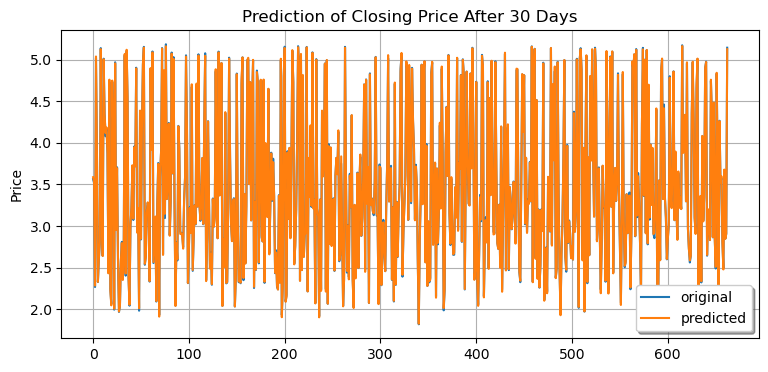

In [344]:
# visualizing in a plot
def plottingTheDifferenceBetweenPredictionAndActualValues(targetOutputVariable_Test, predictedOutputValues):
    x_ax = range(len(targetOutputVariable_Test))
    plt.figure(figsize=(9, 4))
    plt.plot(x_ax, targetOutputVariable_Test, label="original")
    plt.plot(x_ax, predictedOutputValues, label="predicted")
    plt.title("Prediction of Closing Price After 30 Days")
    
    plt.ylabel('Price')
    plt.legend(loc='best',fancybox=True, shadow=True)
    plt.grid(True)
    plt.show()

plottingTheDifferenceBetweenPredictionAndActualValues(targetOutputVariable_TestModel1_30Days, predicted_outputForModel1)

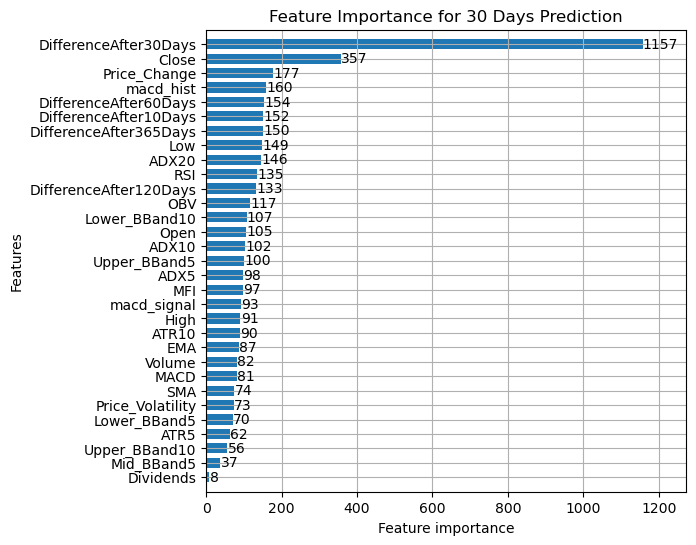

In [345]:
# plotting feature importance
def featureImportancePlot(model,title):
    fig, ax = plt.subplots(figsize=(8,6))
    lgb.plot_importance(model, ax=ax, height=.70)
    ax.set_title(title)
    # adjust the spacing between the y-axis and the left edge of the plot
    plt.subplots_adjust(left=0.3)
    plt.show()

featureImportancePlot(best_modelForModel1,'Feature Importance for 30 Days Prediction')

#### Loading the model and testing on recent data

In [346]:
def splittingTheDatasetOfTheUpdatedInfo(database,nameOfPredictedColumn,predictionDays):
    database = database.iloc[:-predictionDays]
    print(database)
    inputFeatureDatabase = database[['Open','High','Low','Close','Volume','Dividends','Stock Splits','Price Change','Price Volatility','SMA','EMA','ADX5','ADX10','ADX20',
                                     'ATR5','ATR10','RSI', 'Upper_BBand5','Mid_BBand5','Lower_BBand5','Upper_BBand10','Mid_BBand10','Lower_BBand10','MACD','macd_signal','macd_hist',
                                     'OBV','MFI', 'DifferenceAfter10Days','DifferenceAfter30Days','DifferenceAfter60Days','DifferenceAfter120Days','DifferenceAfter365Days']]

    targetOutputVariable = database[[nameOfPredictedColumn]]

    return inputFeatureDatabase, targetOutputVariable

def gettingRecentPredictions(filename,file_path1,predictionDays,predictDays,windowValue):

    #to load the model
    loadedModel1 = pickle.load(open(filename, 'rb'))

    #to predict the output

    #Reading all CSV files in a list
    df = pd.read_csv(file_path1)
    #print(appleDb.to_string()) - to view the original dataframe

    # Convert Date column to datetime object
    df['Date'] = pd.to_datetime(df['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

    # Filter rows based on condition - starting from the year 2008
    df = df[pd.to_datetime(df['Date']).dt.year >= 2008]
    df = changeValuesIntoLogs(df)
    df = obtainingExtraFeatures(df,windowValue)
    df = obtainRecentRecords(df)
    lastestInput, targetOutput = splittingTheDatasetOfTheUpdatedInfo(df,predictionDays,predictDays)

    # Create the LGBM Dataset
    lgb_dataset = lgb.Dataset(lastestInput, label=targetOutput)
    predictions = loadedModel1.predict(lastestInput)
    # Set NumPy print options to display the entire array
    np.set_printoptions(threshold=np.inf)

    # Print the predictions
    print(predictions)
    return predictions,df

def determineWorthOfInvestment(df,predictions,threshold):

    # Get the current close price
    current_close_price = df['Close'].iloc[-1]

    # Set the investment threshold (you can adjust this based on your strategy)
    print("Current close price:", current_close_price)
    print("Threshold:", threshold)
    print("Predicted close price:", predictions[-1])
    print ("Threshold",(current_close_price * (1 + threshold)))
    # Compare the predicted close price with the current close price
    if predictions[-1] > (current_close_price * (1 + threshold)):
        print("Invest in the stock.")
    else:
        print("Do not invest in the stock.")

predictions30Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter30Days',30,10)
predictions60Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter60Days',60,10)
predictions120Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter120Days',120,10)
predictions365Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter365Days',365,10)

                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.868518  1.873519  1.863586  1.871232   
7332  2010-01-05 05:00:00+00:00  1.873985  1.878588  1.867675  1.872960   
7333  2010-01-06 05:00:00+00:00  1.872959  1.876916  1.855882  1.856925   
7334  2010-01-07 05:00:00+00:00  1.860616  1.861796  1.847783  1.855075   
7335  2010-01-08 05:00:00+00:00  1.853744  1.861795  1.847830  1.861701   
...                         ...       ...       ...       ...       ...   
10663 2023-03-30 04:00:00+00:00  5.083309  5.089111  5.081698  5.088434   
10664 2023-03-31 04:00:00+00:00  5.088927  5.104563  5.085658  5.103957   
10665 2023-04-03 04:00:00+00:00  5.100129  5.112351  5.099825  5.111629   
10666 2023-04-04 04:00:00+00:00  5.114214  5.115653  5.105230  5.108374   
10667 2023-04-05 04:00:00+00:00  5.102986  5.104866  5.084979  5.097020   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

#### Stating whether to invest or not 

In [347]:
determineWorthOfInvestment(latestDataset,predictions30Days,0.01)
determineWorthOfInvestment(latestDataset,predictions60Days,0.01)
determineWorthOfInvestment(latestDataset,predictions120Days,0.05)
determineWorthOfInvestment(latestDataset,predictions365Days,0.05)

Current close price: 5.16507166483431
Threshold: 0.01
Predicted close price: 5.072432830938802
Threshold 5.216722381482652
Do not invest in the stock.
Current close price: 5.16507166483431
Threshold: 0.01
Predicted close price: 4.992880155221874
Threshold 5.216722381482652
Do not invest in the stock.
Current close price: 5.16507166483431
Threshold: 0.05
Predicted close price: 5.082496717590209
Threshold 5.423325248076026
Do not invest in the stock.
Current close price: 5.16507166483431
Threshold: 0.05
Predicted close price: 4.956030576722839
Threshold 5.423325248076026
Do not invest in the stock.


In [348]:
#if you have different models trained to predict stock prices for different time horizons (e.g., 10 days, 30 days, 60 days, 120 days, and 365 days), and you want to determine whether the user should invest based on the predictions from all these models, you can consider the following approach:

# Obtain the predictions for each time horizon using the respective models.
# python
# Copy code
# predictions_10_days = model_10_days.predict(input_10_days)
# predictions_30_days = model_30_days.predict(input_30_days)
# predictions_60_days = model_60_days.predict(input_60_days)
# predictions_120_days = model_120_days.predict(input_120_days)
# predictions_365_days = model_365_days.predict(input_365_days)
# Here, model_10_days, model_30_days, model_60_days, model_120_days, and model_365_days represent the trained models for their respective time horizons, and input_10_days, input_30_days, input_60_days, input_120_days, and input_365_days represent the input data for each model.

# Determine a rule or criterion to make an investment decision based on the predictions. This could involve setting a threshold or considering a combination of predictions from multiple models. For example, you could decide to invest if the majority of the models predict positive price movement.
# python
# Copy code
# investment_count = 0

# # Check predictions for each time horizon and increment investment_count if positive
# if predictions_10_days > current_price:
#     investment_count += 1
# if predictions_30_days > current_price:
#     investment_count += 1
# if predictions_60_days > current_price:
#     investment_count += 1
# if predictions_120_days > current_price:
#     investment_count += 1
# if predictions_365_days > current_price:
#     investment_count += 1

# # Determine whether to invest based on the investment_count
# if investment_count >= 3:
#     print("Invest in the stock.")
# else:
#     print("Do not invest in the stock.")




# Apologies for overlooking the model saving step. To ensure that you save the models trained for each dataframe, you can modify the previous example by adding the saving step within the loop. Here's an updated version:

# python
# Copy code
# import os
# import joblib

# # Create a directory to save the models
# models_dir = "saved_models"
# os.makedirs(models_dir, exist_ok=True)

# # Iterate over the list of dataframes
# for idx, dataframe in enumerate(dataframes):
#     # Train the model and make predictions
#     predictions = train_and_predict_model(dataframe)

#     # Save the model
#     model_filename = os.path.join(models_dir, f"model_{idx}.joblib")
#     joblib.dump(model, model_filename)

#     # Process the predictions as needed
# In this updated code, we introduce a directory called "saved_models" (you can adjust the name to your preference) where the models will be saved. The os.makedirs() function is used to create the directory if it doesn't already exist.

# Inside the loop, after training the model and generating predictions, the joblib.dump() function is used to save the trained model to a file. The model is saved with a unique filename, such as "model_0.joblib", "model_1.joblib", etc., based on the idx variable.

# Make sure to replace model in the joblib.dump() function with the actual trained model object that you want to save.

# By incorporating this modification, you can save the models for each dataframe within the loop, enabling you to use them for future predictions.




In [349]:
# # Assuming you have a list of dataframes 'dataframes' and a list of models 'models'

# # Define a dictionary to store investment scores
# investment_scores = {}

# # Iterate over dataframes and models
# for dataframe in dataframes:
#     for model in models:
#         # Make predictions for each stock
#         predictions = model.predict(dataframe)
        
#         # Calculate investment scores and update the dictionary
#         for i, stock in enumerate(dataframe['Stock']):
#             investment_scores.setdefault(stock, 0)
#             investment_scores[stock] += predictions[i]  # Adjust this based on your investment score criterion

# # Sort the investment scores in descending order
# sorted_scores = sorted(investment_scores.items(), key=lambda x: x[1], reverse=True)

# # Print the top 5 stocks to invest in
# print("Top 5 stocks to invest in:")
# for stock, score in sorted_scores[:5]:
#     print(stock)

# # Print the worst 5 stocks to avoid
# print("\nWorst 5 stocks to avoid:")
# for stock, score in sorted_scores[-5:]:
#     print(stock)

In [350]:
# To distinguish between the models when saving them for each dataframe, you can include information about the dataframe and the prediction horizon in the filename or the saved model object. Here's an example of how you can modify the code to save the models with distinctive names:

# python
# Copy code
# import os
# import joblib

# # Create a directory to save the models
# models_dir = "saved_models"
# os.makedirs(models_dir, exist_ok=True)

# # Iterate over the list of dataframes
# for idx, dataframe in enumerate(dataframes):
#     # Iterate over the prediction horizons
#     for prediction_horizon in [30, 60, 120, 365]:
#         # Train the model and make predictions
#         predictions = train_and_predict_model(dataframe, prediction_horizon)

#         # Save the model with a distinctive name
#         model_filename = os.path.join(models_dir, f"model_{idx}_horizon_{prediction_horizon}.joblib")
#         joblib.dump(model, model_filename)

#         # Process the predictions as needed
# In this modified code, we include an additional loop to iterate over the prediction horizons for each dataframe. Within this loop, you train the model and make predictions using the corresponding prediction horizon. The train_and_predict_model() function should be updated accordingly to handle the prediction horizon parameter.

# The models are saved with distinctive names by incorporating the idx variable (representing the dataframe index) and the prediction_horizon value in the filename. For example, the saved models could have filenames like "model_0_horizon_30.joblib", "model_0_horizon_60.joblib", and so on.

# By including the dataframe index and prediction horizon in the filenames, you can easily identify which model corresponds to which dataframe and prediction horizon when you need to load and use them in the future.